# - Predicting if the cancer diagnosis is benign or malignant based on several observations/features 


- 30 features are used, examples:
        - radius (mean of distances from center to points on the perimeter)
        - texture (standard deviation of gray-scale values)
        - perimeter
        - area
        - smoothness (local variation in radius lengths)
        - compactness (perimeter^2 / area - 1.0)
        - concavity (severity of concave portions of the contour)
        - concave points (number of concave portions of the contour)
        - symmetry 
        - fractal dimension ("coastline approximation" - 1)

- Datasets are linearly separable using all 30 input features
- Number of Instances: 569
- Class Distribution: 212 Malignant, 357 Benign
- Target class:
         - Malignant
         - Benign
         
         
<img src="https://encrypted-tbn0.gstatic.com/images?q=tbn%3AANd9GcQjuiDaPbVi3jtsh-uepYaqpN-iX3SuDAmiIg&usqp=CAU=" width=900 height=900 />



In [1]:
#conda install scikit-learn
#conda install tensorflow

In [2]:
#pip install seaborn

In [3]:
# import libraries
from sklearn.datasets import load_breast_cancer
import pandas as pd  # Import Pandas for data manipulation using dataframes
import numpy as np  # Import Numpy for data statistical analysis
import matplotlib.pyplot as plt  # Import matplotlib for data visualisation
import seaborn as sns  # Statistical data visualization
# %matplotlib inline

# Import Cancer data drom the Sklearn library



In [4]:
data = pd.read_csv("BreastCancerDetection.csv")

# VISUALIZING THE DATA

In [5]:
data

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,...,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,...,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,...,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,...,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,...,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,926424,M,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,...,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115,NaN
565,926682,M,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,...,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637,NaN
566,926954,M,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,...,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820,NaN
567,927241,M,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,...,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400,NaN


In [6]:
data.describe()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
count,5.690000e+02,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,0.0
mean,3.037183e+07,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,...,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946,NaN
std,1.250206e+08,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,...,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061,NaN
min,8.670000e+03,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,...,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040,NaN
25%,8.692180e+05,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,...,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460,NaN
50%,9.060240e+05,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,...,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040,NaN
75%,8.813129e+06,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,...,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080,NaN
max,9.113205e+08,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,...,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500,NaN


In [7]:

# data2=data.iloc[:,1:-1]
# chart = sns.boxplot(x="variable", y="value", data=pd.melt(data))
# chart.set_xticklabels(chart.get_xticklabels(), rotation=45)

In [8]:
#remove the last column - Unnamed: 32
data =data.iloc[:,:-1]
#remove the first column - ID
data =data.iloc[:,1:]

In [9]:
data.keys()

Index(['diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')

In [10]:
data["diagnosis"]

0      M
1      M
2      M
3      M
4      M
      ..
564    M
565    M
566    M
567    M
568    B
Name: diagnosis, Length: 569, dtype: object

In [11]:
data["diagnosis"].value_counts()


B    357
M    212
Name: diagnosis, dtype: int64

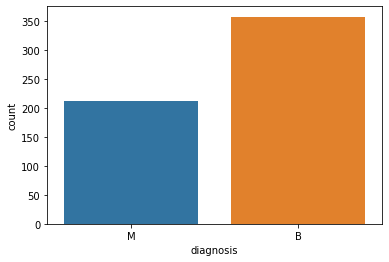

In [12]:
sns.countplot(data['diagnosis'], label = "Count") 

In [13]:
# sns.pairplot(data, hue = 'diagnosis', vars = ['radius_mean', 'texture_mean', 'perimeter_mean',
#        'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
#        'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
#        'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
#        'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
#        'fractal_dimension_se', 'radius_worst', 'texture_worst',
#        'perimeter_worst', 'area_worst', 'smoothness_worst',
#        'compactness_worst', 'concavity_worst', 'concave points_worst',
#        'symmetry_worst', 'fractal_dimension_worst'] )

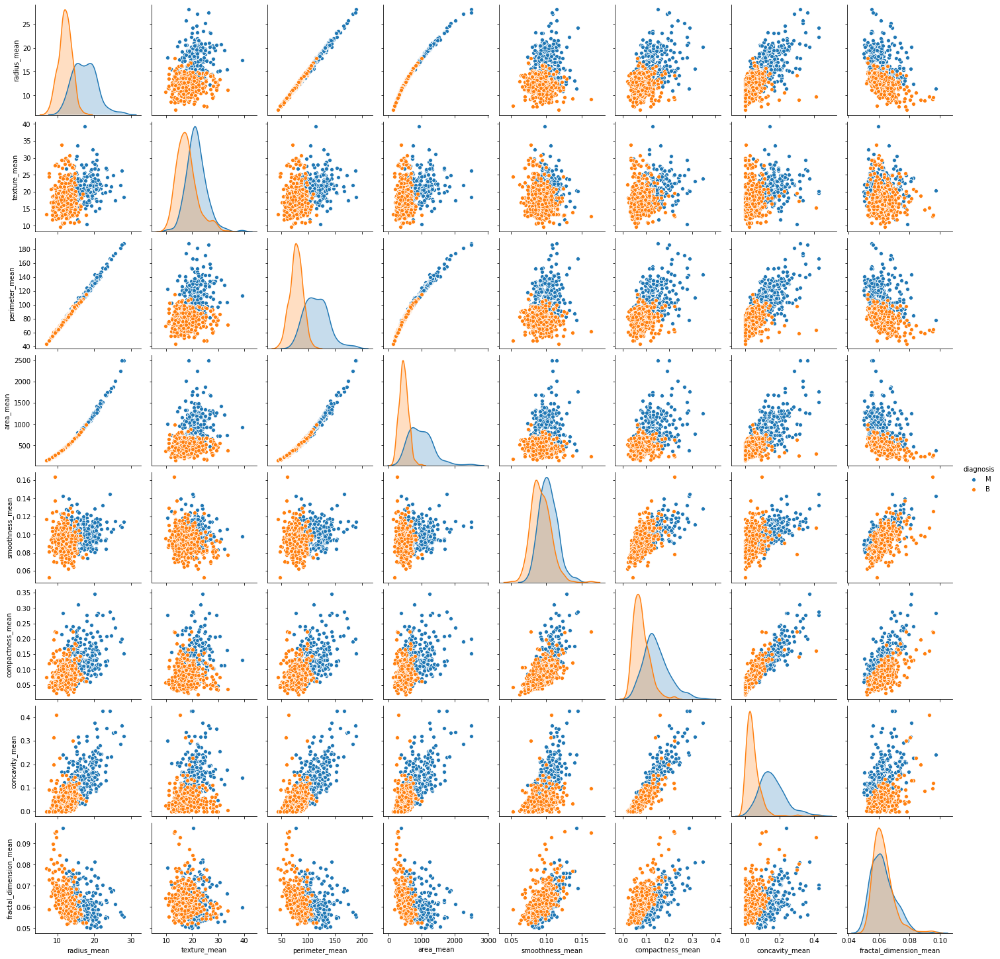

In [14]:
sns.pairplot(data, hue = 'diagnosis', vars = ['radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'fractal_dimension_mean',] )

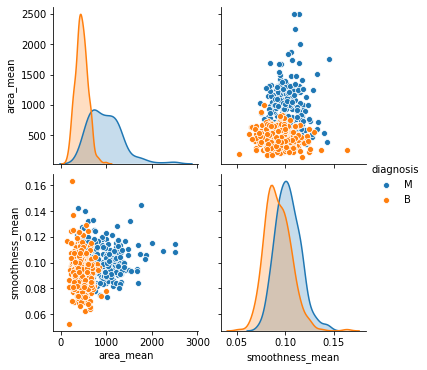

In [15]:
sns.pairplot(data, hue = 'diagnosis', vars = [
       'area_mean', 'smoothness_mean', ] )

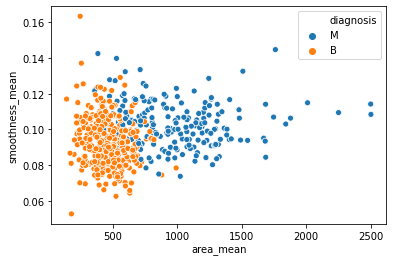

In [16]:

sns.scatterplot(x = 'area_mean', y = 'smoothness_mean', hue = 'diagnosis', data = data)

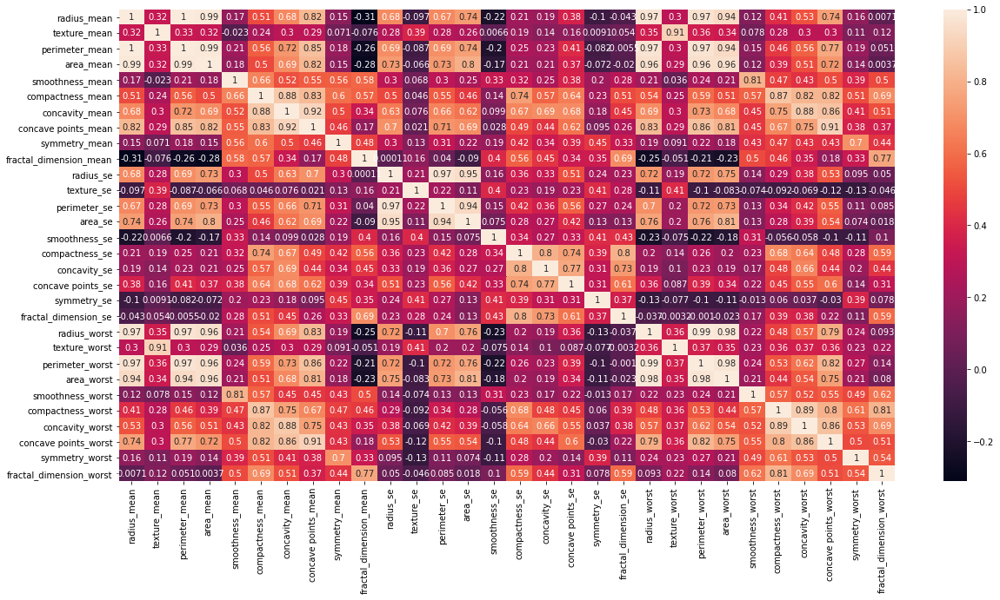

In [17]:
# Let's check the correlation between the variables 
# Strong correlation between the mean radius and mean perimeter, mean area and mean primeter
plt.figure(figsize=(20,10)) 
sns.heatmap(data.corr(), annot=True) 

# MODEL TRAINING

In [18]:
# Let's drop the diagnosis label coloumns
X = data.drop(['diagnosis'],axis=1)

In [19]:
X

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


In [20]:
y = data['diagnosis']
y

0      M
1      M
2      M
3      M
4      M
      ..
564    M
565    M
566    M
567    M
568    B
Name: diagnosis, Length: 569, dtype: object

In [21]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state=5)

In [22]:
X_train.shape

(426, 30)

In [23]:
X_test.shape

(143, 30)

In [24]:
y_train.shape

(426,)

In [25]:
y_test.shape

(143,)

# USING SVM

In [26]:
from sklearn.svm import SVC 
from sklearn.metrics import classification_report, confusion_matrix

svc_model = SVC()
svc_model.fit(X_train, y_train)

SVC()

# EVALUATING THE MODEL

In [27]:
y_predict = svc_model.predict(X_test)
cm = confusion_matrix(y_test, y_predict)

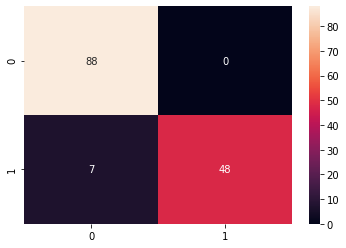

In [28]:
sns.heatmap(cm, annot=True)

In [29]:
print(classification_report(y_test, y_predict))

              precision    recall  f1-score   support

           B       0.93      1.00      0.96        88
           M       1.00      0.87      0.93        55

    accuracy                           0.95       143
   macro avg       0.96      0.94      0.95       143
weighted avg       0.95      0.95      0.95       143



# IMPROVING THE MODEL

In [30]:
min_train = X_train.min()
min_train
range_train = (X_train - min_train).max()
range_train

radius_mean                  20.239000
texture_mean                 29.570000
perimeter_mean              138.310000
area_mean                  2106.500000
smoothness_mean               0.110770
compactness_mean              0.326020
concavity_mean                0.426800
concave points_mean           0.201200
symmetry_mean                 0.198000
fractal_dimension_mean        0.045790
radius_se                     1.394600
texture_se                    4.522900
perimeter_se                  9.293000
area_se                     226.198000
smoothness_se                 0.029417
compactness_se                0.133148
concavity_se                  0.396000
concave points_se             0.052790
symmetry_se                   0.071068
fractal_dimension_se          0.028872
radius_worst                 25.190000
texture_worst                37.520000
perimeter_worst             170.390000
area_worst                 3246.800000
smoothness_worst              0.129430
compactness_worst        

In [31]:
X_train_scaled = (X_train - min_train)/range_train

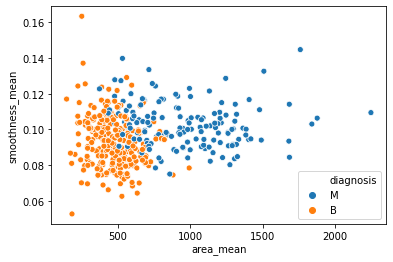

In [32]:
sns.scatterplot(x = X_train['area_mean'], y = X_train['smoothness_mean'], hue = y_train)

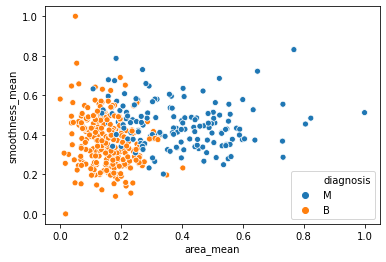

In [33]:
sns.scatterplot(x = X_train_scaled['area_mean'], y = X_train_scaled['smoothness_mean'], hue = y_train)

In [34]:
min_test = X_test.min()
range_test = (X_test - min_test).max()
X_test_scaled = (X_test - min_test)/range_test

In [35]:
from sklearn.svm import SVC 
from sklearn.metrics import classification_report, confusion_matrix

svc_model = SVC()
svc_model.fit(X_train_scaled, y_train)

SVC()

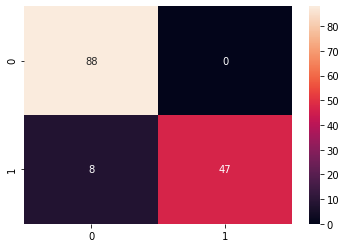

In [36]:
y_predict = svc_model.predict(X_test_scaled)
cm = confusion_matrix(y_test, y_predict)

sns.heatmap(cm,annot=True,fmt="d")

In [37]:
print(classification_report(y_test,y_predict))

              precision    recall  f1-score   support

           B       0.92      1.00      0.96        88
           M       1.00      0.85      0.92        55

    accuracy                           0.94       143
   macro avg       0.96      0.93      0.94       143
weighted avg       0.95      0.94      0.94       143



# Improving VERSION 2

In [38]:
param_grid = {'C': [0.1, 1, 10, 100], 'gamma': [1, 0.1, 0.01, 0.001], 'kernel': ['rbf']} 

In [39]:
from sklearn.model_selection import GridSearchCV

In [40]:
grid = GridSearchCV(SVC(),param_grid,refit=True,verbose=4)

In [41]:
grid.fit(X_train_scaled,y_train)

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.977, total=   0.0s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.918, total=   0.0s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.906, total=   0.0s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.965, total=   0.0s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.929, total=   0.0s
[CV] C=0.1, gamma=0.1, kernel=rbf ....................................
[CV] ........ C=0.1, gamma=0.1, kernel=rbf, score=0.953, total=   0.0s
[CV] C=0.1, gamma=0.1, kernel=rbf ....................................
[CV] ........ C=

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s


[CV] ............ C=1, gamma=1, kernel=rbf, score=0.953, total=   0.0s
[CV] C=1, gamma=0.1, kernel=rbf ......................................
[CV] .......... C=1, gamma=0.1, kernel=rbf, score=1.000, total=   0.0s
[CV] C=1, gamma=0.1, kernel=rbf ......................................
[CV] .......... C=1, gamma=0.1, kernel=rbf, score=0.918, total=   0.0s
[CV] C=1, gamma=0.1, kernel=rbf ......................................
[CV] .......... C=1, gamma=0.1, kernel=rbf, score=0.929, total=   0.0s
[CV] C=1, gamma=0.1, kernel=rbf ......................................
[CV] .......... C=1, gamma=0.1, kernel=rbf, score=0.988, total=   0.0s
[CV] C=1, gamma=0.1, kernel=rbf ......................................
[CV] .......... C=1, gamma=0.1, kernel=rbf, score=0.918, total=   0.0s
[CV] C=1, gamma=0.01, kernel=rbf .....................................
[CV] ......... C=1, gamma=0.01, kernel=rbf, score=0.953, total=   0.0s
[CV] C=1, gamma=0.01, kernel=rbf .....................................
[CV] .

[Parallel(n_jobs=1)]: Done  80 out of  80 | elapsed:    0.6s finished


GridSearchCV(estimator=SVC(),
             param_grid={'C': [0.1, 1, 10, 100], 'gamma': [1, 0.1, 0.01, 0.001],
                         'kernel': ['rbf']},
             verbose=4)

In [42]:
grid.best_params_

{'C': 1, 'gamma': 1, 'kernel': 'rbf'}

In [43]:
grid.best_estimator_

SVC(C=1, gamma=1)

In [44]:
grid_predictions = grid.predict(X_test_scaled)

In [45]:
cm = confusion_matrix(y_test, grid_predictions)

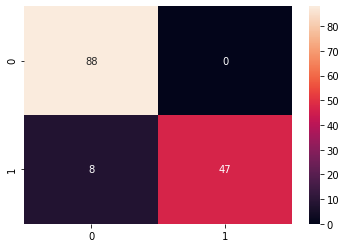

In [46]:
sns.heatmap(cm, annot=True)

In [47]:
print(classification_report(y_test,grid_predictions))

              precision    recall  f1-score   support

           B       0.92      1.00      0.96        88
           M       1.00      0.85      0.92        55

    accuracy                           0.94       143
   macro avg       0.96      0.93      0.94       143
weighted avg       0.95      0.94      0.94       143



# KNN


In [48]:
# Import train_test_split from scikit library
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25)

In [49]:
# Fitting K-NN to the Training set
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, confusion_matrix

classifier = KNeighborsClassifier(n_neighbors = 5, metric = 'minkowski', p = 2)
classifier.fit(X_train, y_train)

KNeighborsClassifier()

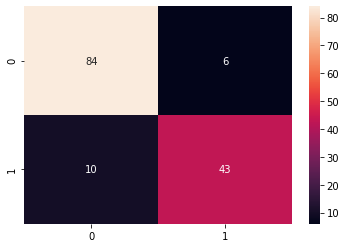

In [50]:
y_predict = classifier.predict(X_test)
cm = confusion_matrix(y_test, y_predict)
sns.heatmap(cm, annot=True, fmt="d")

In [51]:
print(classification_report(y_test, y_predict))

              precision    recall  f1-score   support

           B       0.89      0.93      0.91        90
           M       0.88      0.81      0.84        53

    accuracy                           0.89       143
   macro avg       0.89      0.87      0.88       143
weighted avg       0.89      0.89      0.89       143



# decision_tree

In [52]:
from sklearn.tree import DecisionTreeClassifier
decision_tree = DecisionTreeClassifier()
decision_tree.fit(X_train,y_train)

DecisionTreeClassifier()

In [53]:
feature_importances = pd.DataFrame(decision_tree.feature_importances_,
                                   index = X_train.columns,
                                    columns=['importance']).sort_values('importance',ascending=False)

In [54]:
feature_importances

,importance
area_worst,0.730549
concave points_worst,0.115564
texture_mean,0.032420
concavity_mean,0.025226
area_mean,0.022200
texture_worst,0.021011
smoothness_worst,0.020913
concavity_se,0.009579
radius_worst,0.008322
fractal_dimension_se,0.007526


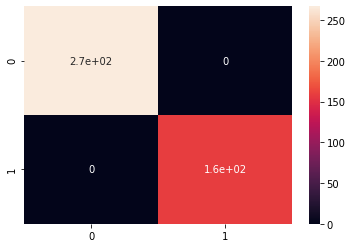

In [55]:
from sklearn.metrics import classification_report, confusion_matrix

y_predict_train = decision_tree.predict(X_train)
y_predict_train
cm = confusion_matrix(y_train, y_predict_train)
sns.heatmap(cm, annot=True)

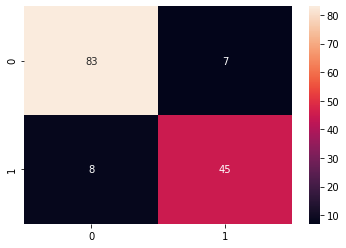

In [56]:
# Predicting the Test set results
y_predict_test = decision_tree.predict(X_test)
cm = confusion_matrix(y_test, y_predict_test)
sns.heatmap(cm, annot=True)

In [57]:
print(classification_report(y_test, y_predict_test))

              precision    recall  f1-score   support

           B       0.91      0.92      0.92        90
           M       0.87      0.85      0.86        53

    accuracy                           0.90       143
   macro avg       0.89      0.89      0.89       143
weighted avg       0.89      0.90      0.89       143



In [58]:
from sklearn.ensemble import RandomForestClassifier
RandomForest = RandomForestClassifier(n_estimators=150)
RandomForest.fit(X_train, y_train)

RandomForestClassifier(n_estimators=150)

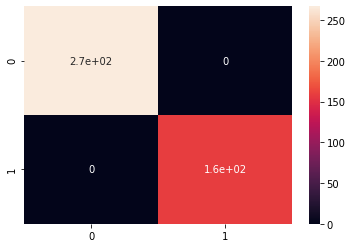

In [59]:
y_predict_train = RandomForest.predict(X_train)
y_predict_train
cm = confusion_matrix(y_train, y_predict_train)
sns.heatmap(cm, annot=True)

In [60]:
print(classification_report(y_train, y_predict_train))

              precision    recall  f1-score   support

           B       1.00      1.00      1.00       267
           M       1.00      1.00      1.00       159

    accuracy                           1.00       426
   macro avg       1.00      1.00      1.00       426
weighted avg       1.00      1.00      1.00       426



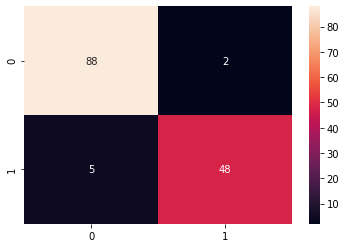

In [61]:
# Predicting the Test set results
y_predict_test = RandomForest.predict(X_test)
cm = confusion_matrix(y_test, y_predict_test)
sns.heatmap(cm, annot=True)

In [62]:
print(classification_report(y_test, y_predict_test))

              precision    recall  f1-score   support

           B       0.95      0.98      0.96        90
           M       0.96      0.91      0.93        53

    accuracy                           0.95       143
   macro avg       0.95      0.94      0.95       143
weighted avg       0.95      0.95      0.95       143



 ## Naive Bayes

In [63]:
from sklearn.preprocessing import StandardScaler
data['diagnosis'] = data['diagnosis'].map({'M':1,'B':0})


In [64]:
data

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,1,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,1,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,1,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,1,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


In [65]:
# Let's drop the target label coloumns
X = data.drop(['diagnosis'],axis=1)
y = data['diagnosis']


In [66]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

In [67]:
y_test

387    0
69     0
525    0
470    0
31     1
      ..
296    0
125    0
204    0
162    1
215    1
Name: diagnosis, Length: 114, dtype: int64

In [68]:
from sklearn.naive_bayes import GaussianNB 
NB_classifier = GaussianNB()
NB_classifier.fit(X_train, y_train)

GaussianNB()

In [69]:
from sklearn.metrics import classification_report, confusion_matrix

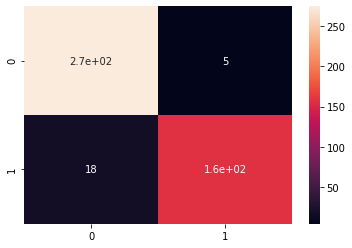

In [70]:
y_predict_train = NB_classifier.predict(X_train)
y_predict_train
cm = confusion_matrix(y_train, y_predict_train)
sns.heatmap(cm, annot=True)

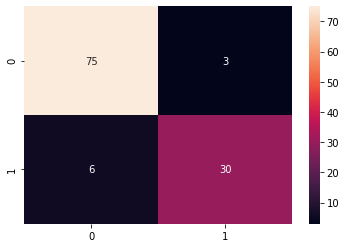

In [71]:
# Predicting the Test set results
y_predict_test = NB_classifier.predict(X_test)
cm = confusion_matrix(y_test, y_predict_test)
sns.heatmap(cm, annot=True)

In [72]:
print(classification_report(y_test, y_predict_test))

              precision    recall  f1-score   support

           0       0.93      0.96      0.94        78
           1       0.91      0.83      0.87        36

    accuracy                           0.92       114
   macro avg       0.92      0.90      0.91       114
weighted avg       0.92      0.92      0.92       114



In [73]:
print("", sum(y_test)) #t_test=114

 36


In [74]:
y_predict_test

array([0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1,
       0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1,
       0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0,
       0, 0, 1, 0])

In [75]:
y_test

387    0
69     0
525    0
470    0
31     1
      ..
296    0
125    0
204    0
162    1
215    1
Name: diagnosis, Length: 114, dtype: int64

# Logistic Regression

In [76]:
# Feature Scaling
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X = sc.fit_transform(X)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)
# Fitting Logistic Regression to the Training set
from sklearn.linear_model import LogisticRegression
classifier = LogisticRegression(random_state = 0)
classifier.fit(X_train, y_train)

LogisticRegression(random_state=0)

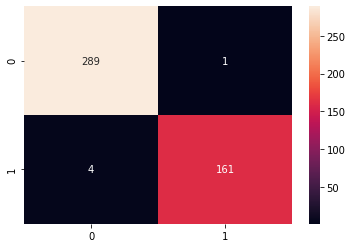

In [77]:
y_predict_train = classifier.predict(X_train)
from sklearn.metrics import classification_report, confusion_matrix
cm = confusion_matrix(y_train, y_predict_train)
sns.heatmap(cm, annot=True, fmt="d")

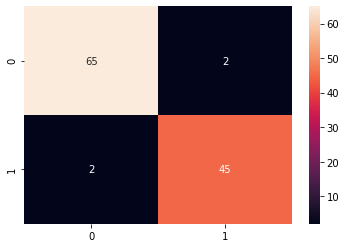

In [78]:
y_predict_test = classifier.predict(X_test)
cm = confusion_matrix(y_test, y_predict_test)
sns.heatmap(cm, annot=True, fmt="d")

In [79]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_predict_test))

              precision    recall  f1-score   support

           0       0.97      0.97      0.97        67
           1       0.96      0.96      0.96        47

    accuracy                           0.96       114
   macro avg       0.96      0.96      0.96       114
weighted avg       0.96      0.96      0.96       114



# Gabriella


In [80]:
data2 =data.iloc[:,1:-1]
data2

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,...,0.006193,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,...,0.003532,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,...,0.004571,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,...,0.009208,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,...,0.005115,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,...,0.004239,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060
565,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,...,0.002498,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572
566,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,...,0.003892,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218
567,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,...,0.006185,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087


In [81]:
from scipy.stats import zscore

# z = np.abs(zscore(data.iloc[:,1:]))

# print(np.where(z > 3))

# SVC

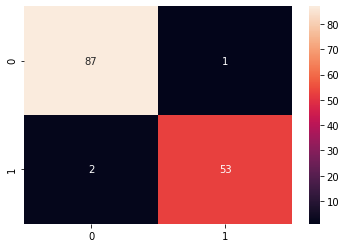

In [82]:
X = data.drop(['diagnosis'],axis=1)
y = data['diagnosis']
X_standard = X.apply(zscore)

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_standard, y, test_size = 0.25, random_state=5)

from sklearn.svm import SVC 
from sklearn.metrics import classification_report, confusion_matrix

# Define model
svc_model = SVC()

# Fit model
svc_model.fit(X_train, y_train)

#check prediction
y_predict = svc_model.predict(X_test)
cm = confusion_matrix(y_test, y_predict)

sns.heatmap(cm,annot=True,fmt="d")


In [83]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_predict))

              precision    recall  f1-score   support

           0       0.98      0.99      0.98        88
           1       0.98      0.96      0.97        55

    accuracy                           0.98       143
   macro avg       0.98      0.98      0.98       143
weighted avg       0.98      0.98      0.98       143



# DecisionTree

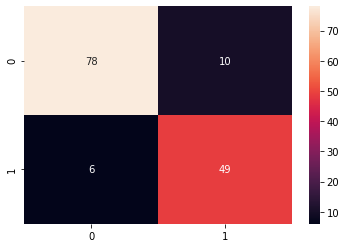

In [84]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, confusion_matrix


# Define model. Specify a number for random_state to ensure same results each run
try_model = DecisionTreeClassifier(random_state=1)

# Fit model
try_model.fit(X_train, y_train)

#check prediction
y_predict = try_model.predict(X_test)
cm = confusion_matrix(y_test, y_predict)
sns.heatmap(cm, annot=True)

In [85]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_predict))

              precision    recall  f1-score   support

           0       0.93      0.89      0.91        88
           1       0.83      0.89      0.86        55

    accuracy                           0.89       143
   macro avg       0.88      0.89      0.88       143
weighted avg       0.89      0.89      0.89       143



# Extra Tree Clastifier

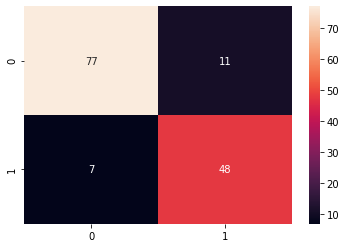

In [86]:
from sklearn.tree import ExtraTreeClassifier
from sklearn.metrics import classification_report, confusion_matrix


# Define model. Specify a number for random_state to ensure same results each run
try_model = ExtraTreeClassifier(random_state=1)

# Fit model
try_model.fit(X_train, y_train)

#check prediction
y_predict = try_model.predict(X_test)
cm = confusion_matrix(y_test, y_predict)

sns.heatmap(cm, annot=True)



In [87]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_predict))

              precision    recall  f1-score   support

           0       0.92      0.88      0.90        88
           1       0.81      0.87      0.84        55

    accuracy                           0.87       143
   macro avg       0.87      0.87      0.87       143
weighted avg       0.88      0.87      0.87       143



# neural network multi layer perspetron

/Users/user/.conda/envs/soldgame/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:585: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


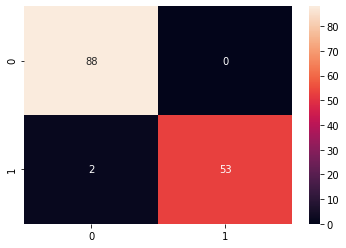

In [88]:
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import classification_report, confusion_matrix


# Define model. Specify a number for random_state to ensure same results each run
try_model = MLPClassifier()

# Fit model
try_model.fit(X_train, y_train)

#check prediction
y_predict = try_model.predict(X_test)
cm = confusion_matrix(y_test, y_predict)

sns.heatmap(cm, annot=True)

In [89]:
from sklearn.metrics import classification_report

print(classification_report(y_test, y_predict))

              precision    recall  f1-score   support

           0       0.98      1.00      0.99        88
           1       1.00      0.96      0.98        55

    accuracy                           0.99       143
   macro avg       0.99      0.98      0.99       143
weighted avg       0.99      0.99      0.99       143



# Keras and Tenserflow

# bernuli&linear regression

[BernoulliRBM] Iteration 1, pseudo-likelihood = -49.40, time = 0.01s
[BernoulliRBM] Iteration 2, pseudo-likelihood = -91.37, time = 0.01s
[BernoulliRBM] Iteration 3, pseudo-likelihood = -132.69, time = 0.01s
[BernoulliRBM] Iteration 4, pseudo-likelihood = -173.86, time = 0.01s
[BernoulliRBM] Iteration 5, pseudo-likelihood = -215.13, time = 0.01s
[BernoulliRBM] Iteration 6, pseudo-likelihood = -256.53, time = 0.01s
[BernoulliRBM] Iteration 7, pseudo-likelihood = -298.03, time = 0.01s
[BernoulliRBM] Iteration 8, pseudo-likelihood = -339.61, time = 0.01s
[BernoulliRBM] Iteration 9, pseudo-likelihood = -381.24, time = 0.01s
[BernoulliRBM] Iteration 10, pseudo-likelihood = -422.90, time = 0.01s
Logistic regression using RBM features:
              precision    recall  f1-score   support

           0       0.95      0.89      0.92        88
           1       0.84      0.93      0.88        55

    accuracy                           0.90       143
   macro avg       0.89      0.91      0.90

'The accuracy is 0.90     The f1_score is 0.90'

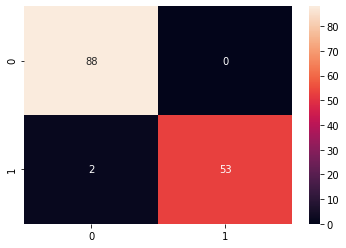

In [90]:
from sklearn.neural_network import BernoulliRBM
from sklearn.metrics import classification_report, confusion_matrix
from sklearn import linear_model, datasets, metrics
from sklearn.model_selection import train_test_split
from sklearn.neural_network import BernoulliRBM
from sklearn.pipeline import Pipeline
from sklearn.base import clone


# Define model. Specify a number for random_state to ensure same results each run
logistic = linear_model.LogisticRegression(solver='newton-cg', tol=1)
rbm = BernoulliRBM(random_state=0, verbose=True)

rbm_features_classifier = Pipeline(
    steps=[('rbm', rbm), ('logistic', logistic)])

# Hyper-parameters. These were set by cross-validation,
# using a GridSearchCV. Here we are not performing cross-validation to
# save time.
rbm.learning_rate = 0.06
rbm.n_iter = 10
# More components tend to give better prediction performance, but larger
# fitting time
rbm.n_components = 100
logistic.C = 6000

# Fit model
rbm_features_classifier.fit(X_train, y_train)

#check prediction
y_predict = rbm_features_classifier.predict(X_test)
print("Logistic regression using RBM features:\n%s\n" % (
    metrics.classification_report(y_test, y_predict)))


sns.heatmap(cm, annot=True)

#accuracy and f1
from sklearn.metrics import accuracy_score, classification_report, f1_score
acc = accuracy_score(y_test, y_predict)
f1 = f1_score(y_test, y_predict, average='macro')
f'The accuracy is %.2f     The f1_score is %.2f' % (acc,f1)

In [1]:
x_standard = X.apply(zscore)
x_standard.describe()
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x_standard, y, test_size=0.3, random_state=1)
x_test, x_val, y_test, y_val = train_test_split(x_test, y_test, test_size=0.7, random_state=1)

NameError: name 'X' is not defined

In [2]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.regularizers import l2
def baseline_model(units1, units2, dropout):
    model = Sequential()
    model.add(Dense(units1, input_shape=(30,), activation='relu'))
    model.add(Dropout(dropout))
    model.add(BatchNormalization(axis=1))
    model.add(Dense(units2, activation='relu', <img src="subdirectory/MyImage.png" width=60 height=60 />
=l2(0.01), kernel_regularizer=l2(0.01)))
    model.add(Dropout(dropout))
    model.add(BatchNormalization(axis=1))
    model.add(Dense(1, activation='sigmoid'))
    
    
    
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    model.summary()

    return model

SyntaxError: invalid syntax (<ipython-input-2-014530a1f9a7>, line 9)

In [252]:
#stop the training if arriving to good results
from keras.callbacks import EarlyStopping
es = EarlyStopping(monitor='val_loss', min_delta=0.001, patience=5, verbose=1, mode='auto')

In [253]:
units1 = 128
units2 = 128
dropout = 0.25
 
# Fit the model
model = baseline_model(units1, units2, dropout)

history = model.fit(x_train, y_train, 
                    batch_size=32, 
                    epochs=50, 
                    validation_data=(x_val,y_val), 
                    callbacks=[es])

Model: "sequential_5636"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_16903 (Dense)          (None, 128)               3968      
_________________________________________________________________
dropout_11270 (Dropout)      (None, 128)               0         
_________________________________________________________________
batch_normalization_11270 (B (None, 128)               512       
_________________________________________________________________
dense_16904 (Dense)          (None, 128)               16512     
_________________________________________________________________
dropout_11271 (Dropout)      (None, 128)               0         
_________________________________________________________________
batch_normalization_11271 (B (None, 128)               512       
_________________________________________________________________
dense_16905 (Dense)          (None, 1)             

In [254]:
# model.compile(
#     optimizer='rmsprop',
#     loss='categorical_crossentropy',
#     metrics=['accuracy']
# )

#model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [255]:
loss, acc = model.evaluate(x_train, y_train)
loss, acc = model.evaluate(x_val, y_val)
loss, acc = model.evaluate(x_test, y_test)


2/2 [==============================] - 0s 7ms/step - loss: 0.2181 - accuracy: 0.9608


Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
The accuracy is: 0.96
f1 score : 0.95 


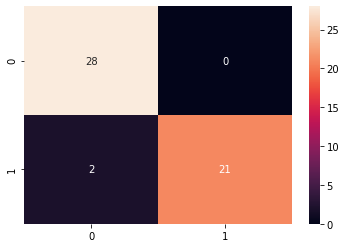

In [256]:

from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, f1_score
y_pred = model.predict(x_test)
y_pred = np.array([0 if n <= .5 else 1 for n in y_pred])
cm= confusion_matrix(y_test, y_pred)

sns.heatmap(cm,annot=True,fmt="d")
acc = accuracy_score(y_test, y_pred)
print('The accuracy is: %.2f' % acc)
print('f1 score : %.2f '% f1_score(y_test, y_pred))

In [257]:
from sklearn.metrics import classification_report

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.93      1.00      0.97        28
           1       1.00      0.91      0.95        23

    accuracy                           0.96        51
   macro avg       0.97      0.96      0.96        51
weighted avg       0.96      0.96      0.96        51



# Copy From Udemy Course

In [271]:
x_standard = X.apply(zscore)
x_standard.describe()
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x_standard, y, test_size=0.3, random_state=1)
print(x_train.shape)
print(y_train.shape)

(398, 30)
(398,)


In [272]:
import keras
from keras.models import Sequential
from keras.layers import Dense

# Initialising the ANN
classifier = Sequential()

# Adding the input layer and the first hidden layer
#units = (30+1)/2
# result is binary - 1
#X_train shape is (6000,11) 
classifier.add(Dense(units = 15, kernel_initializer = 'uniform', activation = 'relu', input_dim = 30))

# Adding the second hidden layer
classifier.add(Dense(units = 15, kernel_initializer = 'uniform', activation = 'relu'))

# Adding the output layer
classifier.add(Dense(units = 1, kernel_initializer = 'uniform', activation = 'sigmoid'))

# Compiling the ANN
classifier.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy'])

# Fitting the ANN to the Training set
classifier.fit(x_train, y_train, batch_size = 32, epochs = 100)

# Part 3 - Making the predictions and evaluating the model

# Predicting the Test set results
y_pred = classifier.predict(X_test)
y_pred = (y_pred > 0.5)

# Making the Confusion Matrix
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred)



Epoch 1/100
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 0s 22ms/step - loss: 0.6918 - accuracy: 0.7407
Epoch 2/100
13/13 [==============================] - 0s 865us/step - loss: 0.6834 - accuracy: 0.9067
Epoch 3/100
13/13 [==============================] - 0s 813us/step - loss: 0.6616 - accuracy: 0.9400
Epoch 4/100
13/13 [==============================] - 0s 753us/step - loss: 0

In [273]:
from sklearn.metrics import classification_report

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.96      0.96      0.96       108
           1       0.94      0.94      0.94        63

    accuracy                           0.95       171
   macro avg       0.95      0.95      0.95       171
weighted avg       0.95      0.95      0.95       171



# Loop get best results 

In [258]:
#def baseline_model(units1, units2, dropout):

best_i=1
best_j=1
best_d=1
best_loss=1.0
best_acc=0.0

for i in range(1,128):
    for j in range(1,128):
        for d in range(1,100,5):
            model= baseline_model(i, j, d/100)
            history = model.fit(x_train, y_train, 
                    batch_size=32, 
                    epochs=50, 
                    validation_data=(x_val,y_val), 
                    callbacks=[es])
            
#            
            loss, acc = model.evaluate(x_test, y_test)
            
            if(best_loss>loss and best_acc<acc):
                best_loss=loss 
                best_acc=acc
                best_i=i
                best_j=j
                best_d=d
                print("-----------------------------------------------new score")
                print('The accuracy is: %.2f loss is  %.2f ' %(acc,loss)) 
            

Model: "sequential_5637"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_16906 (Dense)          (None, 1)                 31        
_________________________________________________________________
dropout_11272 (Dropout)      (None, 1)                 0         
_________________________________________________________________
batch_normalization_11272 (B (None, 1)                 4         
_________________________________________________________________
dense_16907 (Dense)          (None, 1)                 2         
_________________________________________________________________
dropout_11273 (Dropout)      (None, 1)                 0         
_________________________________________________________________
batch_normalization_11273 (B (None, 1)                 4         
_________________________________________________________________
dense_16908 (Dense)          (None, 1)             

13/13 [==============================] - 0s 2ms/step - loss: 0.4900 - accuracy: 0.8115 - val_loss: 0.5180 - val_accuracy: 0.9000
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4460 - accuracy: 0.8719 - val_loss: 0.5063 - val_accuracy: 0.9000
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4456 - accuracy: 0.8585 - val_loss: 0.4937 - val_accuracy: 0.9000
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4357 - accuracy: 0.8641 - val_loss: 0.4831 - val_accuracy: 0.9000
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4463 - accuracy: 0.8586 - val_loss: 0.4735 - val_accuracy: 0.9083
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4137 - accuracy: 0.8738 - val_loss: 0.4614 - val_accuracy: 0.9083
Epoch 26/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4519 - accuracy: 0.8429 - val_loss: 0.4475 - val_accuracy: 0.9167
Epoch 27/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.7224 - accuracy: 0.5614 - val_loss: 0.6701 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6802 - accuracy: 0.6120 - val_loss: 0.6605 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6601 - accuracy: 0.6324 - val_loss: 0.6467 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6505 - accuracy: 0.6612 - val_loss: 0.6350 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5994 - accuracy: 0.7233 - val_loss: 0.6221 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5921 - accuracy: 0.7315 - val_loss: 0.6117 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5647 - accuracy: 0.7491 - val_loss: 0.6012 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==========

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.9789 - accuracy: 0.1250WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4924af5f0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6563 - accuracy: 0.6369 - val_loss: 0.6422 - val_accuracy: 0.6667
Epoch 00049: early stopping
2/2 [==============================] - 0s 7ms/step - loss: 0.6974 - accuracy: 0.5490
Model: "sequential_5641"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_16918 (Dense)          (None, 1)                 31        
_________________________________________________________________
dropout_11280 (Dropout)      (None, 1)                 0         
_________________________________________________________________
batch_normalization_11280 (B (None, 1)                 4         
_________________________________________________________________
dense_16919 (Dense)          (None, 1)                 2         
_________________________________________________________________
dropout_11281 (Dropout)      (None, 1)                 0     

Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4748 - accuracy: 0.8084 - val_loss: 0.4333 - val_accuracy: 0.8583
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4969 - accuracy: 0.7876 - val_loss: 0.4310 - val_accuracy: 0.8667
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4981 - accuracy: 0.7810 - val_loss: 0.4274 - val_accuracy: 0.8583
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4480 - accuracy: 0.8232 - val_loss: 0.4241 - val_accuracy: 0.8583
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4655 - accuracy: 0.8138 - val_loss: 0.4208 - val_accuracy: 0.8667
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4612 - accuracy: 0.8166 - val_loss: 0.4179 - val_accuracy: 0.8667
Epoch 41/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4429 - accuracy: 0.8292 - val_loss: 0.4155 - val_accuracy: 0.8667
Epoch 42/50
1

Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6145 - accuracy: 0.6587 - val_loss: 0.6176 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5761 - accuracy: 0.7146 - val_loss: 0.6111 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5549 - accuracy: 0.7240 - val_loss: 0.6068 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5490 - accuracy: 0.7443 - val_loss: 0.5951 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5593 - accuracy: 0.7097 - val_loss: 0.5889 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5630 - accuracy: 0.7206 - val_loss: 0.5825 - val_accuracy: 0.6667
Epoch 26/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6009 - accuracy: 0.6588 - val_loss: 0.5783 - val_accuracy: 0.6667
Epoch 27/50
1

Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7041 - accuracy: 0.6845 - val_loss: 0.6225 - val_accuracy: 0.7917
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6309 - accuracy: 0.7206 - val_loss: 0.6095 - val_accuracy: 0.8083
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6309 - accuracy: 0.7459 - val_loss: 0.5981 - val_accuracy: 0.8417
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6270 - accuracy: 0.7187 - val_loss: 0.5893 - val_accuracy: 0.8417
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6141 - accuracy: 0.7371 - val_loss: 0.5813 - val_accuracy: 0.8500
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6190 - accuracy: 0.7376 - val_loss: 0.5740 - val_accuracy: 0.8583
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6353 - accuracy: 0.7024 - val_loss: 0.5683 - val_accuracy: 0.8500
Epoch 12/50
13/13 

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8393 - accuracy: 0.4688WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff48e453cb0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6475 - accuracy: 0.6971 - val_loss: 0.6611 - val_accuracy: 0.6750
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6495 - accuracy: 0.6792 - val_loss: 0.6575 - val_accuracy: 0.6750
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6349 - accuracy: 0.7228 - val_loss: 0.6538 - val_accuracy: 0.6750
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6409 - accuracy: 0.6887 - val_loss: 0.6498 - val_accuracy: 0.6833
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6255 - accuracy: 0.7400 - val_loss: 0.6457 - val_accuracy: 0.6833
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6271 - accuracy: 0.7258 - val_loss: 0.6411 - val_accuracy: 0.6917
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6411 - accuracy: 0.6721 - val_loss: 0.6370 - val_accuracy: 0.6917
Epoch 19/50
1

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 60ms/step - loss: 0.8444 - accuracy: 0.6014 - val_loss: 0.6965 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8832 - accuracy: 0.5394 - val_loss: 0.6826 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8761 - accuracy: 0.5529 - val_loss: 0.6715 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8675 - accuracy: 0.5683 - val_loss: 0.6639 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8132 - accuracy: 0.5708 - val_loss: 0.6548 - val_accuracy: 0.6667

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7378 - accuracy: 0.6562WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4a5213f80> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.6928 - accuracy: 0.5732 - val_loss: 0.6901 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6953 - accuracy: 0.5317 - val_loss: 0.6879 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6864 - accuracy: 0.6190 - val_loss: 0.6858 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6818 - accuracy: 0.6281 - val_loss: 0.6837 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6856 - accuracy: 0.5895 - val_loss: 0.6816 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6860 - accuracy: 0.5711 - val_loss: 0.6797 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6900 - accuracy: 0.5309 - val_loss: 0.6780 - val_accuracy: 0.6667
Epoch 9/50
13/13 [=============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7135 - accuracy: 0.6875WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff48e3ea3b0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 62ms/step - loss: 0.9195 - accuracy: 0.5715 - val_loss: 0.6892 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8114 - accuracy: 0.6030 - val_loss: 0.6848 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8345 - accuracy: 0.6203 - val_loss: 0.6803 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7558 - accuracy: 0.5780 - val_loss: 0.6775 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7759 - accuracy: 0.6121 - val_loss: 0.6740 - val_accuracy: 0.6667

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 64ms/step - loss: 0.6975 - accuracy: 0.6039 - val_loss: 0.6931 - val_accuracy: 0.5167
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6923 - accuracy: 0.6155 - val_loss: 0.6897 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6909 - accuracy: 0.5926 - val_loss: 0.6875 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6901 - accuracy: 0.6260 - val_loss: 0.6852 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6903 - accuracy: 0.6304 - val_loss: 0.6830 - val_accuracy: 0.6667

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.7108 - accuracy: 0.4375WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff48dfab320> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.7664 - accuracy: 0.3438WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff48f9afe60> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.4863 - accuracy: 0.8349 - val_loss: 0.4532 - val_accuracy: 0.9333
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4709 - accuracy: 0.8465 - val_loss: 0.4442 - val_accuracy: 0.9417
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4466 - accuracy: 0.8545 - val_loss: 0.4352 - val_accuracy: 0.9417
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4327 - accuracy: 0.8724 - val_loss: 0.4273 - val_accuracy: 0.9500
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4533 - accuracy: 0.8258 - val_loss: 0.4196 - val_accuracy: 0.9500
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4496 - accuracy: 0.8592 - val_loss: 0.4115 - val_accuracy: 0.9583
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4353 - accuracy: 0.8486 - val_loss: 0.4036 - val_accuracy: 0.9583
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.4249 - accuracy: 0.8611 - val_loss: 0.5070 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3933 - accuracy: 0.8801 - val_loss: 0.5020 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4552 - accuracy: 0.8416 - val_loss: 0.5006 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4124 - accuracy: 0.8620 - val_loss: 0.4979 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4400 - accuracy: 0.8419 - val_loss: 0.4909 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4506 - accuracy: 0.8290 - val_loss: 0.4801 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4440 - accuracy: 0.8347 - val_loss: 0.4764 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 62ms/step - loss: 0.7969 - accuracy: 0.5390 - val_loss: 0.7593 - val_accuracy: 0.4500
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7807 - accuracy: 0.5250 - val_loss: 0.7438 - val_accuracy: 0.4417
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7507 - accuracy: 0.5661 - val_loss: 0.7310 - val_accuracy: 0.6333
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7827 - accuracy: 0.4885 - val_loss: 0.7265 - val_accuracy: 0.6250
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7315 - accuracy: 0.5733 - val_loss: 0.7266 - val_accuracy: 0.6083
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7391 - accuracy: 0.5615 - val_loss: 0.7252 - val_accuracy: 0.6250
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7522 - accuracy: 0.5253 - val_loss: 0.7212 - val_accuracy: 0.6333
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.5495 - accuracy: 0.7812WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff492f2ea70> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.5173 - accuracy: 0.7592 - val_loss: 0.4566 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4598 - accuracy: 0.7880 - val_loss: 0.4501 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5354 - accuracy: 0.6966 - val_loss: 0.4457 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5273 - accuracy: 0.7330 - val_loss: 0.4408 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5313 - accuracy: 0.7210 - val_loss: 0.4413 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4661 - accuracy: 0.7854 - val_loss: 0.4307 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4497 - accuracy: 0.8001 - val_loss: 0.4115 - val_accuracy: 0.9583
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.5792 - accuracy: 0.6550 - val_loss: 0.5169 - val_accuracy: 0.8833
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5774 - accuracy: 0.6829 - val_loss: 0.5113 - val_accuracy: 0.8833
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5771 - accuracy: 0.6788 - val_loss: 0.5053 - val_accuracy: 0.8917
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5574 - accuracy: 0.7159 - val_loss: 0.4998 - val_accuracy: 0.9000
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5629 - accuracy: 0.6939 - val_loss: 0.4941 - val_accuracy: 0.9000
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5628 - accuracy: 0.6757 - val_loss: 0.4863 - val_accuracy: 0.9000
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5579 - accuracy: 0.6864 - val_loss: 0.4836 - val_accuracy: 0.9000
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 58ms/step - loss: 0.9193 - accuracy: 0.4931 - val_loss: 0.7061 - val_accuracy: 0.5417
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.9620 - accuracy: 0.4297 - val_loss: 0.6924 - val_accuracy: 0.5750
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8950 - accuracy: 0.5009 - val_loss: 0.6809 - val_accuracy: 0.6250
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.9556 - accuracy: 0.4121 - val_loss: 0.6711 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8465 - accuracy: 0.5116 - val_loss: 0.6632 - val_accuracy: 0.6750
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.9061 - accuracy: 0.4755 - val_loss: 0.6553 - val_accuracy: 0.6833
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8401 - accuracy: 0.4764 - val_loss: 0.6462 - val_accuracy: 0.6917
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.6456 - accuracy: 0.5625WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff48fe3db00> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.6179 - accuracy: 0.7011 - val_loss: 0.5898 - val_accuracy: 0.7167
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6079 - accuracy: 0.7092 - val_loss: 0.5843 - val_accuracy: 0.7250
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6164 - accuracy: 0.6893 - val_loss: 0.5809 - val_accuracy: 0.7250
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6088 - accuracy: 0.7172 - val_loss: 0.5803 - val_accuracy: 0.7250
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6111 - accuracy: 0.6818 - val_loss: 0.5777 - val_accuracy: 0.7250
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5970 - accuracy: 0.7248 - val_loss: 0.5735 - val_accuracy: 0.7250
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5927 - accuracy: 0.7315 - val_loss: 0.5716 - val_accuracy: 0.7250
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.6561 - accuracy: 0.6228 - val_loss: 0.6497 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6626 - accuracy: 0.6062 - val_loss: 0.6493 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6441 - accuracy: 0.6324 - val_loss: 0.6472 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6494 - accuracy: 0.6419 - val_loss: 0.6456 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6449 - accuracy: 0.5999 - val_loss: 0.6436 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6458 - accuracy: 0.6038 - val_loss: 0.6410 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6627 - accuracy: 0.6214 - val_loss: 0.6406 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 60ms/step - loss: 0.7083 - accuracy: 0.5069 - val_loss: 0.7055 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7092 - accuracy: 0.5268 - val_loss: 0.7004 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7162 - accuracy: 0.4713 - val_loss: 0.6971 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6832 - accuracy: 0.5738 - val_loss: 0.6934 - val_accuracy: 0.6833
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7031 - accuracy: 0.4845 - val_loss: 0.6895 - val_accuracy: 0.6750
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6788 - accuracy: 0.5601 - val_loss: 0.6862 - val_accuracy: 0.6833
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6924 - accuracy: 0.4940 - val_loss: 0.6835 - val_accuracy: 0.6750
Epoch 8/50
13/13 [============

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 60ms/step - loss: 0.7175 - accuracy: 0.6061 - val_loss: 0.6735 - val_accuracy: 0.7417
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7807 - accuracy: 0.6212 - val_loss: 0.6666 - val_accuracy: 0.7583
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7982 - accuracy: 0.5533 - val_loss: 0.6590 - val_accuracy: 0.7583
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7834 - accuracy: 0.6209 - val_loss: 0.6506 - val_accuracy: 0.7750
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7382 - accuracy: 0.5258 - val_loss: 0.6448 - val_accuracy: 0.7833

Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7395 - accuracy: 0.4437 - val_loss: 0.6883 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7086 - accuracy: 0.4832 - val_loss: 0.6855 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7002 - accuracy: 0.5718 - val_loss: 0.6835 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7409 - accuracy: 0.4995 - val_loss: 0.6819 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7304 - accuracy: 0.4874 - val_loss: 0.6799 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6886 - accuracy: 0.5998 - val_loss: 0.6768 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6896 - accuracy: 0.6062 - val_loss: 0.6739 - val_accuracy: 0.6667
Epoch 11/50
13/13 [

13/13 [==============================] - 1s 58ms/step - loss: 0.8555 - accuracy: 0.4752 - val_loss: 0.6938 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7271 - accuracy: 0.5289 - val_loss: 0.6883 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6972 - accuracy: 0.5239 - val_loss: 0.6839 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6915 - accuracy: 0.4475 - val_loss: 0.6794 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6826 - accuracy: 0.4981 - val_loss: 0.6755 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6930 - accuracy: 0.4865 - val_loss: 0.6719 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6739 - accuracy: 0.5168 - val_loss: 0.6693 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6962 - accuracy: 0.6462 - val_loss: 0.6970 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7227 - accuracy: 0.6158 - val_loss: 0.6929 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6988 - accuracy: 0.6448 - val_loss: 0.6900 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6765 - accuracy: 0.6838 - val_loss: 0.6876 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6847 - accuracy: 0.6451 - val_loss: 0.6846 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6800 - accuracy: 0.6351 - val_loss: 0.6815 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6955 - accuracy: 0.6464 - val_loss: 0.6784 - val_accuracy: 0.6667
Epoch 12/50
13/13 

 1/13 [=>............................] - ETA: 7s - loss: 0.7023 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff492cba320> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 61ms/step - loss: 0.7078 - accuracy: 0.5016 - val_loss: 0.6990 - val_accuracy: 0.6667
Epoch 2/50
13/13 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.6426 - accuracy: 0.7188WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4924af3b0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7012 - accuracy: 0.7812WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4994e7320> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 14s - loss: 0.7260 - accuracy: 0.7188WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4996aa0e0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and

Epoch 30/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3272 - accuracy: 0.9196 - val_loss: 0.3334 - val_accuracy: 0.9500
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2920 - accuracy: 0.9420 - val_loss: 0.3247 - val_accuracy: 0.9333
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2940 - accuracy: 0.9261 - val_loss: 0.3178 - val_accuracy: 0.9333
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2695 - accuracy: 0.9563 - val_loss: 0.3080 - val_accuracy: 0.9333
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2646 - accuracy: 0.9489 - val_loss: 0.2995 - val_accuracy: 0.9333
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2684 - accuracy: 0.9487 - val_loss: 0.2910 - val_accuracy: 0.9417
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2398 - accuracy: 0.9494 - val_loss: 0.2839 - val_accuracy: 0.9417
Epoch 37/50
1

Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4551 - accuracy: 0.8766 - val_loss: 0.5210 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4607 - accuracy: 0.8677 - val_loss: 0.5048 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4277 - accuracy: 0.8685 - val_loss: 0.4899 - val_accuracy: 0.9500
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4017 - accuracy: 0.8760 - val_loss: 0.4739 - val_accuracy: 0.9500
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4018 - accuracy: 0.8909 - val_loss: 0.4582 - val_accuracy: 0.9583
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3975 - accuracy: 0.8878 - val_loss: 0.4420 - val_accuracy: 0.9583
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3887 - accuracy: 0.8770 - val_loss: 0.4264 - val_accuracy: 0.9667
Epoch 22/50
1

13/13 [==============================] - 1s 59ms/step - loss: 0.6599 - accuracy: 0.6748 - val_loss: 0.7176 - val_accuracy: 0.3500
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5975 - accuracy: 0.7318 - val_loss: 0.6984 - val_accuracy: 0.5250
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5437 - accuracy: 0.7543 - val_loss: 0.6792 - val_accuracy: 0.6333
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5308 - accuracy: 0.7692 - val_loss: 0.6626 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5424 - accuracy: 0.7531 - val_loss: 0.6466 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5422 - accuracy: 0.7475 - val_loss: 0.6315 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4797 - accuracy: 0.8053 - val_loss: 0.6150 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8791 - accuracy: 0.4375WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4aa96aa70> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6729 - accuracy: 0.6810 - val_loss: 0.6193 - val_accuracy: 0.8583
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6628 - accuracy: 0.6379 - val_loss: 0.6050 - val_accuracy: 0.8833
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6253 - accuracy: 0.6937 - val_loss: 0.5919 - val_accuracy: 0.8917
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6097 - accuracy: 0.7385 - val_loss: 0.5798 - val_accuracy: 0.9000
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5879 - accuracy: 0.7609 - val_loss: 0.5678 - val_accuracy: 0.8917
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5931 - accuracy: 0.7795 - val_loss: 0.5571 - val_accuracy: 0.8750
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5982 - accuracy: 0.7660 - val_loss: 0.5465 - val_accuracy: 0.8833
Epoch 9/50
13/13 [==

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7482 - accuracy: 0.5938WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4aaaaad40> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

 1/13 [=>............................] - ETA: 7s - loss: 0.9179 - accuracy: 0.2812WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff48094d3b0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 58ms/step - loss: 0.8206 - accuracy: 0.4321 - val_loss: 0.7080 - val_accuracy: 0.6833
Epoch 2/50
13/13 

Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7199 - accuracy: 0.6034 - val_loss: 0.6406 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6604 - accuracy: 0.6472 - val_loss: 0.6345 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6793 - accuracy: 0.6301 - val_loss: 0.6366 - val_accuracy: 0.6667
Epoch 26/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6481 - accuracy: 0.6469 - val_loss: 0.6378 - val_accuracy: 0.6667
Epoch 27/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6442 - accuracy: 0.6277 - val_loss: 0.6346 - val_accuracy: 0.6667
Epoch 28/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6529 - accuracy: 0.6722 - val_loss: 0.6313 - val_accuracy: 0.6667
Epoch 29/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5883 - accuracy: 0.7232 - val_loss: 0.6279 - val_accuracy: 0.6667
Epoch 30/50
1

Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7125 - accuracy: 0.5279 - val_loss: 0.6392 - val_accuracy: 0.7250
Epoch 00008: early stopping
2/2 [==============================] - 0s 7ms/step - loss: 0.6829 - accuracy: 0.6078
Model: "sequential_5688"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_17059 (Dense)          (None, 1)                 31        
_________________________________________________________________
dropout_11374 (Dropout)      (None, 1)                 0         
_________________________________________________________________
batch_normalization_11374 (B (None, 1)                 4         
_________________________________________________________________
dense_17060 (Dense)          (None, 3)                 6         
_________________________________________________________________
dropout_11375 (Dropout)      (None, 3)                 0      

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 1.0896 - accuracy: 0.2500WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4a7f41c20> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.6689 - accuracy: 0.6414 - val_loss: 0.6467 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6813 - accuracy: 0.6114 - val_loss: 0.6458 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6851 - accuracy: 0.6022 - val_loss: 0.6453 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6612 - accuracy: 0.6476 - val_loss: 0.6445 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6681 - accuracy: 0.6397 - val_loss: 0.6435 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6796 - accuracy: 0.6164 - val_loss: 0.6429 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6656 - accuracy: 0.6433 - val_loss: 0.6421 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.6754 - accuracy: 0.6316 - val_loss: 0.6305 - val_accuracy: 0.6833
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6718 - accuracy: 0.6281 - val_loss: 0.6306 - val_accuracy: 0.6750
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6689 - accuracy: 0.6508 - val_loss: 0.6291 - val_accuracy: 0.6750
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6790 - accuracy: 0.6053 - val_loss: 0.6285 - val_accuracy: 0.6750
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6856 - accuracy: 0.6057 - val_loss: 0.6280 - val_accuracy: 0.6750
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6635 - accuracy: 0.6517 - val_loss: 0.6276 - val_accuracy: 0.6750
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6262 - accuracy: 0.7005 - val_loss: 0.6273 - val_accuracy: 0.6750
Epoch 22/50
13/13 [======

Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6580 - accuracy: 0.6522 - val_loss: 0.6388 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6465 - accuracy: 0.6623 - val_loss: 0.6397 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6605 - accuracy: 0.6244 - val_loss: 0.6391 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6670 - accuracy: 0.6316 - val_loss: 0.6404 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6664 - accuracy: 0.6248 - val_loss: 0.6394 - val_accuracy: 0.6667
Epoch 00024: early stopping
2/2 [==============================] - 0s 7ms/step - loss: 0.6818 - accuracy: 0.5686
Model: "sequential_5693"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_17074 (Dense)      

Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6597 - accuracy: 0.6373 - val_loss: 0.6449 - val_accuracy: 0.6667
Epoch 00031: early stopping
2/2 [==============================] - 0s 8ms/step - loss: 0.7060 - accuracy: 0.5490
Model: "sequential_5694"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_17077 (Dense)          (None, 1)                 31        
_________________________________________________________________
dropout_11386 (Dropout)      (None, 1)                 0         
_________________________________________________________________
batch_normalization_11386 (B (None, 1)                 4         
_________________________________________________________________
dense_17078 (Dense)          (None, 3)                 6         
_________________________________________________________________
dropout_11387 (Dropout)      (None, 3)                 0     

Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6752 - accuracy: 0.6185 - val_loss: 0.6516 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6592 - accuracy: 0.6539 - val_loss: 0.6511 - val_accuracy: 0.6667
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6572 - accuracy: 0.6574 - val_loss: 0.6507 - val_accuracy: 0.6667
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6628 - accuracy: 0.6433 - val_loss: 0.6503 - val_accuracy: 0.6667
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6586 - accuracy: 0.6522 - val_loss: 0.6499 - val_accuracy: 0.6667
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6675 - accuracy: 0.6307 - val_loss: 0.6496 - val_accuracy: 0.6667
Epoch 41/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6544 - accuracy: 0.6542 - val_loss: 0.6491 - val_accuracy: 0.6667
Epoch 42/50
1

Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6962 - accuracy: 0.6323 - val_loss: 0.6561 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6874 - accuracy: 0.6405 - val_loss: 0.6551 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6727 - accuracy: 0.6264 - val_loss: 0.6545 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6756 - accuracy: 0.6226 - val_loss: 0.6544 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6736 - accuracy: 0.6259 - val_loss: 0.6532 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6593 - accuracy: 0.6372 - val_loss: 0.6530 - val_accuracy: 0.6667
Epoch 26/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6584 - accuracy: 0.6401 - val_loss: 0.6529 - val_accuracy: 0.6667
Epoch 27/50
1

Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6826 - accuracy: 0.6061 - val_loss: 0.6636 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6686 - accuracy: 0.6344 - val_loss: 0.6613 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6764 - accuracy: 0.6203 - val_loss: 0.6597 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6708 - accuracy: 0.6212 - val_loss: 0.6593 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6691 - accuracy: 0.6312 - val_loss: 0.6583 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6664 - accuracy: 0.6372 - val_loss: 0.6573 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6728 - accuracy: 0.6237 - val_loss: 0.6559 - val_accuracy: 0.6667
Epoch 24/50
1

Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6759 - accuracy: 0.6230 - val_loss: 0.6784 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6319 - accuracy: 0.6624 - val_loss: 0.6685 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6318 - accuracy: 0.6852 - val_loss: 0.6598 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5913 - accuracy: 0.7110 - val_loss: 0.6519 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5950 - accuracy: 0.6984 - val_loss: 0.6413 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5535 - accuracy: 0.7524 - val_loss: 0.6287 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5237 - accuracy: 0.7928 - val_loss: 0.6118 - val_accuracy: 0.6667
Epoch 15/50
13/

 1/13 [=>............................] - ETA: 7s - loss: 0.5920 - accuracy: 0.6875WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4a5ea43b0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 60ms/step - loss: 0.6672 - accuracy: 0.5956 - val_loss: 0.6098 - val_accuracy: 0.6667
Epoch 2/50
13/13 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7808 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4a7f4c680> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 1s 64ms/step - loss: 0.7924 - accuracy: 0.4895 - val_loss: 0.7540 - val_accuracy: 0.4750
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7426 - accuracy: 0.5557 - val_loss: 0.7310 - val_accuracy: 0.5250
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7267 - accuracy: 0.5468 - val_loss: 0.7142 - val_accuracy: 0.6000
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7130 - accuracy: 0.5776 - val_loss: 0.7031 - val_accuracy: 0.6167
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7117 - accuracy: 0.5701 - val_loss: 0.6944 - val_accuracy: 0.6583
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7012 - accuracy: 0.6039 - val_loss: 0.6863 - val_accuracy: 0.6833
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7009 - accuracy: 0.6059 - val_loss: 0.6777 - val_accuracy: 0.7083
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 10s - loss: 0.6104 - accuracy: 0.7500WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4a7f413b0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and

2/2 [==============================] - 0s 7ms/step - loss: 0.5667 - accuracy: 0.9020
Model: "sequential_5704"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_17107 (Dense)          (None, 1)                 31        
_________________________________________________________________
dropout_11406 (Dropout)      (None, 1)                 0         
_________________________________________________________________
batch_normalization_11406 (B (None, 1)                 4         
_________________________________________________________________
dense_17108 (Dense)          (None, 4)                 8         
_________________________________________________________________
dropout_11407 (Dropout)      (None, 4)                 0         
_________________________________________________________________
batch_normalization_11407 (B (None, 4)                 16        
________________________________

Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4609 - accuracy: 0.8157 - val_loss: 0.4066 - val_accuracy: 0.9000
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4611 - accuracy: 0.8132 - val_loss: 0.4022 - val_accuracy: 0.8917
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5205 - accuracy: 0.7636 - val_loss: 0.3968 - val_accuracy: 0.8917
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4601 - accuracy: 0.8017 - val_loss: 0.3949 - val_accuracy: 0.8750
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4759 - accuracy: 0.8030 - val_loss: 0.3898 - val_accuracy: 0.8833
Epoch 41/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4753 - accuracy: 0.7908 - val_loss: 0.3857 - val_accuracy: 0.8917
Epoch 42/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4614 - accuracy: 0.8060 - val_loss: 0.3832 - val_accuracy: 0.8917
Epoch 43/50
1

Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6994 - accuracy: 0.5506 - val_loss: 0.6056 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6779 - accuracy: 0.5232 - val_loss: 0.6001 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6495 - accuracy: 0.5815 - val_loss: 0.5933 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6739 - accuracy: 0.6026 - val_loss: 0.5860 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6559 - accuracy: 0.6267 - val_loss: 0.5801 - val_accuracy: 0.6667
Epoch 26/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6608 - accuracy: 0.5765 - val_loss: 0.5745 - val_accuracy: 0.6667
Epoch 27/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6807 - accuracy: 0.5529 - val_loss: 0.5674 - val_accuracy: 0.6667
Epoch 28/50
1

Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7037 - accuracy: 0.5807 - val_loss: 0.6291 - val_accuracy: 0.7583
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6925 - accuracy: 0.5936 - val_loss: 0.6244 - val_accuracy: 0.7667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7016 - accuracy: 0.6318 - val_loss: 0.6204 - val_accuracy: 0.7583
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6679 - accuracy: 0.6833 - val_loss: 0.6156 - val_accuracy: 0.7583
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6735 - accuracy: 0.6653 - val_loss: 0.6122 - val_accuracy: 0.7583
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6674 - accuracy: 0.6759 - val_loss: 0.6099 - val_accuracy: 0.7500
Epoch 12/50
13/13 [==============================] - 1s 42ms/step - loss: 0.6615 - accuracy: 0.6759 - val_loss: 0.6081 - val_accuracy: 0.7417
Epoch 13/50
13/1

 1/13 [=>............................] - ETA: 7s - loss: 0.8758 - accuracy: 0.3750WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff46d477560> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 61ms/step - loss: 0.7939 - accuracy: 0.4973 - val_loss: 0.7251 - val_accuracy: 0.6667
Epoch 2/50
13/13 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8530 - accuracy: 0.4062WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff48dfabf80> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.9139 - accuracy: 0.5312WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff48e350b00> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 3ms/step - loss: 0.6468 - accuracy: 0.6385 - val_loss: 0.6268 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6385 - accuracy: 0.6603 - val_loss: 0.6253 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6400 - accuracy: 0.6824 - val_loss: 0.6259 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6516 - accuracy: 0.6544 - val_loss: 0.6274 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6954 - accuracy: 0.5760 - val_loss: 0.6279 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6873 - accuracy: 0.6102 - val_loss: 0.6281 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6518 - accuracy: 0.6580 - val_loss: 0.6284 - val_accuracy: 0.6667
Epoch 00036: early stoppi

13/13 [==============================] - 2130s 164s/step - loss: 0.9035 - accuracy: 0.5214 - val_loss: 0.6931 - val_accuracy: 0.8917
Epoch 2/50
13/13 [==============================] - 0s 3ms/step - loss: 0.8326 - accuracy: 0.5008 - val_loss: 0.6795 - val_accuracy: 0.8500
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8611 - accuracy: 0.5043 - val_loss: 0.6714 - val_accuracy: 0.7833
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.8078 - accuracy: 0.5653 - val_loss: 0.6670 - val_accuracy: 0.7583
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8083 - accuracy: 0.5449 - val_loss: 0.6618 - val_accuracy: 0.7250
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8146 - accuracy: 0.5551 - val_loss: 0.6593 - val_accuracy: 0.7000
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7897 - accuracy: 0.5920 - val_loss: 0.6549 - val_accuracy: 0.7000
Epoch 8/50
13/13 [=========

Epoch 13/50
13/13 [==============================] - 0s 4ms/step - loss: 0.6829 - accuracy: 0.6420 - val_loss: 0.6594 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6831 - accuracy: 0.5998 - val_loss: 0.6592 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 4ms/step - loss: 0.6869 - accuracy: 0.6003 - val_loss: 0.6580 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6839 - accuracy: 0.6196 - val_loss: 0.6575 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6709 - accuracy: 0.6383 - val_loss: 0.6564 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6802 - accuracy: 0.5836 - val_loss: 0.6544 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6798 - accuracy: 0.6010 - val_loss: 0.6533 - val_accuracy: 0.6667
Epoch 20/50
1

Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7004 - accuracy: 0.6432 - val_loss: 0.6750 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7174 - accuracy: 0.5965 - val_loss: 0.6736 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6907 - accuracy: 0.6487 - val_loss: 0.6718 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7076 - accuracy: 0.6230 - val_loss: 0.6699 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7085 - accuracy: 0.6217 - val_loss: 0.6680 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6872 - accuracy: 0.6321 - val_loss: 0.6663 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6984 - accuracy: 0.6563 - val_loss: 0.6645 - val_accuracy: 0.6667
Epoch 19/50
1

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 59ms/step - loss: 0.7126 - accuracy: 0.5805 - val_loss: 0.7205 - val_accuracy: 0.3750
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7003 - accuracy: 0.4903 - val_loss: 0.7057 - val_accuracy: 0.5333
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7112 - accuracy: 0.5912 - val_loss: 0.6981 - val_accuracy: 0.6417
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7001 - accuracy: 0.5723 - val_loss: 0.6938 - val_accuracy: 0.6500
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7138 - accuracy: 0.6004 - val_loss: 0.6882 - val_accuracy: 0.6667

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.6864 - accuracy: 0.5312WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4aa49a3b0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

 1/13 [=>............................] - ETA: 14s - loss: 0.6504 - accuracy: 0.7500WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff492c1f5f0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 107ms/step - loss: 0.6882 - accuracy: 0.6818 - val_loss: 0.7120 - val_accuracy: 0.6667
Epoch 2/50
13/1

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.9051 - accuracy: 0.3750WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff490b23050> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.7637 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff48f9dcd40> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.5063 - accuracy: 0.7636 - val_loss: 0.4897 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5073 - accuracy: 0.7431 - val_loss: 0.4873 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4774 - accuracy: 0.7839 - val_loss: 0.4769 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4976 - accuracy: 0.7497 - val_loss: 0.4645 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5119 - accuracy: 0.7452 - val_loss: 0.4577 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5189 - accuracy: 0.7177 - val_loss: 0.4512 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5135 - accuracy: 0.7669 - val_loss: 0.4414 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.6588 - accuracy: 0.5790 - val_loss: 0.5319 - val_accuracy: 0.7917
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6502 - accuracy: 0.5449 - val_loss: 0.5206 - val_accuracy: 0.8000
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6203 - accuracy: 0.6227 - val_loss: 0.5116 - val_accuracy: 0.8000
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5598 - accuracy: 0.6681 - val_loss: 0.5055 - val_accuracy: 0.8000
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5609 - accuracy: 0.7176 - val_loss: 0.4989 - val_accuracy: 0.8167
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5701 - accuracy: 0.6963 - val_loss: 0.4935 - val_accuracy: 0.8167
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5777 - accuracy: 0.6364 - val_loss: 0.4899 - val_accuracy: 0.8333
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 61ms/step - loss: 0.9593 - accuracy: 0.3408 - val_loss: 0.7408 - val_accuracy: 0.2000
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8960 - accuracy: 0.3291 - val_loss: 0.7292 - val_accuracy: 0.3250
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8427 - accuracy: 0.4193 - val_loss: 0.7215 - val_accuracy: 0.4833
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7954 - accuracy: 0.4416 - val_loss: 0.7136 - val_accuracy: 0.6083
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7901 - accuracy: 0.4545 - val_loss: 0.7070 - val_accuracy: 0.6583
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7632 - accuracy: 0.4996 - val_loss: 0.7015 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7252 - accuracy: 0.5336 - val_loss: 0.6961 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 1.4210 - accuracy: 0.1562WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff492469d40> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Epoch 30/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5613 - accuracy: 0.7914 - val_loss: 0.5746 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6123 - accuracy: 0.7526 - val_loss: 0.5723 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5599 - accuracy: 0.7948 - val_loss: 0.5541 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5469 - accuracy: 0.8086 - val_loss: 0.5387 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5692 - accuracy: 0.7777 - val_loss: 0.5293 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6141 - accuracy: 0.7289 - val_loss: 0.5221 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5848 - accuracy: 0.7543 - val_loss: 0.5146 - val_accuracy: 0.9417
Epoch 37/50
1

Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7148 - accuracy: 0.5596 - val_loss: 0.6762 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7046 - accuracy: 0.5195 - val_loss: 0.6753 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7441 - accuracy: 0.4980 - val_loss: 0.6736 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6962 - accuracy: 0.5675 - val_loss: 0.6724 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7331 - accuracy: 0.5186 - val_loss: 0.6709 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6888 - accuracy: 0.5158 - val_loss: 0.6676 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7177 - accuracy: 0.4932 - val_loss: 0.6646 - val_accuracy: 0.6667
Epoch 22/50
1

13/13 [==============================] - 1s 106ms/step - loss: 0.7878 - accuracy: 0.5034 - val_loss: 0.7231 - val_accuracy: 0.6583
Epoch 2/50
13/13 [==============================] - 0s 3ms/step - loss: 0.8010 - accuracy: 0.4670 - val_loss: 0.7039 - val_accuracy: 0.7000
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7719 - accuracy: 0.5219 - val_loss: 0.6905 - val_accuracy: 0.7000
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7363 - accuracy: 0.5319 - val_loss: 0.6796 - val_accuracy: 0.7417
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6981 - accuracy: 0.5964 - val_loss: 0.6712 - val_accuracy: 0.7250
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7102 - accuracy: 0.5895 - val_loss: 0.6617 - val_accuracy: 0.7083
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7264 - accuracy: 0.5660 - val_loss: 0.6536 - val_accuracy: 0.7167
Epoch 8/50
13/13 [===========

13/13 [==============================] - 1s 73ms/step - loss: 0.7292 - accuracy: 0.5075 - val_loss: 0.6647 - val_accuracy: 0.8417
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7211 - accuracy: 0.4887 - val_loss: 0.6476 - val_accuracy: 0.8417
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7145 - accuracy: 0.5155 - val_loss: 0.6362 - val_accuracy: 0.8583
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7346 - accuracy: 0.5184 - val_loss: 0.6288 - val_accuracy: 0.8417
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6982 - accuracy: 0.5297 - val_loss: 0.6225 - val_accuracy: 0.8500
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7072 - accuracy: 0.4740 - val_loss: 0.6161 - val_accuracy: 0.8500
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6711 - accuracy: 0.5817 - val_loss: 0.6086 - val_accuracy: 0.8583
Epoch 8/50
13/13 [============

Epoch 12/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5911 - val_loss: 0.6659 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6830 - accuracy: 0.5766 - val_loss: 0.6635 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6720 - accuracy: 0.6045 - val_loss: 0.6616 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6850 - accuracy: 0.6080 - val_loss: 0.6597 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 4ms/step - loss: 0.6719 - accuracy: 0.6246 - val_loss: 0.6581 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 4ms/step - loss: 0.6908 - accuracy: 0.5783 - val_loss: 0.6569 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6705 - accuracy: 0.6201 - val_loss: 0.6554 - val_accuracy: 0.6667
Epoch 19/50
1

Epoch 10/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7081 - accuracy: 0.5792 - val_loss: 0.6495 - val_accuracy: 0.6750
Epoch 11/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6908 - accuracy: 0.6160 - val_loss: 0.6445 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6891 - accuracy: 0.6350 - val_loss: 0.6409 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6795 - accuracy: 0.6341 - val_loss: 0.6384 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6601 - accuracy: 0.6357 - val_loss: 0.6364 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7017 - accuracy: 0.6341 - val_loss: 0.6343 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6848 - accuracy: 0.6049 - val_loss: 0.6308 - val_accuracy: 0.6667
Epoch 17/50
1

Epoch 14/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6962 - accuracy: 0.5850 - val_loss: 0.6430 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 4ms/step - loss: 0.6517 - accuracy: 0.6435 - val_loss: 0.6396 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6702 - accuracy: 0.5764 - val_loss: 0.6383 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6685 - accuracy: 0.5922 - val_loss: 0.6367 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6530 - accuracy: 0.6171 - val_loss: 0.6334 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6504 - accuracy: 0.5970 - val_loss: 0.6331 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6343 - accuracy: 0.6677 - val_loss: 0.6314 - val_accuracy: 0.6667
Epoch 21/50
1

13/13 [==============================] - 1s 78ms/step - loss: 0.9689 - accuracy: 0.4685 - val_loss: 0.7212 - val_accuracy: 0.5500
Epoch 2/50
13/13 [==============================] - 0s 4ms/step - loss: 0.8682 - accuracy: 0.4726 - val_loss: 0.7102 - val_accuracy: 0.6083
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.8746 - accuracy: 0.4854 - val_loss: 0.6936 - val_accuracy: 0.6417
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.8741 - accuracy: 0.5094 - val_loss: 0.6781 - val_accuracy: 0.7000
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.8502 - accuracy: 0.4656 - val_loss: 0.6595 - val_accuracy: 0.7917
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.8416 - accuracy: 0.4877 - val_loss: 0.6515 - val_accuracy: 0.8167
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7965 - accuracy: 0.4922 - val_loss: 0.6493 - val_accuracy: 0.8083
Epoch 8/50
13/13 [============

Epoch 22/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6751 - accuracy: 0.6368 - val_loss: 0.6514 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6726 - accuracy: 0.6236 - val_loss: 0.6509 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6738 - accuracy: 0.6207 - val_loss: 0.6503 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6611 - accuracy: 0.6473 - val_loss: 0.6497 - val_accuracy: 0.6667
Epoch 26/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6796 - accuracy: 0.6001 - val_loss: 0.6496 - val_accuracy: 0.6667
Epoch 27/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6692 - accuracy: 0.6251 - val_loss: 0.6492 - val_accuracy: 0.6667
Epoch 28/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6782 - accuracy: 0.6033 - val_loss: 0.6490 - val_accuracy: 0.6667
Epoch 29/50
1

Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6722 - accuracy: 0.6395 - val_loss: 0.6433 - val_accuracy: 0.6833
Epoch 22/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7092 - accuracy: 0.6382 - val_loss: 0.6423 - val_accuracy: 0.6833
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6850 - accuracy: 0.6206 - val_loss: 0.6418 - val_accuracy: 0.6750
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7059 - accuracy: 0.6237 - val_loss: 0.6412 - val_accuracy: 0.6750
Epoch 25/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7287 - accuracy: 0.5995 - val_loss: 0.6406 - val_accuracy: 0.6750
Epoch 26/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6804 - accuracy: 0.6313 - val_loss: 0.6404 - val_accuracy: 0.6750
Epoch 27/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6825 - accuracy: 0.6117 - val_loss: 0.6398 - val_accuracy: 0.6750
Epoch 28/50
1

Epoch 12/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6787 - accuracy: 0.6308 - val_loss: 0.6657 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6715 - accuracy: 0.6414 - val_loss: 0.6643 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7011 - accuracy: 0.6002 - val_loss: 0.6629 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6693 - accuracy: 0.6569 - val_loss: 0.6610 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6691 - accuracy: 0.6400 - val_loss: 0.6595 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6644 - accuracy: 0.6543 - val_loss: 0.6580 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6786 - accuracy: 0.5956 - val_loss: 0.6572 - val_accuracy: 0.6667
Epoch 19/50
1

13/13 [==============================] - 2s 140ms/step - loss: 0.7889 - accuracy: 0.4603 - val_loss: 0.7015 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7449 - accuracy: 0.5060 - val_loss: 0.6971 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7215 - accuracy: 0.5307 - val_loss: 0.6901 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 4ms/step - loss: 0.6811 - accuracy: 0.6036 - val_loss: 0.6749 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 4ms/step - loss: 0.6139 - accuracy: 0.7222 - val_loss: 0.6588 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 4ms/step - loss: 0.5633 - accuracy: 0.7979 - val_loss: 0.6431 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 4ms/step - loss: 0.4907 - accuracy: 0.8541 - val_loss: 0.6267 - val_accuracy: 0.8500
Epoch 8/50
13/13 [===========

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 11s - loss: 0.7323 - accuracy: 0.5312WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4a5ea09e0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and

13/13 [==============================] - 0s 4ms/step - loss: 0.3185 - accuracy: 0.9169 - val_loss: 0.2627 - val_accuracy: 0.9583
Epoch 31/50
13/13 [==============================] - 0s 4ms/step - loss: 0.2516 - accuracy: 0.9311 - val_loss: 0.2530 - val_accuracy: 0.9583
Epoch 32/50
13/13 [==============================] - 0s 4ms/step - loss: 0.2866 - accuracy: 0.9278 - val_loss: 0.2446 - val_accuracy: 0.9583
Epoch 33/50
13/13 [==============================] - 0s 4ms/step - loss: 0.3531 - accuracy: 0.8862 - val_loss: 0.2312 - val_accuracy: 0.9583
Epoch 34/50
13/13 [==============================] - 0s 4ms/step - loss: 0.2456 - accuracy: 0.9349 - val_loss: 0.2182 - val_accuracy: 0.9583
Epoch 35/50
13/13 [==============================] - 0s 4ms/step - loss: 0.2880 - accuracy: 0.9115 - val_loss: 0.2265 - val_accuracy: 0.9667
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2673 - accuracy: 0.9304 - val_loss: 0.2200 - val_accuracy: 0.9667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 3ms/step - loss: 0.4362 - accuracy: 0.8299 - val_loss: 0.5521 - val_accuracy: 0.9083
Epoch 16/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4128 - accuracy: 0.8754 - val_loss: 0.5331 - val_accuracy: 0.9083
Epoch 17/50
13/13 [==============================] - 0s 4ms/step - loss: 0.3963 - accuracy: 0.8665 - val_loss: 0.5188 - val_accuracy: 0.9250
Epoch 18/50
13/13 [==============================] - 0s 4ms/step - loss: 0.3814 - accuracy: 0.8558 - val_loss: 0.5035 - val_accuracy: 0.9333
Epoch 19/50
13/13 [==============================] - 0s 4ms/step - loss: 0.3931 - accuracy: 0.8608 - val_loss: 0.4943 - val_accuracy: 0.9417
Epoch 20/50
13/13 [==============================] - 0s 4ms/step - loss: 0.3829 - accuracy: 0.8687 - val_loss: 0.4778 - val_accuracy: 0.9417
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4198 - accuracy: 0.8496 - val_loss: 0.4625 - val_accuracy: 0.9500
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 79ms/step - loss: 0.6928 - accuracy: 0.5314 - val_loss: 0.6695 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7047 - accuracy: 0.5070 - val_loss: 0.6607 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7026 - accuracy: 0.5063 - val_loss: 0.6519 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6715 - accuracy: 0.5572 - val_loss: 0.6413 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6677 - accuracy: 0.5317 - val_loss: 0.6302 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 4ms/step - loss: 0.6499 - accuracy: 0.6310 - val_loss: 0.6192 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 5ms/step - loss: 0.6179 - accuracy: 0.6741 - val_loss: 0.6081 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 12s - loss: 0.7992 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff492f05320> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and

13/13 [==============================] - 0s 3ms/step - loss: 0.4970 - accuracy: 0.7760 - val_loss: 0.5223 - val_accuracy: 0.8083
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5447 - accuracy: 0.7578 - val_loss: 0.5179 - val_accuracy: 0.8083
Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5475 - accuracy: 0.7717 - val_loss: 0.5179 - val_accuracy: 0.8083
Epoch 33/50
13/13 [==============================] - 0s 4ms/step - loss: 0.4893 - accuracy: 0.8048 - val_loss: 0.5100 - val_accuracy: 0.8083
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4983 - accuracy: 0.7631 - val_loss: 0.5043 - val_accuracy: 0.8083
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5076 - accuracy: 0.8018 - val_loss: 0.5008 - val_accuracy: 0.8083
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5298 - accuracy: 0.7751 - val_loss: 0.4967 - val_accuracy: 0.8167
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 4ms/step - loss: 0.5199 - accuracy: 0.7995 - val_loss: 0.5622 - val_accuracy: 0.7917
Epoch 16/50
13/13 [==============================] - 0s 4ms/step - loss: 0.5495 - accuracy: 0.7811 - val_loss: 0.5590 - val_accuracy: 0.7917
Epoch 17/50
13/13 [==============================] - 0s 4ms/step - loss: 0.5374 - accuracy: 0.7947 - val_loss: 0.5553 - val_accuracy: 0.7917
Epoch 18/50
13/13 [==============================] - 0s 4ms/step - loss: 0.5207 - accuracy: 0.7965 - val_loss: 0.5527 - val_accuracy: 0.7917
Epoch 19/50
13/13 [==============================] - 0s 6ms/step - loss: 0.5113 - accuracy: 0.8269 - val_loss: 0.5502 - val_accuracy: 0.7917
Epoch 20/50
13/13 [==============================] - 0s 5ms/step - loss: 0.5588 - accuracy: 0.7962 - val_loss: 0.5516 - val_accuracy: 0.7917
Epoch 21/50
13/13 [==============================] - 0s 4ms/step - loss: 0.4820 - accuracy: 0.8131 - val_loss: 0.5475 - val_accuracy: 0.7917
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 92ms/step - loss: 0.8313 - accuracy: 0.4272 - val_loss: 0.6975 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 4ms/step - loss: 0.8075 - accuracy: 0.4540 - val_loss: 0.6819 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7827 - accuracy: 0.5135 - val_loss: 0.6721 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7693 - accuracy: 0.4637 - val_loss: 0.6623 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 4ms/step - loss: 0.6775 - accuracy: 0.5193 - val_loss: 0.6509 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6823 - accuracy: 0.5229 - val_loss: 0.6432 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 4ms/step - loss: 0.7042 - accuracy: 0.5106 - val_loss: 0.6373 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 9s - loss: 1.0977 - accuracy: 0.2500WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff488b577a0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 3ms/step - loss: 0.6675 - accuracy: 0.6159 - val_loss: 0.6569 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 4ms/step - loss: 0.6400 - accuracy: 0.6739 - val_loss: 0.6549 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6712 - accuracy: 0.6376 - val_loss: 0.6537 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6714 - accuracy: 0.6081 - val_loss: 0.6527 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 4ms/step - loss: 0.6442 - accuracy: 0.6428 - val_loss: 0.6519 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 4ms/step - loss: 0.6721 - accuracy: 0.6355 - val_loss: 0.6507 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 4ms/step - loss: 0.6663 - accuracy: 0.6528 - val_loss: 0.6496 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 4ms/step - loss: 0.6656 - accuracy: 0.6056 - val_loss: 0.6331 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 4ms/step - loss: 0.6611 - accuracy: 0.6218 - val_loss: 0.6302 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 4ms/step - loss: 0.6665 - accuracy: 0.5827 - val_loss: 0.6296 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 5ms/step - loss: 0.6614 - accuracy: 0.5650 - val_loss: 0.6281 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 5ms/step - loss: 0.6691 - accuracy: 0.5852 - val_loss: 0.6255 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 4ms/step - loss: 0.6371 - accuracy: 0.6289 - val_loss: 0.6212 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 4ms/step - loss: 0.6484 - accuracy: 0.6288 - val_loss: 0.6194 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 80ms/step - loss: 1.0243 - accuracy: 0.4958 - val_loss: 0.7631 - val_accuracy: 0.3000
Epoch 2/50
13/13 [==============================] - 0s 3ms/step - loss: 0.9837 - accuracy: 0.4922 - val_loss: 0.7395 - val_accuracy: 0.4083
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.8827 - accuracy: 0.5537 - val_loss: 0.7221 - val_accuracy: 0.5000
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.9441 - accuracy: 0.5139 - val_loss: 0.7081 - val_accuracy: 0.5500
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.8412 - accuracy: 0.6026 - val_loss: 0.6969 - val_accuracy: 0.6250
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.8898 - accuracy: 0.5289 - val_loss: 0.6873 - val_accuracy: 0.6500
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.8765 - accuracy: 0.5226 - val_loss: 0.6802 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

 1/13 [=>............................] - ETA: 11s - loss: 1.0115 - accuracy: 0.5625WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff492f2e7a0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 90ms/step - loss: 0.9176 - accuracy: 0.4970 - val_loss: 0.6777 - val_accuracy: 0.6500
Epoch 2/50
13/13

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 12s - loss: 0.7970 - accuracy: 0.6562WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff48e3ea3b0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 11s - loss: 0.8477 - accuracy: 0.5938WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff48e24a320> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the

Epoch 3/50
13/13 [==============================] - 0s 4ms/step - loss: 0.7828 - accuracy: 0.4088 - val_loss: 0.6889 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 4ms/step - loss: 0.7790 - accuracy: 0.4302 - val_loss: 0.6860 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7281 - accuracy: 0.4688 - val_loss: 0.6826 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7834 - accuracy: 0.4660 - val_loss: 0.6794 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7157 - accuracy: 0.5521 - val_loss: 0.6764 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 4ms/step - loss: 0.7000 - accuracy: 0.5398 - val_loss: 0.6745 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 4ms/step - loss: 0.7082 - accuracy: 0.5767 - val_loss: 0.6722 - val_accuracy: 0.6667
Epoch 10/50
13/13 [=

13/13 [==============================] - 1s 84ms/step - loss: 0.7619 - accuracy: 0.4623 - val_loss: 0.7251 - val_accuracy: 0.5917
Epoch 2/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7301 - accuracy: 0.4484 - val_loss: 0.7112 - val_accuracy: 0.5917
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7535 - accuracy: 0.4787 - val_loss: 0.6980 - val_accuracy: 0.6750
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7463 - accuracy: 0.5579 - val_loss: 0.6904 - val_accuracy: 0.6750
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7742 - accuracy: 0.5875 - val_loss: 0.6850 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7496 - accuracy: 0.6305 - val_loss: 0.6804 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7487 - accuracy: 0.6300 - val_loss: 0.6770 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 79ms/step - loss: 0.7606 - accuracy: 0.6208 - val_loss: 0.7036 - val_accuracy: 0.6917
Epoch 2/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7143 - accuracy: 0.5937 - val_loss: 0.6960 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7044 - accuracy: 0.6213 - val_loss: 0.6903 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7032 - accuracy: 0.6403 - val_loss: 0.6861 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7535 - accuracy: 0.5912 - val_loss: 0.6803 - val_accuracy: 0.6667

Epoch 7/50
13/13 [==============================] - 0s 4ms/step - loss: 0.6862 - accuracy: 0.5796 - val_loss: 0.6603 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 4ms/step - loss: 0.6832 - accuracy: 0.6030 - val_loss: 0.6504 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6670 - accuracy: 0.5999 - val_loss: 0.6396 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6641 - accuracy: 0.6325 - val_loss: 0.6296 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6360 - accuracy: 0.6652 - val_loss: 0.6156 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6222 - accuracy: 0.7254 - val_loss: 0.5973 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5770 - accuracy: 0.7045 - val_loss: 0.5784 - val_accuracy: 0.6667
Epoch 14/50
13/1

 1/13 [=>............................] - ETA: 10s - loss: 0.6958 - accuracy: 0.6250WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff49ccee5f0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 84ms/step - loss: 0.6653 - accuracy: 0.6816 - val_loss: 0.7140 - val_accuracy: 0.6667
Epoch 2/50
13/13

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 10s - loss: 1.0518 - accuracy: 0.3125WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff48e425200> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and

13/13 [==============================] - 0s 3ms/step - loss: 0.3847 - accuracy: 0.8748 - val_loss: 0.4597 - val_accuracy: 0.8333
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4955 - accuracy: 0.8151 - val_loss: 0.4493 - val_accuracy: 0.8583
Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4546 - accuracy: 0.8323 - val_loss: 0.4404 - val_accuracy: 0.8583
Epoch 33/50
13/13 [==============================] - 0s 4ms/step - loss: 0.4153 - accuracy: 0.8415 - val_loss: 0.4307 - val_accuracy: 0.8833
Epoch 34/50
13/13 [==============================] - 0s 5ms/step - loss: 0.4418 - accuracy: 0.8522 - val_loss: 0.4179 - val_accuracy: 0.9000
Epoch 35/50
13/13 [==============================] - 0s 4ms/step - loss: 0.4339 - accuracy: 0.8431 - val_loss: 0.4015 - val_accuracy: 0.9000
Epoch 36/50
13/13 [==============================] - 0s 4ms/step - loss: 0.4084 - accuracy: 0.8529 - val_loss: 0.3982 - val_accuracy: 0.9250
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 3ms/step - loss: 0.5433 - accuracy: 0.7661 - val_loss: 0.5919 - val_accuracy: 0.7750
Epoch 16/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5597 - accuracy: 0.7598 - val_loss: 0.5845 - val_accuracy: 0.7750
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5067 - accuracy: 0.7995 - val_loss: 0.5730 - val_accuracy: 0.7750
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5063 - accuracy: 0.8227 - val_loss: 0.5591 - val_accuracy: 0.7667
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4785 - accuracy: 0.8212 - val_loss: 0.5472 - val_accuracy: 0.7667
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5054 - accuracy: 0.8014 - val_loss: 0.5396 - val_accuracy: 0.7833
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5351 - accuracy: 0.7866 - val_loss: 0.5306 - val_accuracy: 0.7917
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 78ms/step - loss: 0.7536 - accuracy: 0.5799 - val_loss: 0.7405 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7377 - accuracy: 0.5948 - val_loss: 0.7116 - val_accuracy: 0.7417
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6969 - accuracy: 0.6428 - val_loss: 0.6830 - val_accuracy: 0.7833
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6796 - accuracy: 0.6092 - val_loss: 0.6631 - val_accuracy: 0.7917
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6625 - accuracy: 0.6305 - val_loss: 0.6466 - val_accuracy: 0.8000
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7047 - accuracy: 0.6197 - val_loss: 0.6299 - val_accuracy: 0.8083
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6290 - accuracy: 0.6814 - val_loss: 0.6141 - val_accuracy: 0.8167
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 9s - loss: 0.9053 - accuracy: 0.3438WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4a7f41ef0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 3ms/step - loss: 0.6297 - accuracy: 0.6085 - val_loss: 0.6054 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6078 - accuracy: 0.6662 - val_loss: 0.5957 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5700 - accuracy: 0.6704 - val_loss: 0.5844 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6232 - accuracy: 0.6146 - val_loss: 0.5781 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5790 - accuracy: 0.6648 - val_loss: 0.5659 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6164 - accuracy: 0.5905 - val_loss: 0.5607 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5711 - accuracy: 0.6295 - val_loss: 0.5503 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 3ms/step - loss: 0.5862 - accuracy: 0.6594 - val_loss: 0.5975 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5662 - accuracy: 0.6604 - val_loss: 0.5903 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 4ms/step - loss: 0.5653 - accuracy: 0.6972 - val_loss: 0.5839 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 4ms/step - loss: 0.5806 - accuracy: 0.6684 - val_loss: 0.5792 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 4ms/step - loss: 0.5872 - accuracy: 0.6338 - val_loss: 0.5766 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6013 - accuracy: 0.6319 - val_loss: 0.5761 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5444 - accuracy: 0.6997 - val_loss: 0.5703 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 80ms/step - loss: 0.8432 - accuracy: 0.5160 - val_loss: 0.6700 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 4ms/step - loss: 0.7910 - accuracy: 0.4861 - val_loss: 0.6683 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 4ms/step - loss: 0.7742 - accuracy: 0.5750 - val_loss: 0.6665 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 4ms/step - loss: 0.7123 - accuracy: 0.6198 - val_loss: 0.6630 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 4ms/step - loss: 0.7538 - accuracy: 0.5845 - val_loss: 0.6603 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 4ms/step - loss: 0.7151 - accuracy: 0.5924 - val_loss: 0.6588 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6764 - accuracy: 0.6216 - val_loss: 0.6590 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 17s - loss: 0.7708 - accuracy: 0.4688WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff48df924d0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and

Epoch 30/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6191 - accuracy: 0.6718 - val_loss: 0.5959 - val_accuracy: 0.7000
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6067 - accuracy: 0.7028 - val_loss: 0.5934 - val_accuracy: 0.7000
Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6370 - accuracy: 0.6519 - val_loss: 0.5912 - val_accuracy: 0.7000
Epoch 33/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5948 - accuracy: 0.6977 - val_loss: 0.5869 - val_accuracy: 0.7000
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6155 - accuracy: 0.6980 - val_loss: 0.5836 - val_accuracy: 0.7000
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6046 - accuracy: 0.6983 - val_loss: 0.5826 - val_accuracy: 0.7000
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5868 - accuracy: 0.7220 - val_loss: 0.5828 - val_accuracy: 0.7000
Epoch 37/50
1

Epoch 15/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6912 - accuracy: 0.6258 - val_loss: 0.6452 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6587 - accuracy: 0.6465 - val_loss: 0.6427 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6868 - accuracy: 0.6365 - val_loss: 0.6410 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6850 - accuracy: 0.6458 - val_loss: 0.6406 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6594 - accuracy: 0.6455 - val_loss: 0.6407 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6660 - accuracy: 0.6411 - val_loss: 0.6406 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6874 - accuracy: 0.6261 - val_loss: 0.6403 - val_accuracy: 0.6667
Epoch 22/50
1

Epoch 23/50
13/13 [==============================] - 0s 4ms/step - loss: 0.6811 - accuracy: 0.6062 - val_loss: 0.6431 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 4ms/step - loss: 0.6687 - accuracy: 0.6246 - val_loss: 0.6413 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 4ms/step - loss: 0.6397 - accuracy: 0.6884 - val_loss: 0.6376 - val_accuracy: 0.6667
Epoch 26/50
13/13 [==============================] - 0s 4ms/step - loss: 0.6520 - accuracy: 0.6665 - val_loss: 0.6383 - val_accuracy: 0.6667
Epoch 27/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6406 - accuracy: 0.6905 - val_loss: 0.6334 - val_accuracy: 0.6667
Epoch 28/50
13/13 [==============================] - 0s 4ms/step - loss: 0.6761 - accuracy: 0.6255 - val_loss: 0.6330 - val_accuracy: 0.6667
Epoch 29/50
13/13 [==============================] - 0s 4ms/step - loss: 0.6503 - accuracy: 0.6589 - val_loss: 0.6316 - val_accuracy: 0.6667
Epoch 30/50
1

Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6817 - accuracy: 0.5935 - val_loss: 0.6423 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6764 - accuracy: 0.6016 - val_loss: 0.6417 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6540 - accuracy: 0.6407 - val_loss: 0.6411 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6592 - accuracy: 0.6165 - val_loss: 0.6409 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6595 - accuracy: 0.6051 - val_loss: 0.6405 - val_accuracy: 0.6667
Epoch 26/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6768 - accuracy: 0.5801 - val_loss: 0.6399 - val_accuracy: 0.6667
Epoch 27/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6880 - accuracy: 0.5966 - val_loss: 0.6392 - val_accuracy: 0.6667
Epoch 28/50
1

Epoch 23/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6623 - accuracy: 0.6423 - val_loss: 0.6506 - val_accuracy: 0.6583
Epoch 24/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6840 - accuracy: 0.6396 - val_loss: 0.6498 - val_accuracy: 0.6583
Epoch 25/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6781 - accuracy: 0.6356 - val_loss: 0.6498 - val_accuracy: 0.6583
Epoch 26/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6677 - accuracy: 0.6398 - val_loss: 0.6496 - val_accuracy: 0.6583
Epoch 27/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7088 - accuracy: 0.5649 - val_loss: 0.6485 - val_accuracy: 0.6667
Epoch 28/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6773 - accuracy: 0.6405 - val_loss: 0.6476 - val_accuracy: 0.6667
Epoch 29/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6639 - accuracy: 0.6239 - val_loss: 0.6470 - val_accuracy: 0.6667
Epoch 30/50
1

Epoch 24/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6886 - accuracy: 0.6615 - val_loss: 0.6424 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6842 - accuracy: 0.6102 - val_loss: 0.6429 - val_accuracy: 0.6667
Epoch 26/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6682 - accuracy: 0.6470 - val_loss: 0.6420 - val_accuracy: 0.6667
Epoch 27/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6893 - accuracy: 0.6250 - val_loss: 0.6415 - val_accuracy: 0.6667
Epoch 28/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6448 - accuracy: 0.6584 - val_loss: 0.6413 - val_accuracy: 0.6667
Epoch 29/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6949 - accuracy: 0.6035 - val_loss: 0.6409 - val_accuracy: 0.6667
Epoch 30/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6632 - accuracy: 0.6340 - val_loss: 0.6410 - val_accuracy: 0.6667
Epoch 31/50
1

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 10s - loss: 0.9145 - accuracy: 0.4688WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff490f559e0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 74ms/step - loss: 0.7138 - accuracy: 0.4860 - val_loss: 0.6522 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7147 - accuracy: 0.5544 - val_loss: 0.6593 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7058 - accuracy: 0.6006 - val_loss: 0.6579 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7036 - accuracy: 0.6258 - val_loss: 0.6564 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6966 - accuracy: 0.6270 - val_loss: 0.6620 - val_accuracy: 0.6667

Epoch 27/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1606 - accuracy: 0.9577 - val_loss: 0.2543 - val_accuracy: 0.9583
Epoch 28/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2315 - accuracy: 0.9253 - val_loss: 0.2453 - val_accuracy: 0.9583
Epoch 29/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1548 - accuracy: 0.9523 - val_loss: 0.2347 - val_accuracy: 0.9583
Epoch 30/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1705 - accuracy: 0.9501 - val_loss: 0.2268 - val_accuracy: 0.9583
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1519 - accuracy: 0.9606 - val_loss: 0.2151 - val_accuracy: 0.9583
Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1606 - accuracy: 0.9366 - val_loss: 0.2036 - val_accuracy: 0.9583
Epoch 33/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1950 - accuracy: 0.9271 - val_loss: 0.1946 - val_accuracy: 0.9583
Epoch 34/50
1

Epoch 12/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3066 - accuracy: 0.8919 - val_loss: 0.5178 - val_accuracy: 0.9250
Epoch 13/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2948 - accuracy: 0.9134 - val_loss: 0.5063 - val_accuracy: 0.9250
Epoch 14/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2927 - accuracy: 0.9180 - val_loss: 0.4886 - val_accuracy: 0.9250
Epoch 15/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2534 - accuracy: 0.9305 - val_loss: 0.4677 - val_accuracy: 0.9250
Epoch 16/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2939 - accuracy: 0.9116 - val_loss: 0.4555 - val_accuracy: 0.9250
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2532 - accuracy: 0.9440 - val_loss: 0.4398 - val_accuracy: 0.9250
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2502 - accuracy: 0.9292 - val_loss: 0.4169 - val_accuracy: 0.9250
Epoch 19/50
1

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 79ms/step - loss: 0.5186 - accuracy: 0.8095 - val_loss: 0.6203 - val_accuracy: 0.8250
Epoch 2/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5116 - accuracy: 0.7874 - val_loss: 0.5919 - val_accuracy: 0.8750
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4589 - accuracy: 0.8303 - val_loss: 0.5684 - val_accuracy: 0.9083
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4520 - accuracy: 0.8184 - val_loss: 0.5463 - val_accuracy: 0.9167
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4761 - accuracy: 0.8159 - val_loss: 0.5262 - val_accuracy: 0.9250

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 10s - loss: 1.2943 - accuracy: 0.2500WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff492cba5f0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and

13/13 [==============================] - 0s 3ms/step - loss: 0.3325 - accuracy: 0.8697 - val_loss: 0.3685 - val_accuracy: 0.9833
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4180 - accuracy: 0.8296 - val_loss: 0.3513 - val_accuracy: 0.9833
Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4539 - accuracy: 0.7570 - val_loss: 0.3470 - val_accuracy: 0.9833
Epoch 33/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4254 - accuracy: 0.8115 - val_loss: 0.3400 - val_accuracy: 0.9833
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3965 - accuracy: 0.8124 - val_loss: 0.3292 - val_accuracy: 0.9833
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4151 - accuracy: 0.7798 - val_loss: 0.3044 - val_accuracy: 0.9750
Epoch 36/50
13/13 [==============================] - 0s 4ms/step - loss: 0.3643 - accuracy: 0.8558 - val_loss: 0.2941 - val_accuracy: 0.9750
Epoch 37/50
13/13 [======

Epoch 15/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4248 - accuracy: 0.8386 - val_loss: 0.4298 - val_accuracy: 0.9250
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4396 - accuracy: 0.8445 - val_loss: 0.4241 - val_accuracy: 0.9333
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4568 - accuracy: 0.8313 - val_loss: 0.4169 - val_accuracy: 0.9333
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4505 - accuracy: 0.8196 - val_loss: 0.4117 - val_accuracy: 0.9333
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3853 - accuracy: 0.8725 - val_loss: 0.4033 - val_accuracy: 0.9333
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4674 - accuracy: 0.8186 - val_loss: 0.4001 - val_accuracy: 0.9333
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4358 - accuracy: 0.8455 - val_loss: 0.3937 - val_accuracy: 0.9333
Epoch 22/50
1

Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6141 - accuracy: 0.6753 - val_loss: 0.6448 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6050 - accuracy: 0.6933 - val_loss: 0.6381 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5752 - accuracy: 0.7371 - val_loss: 0.6305 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5488 - accuracy: 0.7203 - val_loss: 0.6207 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5572 - accuracy: 0.7463 - val_loss: 0.6116 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5693 - accuracy: 0.7695 - val_loss: 0.6034 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5579 - accuracy: 0.7582 - val_loss: 0.5967 - val_accuracy: 0.6667
Epoch 15/50
13/

Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7824 - accuracy: 0.5713 - val_loss: 0.7341 - val_accuracy: 0.4667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.8323 - accuracy: 0.5274 - val_loss: 0.7211 - val_accuracy: 0.5250
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7927 - accuracy: 0.5122 - val_loss: 0.7099 - val_accuracy: 0.5917
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7947 - accuracy: 0.5277 - val_loss: 0.7014 - val_accuracy: 0.6167
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7764 - accuracy: 0.5557 - val_loss: 0.6939 - val_accuracy: 0.6250
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7871 - accuracy: 0.4981 - val_loss: 0.6874 - val_accuracy: 0.6417
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7220 - accuracy: 0.5797 - val_loss: 0.6817 - val_accuracy: 0.6500
Epoch 12/50
13/13 

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8091 - accuracy: 0.5625WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff493f34680> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.6676 - accuracy: 0.6250WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4a91775f0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 9/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7012 - accuracy: 0.5409 - val_loss: 0.6568 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7183 - accuracy: 0.5486 - val_loss: 0.6547 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6941 - accuracy: 0.6182 - val_loss: 0.6535 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6591 - accuracy: 0.6454 - val_loss: 0.6518 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6859 - accuracy: 0.5634 - val_loss: 0.6506 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6912 - accuracy: 0.5581 - val_loss: 0.6490 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6678 - accuracy: 0.6234 - val_loss: 0.6472 - val_accuracy: 0.6667
Epoch 16/50
13

 1/13 [=>............................] - ETA: 8s - loss: 0.9531 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4924afc20> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 66ms/step - loss: 0.9988 - accuracy: 0.4415 - val_loss: 0.8409 - val_accuracy: 0.2333
Epoch 2/50
13/13 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8042 - accuracy: 0.4062WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4a8e35f80> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.6618 - accuracy: 0.6199 - val_loss: 0.6453 - val_accuracy: 0.6667
Epoch 00030: early stopping
2/2 [==============================] - 0s 7ms/step - loss: 0.6969 - accuracy: 0.5490
Model: "sequential_5792"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_17371 (Dense)          (None, 1)                 31        
_________________________________________________________________
dropout_11582 (Dropout)      (None, 1)                 0         
_________________________________________________________________
batch_normalization_11582 (B (None, 1)                 4         
_________________________________________________________________
dense_17372 (Dense)          (None, 8)                 16        
_________________________________________________________________
dropout_11583 (Dropout)      (None, 8)                 0         
_______

Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6710 - accuracy: 0.6598 - val_loss: 0.6398 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6752 - accuracy: 0.6351 - val_loss: 0.6413 - val_accuracy: 0.6667
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6472 - accuracy: 0.6612 - val_loss: 0.6394 - val_accuracy: 0.6667
Epoch 38/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6829 - accuracy: 0.6285 - val_loss: 0.6386 - val_accuracy: 0.6667
Epoch 39/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6507 - accuracy: 0.6730 - val_loss: 0.6382 - val_accuracy: 0.6667
Epoch 40/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6757 - accuracy: 0.6296 - val_loss: 0.6379 - val_accuracy: 0.6667
Epoch 41/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6546 - accuracy: 0.6608 - val_loss: 0.6384 - val_accuracy: 0.6667
Epoch 42/50
1

Epoch 26/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6825 - accuracy: 0.6101 - val_loss: 0.6352 - val_accuracy: 0.6750
Epoch 27/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6683 - accuracy: 0.6423 - val_loss: 0.6352 - val_accuracy: 0.6750
Epoch 28/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6760 - accuracy: 0.6307 - val_loss: 0.6291 - val_accuracy: 0.6833
Epoch 29/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6915 - accuracy: 0.6319 - val_loss: 0.6268 - val_accuracy: 0.6833
Epoch 30/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6606 - accuracy: 0.6528 - val_loss: 0.6263 - val_accuracy: 0.6833
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6958 - accuracy: 0.6113 - val_loss: 0.6269 - val_accuracy: 0.6750
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6829 - accuracy: 0.6257 - val_loss: 0.6263 - val_accuracy: 0.6833
Epoch 33/50
1

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7227 - accuracy: 0.6562WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff49ccee050> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7099 - accuracy: 0.6250WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4a7e498c0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.7497 - accuracy: 0.5625WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4a91c9b00> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1196 - accuracy: 0.9733 - val_loss: 0.1558 - val_accuracy: 0.9583
Epoch 50/50
2/2 [==============================] - 0s 11ms/step - loss: 0.1941 - accuracy: 0.9216
Model: "sequential_5798"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_17389 (Dense)          (None, 1)                 31        
_________________________________________________________________
dropout_11594 (Dropout)      (None, 1)                 0         
_________________________________________________________________
batch_normalization_11594 (B (None, 1)                 4         
_________________________________________________________________
dense_17390 (Dense)          (None, 9)                 18        
_________________________________________________________________
dropout_11595 (Dropout)      (None, 9)                 0         
__________

Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2289 - accuracy: 0.9338 - val_loss: 0.2048 - val_accuracy: 0.9667
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2319 - accuracy: 0.9344 - val_loss: 0.1976 - val_accuracy: 0.9667
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2541 - accuracy: 0.9344 - val_loss: 0.1899 - val_accuracy: 0.9667
Epoch 37/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2188 - accuracy: 0.9232 - val_loss: 0.1871 - val_accuracy: 0.9667
Epoch 38/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2278 - accuracy: 0.9213 - val_loss: 0.1843 - val_accuracy: 0.9667
Epoch 39/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2625 - accuracy: 0.9146 - val_loss: 0.1811 - val_accuracy: 0.9667
Epoch 40/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2380 - accuracy: 0.9298 - val_loss: 0.1763 - val_accuracy: 0.9667
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4108 - accuracy: 0.8232 - val_loss: 0.5315 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 4ms/step - loss: 0.4163 - accuracy: 0.8146 - val_loss: 0.5194 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4605 - accuracy: 0.7882 - val_loss: 0.5066 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3811 - accuracy: 0.8482 - val_loss: 0.4992 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3629 - accuracy: 0.8421 - val_loss: 0.4907 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3503 - accuracy: 0.8698 - val_loss: 0.4790 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3860 - accuracy: 0.8417 - val_loss: 0.4619 - val_accuracy: 0.6667
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4959 - accuracy: 0.8235 - val_loss: 0.6002 - val_accuracy: 0.8667
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5030 - accuracy: 0.8264 - val_loss: 0.5855 - val_accuracy: 0.8917
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4703 - accuracy: 0.8362 - val_loss: 0.5702 - val_accuracy: 0.9000
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4508 - accuracy: 0.8499 - val_loss: 0.5501 - val_accuracy: 0.9083
Epoch 8/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4918 - accuracy: 0.8303 - val_loss: 0.5374 - val_accuracy: 0.9083
Epoch 9/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4759 - accuracy: 0.8471 - val_loss: 0.5278 - val_accuracy: 0.9083
Epoch 10/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4313 - accuracy: 0.8668 - val_loss: 0.5186 - val_accuracy: 0.9083
Epoch 11/50
13/13 [

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 10s - loss: 0.7967 - accuracy: 0.5312WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4a77b7d40> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the

Epoch 49/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3347 - accuracy: 0.8620 - val_loss: 0.2552 - val_accuracy: 0.9500
Epoch 50/50
2/2 [==============================] - 0s 10ms/step - loss: 0.3061 - accuracy: 0.9412
Model: "sequential_5802"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_17401 (Dense)          (None, 1)                 31        
_________________________________________________________________
dropout_11602 (Dropout)      (None, 1)                 0         
_________________________________________________________________
batch_normalization_11602 (B (None, 1)                 4         
_________________________________________________________________
dense_17402 (Dense)          (None, 9)                 18        
_________________________________________________________________
dropout_11603 (Dropout)      (None, 9)                 0         
__________

Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5203 - accuracy: 0.7038 - val_loss: 0.4264 - val_accuracy: 0.8917
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5662 - accuracy: 0.6753 - val_loss: 0.4185 - val_accuracy: 0.8917
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5030 - accuracy: 0.7357 - val_loss: 0.4103 - val_accuracy: 0.8917
Epoch 37/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4916 - accuracy: 0.7305 - val_loss: 0.3966 - val_accuracy: 0.9000
Epoch 38/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4707 - accuracy: 0.7528 - val_loss: 0.3874 - val_accuracy: 0.9000
Epoch 39/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4819 - accuracy: 0.7592 - val_loss: 0.3806 - val_accuracy: 0.9167
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4949 - accuracy: 0.7462 - val_loss: 0.3761 - val_accuracy: 0.9167
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4660 - accuracy: 0.8106 - val_loss: 0.4598 - val_accuracy: 0.8833
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4795 - accuracy: 0.8136 - val_loss: 0.4530 - val_accuracy: 0.8833
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4809 - accuracy: 0.8331 - val_loss: 0.4452 - val_accuracy: 0.8833
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5068 - accuracy: 0.8045 - val_loss: 0.4370 - val_accuracy: 0.8833
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4443 - accuracy: 0.8406 - val_loss: 0.4318 - val_accuracy: 0.9000
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4824 - accuracy: 0.8301 - val_loss: 0.4301 - val_accuracy: 0.9000
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4772 - accuracy: 0.8341 - val_loss: 0.4241 - val_accuracy: 0.9000
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6973 - accuracy: 0.5777 - val_loss: 0.6968 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6944 - accuracy: 0.6161 - val_loss: 0.6867 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7053 - accuracy: 0.6155 - val_loss: 0.6738 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6584 - accuracy: 0.6600 - val_loss: 0.6617 - val_accuracy: 0.6750
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5974 - accuracy: 0.7436 - val_loss: 0.6471 - val_accuracy: 0.6917
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6108 - accuracy: 0.7594 - val_loss: 0.6321 - val_accuracy: 0.7167
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5886 - accuracy: 0.7426 - val_loss: 0.6177 - val_accuracy: 0.7500
Epoch 11/50
13/13 [

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7180 - accuracy: 0.6562WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4a9263560> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5621 - accuracy: 0.6627 - val_loss: 0.3970 - val_accuracy: 0.9583
Epoch 50/50
2/2 [==============================] - 0s 7ms/step - loss: 0.5120 - accuracy: 0.8824
Model: "sequential_5806"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_17413 (Dense)          (None, 1)                 31        
_________________________________________________________________
dropout_11610 (Dropout)      (None, 1)                 0         
_________________________________________________________________
batch_normalization_11610 (B (None, 1)                 4         
_________________________________________________________________
dense_17414 (Dense)          (None, 9)                 18        
_________________________________________________________________
dropout_11611 (Dropout)      (None, 9)                 0         
___________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4665 - accuracy: 0.8349 - val_loss: 0.4498 - val_accuracy: 0.8917
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4725 - accuracy: 0.8222 - val_loss: 0.4489 - val_accuracy: 0.9083
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5181 - accuracy: 0.7668 - val_loss: 0.4343 - val_accuracy: 0.9250
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5144 - accuracy: 0.7670 - val_loss: 0.4229 - val_accuracy: 0.9167
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5449 - accuracy: 0.7965 - val_loss: 0.4233 - val_accuracy: 0.9083
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5325 - accuracy: 0.7760 - val_loss: 0.4287 - val_accuracy: 0.9083
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5188 - accuracy: 0.7955 - val_loss: 0.4287 - val_accuracy: 0.9167
Epoch 41/50
1

Epoch 27/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5890 - accuracy: 0.6210 - val_loss: 0.5656 - val_accuracy: 0.6667
Epoch 28/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6140 - accuracy: 0.6153 - val_loss: 0.5607 - val_accuracy: 0.6667
Epoch 29/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6208 - accuracy: 0.6360 - val_loss: 0.5573 - val_accuracy: 0.6667
Epoch 30/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6327 - accuracy: 0.5826 - val_loss: 0.5553 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6089 - accuracy: 0.6077 - val_loss: 0.5529 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5820 - accuracy: 0.6325 - val_loss: 0.5498 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6411 - accuracy: 0.6220 - val_loss: 0.5501 - val_accuracy: 0.6667
Epoch 34/50
1

Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6204 - accuracy: 0.6132 - val_loss: 0.5784 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6419 - accuracy: 0.5595 - val_loss: 0.5754 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6160 - accuracy: 0.6386 - val_loss: 0.5697 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5921 - accuracy: 0.6578 - val_loss: 0.5647 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6076 - accuracy: 0.6059 - val_loss: 0.5623 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6110 - accuracy: 0.6439 - val_loss: 0.5568 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6022 - accuracy: 0.6269 - val_loss: 0.5535 - val_accuracy: 0.6667
Epoch 19/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6894 - accuracy: 0.6926 - val_loss: 0.6427 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7298 - accuracy: 0.6363 - val_loss: 0.6378 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6818 - accuracy: 0.6639 - val_loss: 0.6272 - val_accuracy: 0.6750
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7126 - accuracy: 0.6560 - val_loss: 0.6143 - val_accuracy: 0.7250
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6686 - accuracy: 0.6884 - val_loss: 0.6054 - val_accuracy: 0.7250
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6511 - accuracy: 0.6806 - val_loss: 0.6021 - val_accuracy: 0.7417
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6405 - accuracy: 0.7022 - val_loss: 0.5988 - val_accuracy: 0.7583
Epoch 26/50
1

Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7122 - accuracy: 0.5375 - val_loss: 0.6769 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7310 - accuracy: 0.5229 - val_loss: 0.6717 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7345 - accuracy: 0.5317 - val_loss: 0.6685 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7279 - accuracy: 0.5815 - val_loss: 0.6651 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7024 - accuracy: 0.6135 - val_loss: 0.6608 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6922 - accuracy: 0.5864 - val_loss: 0.6579 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6705 - accuracy: 0.6145 - val_loss: 0.6560 - val_accuracy: 0.6667
Epoch 13/50
13/13

 1/13 [=>............................] - ETA: 7s - loss: 0.9553 - accuracy: 0.4375WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff48f91d560> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 62ms/step - loss: 0.8698 - accuracy: 0.4727 - val_loss: 0.7050 - val_accuracy: 0.7000
Epoch 2/50
13/13 

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 61ms/step - loss: 0.9042 - accuracy: 0.5300 - val_loss: 0.9310 - val_accuracy: 0.1500
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8986 - accuracy: 0.5290 - val_loss: 0.8321 - val_accuracy: 0.1833
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8684 - accuracy: 0.5105 - val_loss: 0.7849 - val_accuracy: 0.2333
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8493 - accuracy: 0.5011 - val_loss: 0.7463 - val_accuracy: 0.4417
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8077 - accuracy: 0.5401 - val_loss: 0.7271 - val_accuracy: 0.5583

13/13 [==============================] - 1s 61ms/step - loss: 0.8164 - accuracy: 0.4666 - val_loss: 0.7072 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7660 - accuracy: 0.5199 - val_loss: 0.7016 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8060 - accuracy: 0.4936 - val_loss: 0.6964 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7521 - accuracy: 0.4524 - val_loss: 0.6942 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7632 - accuracy: 0.4833 - val_loss: 0.6918 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7286 - accuracy: 0.4959 - val_loss: 0.6887 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7494 - accuracy: 0.4916 - val_loss: 0.6870 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8274 - accuracy: 0.5312WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff492cbaf80> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8292 - accuracy: 0.4375WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4a6658560> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 1s 61ms/step - loss: 0.7655 - accuracy: 0.5869 - val_loss: 0.7109 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7356 - accuracy: 0.5614 - val_loss: 0.7057 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7444 - accuracy: 0.5476 - val_loss: 0.6938 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6925 - accuracy: 0.5998 - val_loss: 0.6867 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7096 - accuracy: 0.5964 - val_loss: 0.6820 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7075 - accuracy: 0.6061 - val_loss: 0.6766 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7039 - accuracy: 0.5816 - val_loss: 0.6719 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4575 - accuracy: 0.7861 - val_loss: 0.4783 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3911 - accuracy: 0.8379 - val_loss: 0.4716 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3514 - accuracy: 0.8706 - val_loss: 0.4671 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3879 - accuracy: 0.8398 - val_loss: 0.4657 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3467 - accuracy: 0.8706 - val_loss: 0.4639 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2869 - accuracy: 0.9105 - val_loss: 0.4555 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2934 - accuracy: 0.9067 - val_loss: 0.4488 - val_accuracy: 0.6667
Epoch 13/50
13/13

 1/13 [=>............................] - ETA: 15s - loss: 1.0552 - accuracy: 0.3438WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4a7f4cc20> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 112ms/step - loss: 1.0569 - accuracy: 0.3446 - val_loss: 0.7076 - val_accuracy: 0.6667
Epoch 2/50
13/1

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 1.4690 - accuracy: 0.1875WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff487747290> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.4262 - accuracy: 0.8111 - val_loss: 0.4086 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4001 - accuracy: 0.8103 - val_loss: 0.3965 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3361 - accuracy: 0.8684 - val_loss: 0.3857 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3602 - accuracy: 0.8375 - val_loss: 0.3631 - val_accuracy: 0.9500
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4346 - accuracy: 0.8030 - val_loss: 0.3397 - val_accuracy: 0.9500
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3755 - accuracy: 0.8319 - val_loss: 0.3157 - val_accuracy: 0.9417
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4076 - accuracy: 0.8128 - val_loss: 0.2967 - val_accuracy: 0.9417
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 3ms/step - loss: 0.3858 - accuracy: 0.8601 - val_loss: 0.3920 - val_accuracy: 0.9583
Epoch 16/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3752 - accuracy: 0.8780 - val_loss: 0.3807 - val_accuracy: 0.9583
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3686 - accuracy: 0.8934 - val_loss: 0.3689 - val_accuracy: 0.9583
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3718 - accuracy: 0.8628 - val_loss: 0.3590 - val_accuracy: 0.9583
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3487 - accuracy: 0.8846 - val_loss: 0.3481 - val_accuracy: 0.9583
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4133 - accuracy: 0.8632 - val_loss: 0.3406 - val_accuracy: 0.9583
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3484 - accuracy: 0.8819 - val_loss: 0.3322 - val_accuracy: 0.9583
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 61ms/step - loss: 0.9164 - accuracy: 0.4043 - val_loss: 0.7295 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8743 - accuracy: 0.4573 - val_loss: 0.7154 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8239 - accuracy: 0.4919 - val_loss: 0.7048 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7431 - accuracy: 0.5406 - val_loss: 0.6946 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7471 - accuracy: 0.5256 - val_loss: 0.6878 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7604 - accuracy: 0.5490 - val_loss: 0.6826 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7510 - accuracy: 0.5573 - val_loss: 0.6761 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7145 - accuracy: 0.6250WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4aa96aa70> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.4877 - accuracy: 0.7598 - val_loss: 0.4318 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5073 - accuracy: 0.6756 - val_loss: 0.4241 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4930 - accuracy: 0.7318 - val_loss: 0.4177 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4996 - accuracy: 0.7222 - val_loss: 0.4132 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4745 - accuracy: 0.7602 - val_loss: 0.4109 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5271 - accuracy: 0.6802 - val_loss: 0.4027 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5054 - accuracy: 0.6747 - val_loss: 0.3975 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.6608 - accuracy: 0.6612 - val_loss: 0.6492 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6979 - accuracy: 0.6039 - val_loss: 0.6468 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6462 - accuracy: 0.6757 - val_loss: 0.6430 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6250 - accuracy: 0.7138 - val_loss: 0.6394 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6727 - accuracy: 0.6445 - val_loss: 0.6369 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6461 - accuracy: 0.6487 - val_loss: 0.6336 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6544 - accuracy: 0.6486 - val_loss: 0.6312 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 61ms/step - loss: 0.8587 - accuracy: 0.5276 - val_loss: 0.7274 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8569 - accuracy: 0.5237 - val_loss: 0.7095 - val_accuracy: 0.6750
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7929 - accuracy: 0.5714 - val_loss: 0.6951 - val_accuracy: 0.7167
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7568 - accuracy: 0.5779 - val_loss: 0.6844 - val_accuracy: 0.7167
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7191 - accuracy: 0.5661 - val_loss: 0.6755 - val_accuracy: 0.7000
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7377 - accuracy: 0.6025 - val_loss: 0.6679 - val_accuracy: 0.6833
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7695 - accuracy: 0.5101 - val_loss: 0.6622 - val_accuracy: 0.6917
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7968 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff492f91680> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.6611 - accuracy: 0.6413 - val_loss: 0.6429 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6414 - accuracy: 0.6696 - val_loss: 0.6416 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6681 - accuracy: 0.6392 - val_loss: 0.6407 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6774 - accuracy: 0.6099 - val_loss: 0.6399 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6839 - accuracy: 0.6290 - val_loss: 0.6389 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6763 - accuracy: 0.6135 - val_loss: 0.6391 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6541 - accuracy: 0.6434 - val_loss: 0.6389 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 3ms/step - loss: 0.6378 - accuracy: 0.6912 - val_loss: 0.5604 - val_accuracy: 0.7833
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6204 - accuracy: 0.7082 - val_loss: 0.5614 - val_accuracy: 0.7833
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6733 - accuracy: 0.6783 - val_loss: 0.5591 - val_accuracy: 0.7833
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6192 - accuracy: 0.7117 - val_loss: 0.5571 - val_accuracy: 0.7833
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5955 - accuracy: 0.7190 - val_loss: 0.5595 - val_accuracy: 0.7750
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6931 - accuracy: 0.6737 - val_loss: 0.5580 - val_accuracy: 0.7750
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6447 - accuracy: 0.6666 - val_loss: 0.5572 - val_accuracy: 0.7750
Epoch 22/50
13/13 [======

Epoch 27/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6700 - accuracy: 0.5804 - val_loss: 0.6002 - val_accuracy: 0.6667
Epoch 28/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6517 - accuracy: 0.5971 - val_loss: 0.5944 - val_accuracy: 0.6667
Epoch 29/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6313 - accuracy: 0.6227 - val_loss: 0.5917 - val_accuracy: 0.6667
Epoch 30/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6469 - accuracy: 0.6133 - val_loss: 0.5939 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6298 - accuracy: 0.5998 - val_loss: 0.5916 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6392 - accuracy: 0.6037 - val_loss: 0.5907 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6383 - accuracy: 0.5958 - val_loss: 0.5877 - val_accuracy: 0.6667
Epoch 34/50
1

Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7078 - accuracy: 0.5374 - val_loss: 0.6516 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7175 - accuracy: 0.5312 - val_loss: 0.6497 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7451 - accuracy: 0.5271 - val_loss: 0.6485 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6826 - accuracy: 0.6271 - val_loss: 0.6467 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6873 - accuracy: 0.5627 - val_loss: 0.6457 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6741 - accuracy: 0.6430 - val_loss: 0.6448 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6616 - accuracy: 0.6300 - val_loss: 0.6445 - val_accuracy: 0.6667
Epoch 19/50
1

Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7253 - accuracy: 0.5634 - val_loss: 0.6537 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6792 - accuracy: 0.6220 - val_loss: 0.6520 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6823 - accuracy: 0.6271 - val_loss: 0.6508 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6928 - accuracy: 0.5980 - val_loss: 0.6493 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6971 - accuracy: 0.6179 - val_loss: 0.6477 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6854 - accuracy: 0.6310 - val_loss: 0.6477 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6847 - accuracy: 0.5997 - val_loss: 0.6477 - val_accuracy: 0.6667
Epoch 23/50
1

Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6866 - accuracy: 0.6194 - val_loss: 0.6449 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6596 - accuracy: 0.6076 - val_loss: 0.6439 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 4ms/step - loss: 0.6712 - accuracy: 0.5558 - val_loss: 0.6436 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6342 - accuracy: 0.6376 - val_loss: 0.6430 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6570 - accuracy: 0.6092 - val_loss: 0.6426 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6406 - accuracy: 0.6126 - val_loss: 0.6422 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6682 - accuracy: 0.6048 - val_loss: 0.6428 - val_accuracy: 0.6667
Epoch 20/50
1

Epoch 26/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6805 - accuracy: 0.6180 - val_loss: 0.6446 - val_accuracy: 0.6667
Epoch 27/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6747 - accuracy: 0.6490 - val_loss: 0.6443 - val_accuracy: 0.6667
Epoch 28/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6772 - accuracy: 0.6200 - val_loss: 0.6447 - val_accuracy: 0.6667
Epoch 29/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6479 - accuracy: 0.6530 - val_loss: 0.6446 - val_accuracy: 0.6667
Epoch 30/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6590 - accuracy: 0.6441 - val_loss: 0.6446 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7015 - accuracy: 0.5872 - val_loss: 0.6450 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7029 - accuracy: 0.6054 - val_loss: 0.6448 - val_accuracy: 0.6667
Epoch 00032: 

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 61ms/step - loss: 0.7428 - accuracy: 0.5189 - val_loss: 0.6993 - val_accuracy: 0.6167
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7093 - accuracy: 0.5781 - val_loss: 0.6843 - val_accuracy: 0.7000
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6982 - accuracy: 0.6252 - val_loss: 0.6767 - val_accuracy: 0.7167
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7424 - accuracy: 0.6003 - val_loss: 0.6672 - val_accuracy: 0.7333
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6892 - accuracy: 0.6361 - val_loss: 0.6622 - val_accuracy: 0.7167

Epoch 11/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3150 - accuracy: 0.8971 - val_loss: 0.5080 - val_accuracy: 0.8750
Epoch 12/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3600 - accuracy: 0.8529 - val_loss: 0.4955 - val_accuracy: 0.8833
Epoch 13/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3459 - accuracy: 0.8694 - val_loss: 0.4839 - val_accuracy: 0.8833
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2863 - accuracy: 0.8860 - val_loss: 0.4687 - val_accuracy: 0.8917
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2746 - accuracy: 0.9099 - val_loss: 0.4502 - val_accuracy: 0.9000
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3043 - accuracy: 0.8897 - val_loss: 0.4344 - val_accuracy: 0.9083
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2670 - accuracy: 0.9030 - val_loss: 0.4191 - val_accuracy: 0.9083
Epoch 18/50
1

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 2s 122ms/step - loss: 0.6802 - accuracy: 0.6917 - val_loss: 0.7321 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5813 - accuracy: 0.7961 - val_loss: 0.7104 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5332 - accuracy: 0.8103 - val_loss: 0.6854 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5133 - accuracy: 0.8162 - val_loss: 0.6606 - val_accuracy: 0.6917
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4868 - accuracy: 0.8453 - val_loss: 0.6358 - val_accuracy: 0.825

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.8852 - accuracy: 0.4375WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff480436320> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.3714 - accuracy: 0.8685 - val_loss: 0.3193 - val_accuracy: 0.9583
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3326 - accuracy: 0.8860 - val_loss: 0.3031 - val_accuracy: 0.9500
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3652 - accuracy: 0.8621 - val_loss: 0.2931 - val_accuracy: 0.9583
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3799 - accuracy: 0.8597 - val_loss: 0.2830 - val_accuracy: 0.9500
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3386 - accuracy: 0.8846 - val_loss: 0.2736 - val_accuracy: 0.9583
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4019 - accuracy: 0.8494 - val_loss: 0.2642 - val_accuracy: 0.9500
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3157 - accuracy: 0.8991 - val_loss: 0.2573 - val_accuracy: 0.9500
Epoch 37/50
13/13 [======

13/13 [==============================] - 1s 62ms/step - loss: 0.8782 - accuracy: 0.5367 - val_loss: 0.6973 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8062 - accuracy: 0.5796 - val_loss: 0.6847 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7487 - accuracy: 0.6136 - val_loss: 0.6743 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7912 - accuracy: 0.5751 - val_loss: 0.6649 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7150 - accuracy: 0.6049 - val_loss: 0.6568 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7232 - accuracy: 0.6153 - val_loss: 0.6493 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6737 - accuracy: 0.6457 - val_loss: 0.6407 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.7477 - accuracy: 0.5938WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff49263fcb0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.6393 - accuracy: 0.6617 - val_loss: 0.6225 - val_accuracy: 0.7000
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6528 - accuracy: 0.6589 - val_loss: 0.6141 - val_accuracy: 0.7000
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6146 - accuracy: 0.6992 - val_loss: 0.6048 - val_accuracy: 0.7083
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5818 - accuracy: 0.7263 - val_loss: 0.5967 - val_accuracy: 0.7083
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5851 - accuracy: 0.7252 - val_loss: 0.5889 - val_accuracy: 0.7083
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6058 - accuracy: 0.7109 - val_loss: 0.5830 - val_accuracy: 0.7083
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6064 - accuracy: 0.6939 - val_loss: 0.5769 - val_accuracy: 0.7000
Epoch 37/50
13/13 [======

13/13 [==============================] - 1s 63ms/step - loss: 1.0692 - accuracy: 0.3896 - val_loss: 0.7787 - val_accuracy: 0.1750
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.9940 - accuracy: 0.4273 - val_loss: 0.7467 - val_accuracy: 0.2667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8797 - accuracy: 0.4716 - val_loss: 0.7200 - val_accuracy: 0.4667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8849 - accuracy: 0.4578 - val_loss: 0.6999 - val_accuracy: 0.6333
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8423 - accuracy: 0.4942 - val_loss: 0.6835 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.8516 - accuracy: 0.4696 - val_loss: 0.6727 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7667 - accuracy: 0.5677 - val_loss: 0.6630 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.6736 - accuracy: 0.5312WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff48df74b00> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5334 - accuracy: 0.7780 - val_loss: 0.5318 - val_accuracy: 0.7583
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5695 - accuracy: 0.7379 - val_loss: 0.5319 - val_accuracy: 0.7583
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5398 - accuracy: 0.7487 - val_loss: 0.5313 - val_accuracy: 0.7583
Epoch 36/50
13/13 [==============================] - 1s 47ms/step - loss: 0.5621 - accuracy: 0.7353 - val_loss: 0.5306 - val_accuracy: 0.7583
Epoch 37/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5901 - accuracy: 0.7281 - val_loss: 0.5261 - val_accuracy: 0.7750
Epoch 38/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5487 - accuracy: 0.7393 - val_loss: 0.5230 - val_accuracy: 0.7833
Epoch 39/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5532 - accuracy: 0.7457 - val_loss: 0.5144 - val_accuracy: 0.7917
Epoch 40/50


Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6618 - accuracy: 0.6427 - val_loss: 0.6065 - val_accuracy: 0.7000
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6474 - accuracy: 0.6493 - val_loss: 0.6036 - val_accuracy: 0.7000
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6570 - accuracy: 0.6361 - val_loss: 0.6016 - val_accuracy: 0.7083
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6308 - accuracy: 0.6629 - val_loss: 0.6001 - val_accuracy: 0.7083
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6212 - accuracy: 0.6873 - val_loss: 0.5972 - val_accuracy: 0.7083
Epoch 26/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6194 - accuracy: 0.6687 - val_loss: 0.5956 - val_accuracy: 0.7083
Epoch 27/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6096 - accuracy: 0.7019 - val_loss: 0.5948 - val_accuracy: 0.7083
Epoch 28/50
1

Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8458 - accuracy: 0.5748 - val_loss: 0.6827 - val_accuracy: 0.6500
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7068 - accuracy: 0.5940 - val_loss: 0.6785 - val_accuracy: 0.6583
Epoch 8/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7977 - accuracy: 0.5447 - val_loss: 0.6711 - val_accuracy: 0.6583
Epoch 9/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7993 - accuracy: 0.5639 - val_loss: 0.6669 - val_accuracy: 0.6583
Epoch 10/50
13/13 [==============================] - 0s 3ms/step - loss: 0.8105 - accuracy: 0.5486 - val_loss: 0.6644 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8320 - accuracy: 0.5638 - val_loss: 0.6656 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7429 - accuracy: 0.5920 - val_loss: 0.6636 - val_accuracy: 0.6667
Epoch 13/50
13/13

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.7299 - accuracy: 0.5625WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff48df92b00> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8175 - accuracy: 0.5938WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4aa26a680> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7046 - accuracy: 0.6875WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff48fe88830> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6988 - accuracy: 0.6733 - val_loss: 0.7152 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7457 - accuracy: 0.5775 - val_loss: 0.7036 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7034 - accuracy: 0.6180 - val_loss: 0.6961 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7357 - accuracy: 0.5906 - val_loss: 0.6897 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7181 - accuracy: 0.6019 - val_loss: 0.6846 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7471 - accuracy: 0.5975 - val_loss: 0.6788 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7203 - accuracy: 0.5861 - val_loss: 0.6746 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==

 1/13 [=>............................] - ETA: 7s - loss: 0.7853 - accuracy: 0.5625WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff48df9e560> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 61ms/step - loss: 0.7475 - accuracy: 0.5806 - val_loss: 0.6832 - val_accuracy: 0.6917
Epoch 2/50
13/13 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 1.3288 - accuracy: 0.2188WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff490f44320> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.3891 - accuracy: 0.8479 - val_loss: 0.3594 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3929 - accuracy: 0.8371 - val_loss: 0.3492 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3275 - accuracy: 0.8695 - val_loss: 0.3477 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3735 - accuracy: 0.8381 - val_loss: 0.3462 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2911 - accuracy: 0.9163 - val_loss: 0.3395 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4376 - accuracy: 0.7820 - val_loss: 0.3363 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2824 - accuracy: 0.8838 - val_loss: 0.3160 - val_accuracy: 0.9750
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 3ms/step - loss: 0.4400 - accuracy: 0.8375 - val_loss: 0.4572 - val_accuracy: 0.8750
Epoch 16/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4222 - accuracy: 0.8397 - val_loss: 0.4429 - val_accuracy: 0.8833
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3550 - accuracy: 0.8973 - val_loss: 0.4255 - val_accuracy: 0.8833
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3615 - accuracy: 0.8899 - val_loss: 0.4129 - val_accuracy: 0.8833
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3847 - accuracy: 0.8657 - val_loss: 0.4034 - val_accuracy: 0.8917
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3776 - accuracy: 0.8755 - val_loss: 0.3952 - val_accuracy: 0.9083
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3274 - accuracy: 0.9035 - val_loss: 0.3842 - val_accuracy: 0.9083
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 80ms/step - loss: 0.6411 - accuracy: 0.6530 - val_loss: 0.6695 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5868 - accuracy: 0.6889 - val_loss: 0.6415 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5723 - accuracy: 0.7327 - val_loss: 0.6182 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5733 - accuracy: 0.7060 - val_loss: 0.5973 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5374 - accuracy: 0.7396 - val_loss: 0.5808 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5066 - accuracy: 0.7795 - val_loss: 0.5668 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5402 - accuracy: 0.7509 - val_loss: 0.5553 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 9s - loss: 0.7384 - accuracy: 0.5938WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff48e24b950> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.5367 - accuracy: 0.7213 - val_loss: 0.4947 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5306 - accuracy: 0.7198 - val_loss: 0.4991 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5737 - accuracy: 0.6904 - val_loss: 0.5042 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5353 - accuracy: 0.6846 - val_loss: 0.5039 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5327 - accuracy: 0.6973 - val_loss: 0.4975 - val_accuracy: 0.6667
Epoch 00034: early stopping
2/2 [==============================] - 0s 8ms/step - loss: 0.5802 - accuracy: 0.5490
Model: "sequential_5864"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_17587 (Dense)          (None, 1

Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3934 - accuracy: 0.8689 - val_loss: 0.4012 - val_accuracy: 0.9167
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4585 - accuracy: 0.8179 - val_loss: 0.3905 - val_accuracy: 0.9167
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4521 - accuracy: 0.8328 - val_loss: 0.3867 - val_accuracy: 0.9167
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4388 - accuracy: 0.8506 - val_loss: 0.3908 - val_accuracy: 0.9167
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3926 - accuracy: 0.8664 - val_loss: 0.3820 - val_accuracy: 0.9167
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4211 - accuracy: 0.8552 - val_loss: 0.3659 - val_accuracy: 0.9167
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4353 - accuracy: 0.8554 - val_loss: 0.3540 - val_accuracy: 0.9167
Epoch 38/50
1

Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5778 - accuracy: 0.7740 - val_loss: 0.5679 - val_accuracy: 0.8083
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5449 - accuracy: 0.7534 - val_loss: 0.5669 - val_accuracy: 0.8167
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5734 - accuracy: 0.7540 - val_loss: 0.5513 - val_accuracy: 0.8167
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5694 - accuracy: 0.7810 - val_loss: 0.5428 - val_accuracy: 0.8167
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5211 - accuracy: 0.7950 - val_loss: 0.5339 - val_accuracy: 0.8083
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5322 - accuracy: 0.8096 - val_loss: 0.5256 - val_accuracy: 0.8083
Epoch 22/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5498 - accuracy: 0.7927 - val_loss: 0.5182 - val_accuracy: 0.8083
Epoch 23/50
1

13/13 [==============================] - 1s 60ms/step - loss: 0.9724 - accuracy: 0.4715 - val_loss: 0.8601 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8574 - accuracy: 0.5122 - val_loss: 0.7976 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8887 - accuracy: 0.4487 - val_loss: 0.7675 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8018 - accuracy: 0.5317 - val_loss: 0.7383 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8142 - accuracy: 0.5210 - val_loss: 0.7208 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7618 - accuracy: 0.5703 - val_loss: 0.7070 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7166 - accuracy: 0.5807 - val_loss: 0.6965 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 1.1126 - accuracy: 0.5312WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff490f377a0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

 1/13 [=>............................] - ETA: 16s - loss: 0.9448 - accuracy: 0.3125WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4a52138c0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 2s 126ms/step - loss: 0.7990 - accuracy: 0.4937 - val_loss: 0.7224 - val_accuracy: 0.6667
Epoch 2/50
13/1

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 9s - loss: 0.7860 - accuracy: 0.3750WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff48fe8f9e0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Epoch 30/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6220 - accuracy: 0.6891 - val_loss: 0.6037 - val_accuracy: 0.6833
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6741 - accuracy: 0.6354 - val_loss: 0.5996 - val_accuracy: 0.6917
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6330 - accuracy: 0.6867 - val_loss: 0.5935 - val_accuracy: 0.7000
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6315 - accuracy: 0.6607 - val_loss: 0.5876 - val_accuracy: 0.7167
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6378 - accuracy: 0.6839 - val_loss: 0.5824 - val_accuracy: 0.7250
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6346 - accuracy: 0.6702 - val_loss: 0.5758 - val_accuracy: 0.7333
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6181 - accuracy: 0.6860 - val_loss: 0.5682 - val_accuracy: 0.7417
Epoch 37/50
1

Epoch 15/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6605 - accuracy: 0.6407 - val_loss: 0.5991 - val_accuracy: 0.7250
Epoch 16/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6766 - accuracy: 0.6603 - val_loss: 0.5982 - val_accuracy: 0.7167
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6825 - accuracy: 0.6563 - val_loss: 0.6000 - val_accuracy: 0.7000
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6480 - accuracy: 0.6811 - val_loss: 0.6010 - val_accuracy: 0.7000
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6770 - accuracy: 0.6547 - val_loss: 0.6025 - val_accuracy: 0.7000
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6369 - accuracy: 0.6976 - val_loss: 0.6015 - val_accuracy: 0.7000
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6330 - accuracy: 0.6774 - val_loss: 0.6024 - val_accuracy: 0.6917
Epoch 00021: 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.8762 - accuracy: 0.4375WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff49215d3b0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7102 - accuracy: 0.6562WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff48e24a680> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2192 - accuracy: 0.9332 - val_loss: 0.3373 - val_accuracy: 0.9583
Epoch 22/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2147 - accuracy: 0.9402 - val_loss: 0.3232 - val_accuracy: 0.9583
Epoch 23/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1934 - accuracy: 0.9446 - val_loss: 0.3104 - val_accuracy: 0.9667
Epoch 24/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2046 - accuracy: 0.9421 - val_loss: 0.3076 - val_accuracy: 0.9667
Epoch 25/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1885 - accuracy: 0.9435 - val_loss: 0.2957 - val_accuracy: 0.9667
Epoch 26/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2105 - accuracy: 0.9412 - val_loss: 0.2960 - val_accuracy: 0.9750
Epoch 27/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2454 - accuracy: 0.9223 - val_loss: 0.2826 - val_accuracy: 0.9750
Epoch 28/50
1

Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3635 - accuracy: 0.8947 - val_loss: 0.5623 - val_accuracy: 0.9000
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3149 - accuracy: 0.9183 - val_loss: 0.5446 - val_accuracy: 0.9083
Epoch 8/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3005 - accuracy: 0.9084 - val_loss: 0.5216 - val_accuracy: 0.9083
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2724 - accuracy: 0.9254 - val_loss: 0.4991 - val_accuracy: 0.9083
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2829 - accuracy: 0.9129 - val_loss: 0.4802 - val_accuracy: 0.9083
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2422 - accuracy: 0.9462 - val_loss: 0.4607 - val_accuracy: 0.9083
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2585 - accuracy: 0.9286 - val_loss: 0.4456 - val_accuracy: 0.9167
Epoch 13/50
13/13

 1/13 [=>............................] - ETA: 8s - loss: 0.8478 - accuracy: 0.3438WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4994e0e60> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 2s 119ms/step - loss: 0.7695 - accuracy: 0.4773 - val_loss: 0.6882 - val_accuracy: 0.6667
Epoch 2/50
13/13

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 1.2736 - accuracy: 0.3438WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4a77b7dd0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.6651 - accuracy: 0.7188WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff480436c20> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.4176 - accuracy: 0.8584 - val_loss: 0.4101 - val_accuracy: 0.9417
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3643 - accuracy: 0.8773 - val_loss: 0.4006 - val_accuracy: 0.9333
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4118 - accuracy: 0.8481 - val_loss: 0.3957 - val_accuracy: 0.9417
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3831 - accuracy: 0.8586 - val_loss: 0.3941 - val_accuracy: 0.9333
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4047 - accuracy: 0.8697 - val_loss: 0.4022 - val_accuracy: 0.9333
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4424 - accuracy: 0.8456 - val_loss: 0.3970 - val_accuracy: 0.9250
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4272 - accuracy: 0.8506 - val_loss: 0.3780 - val_accuracy: 0.9250
Epoch 37/50
13/13 [======

Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4601 - accuracy: 0.8286 - val_loss: 0.5067 - val_accuracy: 0.9000
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4982 - accuracy: 0.8104 - val_loss: 0.4982 - val_accuracy: 0.9083
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5057 - accuracy: 0.8042 - val_loss: 0.4875 - val_accuracy: 0.9083
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4566 - accuracy: 0.8362 - val_loss: 0.4750 - val_accuracy: 0.9167
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4285 - accuracy: 0.8411 - val_loss: 0.4703 - val_accuracy: 0.9250
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4396 - accuracy: 0.8332 - val_loss: 0.4626 - val_accuracy: 0.9250
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4166 - accuracy: 0.8531 - val_loss: 0.4459 - val_accuracy: 0.9250
Epoch 22/50
1

13/13 [==============================] - 1s 67ms/step - loss: 0.8658 - accuracy: 0.4305 - val_loss: 0.7081 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8251 - accuracy: 0.4766 - val_loss: 0.7003 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7715 - accuracy: 0.5353 - val_loss: 0.6957 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7718 - accuracy: 0.5156 - val_loss: 0.6914 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7775 - accuracy: 0.5011 - val_loss: 0.6872 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7869 - accuracy: 0.5127 - val_loss: 0.6820 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7706 - accuracy: 0.5154 - val_loss: 0.6785 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.8474 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4aa96a290> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.5460 - accuracy: 0.7601 - val_loss: 0.4742 - val_accuracy: 0.8500
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5237 - accuracy: 0.7810 - val_loss: 0.4663 - val_accuracy: 0.8583
Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5623 - accuracy: 0.7343 - val_loss: 0.4566 - val_accuracy: 0.8667
Epoch 33/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5434 - accuracy: 0.7509 - val_loss: 0.4503 - val_accuracy: 0.8667
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5461 - accuracy: 0.7998 - val_loss: 0.4478 - val_accuracy: 0.8667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5151 - accuracy: 0.7930 - val_loss: 0.4457 - val_accuracy: 0.8750
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4951 - accuracy: 0.7931 - val_loss: 0.4471 - val_accuracy: 0.8750
Epoch 37/50
13/13 [======

Epoch 25/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6299 - accuracy: 0.6950 - val_loss: 0.5915 - val_accuracy: 0.7083
Epoch 26/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6033 - accuracy: 0.7271 - val_loss: 0.5832 - val_accuracy: 0.7083
Epoch 27/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6559 - accuracy: 0.6299 - val_loss: 0.5783 - val_accuracy: 0.7167
Epoch 28/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6344 - accuracy: 0.6817 - val_loss: 0.5745 - val_accuracy: 0.7167
Epoch 29/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6344 - accuracy: 0.6926 - val_loss: 0.5704 - val_accuracy: 0.7250
Epoch 30/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6065 - accuracy: 0.7276 - val_loss: 0.5694 - val_accuracy: 0.7250
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5807 - accuracy: 0.7137 - val_loss: 0.5689 - val_accuracy: 0.7250
Epoch 32/50
1

Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6929 - accuracy: 0.6017 - val_loss: 0.5814 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6459 - accuracy: 0.6219 - val_loss: 0.5717 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6549 - accuracy: 0.6025 - val_loss: 0.5647 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6661 - accuracy: 0.6129 - val_loss: 0.5636 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6020 - accuracy: 0.6681 - val_loss: 0.5632 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6157 - accuracy: 0.6287 - val_loss: 0.5597 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6322 - accuracy: 0.6329 - val_loss: 0.5594 - val_accuracy: 0.6667
Epoch 17/50
1

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 108ms/step - loss: 0.8118 - accuracy: 0.5271 - val_loss: 0.7121 - val_accuracy: 0.5917
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8099 - accuracy: 0.5303 - val_loss: 0.7000 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7579 - accuracy: 0.5589 - val_loss: 0.6899 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7625 - accuracy: 0.5635 - val_loss: 0.6812 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7378 - accuracy: 0.5699 - val_loss: 0.6730 - val_accuracy: 0.666

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.9197 - accuracy: 0.3125WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff48e480560> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.7771 - accuracy: 0.6250WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff48e24bc20> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Epoch 2/50
13/13 [==============================] - 0s 3ms/step - loss: 0.9176 - accuracy: 0.4998 - val_loss: 0.6596 - val_accuracy: 0.8083
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.8220 - accuracy: 0.5660 - val_loss: 0.6543 - val_accuracy: 0.7667
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7807 - accuracy: 0.5468 - val_loss: 0.6501 - val_accuracy: 0.7250
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7551 - accuracy: 0.5596 - val_loss: 0.6462 - val_accuracy: 0.7000
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7049 - accuracy: 0.5871 - val_loss: 0.6437 - val_accuracy: 0.6833
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7054 - accuracy: 0.5665 - val_loss: 0.6433 - val_accuracy: 0.6750
Epoch 8/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7115 - accuracy: 0.5945 - val_loss: 0.6421 - val_accuracy: 0.6750
Epoch 9/50
13/13 [==

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7965 - accuracy: 0.6250WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff48df92200> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6855 - accuracy: 0.6422 - val_loss: 0.6551 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6771 - accuracy: 0.6205 - val_loss: 0.6536 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6690 - accuracy: 0.6341 - val_loss: 0.6519 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6808 - accuracy: 0.6142 - val_loss: 0.6507 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6610 - accuracy: 0.6440 - val_loss: 0.6498 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6946 - accuracy: 0.6174 - val_loss: 0.6489 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6786 - accuracy: 0.6034 - val_loss: 0.6480 - val_accuracy: 0.6667
Epoch 18/50
1

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7438 - accuracy: 0.5938WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4a77b7830> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 3ms/step - loss: 0.2286 - accuracy: 0.9292 - val_loss: 0.3031 - val_accuracy: 0.9833
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2339 - accuracy: 0.9271 - val_loss: 0.2771 - val_accuracy: 0.9833
Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1991 - accuracy: 0.9389 - val_loss: 0.2625 - val_accuracy: 0.9833
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2067 - accuracy: 0.9465 - val_loss: 0.2446 - val_accuracy: 0.9833
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2033 - accuracy: 0.9447 - val_loss: 0.2190 - val_accuracy: 0.9833
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2307 - accuracy: 0.9337 - val_loss: 0.2202 - val_accuracy: 0.9833
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1982 - accuracy: 0.9443 - val_loss: 0.2104 - val_accuracy: 0.9833
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.4227 - accuracy: 0.8332 - val_loss: 0.5170 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3968 - accuracy: 0.8373 - val_loss: 0.5099 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3998 - accuracy: 0.8484 - val_loss: 0.5021 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4157 - accuracy: 0.8295 - val_loss: 0.4875 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3542 - accuracy: 0.8815 - val_loss: 0.4729 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3779 - accuracy: 0.8442 - val_loss: 0.4679 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3772 - accuracy: 0.8531 - val_loss: 0.4616 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 2s 121ms/step - loss: 0.8605 - accuracy: 0.5027 - val_loss: 0.7107 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7186 - accuracy: 0.6022 - val_loss: 0.7012 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6897 - accuracy: 0.6194 - val_loss: 0.6911 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6415 - accuracy: 0.6501 - val_loss: 0.6749 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6215 - accuracy: 0.6994 - val_loss: 0.6576 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5776 - accuracy: 0.7423 - val_loss: 0.6428 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6199 - accuracy: 0.6975 - val_loss: 0.6263 - val_accuracy: 0.6667
Epoch 8/50
13/13 [===========

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.9515 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4a52b2200> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 3ms/step - loss: 0.4508 - accuracy: 0.8106 - val_loss: 0.4193 - val_accuracy: 0.8833
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4451 - accuracy: 0.8247 - val_loss: 0.4107 - val_accuracy: 0.8917
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4576 - accuracy: 0.8219 - val_loss: 0.4065 - val_accuracy: 0.8917
Epoch 33/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3983 - accuracy: 0.8571 - val_loss: 0.3999 - val_accuracy: 0.8917
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4427 - accuracy: 0.8481 - val_loss: 0.3962 - val_accuracy: 0.8833
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3369 - accuracy: 0.9068 - val_loss: 0.3899 - val_accuracy: 0.9000
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3578 - accuracy: 0.8907 - val_loss: 0.3725 - val_accuracy: 0.9000
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 3ms/step - loss: 0.4840 - accuracy: 0.8068 - val_loss: 0.5711 - val_accuracy: 0.7667
Epoch 16/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5606 - accuracy: 0.7761 - val_loss: 0.5626 - val_accuracy: 0.7833
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4691 - accuracy: 0.8185 - val_loss: 0.5599 - val_accuracy: 0.7917
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4525 - accuracy: 0.8211 - val_loss: 0.5504 - val_accuracy: 0.7917
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4739 - accuracy: 0.8324 - val_loss: 0.5385 - val_accuracy: 0.8167
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4629 - accuracy: 0.8400 - val_loss: 0.5353 - val_accuracy: 0.8500
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4426 - accuracy: 0.8368 - val_loss: 0.5355 - val_accuracy: 0.8667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 74ms/step - loss: 0.7097 - accuracy: 0.5774 - val_loss: 0.6473 - val_accuracy: 0.8000
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7103 - accuracy: 0.6444 - val_loss: 0.6272 - val_accuracy: 0.8167
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6755 - accuracy: 0.6743 - val_loss: 0.6120 - val_accuracy: 0.8333
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5749 - accuracy: 0.7416 - val_loss: 0.6015 - val_accuracy: 0.8333
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5997 - accuracy: 0.7399 - val_loss: 0.5919 - val_accuracy: 0.8250
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5996 - accuracy: 0.7104 - val_loss: 0.5855 - val_accuracy: 0.8250
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5705 - accuracy: 0.7292 - val_loss: 0.5782 - val_accuracy: 0.8167
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 1.0323 - accuracy: 0.3125WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff490b8e290> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Epoch 30/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4779 - accuracy: 0.7957 - val_loss: 0.4761 - val_accuracy: 0.8500
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5336 - accuracy: 0.7742 - val_loss: 0.4752 - val_accuracy: 0.8500
Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4794 - accuracy: 0.7860 - val_loss: 0.4740 - val_accuracy: 0.8500
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5120 - accuracy: 0.7794 - val_loss: 0.4701 - val_accuracy: 0.8500
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5158 - accuracy: 0.7709 - val_loss: 0.4677 - val_accuracy: 0.8500
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4949 - accuracy: 0.7862 - val_loss: 0.4608 - val_accuracy: 0.8500
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4648 - accuracy: 0.7989 - val_loss: 0.4461 - val_accuracy: 0.8583
Epoch 37/50
1

Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6227 - accuracy: 0.7072 - val_loss: 0.6317 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6374 - accuracy: 0.6890 - val_loss: 0.6230 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5931 - accuracy: 0.7339 - val_loss: 0.6165 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5861 - accuracy: 0.7411 - val_loss: 0.6106 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5739 - accuracy: 0.7414 - val_loss: 0.6000 - val_accuracy: 0.6833
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5878 - accuracy: 0.7233 - val_loss: 0.5907 - val_accuracy: 0.6833
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5373 - accuracy: 0.7626 - val_loss: 0.5773 - val_accuracy: 0.6833
Epoch 22/50
1

13/13 [==============================] - 1s 62ms/step - loss: 0.7438 - accuracy: 0.5794 - val_loss: 0.7186 - val_accuracy: 0.4000
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7000 - accuracy: 0.5595 - val_loss: 0.6958 - val_accuracy: 0.6000
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7613 - accuracy: 0.5040 - val_loss: 0.6802 - val_accuracy: 0.6583
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7252 - accuracy: 0.5602 - val_loss: 0.6668 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6778 - accuracy: 0.5838 - val_loss: 0.6575 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6750 - accuracy: 0.5875 - val_loss: 0.6512 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6759 - accuracy: 0.5975 - val_loss: 0.6469 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8417 - accuracy: 0.5312WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff493330050> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.9008 - accuracy: 0.4062WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4933dad40> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 3ms/step - loss: 0.7092 - accuracy: 0.6169 - val_loss: 0.6394 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6481 - accuracy: 0.6894 - val_loss: 0.6396 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6785 - accuracy: 0.6525 - val_loss: 0.6395 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6566 - accuracy: 0.6637 - val_loss: 0.6390 - val_accuracy: 0.6667
Epoch 00033: early stopping
2/2 [==============================] - 0s 8ms/step - loss: 0.6983 - accuracy: 0.5490
Model: "sequential_5913"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_17734 (Dense)          (None, 1)                 31        
_________________________________________________________________
dropout_11824 (Dropout)      (None, 1)        

Epoch 22/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6678 - accuracy: 0.6309 - val_loss: 0.6461 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6777 - accuracy: 0.6257 - val_loss: 0.6457 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6821 - accuracy: 0.6257 - val_loss: 0.6455 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6651 - accuracy: 0.6306 - val_loss: 0.6451 - val_accuracy: 0.6667
Epoch 00025: early stopping
2/2 [==============================] - 0s 9ms/step - loss: 0.7042 - accuracy: 0.5490
Model: "sequential_5916"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_17743 (Dense)          (None, 1)                 31        
_________________________________________________________________
dropout_11830 (Dropout)      (None

Epoch 00031: early stopping
2/2 [==============================] - 0s 9ms/step - loss: 0.7037 - accuracy: 0.5490
Model: "sequential_5917"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_17746 (Dense)          (None, 1)                 31        
_________________________________________________________________
dropout_11832 (Dropout)      (None, 1)                 0         
_________________________________________________________________
batch_normalization_11832 (B (None, 1)                 4         
_________________________________________________________________
dense_17747 (Dense)          (None, 15)                30        
_________________________________________________________________
dropout_11833 (Dropout)      (None, 15)                0         
_________________________________________________________________
batch_normalization_11833 (B (None, 15)                60        
____

Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1337 - accuracy: 0.9591 - val_loss: 0.1945 - val_accuracy: 0.9667
Epoch 37/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1291 - accuracy: 0.9640 - val_loss: 0.1898 - val_accuracy: 0.9667
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1233 - accuracy: 0.9728 - val_loss: 0.1821 - val_accuracy: 0.9667
Epoch 39/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1301 - accuracy: 0.9634 - val_loss: 0.1591 - val_accuracy: 0.9667
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1109 - accuracy: 0.9756 - val_loss: 0.1471 - val_accuracy: 0.9667
Epoch 41/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1334 - accuracy: 0.9533 - val_loss: 0.1470 - val_accuracy: 0.9667
Epoch 42/50
13/13 [==============================] - 0s 2ms/step - loss: 0.0953 - accuracy: 0.9749 - val_loss: 0.1464 - val_accuracy: 0.9667
Epoch 43/50
1

Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3783 - accuracy: 0.8835 - val_loss: 0.4435 - val_accuracy: 0.8833
Epoch 22/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3261 - accuracy: 0.8998 - val_loss: 0.4251 - val_accuracy: 0.8917
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3706 - accuracy: 0.8775 - val_loss: 0.4103 - val_accuracy: 0.8917
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3697 - accuracy: 0.8759 - val_loss: 0.3979 - val_accuracy: 0.8917
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3285 - accuracy: 0.8931 - val_loss: 0.3927 - val_accuracy: 0.9000
Epoch 26/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3277 - accuracy: 0.8977 - val_loss: 0.3787 - val_accuracy: 0.9083
Epoch 27/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3234 - accuracy: 0.8801 - val_loss: 0.3669 - val_accuracy: 0.9083
Epoch 28/50
1

Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7110 - accuracy: 0.6979 - val_loss: 0.6831 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6540 - accuracy: 0.6788 - val_loss: 0.6733 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6907 - accuracy: 0.6271 - val_loss: 0.6627 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6301 - accuracy: 0.6833 - val_loss: 0.6531 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6348 - accuracy: 0.6536 - val_loss: 0.6433 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5978 - accuracy: 0.6945 - val_loss: 0.6339 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5987 - accuracy: 0.7087 - val_loss: 0.6203 - val_accuracy: 0.6667
Epoch 13/50
13/13

 1/13 [=>............................] - ETA: 16s - loss: 0.7265 - accuracy: 0.4688WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4a6658320> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 2s 123ms/step - loss: 0.7145 - accuracy: 0.5373 - val_loss: 0.6986 - val_accuracy: 0.6667
Epoch 2/50
13/1

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.7465 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4a892cb90> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 3ms/step - loss: 0.4907 - accuracy: 0.7465 - val_loss: 0.4996 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4913 - accuracy: 0.7294 - val_loss: 0.4943 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5219 - accuracy: 0.6698 - val_loss: 0.4844 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4618 - accuracy: 0.7720 - val_loss: 0.4743 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5042 - accuracy: 0.6606 - val_loss: 0.4626 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4687 - accuracy: 0.7612 - val_loss: 0.4531 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4582 - accuracy: 0.7646 - val_loss: 0.4510 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.5440 - accuracy: 0.7797 - val_loss: 0.5723 - val_accuracy: 0.7917
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5695 - accuracy: 0.7734 - val_loss: 0.5663 - val_accuracy: 0.8000
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5514 - accuracy: 0.7979 - val_loss: 0.5636 - val_accuracy: 0.8000
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4951 - accuracy: 0.8018 - val_loss: 0.5580 - val_accuracy: 0.8000
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5121 - accuracy: 0.8026 - val_loss: 0.5541 - val_accuracy: 0.8000
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4968 - accuracy: 0.7833 - val_loss: 0.5451 - val_accuracy: 0.8000
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4017 - accuracy: 0.8774 - val_loss: 0.5313 - val_accuracy: 0.8167
Epoch 22/50
13/13 [======

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5465 - accuracy: 0.6786 - val_loss: 0.5643 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5590 - accuracy: 0.6981 - val_loss: 0.5590 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5563 - accuracy: 0.6586 - val_loss: 0.5632 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5347 - accuracy: 0.6956 - val_loss: 0.5494 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5632 - accuracy: 0.6547 - val_loss: 0.5411 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5283 - accuracy: 0.6968 - val_loss: 0.5364 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5148 - accuracy: 0.6821 - val_loss: 0.5305 - val_accuracy: 0.6667
Epoch 26/50
1

Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4954 - accuracy: 0.8042 - val_loss: 0.5238 - val_accuracy: 0.8250
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4818 - accuracy: 0.8093 - val_loss: 0.5192 - val_accuracy: 0.8333
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5242 - accuracy: 0.7842 - val_loss: 0.5138 - val_accuracy: 0.8333
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5439 - accuracy: 0.7881 - val_loss: 0.5093 - val_accuracy: 0.8333
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5007 - accuracy: 0.8064 - val_loss: 0.5050 - val_accuracy: 0.8417
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5133 - accuracy: 0.7784 - val_loss: 0.5001 - val_accuracy: 0.8417
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5150 - accuracy: 0.7923 - val_loss: 0.4938 - val_accuracy: 0.8417
Epoch 21/50
1

13/13 [==============================] - 1s 61ms/step - loss: 0.8760 - accuracy: 0.5080 - val_loss: 0.7203 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8215 - accuracy: 0.5180 - val_loss: 0.7075 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7653 - accuracy: 0.5277 - val_loss: 0.6956 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7182 - accuracy: 0.5824 - val_loss: 0.6852 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7456 - accuracy: 0.5380 - val_loss: 0.6773 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6634 - accuracy: 0.5975 - val_loss: 0.6673 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6428 - accuracy: 0.6980 - val_loss: 0.6586 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7838 - accuracy: 0.4688WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4aa96a200> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 3ms/step - loss: 0.5977 - accuracy: 0.7240 - val_loss: 0.5241 - val_accuracy: 0.7750
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5956 - accuracy: 0.7324 - val_loss: 0.5216 - val_accuracy: 0.7750
Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5854 - accuracy: 0.7216 - val_loss: 0.5227 - val_accuracy: 0.7750
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5209 - accuracy: 0.7807 - val_loss: 0.5207 - val_accuracy: 0.7750
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5461 - accuracy: 0.7377 - val_loss: 0.5171 - val_accuracy: 0.7750
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5482 - accuracy: 0.7462 - val_loss: 0.5120 - val_accuracy: 0.7833
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5742 - accuracy: 0.7390 - val_loss: 0.5125 - val_accuracy: 0.7833
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.6765 - accuracy: 0.6501 - val_loss: 0.6239 - val_accuracy: 0.6750
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6552 - accuracy: 0.6707 - val_loss: 0.6183 - val_accuracy: 0.6833
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6651 - accuracy: 0.6735 - val_loss: 0.6134 - val_accuracy: 0.6917
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6265 - accuracy: 0.7017 - val_loss: 0.6079 - val_accuracy: 0.6917
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6586 - accuracy: 0.6904 - val_loss: 0.6038 - val_accuracy: 0.7000
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6297 - accuracy: 0.6987 - val_loss: 0.5982 - val_accuracy: 0.7083
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6346 - accuracy: 0.6709 - val_loss: 0.5909 - val_accuracy: 0.7250
Epoch 22/50
13/13 [======

13/13 [==============================] - 2s 116ms/step - loss: 0.8448 - accuracy: 0.4927 - val_loss: 0.7063 - val_accuracy: 0.6417
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8668 - accuracy: 0.4643 - val_loss: 0.6924 - val_accuracy: 0.6833
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8427 - accuracy: 0.5148 - val_loss: 0.6822 - val_accuracy: 0.6750
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8592 - accuracy: 0.5358 - val_loss: 0.6736 - val_accuracy: 0.6750
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8031 - accuracy: 0.5180 - val_loss: 0.6664 - val_accuracy: 0.6500
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8037 - accuracy: 0.5750 - val_loss: 0.6613 - val_accuracy: 0.6583
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7578 - accuracy: 0.6072 - val_loss: 0.6573 - val_accuracy: 0.6667
Epoch 8/50
13/13 [===========

 1/13 [=>............................] - ETA: 8s - loss: 0.9499 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4aa96af80> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 65ms/step - loss: 0.9555 - accuracy: 0.4669 - val_loss: 0.6877 - val_accuracy: 0.8083
Epoch 2/50
13/13 

Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7844 - accuracy: 0.5958 - val_loss: 0.6805 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8447 - accuracy: 0.5668 - val_loss: 0.6744 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7006 - accuracy: 0.6066 - val_loss: 0.6694 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8116 - accuracy: 0.5579 - val_loss: 0.6659 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7236 - accuracy: 0.5381 - val_loss: 0.6629 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7241 - accuracy: 0.5480 - val_loss: 0.6595 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6627 - accuracy: 0.6528 - val_loss: 0.6563 - val_accuracy: 0.6667
Epoch 12/50
13/13 

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 80ms/step - loss: 0.9065 - accuracy: 0.5147 - val_loss: 0.8109 - val_accuracy: 0.2667
Epoch 2/50
13/13 [==============================] - 0s 4ms/step - loss: 0.9465 - accuracy: 0.5283 - val_loss: 0.7568 - val_accuracy: 0.4667
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7991 - accuracy: 0.5595 - val_loss: 0.7319 - val_accuracy: 0.5333
Epoch 4/50
13/13 [==============================] - 0s 4ms/step - loss: 0.8124 - accuracy: 0.5060 - val_loss: 0.7152 - val_accuracy: 0.5833
Epoch 5/50
13/13 [==============================] - 0s 4ms/step - loss: 0.8275 - accuracy: 0.5474 - val_loss: 0.7022 - val_accuracy: 0.6250

 1/13 [=>............................] - ETA: 10s - loss: 0.7757 - accuracy: 0.5625WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4a8e35170> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 87ms/step - loss: 0.7882 - accuracy: 0.5247 - val_loss: 0.7018 - val_accuracy: 0.6750
Epoch 2/50
13/13

13/13 [==============================] - 1s 84ms/step - loss: 0.8180 - accuracy: 0.5464 - val_loss: 0.6837 - val_accuracy: 0.8583
Epoch 2/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7565 - accuracy: 0.5460 - val_loss: 0.6762 - val_accuracy: 0.7500
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7120 - accuracy: 0.5931 - val_loss: 0.6672 - val_accuracy: 0.6917
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7392 - accuracy: 0.5588 - val_loss: 0.6624 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7166 - accuracy: 0.6059 - val_loss: 0.6578 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7160 - accuracy: 0.5866 - val_loss: 0.6540 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7173 - accuracy: 0.5915 - val_loss: 0.6515 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 15/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6864 - accuracy: 0.6063 - val_loss: 0.6513 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6804 - accuracy: 0.6108 - val_loss: 0.6503 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6578 - accuracy: 0.6452 - val_loss: 0.6498 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6574 - accuracy: 0.6487 - val_loss: 0.6493 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7000 - accuracy: 0.5958 - val_loss: 0.6489 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6830 - accuracy: 0.6080 - val_loss: 0.6482 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6688 - accuracy: 0.6276 - val_loss: 0.6480 - val_accuracy: 0.6667
Epoch 22/50
1

Epoch 25/50
13/13 [==============================] - 0s 4ms/step - loss: 0.1328 - accuracy: 0.9669 - val_loss: 0.2646 - val_accuracy: 0.9917
Epoch 26/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1815 - accuracy: 0.9399 - val_loss: 0.2631 - val_accuracy: 0.9833
Epoch 27/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1376 - accuracy: 0.9629 - val_loss: 0.2533 - val_accuracy: 0.9917
Epoch 28/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1269 - accuracy: 0.9653 - val_loss: 0.2338 - val_accuracy: 0.9917
Epoch 29/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1455 - accuracy: 0.9632 - val_loss: 0.2110 - val_accuracy: 0.9917
Epoch 30/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1726 - accuracy: 0.9610 - val_loss: 0.2008 - val_accuracy: 0.9917
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1388 - accuracy: 0.9678 - val_loss: 0.1873 - val_accuracy: 0.9917
Epoch 32/50
1

Epoch 10/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3272 - accuracy: 0.8857 - val_loss: 0.5344 - val_accuracy: 0.8500
Epoch 11/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3256 - accuracy: 0.8982 - val_loss: 0.5192 - val_accuracy: 0.8667
Epoch 12/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3029 - accuracy: 0.9019 - val_loss: 0.5040 - val_accuracy: 0.8833
Epoch 13/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3136 - accuracy: 0.8979 - val_loss: 0.4934 - val_accuracy: 0.8833
Epoch 14/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3022 - accuracy: 0.9020 - val_loss: 0.4815 - val_accuracy: 0.8917
Epoch 15/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2159 - accuracy: 0.9419 - val_loss: 0.4667 - val_accuracy: 0.8917
Epoch 16/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2717 - accuracy: 0.9122 - val_loss: 0.4544 - val_accuracy: 0.9083
Epoch 17/50
1

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 79ms/step - loss: 0.8916 - accuracy: 0.3251 - val_loss: 0.6916 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 3ms/step - loss: 0.8169 - accuracy: 0.3572 - val_loss: 0.6473 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7237 - accuracy: 0.4745 - val_loss: 0.6192 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6836 - accuracy: 0.5753 - val_loss: 0.5967 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6252 - accuracy: 0.6666 - val_loss: 0.5776 - val_accuracy: 0.6667

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 18s - loss: 0.7423 - accuracy: 0.7500WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff480969d40> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the

Epoch 46/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3557 - accuracy: 0.8411 - val_loss: 0.2320 - val_accuracy: 0.9583
Epoch 47/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3615 - accuracy: 0.8212 - val_loss: 0.2280 - val_accuracy: 0.9583
Epoch 48/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3181 - accuracy: 0.8722 - val_loss: 0.2199 - val_accuracy: 0.9583
Epoch 49/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3401 - accuracy: 0.8594 - val_loss: 0.2131 - val_accuracy: 0.9583
Epoch 50/50
2/2 [==============================] - 0s 9ms/step - loss: 0.2878 - accuracy: 0.9020
Model: "sequential_5941"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_17818 (Dense)          (None, 1)                 31        
_________________________________________________________________
dropout_11880 (Dropout)      (None, 1)            

Epoch 31/50
13/13 [==============================] - 0s 4ms/step - loss: 0.4009 - accuracy: 0.8245 - val_loss: 0.4354 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 4ms/step - loss: 0.4348 - accuracy: 0.7907 - val_loss: 0.4274 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 4ms/step - loss: 0.4436 - accuracy: 0.7664 - val_loss: 0.4270 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 4ms/step - loss: 0.4534 - accuracy: 0.7609 - val_loss: 0.4098 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3990 - accuracy: 0.8249 - val_loss: 0.3903 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3988 - accuracy: 0.8249 - val_loss: 0.3696 - val_accuracy: 0.6667
Epoch 37/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4318 - accuracy: 0.8054 - val_loss: 0.3589 - val_accuracy: 0.6667
Epoch 38/50
1

Epoch 18/50
13/13 [==============================] - 0s 4ms/step - loss: 0.4883 - accuracy: 0.8050 - val_loss: 0.4929 - val_accuracy: 0.8750
Epoch 19/50
13/13 [==============================] - 0s 4ms/step - loss: 0.4047 - accuracy: 0.8604 - val_loss: 0.4852 - val_accuracy: 0.8750
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4004 - accuracy: 0.8633 - val_loss: 0.4759 - val_accuracy: 0.8750
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3583 - accuracy: 0.8834 - val_loss: 0.4617 - val_accuracy: 0.8750
Epoch 22/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3974 - accuracy: 0.8577 - val_loss: 0.4509 - val_accuracy: 0.8833
Epoch 23/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4323 - accuracy: 0.8469 - val_loss: 0.4499 - val_accuracy: 0.8833
Epoch 24/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4142 - accuracy: 0.8489 - val_loss: 0.4454 - val_accuracy: 0.8917
Epoch 25/50
1

Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7246 - accuracy: 0.5807 - val_loss: 0.6739 - val_accuracy: 0.7250
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6838 - accuracy: 0.6650 - val_loss: 0.6620 - val_accuracy: 0.7417
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7064 - accuracy: 0.6590 - val_loss: 0.6499 - val_accuracy: 0.7500
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6328 - accuracy: 0.6589 - val_loss: 0.6361 - val_accuracy: 0.7667
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6360 - accuracy: 0.6825 - val_loss: 0.6204 - val_accuracy: 0.7750
Epoch 8/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6082 - accuracy: 0.7172 - val_loss: 0.6016 - val_accuracy: 0.7917
Epoch 9/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5675 - accuracy: 0.7563 - val_loss: 0.5858 - val_accuracy: 0.7917
Epoch 10/50
13/13 [=

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 10s - loss: 0.9127 - accuracy: 0.4062WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4aa4b0f80> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the

Epoch 49/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4558 - accuracy: 0.8399 - val_loss: 0.3466 - val_accuracy: 0.9167
Epoch 50/50
2/2 [==============================] - 0s 10ms/step - loss: 0.3752 - accuracy: 0.8627
Model: "sequential_5945"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_17830 (Dense)          (None, 1)                 31        
_________________________________________________________________
dropout_11888 (Dropout)      (None, 1)                 0         
_________________________________________________________________
batch_normalization_11888 (B (None, 1)                 4         
_________________________________________________________________
dense_17831 (Dense)          (None, 16)                32        
_________________________________________________________________
dropout_11889 (Dropout)      (None, 16)                0         
__________

Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5621 - accuracy: 0.6199 - val_loss: 0.5018 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5582 - accuracy: 0.6671 - val_loss: 0.4925 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5309 - accuracy: 0.6565 - val_loss: 0.4880 - val_accuracy: 0.6667
Epoch 37/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5587 - accuracy: 0.6266 - val_loss: 0.4832 - val_accuracy: 0.6667
Epoch 38/50
13/13 [==============================] - 0s 4ms/step - loss: 0.5706 - accuracy: 0.6246 - val_loss: 0.4771 - val_accuracy: 0.6667
Epoch 39/50
13/13 [==============================] - 0s 4ms/step - loss: 0.5454 - accuracy: 0.6512 - val_loss: 0.4710 - val_accuracy: 0.6667
Epoch 40/50
13/13 [==============================] - 0s 4ms/step - loss: 0.5702 - accuracy: 0.6569 - val_loss: 0.4632 - val_accuracy: 0.8917
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 4ms/step - loss: 0.5275 - accuracy: 0.7773 - val_loss: 0.4955 - val_accuracy: 0.8750
Epoch 20/50
13/13 [==============================] - 0s 4ms/step - loss: 0.5242 - accuracy: 0.7962 - val_loss: 0.4946 - val_accuracy: 0.8667
Epoch 21/50
13/13 [==============================] - 0s 4ms/step - loss: 0.4530 - accuracy: 0.8316 - val_loss: 0.4893 - val_accuracy: 0.8750
Epoch 22/50
13/13 [==============================] - 0s 4ms/step - loss: 0.5211 - accuracy: 0.7843 - val_loss: 0.4796 - val_accuracy: 0.9000
Epoch 23/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5105 - accuracy: 0.7978 - val_loss: 0.4723 - val_accuracy: 0.9000
Epoch 24/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4779 - accuracy: 0.8121 - val_loss: 0.4694 - val_accuracy: 0.9000
Epoch 25/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4596 - accuracy: 0.8087 - val_loss: 0.4611 - val_accuracy: 0.9000
Epoch 26/50
1

Epoch 9/50
13/13 [==============================] - 0s 4ms/step - loss: 0.6502 - accuracy: 0.6079 - val_loss: 0.6194 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 4ms/step - loss: 0.6340 - accuracy: 0.6224 - val_loss: 0.6143 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6863 - accuracy: 0.5679 - val_loss: 0.6129 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6355 - accuracy: 0.5907 - val_loss: 0.6098 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6336 - accuracy: 0.6080 - val_loss: 0.6044 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6439 - accuracy: 0.5978 - val_loss: 0.5990 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 4ms/step - loss: 0.6191 - accuracy: 0.5806 - val_loss: 0.5935 - val_accuracy: 0.6667
Epoch 16/50
13

 1/13 [=>............................] - ETA: 11s - loss: 0.8304 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff493e8fcb0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 93ms/step - loss: 0.7326 - accuracy: 0.5851 - val_loss: 0.6922 - val_accuracy: 0.8000
Epoch 2/50
13/13

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 12s - loss: 0.9194 - accuracy: 0.4688WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff48c5e2b90> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and

13/13 [==============================] - 0s 3ms/step - loss: 0.7240 - accuracy: 0.5829 - val_loss: 0.6440 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6956 - accuracy: 0.6123 - val_loss: 0.6435 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7012 - accuracy: 0.6080 - val_loss: 0.6430 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7015 - accuracy: 0.6214 - val_loss: 0.6430 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6983 - accuracy: 0.5979 - val_loss: 0.6430 - val_accuracy: 0.6667
Epoch 00034: early stopping
2/2 [==============================] - 0s 10ms/step - loss: 0.7111 - accuracy: 0.5490
Model: "sequential_5951"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_17848 (Dense)          (None, 

Epoch 31/50
13/13 [==============================] - 0s 4ms/step - loss: 0.5998 - accuracy: 0.6499 - val_loss: 0.5918 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6221 - accuracy: 0.6319 - val_loss: 0.5941 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6057 - accuracy: 0.6414 - val_loss: 0.5916 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6034 - accuracy: 0.6575 - val_loss: 0.5860 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6076 - accuracy: 0.6226 - val_loss: 0.5821 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6274 - accuracy: 0.6252 - val_loss: 0.5808 - val_accuracy: 0.6667
Epoch 37/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6311 - accuracy: 0.6190 - val_loss: 0.5805 - val_accuracy: 0.6667
Epoch 38/50
1

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 12s - loss: 1.1362 - accuracy: 0.4688WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff49263fef0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and

Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7331 - accuracy: 0.6019 - val_loss: 0.6739 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7079 - accuracy: 0.5825 - val_loss: 0.6703 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6940 - accuracy: 0.6432 - val_loss: 0.6678 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6995 - accuracy: 0.6013 - val_loss: 0.6663 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7074 - accuracy: 0.6140 - val_loss: 0.6629 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6917 - accuracy: 0.6252 - val_loss: 0.6610 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7031 - accuracy: 0.6086 - val_loss: 0.6598 - val_accuracy: 0.6667
Epoch 11/50
13/13 [

Epoch 10/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6711 - accuracy: 0.6261 - val_loss: 0.6482 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6725 - accuracy: 0.6098 - val_loss: 0.6479 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6596 - accuracy: 0.6453 - val_loss: 0.6470 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6665 - accuracy: 0.6408 - val_loss: 0.6461 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6691 - accuracy: 0.6130 - val_loss: 0.6459 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6709 - accuracy: 0.6165 - val_loss: 0.6459 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6633 - accuracy: 0.6331 - val_loss: 0.6454 - val_accuracy: 0.6667
Epoch 17/50
1

Epoch 22/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2525 - accuracy: 0.9309 - val_loss: 0.4219 - val_accuracy: 0.9000
Epoch 23/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3038 - accuracy: 0.8994 - val_loss: 0.4099 - val_accuracy: 0.9000
Epoch 24/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2447 - accuracy: 0.9249 - val_loss: 0.3931 - val_accuracy: 0.9000
Epoch 25/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2682 - accuracy: 0.9006 - val_loss: 0.3840 - val_accuracy: 0.8917
Epoch 26/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2278 - accuracy: 0.9367 - val_loss: 0.3723 - val_accuracy: 0.9000
Epoch 27/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2260 - accuracy: 0.9418 - val_loss: 0.3570 - val_accuracy: 0.9167
Epoch 28/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2150 - accuracy: 0.9459 - val_loss: 0.3423 - val_accuracy: 0.9250
Epoch 29/50
1

Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6176 - accuracy: 0.6960 - val_loss: 0.6350 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5553 - accuracy: 0.7729 - val_loss: 0.6193 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5109 - accuracy: 0.7760 - val_loss: 0.6036 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4691 - accuracy: 0.8164 - val_loss: 0.5890 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4753 - accuracy: 0.7783 - val_loss: 0.5779 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4291 - accuracy: 0.8352 - val_loss: 0.5614 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4141 - accuracy: 0.8389 - val_loss: 0.5435 - val_accuracy: 0.6667
Epoch 14/50
13/1

 1/13 [=>............................] - ETA: 10s - loss: 0.6332 - accuracy: 0.6250WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff492272e60> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 87ms/step - loss: 0.6554 - accuracy: 0.6304 - val_loss: 0.6205 - val_accuracy: 0.6667
Epoch 2/50
13/13

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 10s - loss: 0.5403 - accuracy: 0.8438WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff46d46e050> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and

13/13 [==============================] - 0s 3ms/step - loss: 0.4235 - accuracy: 0.7857 - val_loss: 0.4172 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3991 - accuracy: 0.8175 - val_loss: 0.4065 - val_accuracy: 0.9083
Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4063 - accuracy: 0.8148 - val_loss: 0.4051 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4131 - accuracy: 0.7842 - val_loss: 0.3994 - val_accuracy: 0.9083
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4069 - accuracy: 0.8162 - val_loss: 0.4030 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3918 - accuracy: 0.8420 - val_loss: 0.3944 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4299 - accuracy: 0.7730 - val_loss: 0.3915 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.5478 - accuracy: 0.7083 - val_loss: 0.5095 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5355 - accuracy: 0.7077 - val_loss: 0.4960 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5048 - accuracy: 0.7542 - val_loss: 0.4867 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4859 - accuracy: 0.7410 - val_loss: 0.4807 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5076 - accuracy: 0.7246 - val_loss: 0.4760 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4910 - accuracy: 0.7401 - val_loss: 0.4676 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4981 - accuracy: 0.7268 - val_loss: 0.4587 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 66ms/step - loss: 1.0530 - accuracy: 0.4410 - val_loss: 0.5974 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.9590 - accuracy: 0.4732 - val_loss: 0.5936 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8869 - accuracy: 0.4697 - val_loss: 0.5880 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.8234 - accuracy: 0.4969 - val_loss: 0.5844 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.8066 - accuracy: 0.5160 - val_loss: 0.5762 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7296 - accuracy: 0.5873 - val_loss: 0.5723 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7281 - accuracy: 0.6138 - val_loss: 0.5703 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.9372 - accuracy: 0.5625WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff49cd02290> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 3ms/step - loss: 0.4812 - accuracy: 0.8088 - val_loss: 0.4977 - val_accuracy: 0.8167
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5039 - accuracy: 0.8006 - val_loss: 0.4912 - val_accuracy: 0.8167
Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4886 - accuracy: 0.8009 - val_loss: 0.4843 - val_accuracy: 0.8250
Epoch 33/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4998 - accuracy: 0.7960 - val_loss: 0.4804 - val_accuracy: 0.8250
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5060 - accuracy: 0.7763 - val_loss: 0.4724 - val_accuracy: 0.8250
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5025 - accuracy: 0.8178 - val_loss: 0.4651 - val_accuracy: 0.8333
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4464 - accuracy: 0.8334 - val_loss: 0.4600 - val_accuracy: 0.8417
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 3ms/step - loss: 0.6023 - accuracy: 0.7113 - val_loss: 0.6378 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6453 - accuracy: 0.6534 - val_loss: 0.6328 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6533 - accuracy: 0.6412 - val_loss: 0.6280 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 4ms/step - loss: 0.6143 - accuracy: 0.7219 - val_loss: 0.6206 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 4ms/step - loss: 0.5620 - accuracy: 0.7405 - val_loss: 0.6125 - val_accuracy: 0.6583
Epoch 20/50
13/13 [==============================] - 0s 4ms/step - loss: 0.5883 - accuracy: 0.7312 - val_loss: 0.6051 - val_accuracy: 0.6750
Epoch 21/50
13/13 [==============================] - 0s 4ms/step - loss: 0.5913 - accuracy: 0.7209 - val_loss: 0.6001 - val_accuracy: 0.7083
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 77ms/step - loss: 0.7993 - accuracy: 0.5209 - val_loss: 0.6855 - val_accuracy: 0.7417
Epoch 2/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7662 - accuracy: 0.6018 - val_loss: 0.6656 - val_accuracy: 0.7250
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7284 - accuracy: 0.5750 - val_loss: 0.6514 - val_accuracy: 0.7583
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7618 - accuracy: 0.5631 - val_loss: 0.6391 - val_accuracy: 0.7750
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7617 - accuracy: 0.5646 - val_loss: 0.6326 - val_accuracy: 0.7500
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7208 - accuracy: 0.5949 - val_loss: 0.6232 - val_accuracy: 0.7583
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6974 - accuracy: 0.6168 - val_loss: 0.6140 - val_accuracy: 0.7750
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 11s - loss: 0.9449 - accuracy: 0.4688WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4996aaf80> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and

13/13 [==============================] - 0s 3ms/step - loss: 0.6152 - accuracy: 0.7033 - val_loss: 0.5986 - val_accuracy: 0.7167
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5971 - accuracy: 0.6993 - val_loss: 0.5854 - val_accuracy: 0.7167
Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6349 - accuracy: 0.6700 - val_loss: 0.5805 - val_accuracy: 0.7167
Epoch 33/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6299 - accuracy: 0.6766 - val_loss: 0.5755 - val_accuracy: 0.7167
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6454 - accuracy: 0.6780 - val_loss: 0.5767 - val_accuracy: 0.7167
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6426 - accuracy: 0.6989 - val_loss: 0.5753 - val_accuracy: 0.7167
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6284 - accuracy: 0.7039 - val_loss: 0.5800 - val_accuracy: 0.7333
Epoch 37/50
13/13 [======

Epoch 27/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6359 - accuracy: 0.6891 - val_loss: 0.5963 - val_accuracy: 0.7083
Epoch 28/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6370 - accuracy: 0.6857 - val_loss: 0.5982 - val_accuracy: 0.7167
Epoch 29/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6363 - accuracy: 0.6740 - val_loss: 0.5981 - val_accuracy: 0.7333
Epoch 30/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6294 - accuracy: 0.6907 - val_loss: 0.5924 - val_accuracy: 0.7333
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5930 - accuracy: 0.7240 - val_loss: 0.5875 - val_accuracy: 0.7333
Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5773 - accuracy: 0.7274 - val_loss: 0.5819 - val_accuracy: 0.7333
Epoch 33/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6331 - accuracy: 0.6869 - val_loss: 0.5841 - val_accuracy: 0.7333
Epoch 34/50
1

Epoch 12/50
13/13 [==============================] - 0s 4ms/step - loss: 0.6880 - accuracy: 0.5946 - val_loss: 0.6470 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6659 - accuracy: 0.5932 - val_loss: 0.6454 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 4ms/step - loss: 0.6445 - accuracy: 0.6239 - val_loss: 0.6427 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 4ms/step - loss: 0.6467 - accuracy: 0.6043 - val_loss: 0.6407 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 4ms/step - loss: 0.6706 - accuracy: 0.6250 - val_loss: 0.6386 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 4ms/step - loss: 0.6712 - accuracy: 0.5859 - val_loss: 0.6359 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6632 - accuracy: 0.5866 - val_loss: 0.6350 - val_accuracy: 0.6667
Epoch 19/50
1

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 85ms/step - loss: 0.8872 - accuracy: 0.4648 - val_loss: 0.6955 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 3ms/step - loss: 0.8548 - accuracy: 0.5071 - val_loss: 0.6868 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.8387 - accuracy: 0.5203 - val_loss: 0.6791 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.9105 - accuracy: 0.4809 - val_loss: 0.6747 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.8076 - accuracy: 0.4994 - val_loss: 0.6689 - val_accuracy: 0.6667

13/13 [==============================] - 1s 85ms/step - loss: 0.8496 - accuracy: 0.5049 - val_loss: 0.7444 - val_accuracy: 0.2167
Epoch 2/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7958 - accuracy: 0.5350 - val_loss: 0.7123 - val_accuracy: 0.5750
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.8059 - accuracy: 0.4957 - val_loss: 0.6912 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.8328 - accuracy: 0.4985 - val_loss: 0.6793 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7570 - accuracy: 0.5415 - val_loss: 0.6705 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7054 - accuracy: 0.6090 - val_loss: 0.6633 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7133 - accuracy: 0.5513 - val_loss: 0.6585 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 8/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6889 - accuracy: 0.6383 - val_loss: 0.6444 - val_accuracy: 0.6917
Epoch 9/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6780 - accuracy: 0.6395 - val_loss: 0.6430 - val_accuracy: 0.6833
Epoch 10/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6986 - accuracy: 0.6347 - val_loss: 0.6412 - val_accuracy: 0.6833
Epoch 11/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6528 - accuracy: 0.6409 - val_loss: 0.6421 - val_accuracy: 0.6750
Epoch 12/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6958 - accuracy: 0.6334 - val_loss: 0.6410 - val_accuracy: 0.6750
Epoch 13/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6714 - accuracy: 0.6617 - val_loss: 0.6392 - val_accuracy: 0.6750
Epoch 14/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6938 - accuracy: 0.6049 - val_loss: 0.6384 - val_accuracy: 0.6750
Epoch 15/50
13/

Epoch 14/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6728 - accuracy: 0.6262 - val_loss: 0.6515 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6743 - accuracy: 0.6312 - val_loss: 0.6508 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6919 - accuracy: 0.6172 - val_loss: 0.6499 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 4ms/step - loss: 0.6793 - accuracy: 0.6077 - val_loss: 0.6494 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 4ms/step - loss: 0.6739 - accuracy: 0.6261 - val_loss: 0.6488 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6740 - accuracy: 0.6153 - val_loss: 0.6488 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6852 - accuracy: 0.6180 - val_loss: 0.6484 - val_accuracy: 0.6667
Epoch 21/50
1

Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6580 - accuracy: 0.6545 - val_loss: 0.6516 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6802 - accuracy: 0.6096 - val_loss: 0.6515 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6756 - accuracy: 0.6185 - val_loss: 0.6509 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6838 - accuracy: 0.6119 - val_loss: 0.6504 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6788 - accuracy: 0.6197 - val_loss: 0.6497 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6719 - accuracy: 0.6299 - val_loss: 0.6494 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6785 - accuracy: 0.6097 - val_loss: 0.6493 - val_accuracy: 0.6667
Epoch 26/50
1

Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1724 - accuracy: 0.9524 - val_loss: 0.3722 - val_accuracy: 0.9583
Epoch 22/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2154 - accuracy: 0.9389 - val_loss: 0.3630 - val_accuracy: 0.9583
Epoch 23/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2055 - accuracy: 0.9351 - val_loss: 0.3453 - val_accuracy: 0.9667
Epoch 24/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2033 - accuracy: 0.9366 - val_loss: 0.3274 - val_accuracy: 0.9667
Epoch 25/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2026 - accuracy: 0.9426 - val_loss: 0.3146 - val_accuracy: 0.9667
Epoch 26/50
13/13 [==============================] - 0s 4ms/step - loss: 0.2058 - accuracy: 0.9473 - val_loss: 0.3025 - val_accuracy: 0.9667
Epoch 27/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1827 - accuracy: 0.9571 - val_loss: 0.2917 - val_accuracy: 0.9667
Epoch 28/50
1

Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4574 - accuracy: 0.8223 - val_loss: 0.5665 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4278 - accuracy: 0.8457 - val_loss: 0.5466 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3700 - accuracy: 0.8748 - val_loss: 0.5285 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3419 - accuracy: 0.8868 - val_loss: 0.5207 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2701 - accuracy: 0.9244 - val_loss: 0.5075 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3237 - accuracy: 0.9003 - val_loss: 0.5002 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3614 - accuracy: 0.8684 - val_loss: 0.4939 - val_accuracy: 0.6667
Epoch 13/50
13/13

 1/13 [=>............................] - ETA: 9s - loss: 1.1223 - accuracy: 0.4062WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff48f9673b0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 80ms/step - loss: 1.0576 - accuracy: 0.4035 - val_loss: 0.7733 - val_accuracy: 0.2500
Epoch 2/50
13/13 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 9s - loss: 0.6897 - accuracy: 0.5938WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff493e6c5f0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 3ms/step - loss: 0.2720 - accuracy: 0.9332 - val_loss: 0.3327 - val_accuracy: 0.9833
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3456 - accuracy: 0.9041 - val_loss: 0.3167 - val_accuracy: 0.9833
Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2980 - accuracy: 0.9211 - val_loss: 0.2992 - val_accuracy: 0.9833
Epoch 33/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3544 - accuracy: 0.9006 - val_loss: 0.2857 - val_accuracy: 0.9833
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3286 - accuracy: 0.8953 - val_loss: 0.2767 - val_accuracy: 0.9833
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3035 - accuracy: 0.9099 - val_loss: 0.2612 - val_accuracy: 0.9833
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3273 - accuracy: 0.9094 - val_loss: 0.2497 - val_accuracy: 0.9833
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 3ms/step - loss: 0.5017 - accuracy: 0.7537 - val_loss: 0.5184 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5291 - accuracy: 0.7154 - val_loss: 0.5069 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4647 - accuracy: 0.7508 - val_loss: 0.4993 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4939 - accuracy: 0.7355 - val_loss: 0.4890 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4652 - accuracy: 0.7607 - val_loss: 0.4847 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4146 - accuracy: 0.8215 - val_loss: 0.4688 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4631 - accuracy: 0.7901 - val_loss: 0.4594 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 88ms/step - loss: 0.7956 - accuracy: 0.4776 - val_loss: 0.6937 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7177 - accuracy: 0.5679 - val_loss: 0.6769 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6944 - accuracy: 0.6431 - val_loss: 0.6626 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6633 - accuracy: 0.6350 - val_loss: 0.6505 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6978 - accuracy: 0.6002 - val_loss: 0.6413 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6705 - accuracy: 0.6017 - val_loss: 0.6338 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6369 - accuracy: 0.6200 - val_loss: 0.6274 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 1.0062 - accuracy: 0.4062WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff499651320> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.4628 - accuracy: 0.8183 - val_loss: 0.4489 - val_accuracy: 0.8917
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4503 - accuracy: 0.8360 - val_loss: 0.4382 - val_accuracy: 0.9083
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4539 - accuracy: 0.8423 - val_loss: 0.4248 - val_accuracy: 0.9167
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5498 - accuracy: 0.7290 - val_loss: 0.4272 - val_accuracy: 0.9083
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4697 - accuracy: 0.8265 - val_loss: 0.4182 - val_accuracy: 0.9167
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4492 - accuracy: 0.8392 - val_loss: 0.4084 - val_accuracy: 0.9167
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5352 - accuracy: 0.7922 - val_loss: 0.4037 - val_accuracy: 0.9083
Epoch 37/50
13/13 [======

Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6768 - accuracy: 0.6266 - val_loss: 0.6441 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6837 - accuracy: 0.6156 - val_loss: 0.6435 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6521 - accuracy: 0.6206 - val_loss: 0.6422 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6539 - accuracy: 0.6118 - val_loss: 0.6393 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6939 - accuracy: 0.6214 - val_loss: 0.6374 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6665 - accuracy: 0.5967 - val_loss: 0.6345 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6496 - accuracy: 0.6584 - val_loss: 0.6342 - val_accuracy: 0.6667
Epoch 24/50
1

Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8662 - accuracy: 0.5074 - val_loss: 0.7171 - val_accuracy: 0.5833
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8259 - accuracy: 0.5096 - val_loss: 0.7012 - val_accuracy: 0.6417
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7967 - accuracy: 0.5282 - val_loss: 0.6898 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7528 - accuracy: 0.5359 - val_loss: 0.6817 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7879 - accuracy: 0.5407 - val_loss: 0.6763 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7653 - accuracy: 0.5163 - val_loss: 0.6698 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7594 - accuracy: 0.5450 - val_loss: 0.6635 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7720 - accuracy: 0.4688WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff490f8bcb0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.6306 - accuracy: 0.6402 - val_loss: 0.5655 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6703 - accuracy: 0.5984 - val_loss: 0.5603 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6138 - accuracy: 0.6210 - val_loss: 0.5581 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6093 - accuracy: 0.6559 - val_loss: 0.5564 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6345 - accuracy: 0.6097 - val_loss: 0.5575 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5845 - accuracy: 0.6201 - val_loss: 0.5600 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5839 - accuracy: 0.6348 - val_loss: 0.5580 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.6229 - accuracy: 0.7054 - val_loss: 0.6016 - val_accuracy: 0.7167
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6541 - accuracy: 0.7110 - val_loss: 0.6017 - val_accuracy: 0.7167
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6287 - accuracy: 0.6850 - val_loss: 0.6010 - val_accuracy: 0.7083
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6537 - accuracy: 0.6703 - val_loss: 0.5978 - val_accuracy: 0.7167
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6534 - accuracy: 0.6893 - val_loss: 0.5939 - val_accuracy: 0.7167
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6340 - accuracy: 0.6885 - val_loss: 0.5870 - val_accuracy: 0.7250
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6530 - accuracy: 0.6764 - val_loss: 0.5816 - val_accuracy: 0.7333
Epoch 22/50
13/13 [======

Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6262 - accuracy: 0.6518 - val_loss: 0.6214 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6354 - accuracy: 0.6046 - val_loss: 0.6192 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6178 - accuracy: 0.6137 - val_loss: 0.6175 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6043 - accuracy: 0.6756 - val_loss: 0.6138 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6395 - accuracy: 0.5688 - val_loss: 0.6119 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6108 - accuracy: 0.6420 - val_loss: 0.6117 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6341 - accuracy: 0.6316 - val_loss: 0.6106 - val_accuracy: 0.6667
Epoch 24/50
1

Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8575 - accuracy: 0.4443 - val_loss: 0.6913 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7442 - accuracy: 0.5098 - val_loss: 0.6799 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7863 - accuracy: 0.5084 - val_loss: 0.6699 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7901 - accuracy: 0.4931 - val_loss: 0.6618 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8237 - accuracy: 0.4987 - val_loss: 0.6556 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7485 - accuracy: 0.4900 - val_loss: 0.6490 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7230 - accuracy: 0.5407 - val_loss: 0.6422 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 76ms/step - loss: 0.8296 - accuracy: 0.5058 - val_loss: 0.6612 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 3ms/step - loss: 0.8592 - accuracy: 0.4769 - val_loss: 0.6597 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.8219 - accuracy: 0.4887 - val_loss: 0.6618 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7478 - accuracy: 0.5160 - val_loss: 0.6596 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7372 - accuracy: 0.5569 - val_loss: 0.6542 - val_accuracy: 0.6667

Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6597 - accuracy: 0.6706 - val_loss: 0.6528 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6885 - accuracy: 0.6356 - val_loss: 0.6528 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6921 - accuracy: 0.5961 - val_loss: 0.6528 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6773 - accuracy: 0.6205 - val_loss: 0.6525 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6948 - accuracy: 0.6276 - val_loss: 0.6523 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6570 - accuracy: 0.6766 - val_loss: 0.6501 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6684 - accuracy: 0.6509 - val_loss: 0.6498 - val_accuracy: 0.6667
Epoch 21/50
1

Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6851 - accuracy: 0.5925 - val_loss: 0.6457 - val_accuracy: 0.6667
Epoch 26/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6632 - accuracy: 0.6377 - val_loss: 0.6455 - val_accuracy: 0.6667
Epoch 27/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6645 - accuracy: 0.6505 - val_loss: 0.6455 - val_accuracy: 0.6667
Epoch 28/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6721 - accuracy: 0.6226 - val_loss: 0.6451 - val_accuracy: 0.6667
Epoch 00028: early stopping
2/2 [==============================] - 0s 7ms/step - loss: 0.7048 - accuracy: 0.5490
Model: "sequential_5996"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_17983 (Dense)          (None, 1)                 31        
_________________________________________________________________
dropout_11990 (Dropout)      (None

 1/13 [=>............................] - ETA: 7s - loss: 0.4850 - accuracy: 0.8125WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff48e4253b0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 60ms/step - loss: 0.5353 - accuracy: 0.7871 - val_loss: 0.6805 - val_accuracy: 0.8417
Epoch 2/50
13/13 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 1.0360 - accuracy: 0.3750WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff48dfda560> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.2586 - accuracy: 0.9201 - val_loss: 0.3280 - val_accuracy: 0.9417
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2220 - accuracy: 0.9422 - val_loss: 0.3095 - val_accuracy: 0.9417
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2652 - accuracy: 0.9131 - val_loss: 0.2993 - val_accuracy: 0.9417
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2461 - accuracy: 0.9338 - val_loss: 0.2888 - val_accuracy: 0.9500
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2462 - accuracy: 0.9336 - val_loss: 0.2783 - val_accuracy: 0.9500
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2291 - accuracy: 0.9420 - val_loss: 0.2673 - val_accuracy: 0.9500
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2737 - accuracy: 0.9213 - val_loss: 0.2634 - val_accuracy: 0.9500
Epoch 37/50
13/13 [======

2/2 [==============================] - 0s 7ms/step - loss: 0.7270 - accuracy: 0.5490
Model: "sequential_6001"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_17998 (Dense)          (None, 1)                 31        
_________________________________________________________________
dropout_12000 (Dropout)      (None, 1)                 0         
_________________________________________________________________
batch_normalization_12000 (B (None, 1)                 4         
_________________________________________________________________
dense_17999 (Dense)          (None, 19)                38        
_________________________________________________________________
dropout_12001 (Dropout)      (None, 19)                0         
_________________________________________________________________
batch_normalization_12001 (B (None, 19)                76        
________________________________

Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4077 - accuracy: 0.8020 - val_loss: 0.3483 - val_accuracy: 0.9667
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3942 - accuracy: 0.8355 - val_loss: 0.3378 - val_accuracy: 0.9583
Epoch 38/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3959 - accuracy: 0.8194 - val_loss: 0.3350 - val_accuracy: 0.9583
Epoch 39/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4267 - accuracy: 0.7768 - val_loss: 0.3342 - val_accuracy: 0.9667
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4165 - accuracy: 0.7826 - val_loss: 0.3224 - val_accuracy: 0.9583
Epoch 41/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4282 - accuracy: 0.7631 - val_loss: 0.3115 - val_accuracy: 0.9583
Epoch 42/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3698 - accuracy: 0.8317 - val_loss: 0.3011 - val_accuracy: 0.9500
Epoch 43/50
1

Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4848 - accuracy: 0.8164 - val_loss: 0.5051 - val_accuracy: 0.8333
Epoch 22/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4696 - accuracy: 0.8248 - val_loss: 0.5046 - val_accuracy: 0.8250
Epoch 23/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4340 - accuracy: 0.8289 - val_loss: 0.5001 - val_accuracy: 0.8417
Epoch 24/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4395 - accuracy: 0.8301 - val_loss: 0.4887 - val_accuracy: 0.8500
Epoch 25/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4383 - accuracy: 0.8291 - val_loss: 0.4778 - val_accuracy: 0.8667
Epoch 26/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4757 - accuracy: 0.8007 - val_loss: 0.4614 - val_accuracy: 0.8750
Epoch 27/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4850 - accuracy: 0.7999 - val_loss: 0.4511 - val_accuracy: 0.8833
Epoch 28/50
1

Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7206 - accuracy: 0.5570 - val_loss: 0.6843 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7133 - accuracy: 0.5744 - val_loss: 0.6771 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6581 - accuracy: 0.6106 - val_loss: 0.6682 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6440 - accuracy: 0.5931 - val_loss: 0.6571 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6152 - accuracy: 0.6742 - val_loss: 0.6462 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6319 - accuracy: 0.5836 - val_loss: 0.6373 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6117 - accuracy: 0.6358 - val_loss: 0.6283 - val_accuracy: 0.6667
Epoch 13/50
13/13

 1/13 [=>............................] - ETA: 8s - loss: 0.8318 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff492469b00> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 72ms/step - loss: 0.8514 - accuracy: 0.5206 - val_loss: 0.7684 - val_accuracy: 0.3667
Epoch 2/50
13/13 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 9s - loss: 1.1330 - accuracy: 0.4688WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4a5ea4cb0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.5474 - accuracy: 0.6393 - val_loss: 0.5285 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5441 - accuracy: 0.6449 - val_loss: 0.5194 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5585 - accuracy: 0.6257 - val_loss: 0.5117 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5512 - accuracy: 0.6238 - val_loss: 0.4984 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5292 - accuracy: 0.6636 - val_loss: 0.4929 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5620 - accuracy: 0.6327 - val_loss: 0.4880 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5605 - accuracy: 0.6295 - val_loss: 0.4890 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.6958 - accuracy: 0.6859 - val_loss: 0.6553 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6787 - accuracy: 0.6765 - val_loss: 0.6437 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7157 - accuracy: 0.6324 - val_loss: 0.6332 - val_accuracy: 0.6833
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6708 - accuracy: 0.6817 - val_loss: 0.6177 - val_accuracy: 0.7000
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6442 - accuracy: 0.6869 - val_loss: 0.6027 - val_accuracy: 0.7167
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6052 - accuracy: 0.7156 - val_loss: 0.5878 - val_accuracy: 0.7583
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6435 - accuracy: 0.6767 - val_loss: 0.5764 - val_accuracy: 0.7667
Epoch 22/50
13/13 [======

Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7618 - accuracy: 0.5642 - val_loss: 0.6510 - val_accuracy: 0.6750
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7171 - accuracy: 0.5967 - val_loss: 0.6502 - val_accuracy: 0.6750
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7253 - accuracy: 0.6073 - val_loss: 0.6469 - val_accuracy: 0.6750
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6864 - accuracy: 0.6395 - val_loss: 0.6438 - val_accuracy: 0.6750
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6690 - accuracy: 0.6644 - val_loss: 0.6402 - val_accuracy: 0.6750
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6843 - accuracy: 0.6491 - val_loss: 0.6364 - val_accuracy: 0.6750
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6584 - accuracy: 0.6390 - val_loss: 0.6323 - val_accuracy: 0.6750
Epoch 15/50
13/

 1/13 [=>............................] - ETA: 8s - loss: 1.0262 - accuracy: 0.4375WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4903cb7a0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 69ms/step - loss: 0.9025 - accuracy: 0.4922 - val_loss: 0.7039 - val_accuracy: 0.6667
Epoch 2/50
13/13 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 1.1011 - accuracy: 0.3125WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff488b63dd0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Epoch 30/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6113 - accuracy: 0.7157 - val_loss: 0.6007 - val_accuracy: 0.6833
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6387 - accuracy: 0.6760 - val_loss: 0.5993 - val_accuracy: 0.6833
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6550 - accuracy: 0.6643 - val_loss: 0.5979 - val_accuracy: 0.6833
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6290 - accuracy: 0.6992 - val_loss: 0.6028 - val_accuracy: 0.6833
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6440 - accuracy: 0.6808 - val_loss: 0.6059 - val_accuracy: 0.6917
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6488 - accuracy: 0.6611 - val_loss: 0.6036 - val_accuracy: 0.6917
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6054 - accuracy: 0.7043 - val_loss: 0.5925 - val_accuracy: 0.6917
Epoch 37/50
1

Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6826 - accuracy: 0.6263 - val_loss: 0.6447 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7363 - accuracy: 0.5629 - val_loss: 0.6451 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7129 - accuracy: 0.5802 - val_loss: 0.6444 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6808 - accuracy: 0.6362 - val_loss: 0.6436 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6746 - accuracy: 0.5999 - val_loss: 0.6433 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6816 - accuracy: 0.6251 - val_loss: 0.6432 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6826 - accuracy: 0.6092 - val_loss: 0.6430 - val_accuracy: 0.6667
Epoch 23/50
1

Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6689 - accuracy: 0.6313 - val_loss: 0.6379 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6850 - accuracy: 0.6125 - val_loss: 0.6378 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6479 - accuracy: 0.6635 - val_loss: 0.6385 - val_accuracy: 0.6667
Epoch 26/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6717 - accuracy: 0.6236 - val_loss: 0.6396 - val_accuracy: 0.6667
Epoch 27/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6536 - accuracy: 0.6479 - val_loss: 0.6392 - val_accuracy: 0.6667
Epoch 28/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6741 - accuracy: 0.6218 - val_loss: 0.6388 - val_accuracy: 0.6667
Epoch 00028: early stopping
2/2 [==============================] - 0s 8ms/step - loss: 0.7001 - accuracy: 0.5490
Model: "sequential_6014"
________________

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 9s - loss: 0.7111 - accuracy: 0.5938WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4aa4b0a70> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Epoch 16/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2321 - accuracy: 0.9444 - val_loss: 0.4367 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2486 - accuracy: 0.9341 - val_loss: 0.4243 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2308 - accuracy: 0.9300 - val_loss: 0.4153 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2193 - accuracy: 0.9400 - val_loss: 0.3997 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2001 - accuracy: 0.9469 - val_loss: 0.3868 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2044 - accuracy: 0.9422 - val_loss: 0.3792 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1943 - accuracy: 0.9444 - val_loss: 0.3676 - val_accuracy: 0.6667
Epoch 23/50
1

13/13 [==============================] - 1s 70ms/step - loss: 0.8217 - accuracy: 0.5070 - val_loss: 0.6847 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7266 - accuracy: 0.5169 - val_loss: 0.6760 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7058 - accuracy: 0.5175 - val_loss: 0.6678 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6461 - accuracy: 0.6277 - val_loss: 0.6564 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6279 - accuracy: 0.6455 - val_loss: 0.6444 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6172 - accuracy: 0.6608 - val_loss: 0.6350 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5604 - accuracy: 0.7131 - val_loss: 0.6261 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 9s - loss: 0.6735 - accuracy: 0.5312WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4903399e0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.4176 - accuracy: 0.8274 - val_loss: 0.4161 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3997 - accuracy: 0.8257 - val_loss: 0.3998 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3840 - accuracy: 0.8079 - val_loss: 0.3892 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3900 - accuracy: 0.8391 - val_loss: 0.3713 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4157 - accuracy: 0.8268 - val_loss: 0.3731 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3640 - accuracy: 0.8609 - val_loss: 0.3601 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4115 - accuracy: 0.8240 - val_loss: 0.3577 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 3ms/step - loss: 0.3956 - accuracy: 0.8650 - val_loss: 0.5436 - val_accuracy: 0.7583
Epoch 16/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3967 - accuracy: 0.8766 - val_loss: 0.5315 - val_accuracy: 0.8000
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4008 - accuracy: 0.8697 - val_loss: 0.5177 - val_accuracy: 0.8083
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3699 - accuracy: 0.8838 - val_loss: 0.5015 - val_accuracy: 0.8583
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3310 - accuracy: 0.8946 - val_loss: 0.4841 - val_accuracy: 0.8833
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3766 - accuracy: 0.8769 - val_loss: 0.4676 - val_accuracy: 0.9000
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3248 - accuracy: 0.9030 - val_loss: 0.4532 - val_accuracy: 0.9167
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 78ms/step - loss: 0.7718 - accuracy: 0.6735 - val_loss: 0.6771 - val_accuracy: 0.7833
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6028 - accuracy: 0.7314 - val_loss: 0.6576 - val_accuracy: 0.7833
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5998 - accuracy: 0.7197 - val_loss: 0.6422 - val_accuracy: 0.8083
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6155 - accuracy: 0.7228 - val_loss: 0.6283 - val_accuracy: 0.8000
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5445 - accuracy: 0.7404 - val_loss: 0.6109 - val_accuracy: 0.8083
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6343 - accuracy: 0.7376 - val_loss: 0.5986 - val_accuracy: 0.8083
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5664 - accuracy: 0.7680 - val_loss: 0.5851 - val_accuracy: 0.8083
Epoch 8/50
13/13 [============

Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5645 - accuracy: 0.6429 - val_loss: 0.5536 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5118 - accuracy: 0.7298 - val_loss: 0.5358 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5088 - accuracy: 0.7250 - val_loss: 0.5198 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4958 - accuracy: 0.7352 - val_loss: 0.5068 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4854 - accuracy: 0.7342 - val_loss: 0.4968 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4499 - accuracy: 0.7832 - val_loss: 0.4853 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4955 - accuracy: 0.7009 - val_loss: 0.4760 - val_accuracy: 0.6667
Epoch 24/50
1

Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.9312 - accuracy: 0.4429 - val_loss: 0.8140 - val_accuracy: 0.2417
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8367 - accuracy: 0.4489 - val_loss: 0.7608 - val_accuracy: 0.3667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7709 - accuracy: 0.5030 - val_loss: 0.7235 - val_accuracy: 0.5250
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7709 - accuracy: 0.5291 - val_loss: 0.6973 - val_accuracy: 0.6083
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7419 - accuracy: 0.5430 - val_loss: 0.6773 - val_accuracy: 0.6583
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7146 - accuracy: 0.5530 - val_loss: 0.6599 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7110 - accuracy: 0.5099 - val_loss: 0.6448 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.8043 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff48e3509e0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 3ms/step - loss: 0.5807 - accuracy: 0.5777 - val_loss: 0.5232 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5607 - accuracy: 0.6397 - val_loss: 0.5146 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5551 - accuracy: 0.6266 - val_loss: 0.5063 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5345 - accuracy: 0.6224 - val_loss: 0.4981 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5632 - accuracy: 0.5817 - val_loss: 0.4910 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5428 - accuracy: 0.6275 - val_loss: 0.4867 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5434 - accuracy: 0.6288 - val_loss: 0.4834 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.6061 - accuracy: 0.6579 - val_loss: 0.6202 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6538 - accuracy: 0.5423 - val_loss: 0.6161 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6235 - accuracy: 0.5908 - val_loss: 0.6066 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6516 - accuracy: 0.6169 - val_loss: 0.6007 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6435 - accuracy: 0.5966 - val_loss: 0.5937 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6139 - accuracy: 0.6030 - val_loss: 0.5880 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6046 - accuracy: 0.6058 - val_loss: 0.5774 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 64ms/step - loss: 0.9082 - accuracy: 0.4742 - val_loss: 0.7541 - val_accuracy: 0.3417
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8149 - accuracy: 0.5155 - val_loss: 0.7173 - val_accuracy: 0.4500
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8249 - accuracy: 0.5451 - val_loss: 0.6899 - val_accuracy: 0.6167
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7854 - accuracy: 0.5622 - val_loss: 0.6712 - val_accuracy: 0.6750
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7373 - accuracy: 0.5530 - val_loss: 0.6605 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8212 - accuracy: 0.5106 - val_loss: 0.6526 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7282 - accuracy: 0.5913 - val_loss: 0.6464 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6057 - accuracy: 0.7288 - val_loss: 0.5976 - val_accuracy: 0.7083
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6382 - accuracy: 0.6953 - val_loss: 0.5944 - val_accuracy: 0.7083
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6036 - accuracy: 0.7189 - val_loss: 0.5913 - val_accuracy: 0.7083
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5724 - accuracy: 0.7238 - val_loss: 0.5857 - val_accuracy: 0.7167
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6196 - accuracy: 0.6990 - val_loss: 0.5795 - val_accuracy: 0.7167
Epoch 24/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6380 - accuracy: 0.6839 - val_loss: 0.5778 - val_accuracy: 0.7167
Epoch 25/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6460 - accuracy: 0.6846 - val_loss: 0.5755 - val_accuracy: 0.7250
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7005 - accuracy: 0.6391 - val_loss: 0.6783 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7729 - accuracy: 0.5367 - val_loss: 0.6720 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7575 - accuracy: 0.5790 - val_loss: 0.6665 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7513 - accuracy: 0.5774 - val_loss: 0.6621 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7047 - accuracy: 0.6204 - val_loss: 0.6578 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7160 - accuracy: 0.5955 - val_loss: 0.6540 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7177 - accuracy: 0.5757 - val_loss: 0.6513 - val_accuracy: 0.6667
Epoch 11/50
13/13 [

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.9905 - accuracy: 0.5312WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff487eda3b0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5979 - accuracy: 0.6045 - val_loss: 0.5529 - val_accuracy: 0.6667
Epoch 50/50
2/2 [==============================] - 0s 7ms/step - loss: 0.6211 - accuracy: 0.5490
Model: "sequential_6032"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_18091 (Dense)          (None, 1)                 31        
_________________________________________________________________
dropout_12062 (Dropout)      (None, 1)                 0         
_________________________________________________________________
batch_normalization_12062 (B (None, 1)                 4         
_________________________________________________________________
dense_18092 (Dense)          (None, 20)                40        
_________________________________________________________________
dropout_12063 (Dropout)      (None, 20)                0         
___________

 1/13 [=>............................] - ETA: 9s - loss: 0.9603 - accuracy: 0.3750WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff49d61c950> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 75ms/step - loss: 0.8566 - accuracy: 0.4735 - val_loss: 0.7067 - val_accuracy: 0.6667
Epoch 2/50
13/13 

Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7180 - accuracy: 0.5355 - val_loss: 0.6982 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7200 - accuracy: 0.5757 - val_loss: 0.6900 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6965 - accuracy: 0.6057 - val_loss: 0.6827 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7551 - accuracy: 0.5986 - val_loss: 0.6798 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6790 - accuracy: 0.6195 - val_loss: 0.6749 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6816 - accuracy: 0.6427 - val_loss: 0.6724 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7015 - accuracy: 0.6028 - val_loss: 0.6714 - val_accuracy: 0.6667
Epoch 11/50
13/13 [

13/13 [==============================] - 1s 68ms/step - loss: 0.7857 - accuracy: 0.5005 - val_loss: 0.6216 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8549 - accuracy: 0.5021 - val_loss: 0.6478 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7433 - accuracy: 0.5854 - val_loss: 0.6468 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7163 - accuracy: 0.5790 - val_loss: 0.6423 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7190 - accuracy: 0.5826 - val_loss: 0.6453 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7045 - accuracy: 0.5740 - val_loss: 0.6413 - val_accuracy: 0.6667
Epoch 00006: early stopping
2/2 [==============================] - 0s 8ms/step - loss: 0.6866 - accuracy: 0.5490
Model: "sequential_6036"
________________________________

Epoch 30/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6647 - accuracy: 0.6234 - val_loss: 0.6408 - val_accuracy: 0.6667
Epoch 00030: early stopping
2/2 [==============================] - 0s 9ms/step - loss: 0.7054 - accuracy: 0.5490
Model: "sequential_6037"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_18106 (Dense)          (None, 1)                 31        
_________________________________________________________________
dropout_12072 (Dropout)      (None, 1)                 0         
_________________________________________________________________
batch_normalization_12072 (B (None, 1)                 4         
_________________________________________________________________
dense_18107 (Dense)          (None, 21)                42        
_________________________________________________________________
dropout_12073 (Dropout)      (None, 21)                0     

Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1486 - accuracy: 0.9665 - val_loss: 0.2066 - val_accuracy: 0.9583
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1552 - accuracy: 0.9636 - val_loss: 0.1991 - val_accuracy: 0.9583
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1765 - accuracy: 0.9518 - val_loss: 0.1872 - val_accuracy: 0.9500
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1173 - accuracy: 0.9743 - val_loss: 0.1813 - val_accuracy: 0.9583
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1291 - accuracy: 0.9653 - val_loss: 0.1786 - val_accuracy: 0.9583
Epoch 40/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1582 - accuracy: 0.9489 - val_loss: 0.1781 - val_accuracy: 0.9667
Epoch 41/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1405 - accuracy: 0.9562 - val_loss: 0.1713 - val_accuracy: 0.9667
Epoch 42/50
1

Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2730 - accuracy: 0.9113 - val_loss: 0.4353 - val_accuracy: 0.9250
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2854 - accuracy: 0.9056 - val_loss: 0.4288 - val_accuracy: 0.9250
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2033 - accuracy: 0.9416 - val_loss: 0.4269 - val_accuracy: 0.9333
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2542 - accuracy: 0.9147 - val_loss: 0.4141 - val_accuracy: 0.9333
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2644 - accuracy: 0.9213 - val_loss: 0.4093 - val_accuracy: 0.9333
Epoch 25/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2107 - accuracy: 0.9335 - val_loss: 0.3821 - val_accuracy: 0.9333
Epoch 26/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2040 - accuracy: 0.9381 - val_loss: 0.3675 - val_accuracy: 0.9333
Epoch 27/50
1

Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4452 - accuracy: 0.8541 - val_loss: 0.5824 - val_accuracy: 0.8667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4562 - accuracy: 0.8436 - val_loss: 0.5594 - val_accuracy: 0.8833
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3702 - accuracy: 0.8912 - val_loss: 0.5376 - val_accuracy: 0.8833
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3550 - accuracy: 0.8955 - val_loss: 0.5214 - val_accuracy: 0.9000
Epoch 9/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3391 - accuracy: 0.9110 - val_loss: 0.5094 - val_accuracy: 0.9167
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3543 - accuracy: 0.8976 - val_loss: 0.4982 - val_accuracy: 0.9167
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3146 - accuracy: 0.9051 - val_loss: 0.4840 - val_accuracy: 0.9250
Epoch 12/50
13/13 

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.7446 - accuracy: 0.5312WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff48dfda050> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3132 - accuracy: 0.8955 - val_loss: 0.2134 - val_accuracy: 0.9750
Epoch 50/50
2/2 [==============================] - 0s 7ms/step - loss: 0.3250 - accuracy: 0.9216
Model: "sequential_6041"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_18118 (Dense)          (None, 1)                 31        
_________________________________________________________________
dropout_12080 (Dropout)      (None, 1)                 0         
_________________________________________________________________
batch_normalization_12080 (B (None, 1)                 4         
_________________________________________________________________
dense_18119 (Dense)          (None, 21)                42        
_________________________________________________________________
dropout_12081 (Dropout)      (None, 21)                0         
___________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3980 - accuracy: 0.8450 - val_loss: 0.3875 - val_accuracy: 0.9333
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4320 - accuracy: 0.8472 - val_loss: 0.3816 - val_accuracy: 0.9333
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3709 - accuracy: 0.8630 - val_loss: 0.3680 - val_accuracy: 0.9333
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3997 - accuracy: 0.8621 - val_loss: 0.3579 - val_accuracy: 0.9333
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3897 - accuracy: 0.8712 - val_loss: 0.3415 - val_accuracy: 0.9333
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3370 - accuracy: 0.8948 - val_loss: 0.3387 - val_accuracy: 0.9333
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3878 - accuracy: 0.8649 - val_loss: 0.3319 - val_accuracy: 0.9333
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4780 - accuracy: 0.7354 - val_loss: 0.5279 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4342 - accuracy: 0.7755 - val_loss: 0.5225 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4878 - accuracy: 0.7287 - val_loss: 0.5140 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4392 - accuracy: 0.7930 - val_loss: 0.5098 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4828 - accuracy: 0.7625 - val_loss: 0.5094 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4878 - accuracy: 0.7332 - val_loss: 0.5007 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4810 - accuracy: 0.7309 - val_loss: 0.4961 - val_accuracy: 0.6667
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.8119 - accuracy: 0.5000 - val_loss: 0.6466 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6991 - accuracy: 0.6211 - val_loss: 0.6364 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6376 - accuracy: 0.6467 - val_loss: 0.6286 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7443 - accuracy: 0.5661 - val_loss: 0.6199 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6964 - accuracy: 0.5402 - val_loss: 0.6100 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6395 - accuracy: 0.6438 - val_loss: 0.5978 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6306 - accuracy: 0.6225 - val_loss: 0.5878 - val_accuracy: 0.6667
Epoch 11/50
13/13 [

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 9s - loss: 0.8530 - accuracy: 0.4688WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4a7f41710> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4222 - accuracy: 0.7814 - val_loss: 0.2974 - val_accuracy: 0.9500
Epoch 50/50
2/2 [==============================] - 0s 8ms/step - loss: 0.3945 - accuracy: 0.9020
Model: "sequential_6045"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_18130 (Dense)          (None, 1)                 31        
_________________________________________________________________
dropout_12088 (Dropout)      (None, 1)                 0         
_________________________________________________________________
batch_normalization_12088 (B (None, 1)                 4         
_________________________________________________________________
dense_18131 (Dense)          (None, 21)                42        
_________________________________________________________________
dropout_12089 (Dropout)      (None, 21)                0         
___________

Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5232 - accuracy: 0.6514 - val_loss: 0.4347 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5211 - accuracy: 0.7128 - val_loss: 0.4297 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5161 - accuracy: 0.6789 - val_loss: 0.4211 - val_accuracy: 0.6667
Epoch 37/50
13/13 [==============================] - 0s 5ms/step - loss: 0.5192 - accuracy: 0.6769 - val_loss: 0.4148 - val_accuracy: 0.6667
Epoch 38/50
13/13 [==============================] - 0s 4ms/step - loss: 0.4935 - accuracy: 0.6730 - val_loss: 0.4090 - val_accuracy: 0.6667
Epoch 39/50
13/13 [==============================] - 0s 4ms/step - loss: 0.4691 - accuracy: 0.7415 - val_loss: 0.4041 - val_accuracy: 0.6667
Epoch 40/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5025 - accuracy: 0.6828 - val_loss: 0.3984 - val_accuracy: 0.9500
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6121 - accuracy: 0.5883 - val_loss: 0.5952 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6117 - accuracy: 0.5997 - val_loss: 0.5928 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5989 - accuracy: 0.5889 - val_loss: 0.5917 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5957 - accuracy: 0.5814 - val_loss: 0.5877 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5887 - accuracy: 0.6340 - val_loss: 0.5820 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5778 - accuracy: 0.6174 - val_loss: 0.5772 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5659 - accuracy: 0.6565 - val_loss: 0.5722 - val_accuracy: 0.6667
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7080 - accuracy: 0.5560 - val_loss: 0.6668 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7198 - accuracy: 0.5842 - val_loss: 0.6612 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7140 - accuracy: 0.5960 - val_loss: 0.6580 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7167 - accuracy: 0.6085 - val_loss: 0.6543 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7433 - accuracy: 0.5556 - val_loss: 0.6513 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6800 - accuracy: 0.5849 - val_loss: 0.6473 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6733 - accuracy: 0.5890 - val_loss: 0.6439 - val_accuracy: 0.6667
Epoch 11/50
13/13 [

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.9476 - accuracy: 0.3438WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff49ccee0e0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5465 - accuracy: 0.6387 - val_loss: 0.4526 - val_accuracy: 0.6667
Epoch 50/50
2/2 [==============================] - 0s 9ms/step - loss: 0.5168 - accuracy: 0.5490
Model: "sequential_6049"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_18142 (Dense)          (None, 1)                 31        
_________________________________________________________________
dropout_12096 (Dropout)      (None, 1)                 0         
_________________________________________________________________
batch_normalization_12096 (B (None, 1)                 4         
_________________________________________________________________
dense_18143 (Dense)          (None, 21)                42        
_________________________________________________________________
dropout_12097 (Dropout)      (None, 21)                0         
___________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6061 - accuracy: 0.6253 - val_loss: 0.5648 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6254 - accuracy: 0.6098 - val_loss: 0.5631 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6063 - accuracy: 0.6051 - val_loss: 0.5631 - val_accuracy: 0.6667
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5841 - accuracy: 0.6045 - val_loss: 0.5569 - val_accuracy: 0.6667
Epoch 38/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6136 - accuracy: 0.5872 - val_loss: 0.5515 - val_accuracy: 0.6667
Epoch 39/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6069 - accuracy: 0.5833 - val_loss: 0.5414 - val_accuracy: 0.6667
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5979 - accuracy: 0.5784 - val_loss: 0.5345 - val_accuracy: 0.6667
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6121 - accuracy: 0.7098 - val_loss: 0.5800 - val_accuracy: 0.7500
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6128 - accuracy: 0.7032 - val_loss: 0.5758 - val_accuracy: 0.7667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5877 - accuracy: 0.7248 - val_loss: 0.5715 - val_accuracy: 0.7667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5697 - accuracy: 0.7298 - val_loss: 0.5673 - val_accuracy: 0.7667
Epoch 23/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6345 - accuracy: 0.6811 - val_loss: 0.5632 - val_accuracy: 0.7750
Epoch 24/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6252 - accuracy: 0.6931 - val_loss: 0.5583 - val_accuracy: 0.7750
Epoch 25/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6111 - accuracy: 0.6899 - val_loss: 0.5522 - val_accuracy: 0.7750
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.8571 - accuracy: 0.5036 - val_loss: 0.6661 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7686 - accuracy: 0.5759 - val_loss: 0.6585 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7292 - accuracy: 0.5692 - val_loss: 0.6509 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7334 - accuracy: 0.5705 - val_loss: 0.6460 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6914 - accuracy: 0.5927 - val_loss: 0.6414 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7277 - accuracy: 0.5084 - val_loss: 0.6375 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6967 - accuracy: 0.5493 - val_loss: 0.6346 - val_accuracy: 0.6667
Epoch 11/50
13/13 [

13/13 [==============================] - 2s 122ms/step - loss: 0.8164 - accuracy: 0.5368 - val_loss: 0.6960 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7867 - accuracy: 0.5573 - val_loss: 0.6870 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7962 - accuracy: 0.5581 - val_loss: 0.6785 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.8166 - accuracy: 0.5629 - val_loss: 0.6711 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7784 - accuracy: 0.5430 - val_loss: 0.6663 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7763 - accuracy: 0.5424 - val_loss: 0.6630 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7852 - accuracy: 0.5287 - val_loss: 0.6597 - val_accuracy: 0.6667
Epoch 8/50
13/13 [===========

Epoch 10/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6888 - accuracy: 0.6005 - val_loss: 0.6586 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6908 - accuracy: 0.5895 - val_loss: 0.6568 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7138 - accuracy: 0.5914 - val_loss: 0.6556 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6779 - accuracy: 0.6306 - val_loss: 0.6545 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6903 - accuracy: 0.6067 - val_loss: 0.6527 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7245 - accuracy: 0.5828 - val_loss: 0.6521 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7093 - accuracy: 0.5859 - val_loss: 0.6516 - val_accuracy: 0.6667
Epoch 17/50
1

Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7036 - accuracy: 0.5966 - val_loss: 0.6461 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6777 - accuracy: 0.6508 - val_loss: 0.6457 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7073 - accuracy: 0.5857 - val_loss: 0.6459 - val_accuracy: 0.6667
Epoch 26/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6728 - accuracy: 0.6217 - val_loss: 0.6445 - val_accuracy: 0.6667
Epoch 27/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6678 - accuracy: 0.6348 - val_loss: 0.6428 - val_accuracy: 0.6667
Epoch 28/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6851 - accuracy: 0.6278 - val_loss: 0.6422 - val_accuracy: 0.6667
Epoch 29/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6739 - accuracy: 0.6387 - val_loss: 0.6414 - val_accuracy: 0.6667
Epoch 30/50
1

Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6621 - accuracy: 0.6171 - val_loss: 0.6442 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6932 - accuracy: 0.5789 - val_loss: 0.6443 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6911 - accuracy: 0.5777 - val_loss: 0.6442 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6757 - accuracy: 0.6048 - val_loss: 0.6440 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6881 - accuracy: 0.5844 - val_loss: 0.6443 - val_accuracy: 0.6667
Epoch 26/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6876 - accuracy: 0.6018 - val_loss: 0.6441 - val_accuracy: 0.6667
Epoch 00026: early stopping
2/2 [==============================] - 0s 8ms/step - loss: 0.7091 - accuracy: 0.5490
Model: "sequential_6056"
________________

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 1.1098 - accuracy: 0.3750WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4aa4b00e0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.1725 - accuracy: 0.9476 - val_loss: 0.2341 - val_accuracy: 0.9667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2155 - accuracy: 0.9278 - val_loss: 0.2197 - val_accuracy: 0.9667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2111 - accuracy: 0.9554 - val_loss: 0.2100 - val_accuracy: 0.9667
Epoch 33/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1807 - accuracy: 0.9544 - val_loss: 0.1987 - val_accuracy: 0.9667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1806 - accuracy: 0.9370 - val_loss: 0.1861 - val_accuracy: 0.9667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1908 - accuracy: 0.9329 - val_loss: 0.1773 - val_accuracy: 0.9667
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2038 - accuracy: 0.9260 - val_loss: 0.1763 - val_accuracy: 0.9667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.2776 - accuracy: 0.9163 - val_loss: 0.4087 - val_accuracy: 0.8833
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2746 - accuracy: 0.9133 - val_loss: 0.4033 - val_accuracy: 0.8833
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3108 - accuracy: 0.9024 - val_loss: 0.3983 - val_accuracy: 0.9000
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2091 - accuracy: 0.9326 - val_loss: 0.3842 - val_accuracy: 0.9250
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3336 - accuracy: 0.9011 - val_loss: 0.3786 - val_accuracy: 0.9250
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3194 - accuracy: 0.8949 - val_loss: 0.3771 - val_accuracy: 0.9333
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2616 - accuracy: 0.9177 - val_loss: 0.3698 - val_accuracy: 0.9333
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 63ms/step - loss: 0.8317 - accuracy: 0.4746 - val_loss: 0.7121 - val_accuracy: 0.6583
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7401 - accuracy: 0.6075 - val_loss: 0.6981 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7681 - accuracy: 0.5146 - val_loss: 0.6872 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7414 - accuracy: 0.5453 - val_loss: 0.6780 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6883 - accuracy: 0.6495 - val_loss: 0.6700 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6524 - accuracy: 0.6796 - val_loss: 0.6573 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5933 - accuracy: 0.6986 - val_loss: 0.6414 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7127 - accuracy: 0.5938WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff48da0b440> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.4378 - accuracy: 0.7734 - val_loss: 0.4739 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3968 - accuracy: 0.8226 - val_loss: 0.4533 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4599 - accuracy: 0.7308 - val_loss: 0.4487 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4201 - accuracy: 0.7647 - val_loss: 0.4321 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4560 - accuracy: 0.7705 - val_loss: 0.4226 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4355 - accuracy: 0.7755 - val_loss: 0.4088 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4523 - accuracy: 0.7530 - val_loss: 0.4105 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 3ms/step - loss: 0.5030 - accuracy: 0.7400 - val_loss: 0.5809 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5203 - accuracy: 0.7275 - val_loss: 0.5717 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5282 - accuracy: 0.6994 - val_loss: 0.5623 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5365 - accuracy: 0.6944 - val_loss: 0.5563 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5037 - accuracy: 0.7169 - val_loss: 0.5412 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4460 - accuracy: 0.7673 - val_loss: 0.5294 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4648 - accuracy: 0.7538 - val_loss: 0.5227 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 83ms/step - loss: 0.7683 - accuracy: 0.6007 - val_loss: 0.7456 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7252 - accuracy: 0.5840 - val_loss: 0.7258 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7550 - accuracy: 0.6107 - val_loss: 0.7040 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7685 - accuracy: 0.6033 - val_loss: 0.6856 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6705 - accuracy: 0.6763 - val_loss: 0.6675 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6807 - accuracy: 0.6485 - val_loss: 0.6493 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 5ms/step - loss: 0.5792 - accuracy: 0.7089 - val_loss: 0.6355 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 9s - loss: 0.7691 - accuracy: 0.4688WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff492c26170> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5539 - accuracy: 0.6423 - val_loss: 0.4836 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5523 - accuracy: 0.6219 - val_loss: 0.4861 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5355 - accuracy: 0.6442 - val_loss: 0.4790 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5366 - accuracy: 0.6696 - val_loss: 0.4758 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4955 - accuracy: 0.7053 - val_loss: 0.4693 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5320 - accuracy: 0.6560 - val_loss: 0.4623 - val_accuracy: 0.6667
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5175 - accuracy: 0.6927 - val_loss: 0.4571 - val_accuracy: 0.6667
Epoch 38/50
1

Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6643 - accuracy: 0.5702 - val_loss: 0.6169 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6049 - accuracy: 0.6427 - val_loss: 0.6121 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6857 - accuracy: 0.5812 - val_loss: 0.6085 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6533 - accuracy: 0.6052 - val_loss: 0.6045 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6260 - accuracy: 0.6394 - val_loss: 0.5998 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6112 - accuracy: 0.6110 - val_loss: 0.5957 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6076 - accuracy: 0.6111 - val_loss: 0.5919 - val_accuracy: 0.6667
Epoch 23/50
1

13/13 [==============================] - 1s 62ms/step - loss: 0.8465 - accuracy: 0.5189 - val_loss: 0.7039 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8170 - accuracy: 0.5062 - val_loss: 0.6912 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.8161 - accuracy: 0.5609 - val_loss: 0.6798 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7704 - accuracy: 0.5950 - val_loss: 0.6711 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7602 - accuracy: 0.5486 - val_loss: 0.6653 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7993 - accuracy: 0.5515 - val_loss: 0.6603 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7429 - accuracy: 0.5684 - val_loss: 0.6562 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8961 - accuracy: 0.5312WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff49cd028c0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.6328 - accuracy: 0.6672 - val_loss: 0.5798 - val_accuracy: 0.7417
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6803 - accuracy: 0.6480 - val_loss: 0.5790 - val_accuracy: 0.7417
Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5838 - accuracy: 0.7230 - val_loss: 0.5753 - val_accuracy: 0.7417
Epoch 33/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6145 - accuracy: 0.6854 - val_loss: 0.5735 - val_accuracy: 0.7417
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6320 - accuracy: 0.6865 - val_loss: 0.5690 - val_accuracy: 0.7583
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6207 - accuracy: 0.6893 - val_loss: 0.5644 - val_accuracy: 0.7583
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6270 - accuracy: 0.6858 - val_loss: 0.5652 - val_accuracy: 0.7583
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 3ms/step - loss: 0.6620 - accuracy: 0.6344 - val_loss: 0.6477 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6669 - accuracy: 0.5985 - val_loss: 0.6473 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6608 - accuracy: 0.6052 - val_loss: 0.6464 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6698 - accuracy: 0.6168 - val_loss: 0.6452 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6880 - accuracy: 0.5875 - val_loss: 0.6449 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6571 - accuracy: 0.6331 - val_loss: 0.6440 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6548 - accuracy: 0.6438 - val_loss: 0.6432 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 108ms/step - loss: 0.9696 - accuracy: 0.4886 - val_loss: 0.8093 - val_accuracy: 0.2000
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.9174 - accuracy: 0.5132 - val_loss: 0.7491 - val_accuracy: 0.3167
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.9032 - accuracy: 0.4922 - val_loss: 0.7181 - val_accuracy: 0.5333
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.8613 - accuracy: 0.5055 - val_loss: 0.6956 - val_accuracy: 0.6583
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.8029 - accuracy: 0.5171 - val_loss: 0.6835 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7718 - accuracy: 0.5535 - val_loss: 0.6721 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7575 - accuracy: 0.5651 - val_loss: 0.6638 - val_accuracy: 0.6667
Epoch 8/50
13/13 [===========

Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6871 - accuracy: 0.6056 - val_loss: 0.6462 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7017 - accuracy: 0.5711 - val_loss: 0.6437 - val_accuracy: 0.6667
Epoch 00009: early stopping
2/2 [==============================] - 0s 8ms/step - loss: 0.6852 - accuracy: 0.5490
Model: "sequential_6074"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_18217 (Dense)          (None, 1)                 31        
_________________________________________________________________
dropout_12146 (Dropout)      (None, 1)                 0         
_________________________________________________________________
batch_normalization_12146 (B (None, 1)                 4         
_________________________________________________________________
dense_18218 (Dense)          (None, 22)               

 1/13 [=>............................] - ETA: 7s - loss: 0.7115 - accuracy: 0.6562WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4aa96a560> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 64ms/step - loss: 0.7625 - accuracy: 0.5612 - val_loss: 0.6958 - val_accuracy: 0.7500
Epoch 2/50
13/13 

13/13 [==============================] - 1s 61ms/step - loss: 0.7498 - accuracy: 0.6034 - val_loss: 0.7322 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7509 - accuracy: 0.5617 - val_loss: 0.7031 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7803 - accuracy: 0.5480 - val_loss: 0.6898 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7193 - accuracy: 0.5742 - val_loss: 0.6792 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7188 - accuracy: 0.6054 - val_loss: 0.6733 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6795 - accuracy: 0.6367 - val_loss: 0.6692 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6869 - accuracy: 0.6383 - val_loss: 0.6658 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4592 - accuracy: 0.8272 - val_loss: 0.6795 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3856 - accuracy: 0.8600 - val_loss: 0.6629 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3852 - accuracy: 0.8557 - val_loss: 0.6535 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3714 - accuracy: 0.8702 - val_loss: 0.6444 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3368 - accuracy: 0.8864 - val_loss: 0.6299 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3090 - accuracy: 0.9056 - val_loss: 0.6219 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3057 - accuracy: 0.9049 - val_loss: 0.6180 - val_accuracy: 0.6667
Epoch 10/50
13/13 [=

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7741 - accuracy: 0.5625WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff492c260e0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4611 - accuracy: 0.8343 - val_loss: 0.4155 - val_accuracy: 0.8667
Epoch 50/50
2/2 [==============================] - 0s 8ms/step - loss: 0.4750 - accuracy: 0.9020
Model: "sequential_6079"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_18232 (Dense)          (None, 1)                 31        
_________________________________________________________________
dropout_12156 (Dropout)      (None, 1)                 0         
_________________________________________________________________
batch_normalization_12156 (B (None, 1)                 4         
_________________________________________________________________
dense_18233 (Dense)          (None, 23)                46        
_________________________________________________________________
dropout_12157 (Dropout)      (None, 23)                0         
___________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3631 - accuracy: 0.8655 - val_loss: 0.3649 - val_accuracy: 0.9083
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3589 - accuracy: 0.8547 - val_loss: 0.3707 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3592 - accuracy: 0.8391 - val_loss: 0.3541 - val_accuracy: 0.9083
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3939 - accuracy: 0.8142 - val_loss: 0.3423 - val_accuracy: 0.9083
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3388 - accuracy: 0.8617 - val_loss: 0.3453 - val_accuracy: 0.9167
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3152 - accuracy: 0.8718 - val_loss: 0.3347 - val_accuracy: 0.9250
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3124 - accuracy: 0.8815 - val_loss: 0.3289 - val_accuracy: 0.9250
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3473 - accuracy: 0.8755 - val_loss: 0.4560 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3983 - accuracy: 0.8262 - val_loss: 0.4589 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3859 - accuracy: 0.8362 - val_loss: 0.4530 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3528 - accuracy: 0.8651 - val_loss: 0.4415 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3656 - accuracy: 0.8228 - val_loss: 0.4262 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3706 - accuracy: 0.8430 - val_loss: 0.4132 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4078 - accuracy: 0.7951 - val_loss: 0.3939 - val_accuracy: 0.6667
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5505 - accuracy: 0.7775 - val_loss: 0.6124 - val_accuracy: 0.8083
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4668 - accuracy: 0.8117 - val_loss: 0.5920 - val_accuracy: 0.8000
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3894 - accuracy: 0.8542 - val_loss: 0.5758 - val_accuracy: 0.8000
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4563 - accuracy: 0.8297 - val_loss: 0.5616 - val_accuracy: 0.8083
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3741 - accuracy: 0.8663 - val_loss: 0.5499 - val_accuracy: 0.8083
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4961 - accuracy: 0.8187 - val_loss: 0.5449 - val_accuracy: 0.8083
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3555 - accuracy: 0.8973 - val_loss: 0.5363 - val_accuracy: 0.8083
Epoch 11/50
13/13 [

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8245 - accuracy: 0.5625WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff48c7c6170> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3823 - accuracy: 0.8116 - val_loss: 0.2919 - val_accuracy: 0.9750
Epoch 50/50
2/2 [==============================] - 0s 7ms/step - loss: 0.4762 - accuracy: 0.8824
Model: "sequential_6083"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_18244 (Dense)          (None, 1)                 31        
_________________________________________________________________
dropout_12164 (Dropout)      (None, 1)                 0         
_________________________________________________________________
batch_normalization_12164 (B (None, 1)                 4         
_________________________________________________________________
dense_18245 (Dense)          (None, 23)                46        
_________________________________________________________________
dropout_12165 (Dropout)      (None, 23)                0         
___________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4898 - accuracy: 0.8034 - val_loss: 0.4525 - val_accuracy: 0.8500
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4799 - accuracy: 0.8166 - val_loss: 0.4409 - val_accuracy: 0.8583
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4704 - accuracy: 0.8155 - val_loss: 0.4303 - val_accuracy: 0.8667
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3615 - accuracy: 0.8790 - val_loss: 0.4112 - val_accuracy: 0.8750
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4713 - accuracy: 0.8172 - val_loss: 0.4008 - val_accuracy: 0.9083
Epoch 39/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4453 - accuracy: 0.8217 - val_loss: 0.3867 - val_accuracy: 0.9083
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4475 - accuracy: 0.8389 - val_loss: 0.3736 - val_accuracy: 0.9167
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4468 - accuracy: 0.8317 - val_loss: 0.4457 - val_accuracy: 0.9083
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4367 - accuracy: 0.8422 - val_loss: 0.4390 - val_accuracy: 0.9167
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4248 - accuracy: 0.8531 - val_loss: 0.4288 - val_accuracy: 0.9250
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4670 - accuracy: 0.8143 - val_loss: 0.4232 - val_accuracy: 0.9250
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4514 - accuracy: 0.8366 - val_loss: 0.4163 - val_accuracy: 0.9250
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4162 - accuracy: 0.8372 - val_loss: 0.4056 - val_accuracy: 0.9333
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4300 - accuracy: 0.8360 - val_loss: 0.3973 - val_accuracy: 0.9333
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6941 - accuracy: 0.5742 - val_loss: 0.6308 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6930 - accuracy: 0.5785 - val_loss: 0.6219 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6024 - accuracy: 0.6723 - val_loss: 0.6135 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6150 - accuracy: 0.6335 - val_loss: 0.6069 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6314 - accuracy: 0.6233 - val_loss: 0.6005 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5919 - accuracy: 0.6754 - val_loss: 0.5932 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5732 - accuracy: 0.6873 - val_loss: 0.5860 - val_accuracy: 0.6667
Epoch 11/50
13/13 [

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8682 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff48df92440> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4911 - accuracy: 0.6938 - val_loss: 0.3556 - val_accuracy: 0.6667
Epoch 50/50
2/2 [==============================] - 0s 7ms/step - loss: 0.4495 - accuracy: 0.5490
Model: "sequential_6087"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_18256 (Dense)          (None, 1)                 31        
_________________________________________________________________
dropout_12172 (Dropout)      (None, 1)                 0         
_________________________________________________________________
batch_normalization_12172 (B (None, 1)                 4         
_________________________________________________________________
dense_18257 (Dense)          (None, 23)                46        
_________________________________________________________________
dropout_12173 (Dropout)      (None, 23)                0         
___________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5066 - accuracy: 0.6724 - val_loss: 0.4924 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5232 - accuracy: 0.6461 - val_loss: 0.4788 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 4ms/step - loss: 0.5540 - accuracy: 0.6196 - val_loss: 0.4698 - val_accuracy: 0.6667
Epoch 37/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5410 - accuracy: 0.6423 - val_loss: 0.4677 - val_accuracy: 0.6667
Epoch 38/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5182 - accuracy: 0.6475 - val_loss: 0.4633 - val_accuracy: 0.6667
Epoch 39/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5524 - accuracy: 0.6477 - val_loss: 0.4573 - val_accuracy: 0.6667
Epoch 40/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5775 - accuracy: 0.6414 - val_loss: 0.4518 - val_accuracy: 0.6667
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5545 - accuracy: 0.7299 - val_loss: 0.5390 - val_accuracy: 0.8167
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5692 - accuracy: 0.7373 - val_loss: 0.5336 - val_accuracy: 0.8333
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5542 - accuracy: 0.7482 - val_loss: 0.5254 - val_accuracy: 0.8333
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5805 - accuracy: 0.7306 - val_loss: 0.5179 - val_accuracy: 0.8333
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5791 - accuracy: 0.7170 - val_loss: 0.5165 - val_accuracy: 0.8333
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5560 - accuracy: 0.7716 - val_loss: 0.5142 - val_accuracy: 0.8333
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5150 - accuracy: 0.7732 - val_loss: 0.4993 - val_accuracy: 0.8417
Epoch 26/50
1

Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6439 - accuracy: 0.6736 - val_loss: 0.6184 - val_accuracy: 0.7667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6047 - accuracy: 0.7101 - val_loss: 0.6090 - val_accuracy: 0.7667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6565 - accuracy: 0.6769 - val_loss: 0.6013 - val_accuracy: 0.7667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6428 - accuracy: 0.6812 - val_loss: 0.5938 - val_accuracy: 0.7667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6121 - accuracy: 0.7095 - val_loss: 0.5866 - val_accuracy: 0.7667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5696 - accuracy: 0.7441 - val_loss: 0.5812 - val_accuracy: 0.7500
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6172 - accuracy: 0.6987 - val_loss: 0.5760 - val_accuracy: 0.7583
Epoch 13/50
13/13

 1/13 [=>............................] - ETA: 7s - loss: 0.9683 - accuracy: 0.5938WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff48e24a8c0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 63ms/step - loss: 0.8360 - accuracy: 0.5576 - val_loss: 0.6287 - val_accuracy: 0.6667
Epoch 2/50
13/13 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8891 - accuracy: 0.5312WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff488bf09e0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Epoch 15/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6781 - accuracy: 0.6288 - val_loss: 0.6435 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6839 - accuracy: 0.6166 - val_loss: 0.6435 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6967 - accuracy: 0.5858 - val_loss: 0.6430 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6687 - accuracy: 0.6136 - val_loss: 0.6421 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7057 - accuracy: 0.5738 - val_loss: 0.6414 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6940 - accuracy: 0.6043 - val_loss: 0.6421 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6976 - accuracy: 0.5791 - val_loss: 0.6435 - val_accuracy: 0.6667
Epoch 22/50
1

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7153 - accuracy: 0.7188WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4aa96a440> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8235 - accuracy: 0.4062WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff48e425170> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.6387 - accuracy: 0.6875WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4aa4b0cb0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 3ms/step - loss: 0.3253 - accuracy: 0.8801 - val_loss: 0.3520 - val_accuracy: 0.9417
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2855 - accuracy: 0.8986 - val_loss: 0.3467 - val_accuracy: 0.9417
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2999 - accuracy: 0.8863 - val_loss: 0.3481 - val_accuracy: 0.9417
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2652 - accuracy: 0.9194 - val_loss: 0.3387 - val_accuracy: 0.9417
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3393 - accuracy: 0.8695 - val_loss: 0.3022 - val_accuracy: 0.9417
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2595 - accuracy: 0.9233 - val_loss: 0.2745 - val_accuracy: 0.9417
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2946 - accuracy: 0.8969 - val_loss: 0.2751 - val_accuracy: 0.9417
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.4228 - accuracy: 0.8094 - val_loss: 0.5531 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3839 - accuracy: 0.8549 - val_loss: 0.5517 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3676 - accuracy: 0.8697 - val_loss: 0.5413 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3889 - accuracy: 0.8449 - val_loss: 0.5263 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3893 - accuracy: 0.8539 - val_loss: 0.5192 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4190 - accuracy: 0.8355 - val_loss: 0.5083 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3365 - accuracy: 0.8649 - val_loss: 0.4908 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 66ms/step - loss: 1.3910 - accuracy: 0.2935 - val_loss: 0.7212 - val_accuracy: 0.4833
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 1.0581 - accuracy: 0.3486 - val_loss: 0.6923 - val_accuracy: 0.6750
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8677 - accuracy: 0.4734 - val_loss: 0.6767 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8373 - accuracy: 0.4590 - val_loss: 0.6704 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7820 - accuracy: 0.5378 - val_loss: 0.6651 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7131 - accuracy: 0.5562 - val_loss: 0.6609 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7053 - accuracy: 0.5569 - val_loss: 0.6582 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 1.2255 - accuracy: 0.2188WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4a7f9f200> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.4293 - accuracy: 0.7834 - val_loss: 0.4566 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4011 - accuracy: 0.8057 - val_loss: 0.4413 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5073 - accuracy: 0.6868 - val_loss: 0.4235 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4462 - accuracy: 0.7435 - val_loss: 0.4200 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4184 - accuracy: 0.7989 - val_loss: 0.4154 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4933 - accuracy: 0.7368 - val_loss: 0.4021 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4557 - accuracy: 0.7249 - val_loss: 0.4002 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 1s 65ms/step - loss: 0.8183 - accuracy: 0.4665 - val_loss: 0.7237 - val_accuracy: 0.4167
Epoch 2/50
13/13 [==============================] - 0s 3ms/step - loss: 0.8102 - accuracy: 0.4610 - val_loss: 0.7071 - val_accuracy: 0.5917
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7509 - accuracy: 0.5093 - val_loss: 0.6957 - val_accuracy: 0.6417
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7149 - accuracy: 0.5558 - val_loss: 0.6877 - val_accuracy: 0.6583
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7341 - accuracy: 0.5787 - val_loss: 0.6808 - val_accuracy: 0.6583
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7271 - accuracy: 0.5590 - val_loss: 0.6756 - val_accuracy: 0.6583
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6936 - accuracy: 0.6005 - val_loss: 0.6712 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.7066 - accuracy: 0.5938WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff48e425ef0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8949 - accuracy: 0.5938WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4a53653b0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5974 - accuracy: 0.5944 - val_loss: 0.4420 - val_accuracy: 0.6667
Epoch 50/50
2/2 [==============================] - 0s 8ms/step - loss: 0.5403 - accuracy: 0.5490
Model: "sequential_6109"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_18322 (Dense)          (None, 1)                 31        
_________________________________________________________________
dropout_12216 (Dropout)      (None, 1)                 0         
_________________________________________________________________
batch_normalization_12216 (B (None, 1)                 4         
_________________________________________________________________
dense_18323 (Dense)          (None, 24)                48        
_________________________________________________________________
dropout_12217 (Dropout)      (None, 24)                0         
___________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6120 - accuracy: 0.5948 - val_loss: 0.5773 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5958 - accuracy: 0.6293 - val_loss: 0.5721 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6198 - accuracy: 0.6244 - val_loss: 0.5690 - val_accuracy: 0.6667
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5915 - accuracy: 0.6184 - val_loss: 0.5603 - val_accuracy: 0.6667
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5922 - accuracy: 0.6394 - val_loss: 0.5519 - val_accuracy: 0.6667
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6029 - accuracy: 0.5849 - val_loss: 0.5435 - val_accuracy: 0.6667
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5968 - accuracy: 0.6674 - val_loss: 0.5385 - val_accuracy: 0.6667
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6069 - accuracy: 0.7028 - val_loss: 0.5893 - val_accuracy: 0.7083
Epoch 00019: early stopping
2/2 [==============================] - 0s 9ms/step - loss: 0.6403 - accuracy: 0.6275
Model: "sequential_6111"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_18328 (Dense)          (None, 1)                 31        
_________________________________________________________________
dropout_12220 (Dropout)      (None, 1)                 0         
_________________________________________________________________
batch_normalization_12220 (B (None, 1)                 4         
_________________________________________________________________
dense_18329 (Dense)          (None, 24)                48        
_________________________________________________________________
dropout_12221 (Dropout)      (None, 24)                0     

 1/13 [=>............................] - ETA: 7s - loss: 0.7367 - accuracy: 0.5312WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff492cd8830> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 60ms/step - loss: 0.8615 - accuracy: 0.4367 - val_loss: 0.7115 - val_accuracy: 0.6667
Epoch 2/50
13/13 

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 15s - loss: 0.8769 - accuracy: 0.5312WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff493f19290> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the

Epoch 14/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7201 - accuracy: 0.5784 - val_loss: 0.6429 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6918 - accuracy: 0.6065 - val_loss: 0.6429 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6809 - accuracy: 0.6162 - val_loss: 0.6426 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6568 - accuracy: 0.6426 - val_loss: 0.6421 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6760 - accuracy: 0.6145 - val_loss: 0.6419 - val_accuracy: 0.6667
Epoch 00018: early stopping
2/2 [==============================] - 0s 8ms/step - loss: 0.7058 - accuracy: 0.5490
Model: "sequential_6116"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_18343 (Dense)      

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.6582 - accuracy: 0.6875WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff493e7f9e0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.2603 - accuracy: 0.9139 - val_loss: 0.3454 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2489 - accuracy: 0.9291 - val_loss: 0.3223 - val_accuracy: 0.9667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2809 - accuracy: 0.8952 - val_loss: 0.3005 - val_accuracy: 0.9750
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2399 - accuracy: 0.9155 - val_loss: 0.2866 - val_accuracy: 0.9750
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2804 - accuracy: 0.9108 - val_loss: 0.2612 - val_accuracy: 0.9750
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1557 - accuracy: 0.9552 - val_loss: 0.2433 - val_accuracy: 0.9750
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2023 - accuracy: 0.9370 - val_loss: 0.2380 - val_accuracy: 0.9750
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 3ms/step - loss: 0.3519 - accuracy: 0.8823 - val_loss: 0.4493 - val_accuracy: 0.9333
Epoch 16/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3387 - accuracy: 0.8974 - val_loss: 0.4444 - val_accuracy: 0.9417
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3183 - accuracy: 0.9021 - val_loss: 0.4466 - val_accuracy: 0.9583
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2971 - accuracy: 0.9172 - val_loss: 0.4396 - val_accuracy: 0.9583
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2184 - accuracy: 0.9466 - val_loss: 0.4188 - val_accuracy: 0.9583
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3860 - accuracy: 0.8632 - val_loss: 0.4195 - val_accuracy: 0.9583
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2847 - accuracy: 0.9162 - val_loss: 0.4133 - val_accuracy: 0.9667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 67ms/step - loss: 0.7386 - accuracy: 0.5922 - val_loss: 0.5708 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6631 - accuracy: 0.5966 - val_loss: 0.5771 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6382 - accuracy: 0.6586 - val_loss: 0.5790 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5858 - accuracy: 0.7413 - val_loss: 0.5817 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5431 - accuracy: 0.7310 - val_loss: 0.5833 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5155 - accuracy: 0.7738 - val_loss: 0.5863 - val_accuracy: 0.6667
Epoch 00006: early stopping
2/2 [==============================] - 0s 9ms/step - loss: 0.6735 - accuracy: 0.5490
Model: "sequential_6121"
________________________________

Epoch 30/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2792 - accuracy: 0.9196 - val_loss: 0.3068 - val_accuracy: 0.9750
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3075 - accuracy: 0.9153 - val_loss: 0.3082 - val_accuracy: 0.9833
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3522 - accuracy: 0.8909 - val_loss: 0.2927 - val_accuracy: 0.9833
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3364 - accuracy: 0.8951 - val_loss: 0.2790 - val_accuracy: 0.9833
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3021 - accuracy: 0.9074 - val_loss: 0.2604 - val_accuracy: 0.9833
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2933 - accuracy: 0.9110 - val_loss: 0.2592 - val_accuracy: 0.9833
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2874 - accuracy: 0.9079 - val_loss: 0.2506 - val_accuracy: 0.9833
Epoch 37/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4604 - accuracy: 0.7796 - val_loss: 0.5808 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4944 - accuracy: 0.7400 - val_loss: 0.5776 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5322 - accuracy: 0.6846 - val_loss: 0.5794 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4887 - accuracy: 0.7127 - val_loss: 0.5649 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4691 - accuracy: 0.7566 - val_loss: 0.5593 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4725 - accuracy: 0.7446 - val_loss: 0.5540 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4804 - accuracy: 0.7403 - val_loss: 0.5310 - val_accuracy: 0.6667
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 1.0379 - accuracy: 0.3696 - val_loss: 0.7241 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.9223 - accuracy: 0.4898 - val_loss: 0.6996 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.8551 - accuracy: 0.5467 - val_loss: 0.6747 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7893 - accuracy: 0.6039 - val_loss: 0.6482 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7023 - accuracy: 0.6706 - val_loss: 0.6275 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6203 - accuracy: 0.7229 - val_loss: 0.6113 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6068 - accuracy: 0.7230 - val_loss: 0.5959 - val_accuracy: 0.6667
Epoch 11/50
13/13 [

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.7194 - accuracy: 0.5312WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff49cd027a0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4628 - accuracy: 0.8058 - val_loss: 0.2888 - val_accuracy: 0.9750
Epoch 50/50
2/2 [==============================] - 0s 7ms/step - loss: 0.3517 - accuracy: 0.9216
Model: "sequential_6125"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_18370 (Dense)          (None, 1)                 31        
_________________________________________________________________
dropout_12248 (Dropout)      (None, 1)                 0         
_________________________________________________________________
batch_normalization_12248 (B (None, 1)                 4         
_________________________________________________________________
dense_18371 (Dense)          (None, 25)                50        
_________________________________________________________________
dropout_12249 (Dropout)      (None, 25)                0         
___________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5481 - accuracy: 0.6443 - val_loss: 0.4996 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5581 - accuracy: 0.6547 - val_loss: 0.4846 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5245 - accuracy: 0.7031 - val_loss: 0.4723 - val_accuracy: 0.6667
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5682 - accuracy: 0.6474 - val_loss: 0.4625 - val_accuracy: 0.6667
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5565 - accuracy: 0.6567 - val_loss: 0.4560 - val_accuracy: 0.6667
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5490 - accuracy: 0.6667 - val_loss: 0.4462 - val_accuracy: 0.6667
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5684 - accuracy: 0.6248 - val_loss: 0.4386 - val_accuracy: 0.6667
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5540 - accuracy: 0.7628 - val_loss: 0.5223 - val_accuracy: 0.8750
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4638 - accuracy: 0.8296 - val_loss: 0.5131 - val_accuracy: 0.8917
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5103 - accuracy: 0.7771 - val_loss: 0.5053 - val_accuracy: 0.8917
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4650 - accuracy: 0.8233 - val_loss: 0.4988 - val_accuracy: 0.8917
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5339 - accuracy: 0.7862 - val_loss: 0.4944 - val_accuracy: 0.9000
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4782 - accuracy: 0.8198 - val_loss: 0.4896 - val_accuracy: 0.9000
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5126 - accuracy: 0.7977 - val_loss: 0.4853 - val_accuracy: 0.9000
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7858 - accuracy: 0.5291 - val_loss: 0.6654 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7334 - accuracy: 0.5666 - val_loss: 0.6522 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6975 - accuracy: 0.6249 - val_loss: 0.6393 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6743 - accuracy: 0.6026 - val_loss: 0.6277 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6851 - accuracy: 0.6317 - val_loss: 0.6201 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6907 - accuracy: 0.6605 - val_loss: 0.6141 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5919 - accuracy: 0.6928 - val_loss: 0.6056 - val_accuracy: 0.6667
Epoch 11/50
13/13 [

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.6823 - accuracy: 0.6562WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff490b8e830> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5806 - accuracy: 0.7441 - val_loss: 0.4680 - val_accuracy: 0.8417
Epoch 50/50
2/2 [==============================] - 0s 8ms/step - loss: 0.5191 - accuracy: 0.7255
Model: "sequential_6129"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_18382 (Dense)          (None, 1)                 31        
_________________________________________________________________
dropout_12256 (Dropout)      (None, 1)                 0         
_________________________________________________________________
batch_normalization_12256 (B (None, 1)                 4         
_________________________________________________________________
dense_18383 (Dense)          (None, 25)                50        
_________________________________________________________________
dropout_12257 (Dropout)      (None, 25)                0         
___________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5746 - accuracy: 0.6427 - val_loss: 0.5262 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5869 - accuracy: 0.6017 - val_loss: 0.5181 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5614 - accuracy: 0.6246 - val_loss: 0.5110 - val_accuracy: 0.6667
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6042 - accuracy: 0.6074 - val_loss: 0.5040 - val_accuracy: 0.6667
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5798 - accuracy: 0.6234 - val_loss: 0.5002 - val_accuracy: 0.6667
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5894 - accuracy: 0.6121 - val_loss: 0.4950 - val_accuracy: 0.6667
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5812 - accuracy: 0.6049 - val_loss: 0.4901 - val_accuracy: 0.6667
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6124 - accuracy: 0.6604 - val_loss: 0.6144 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6367 - accuracy: 0.5809 - val_loss: 0.6156 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6184 - accuracy: 0.6348 - val_loss: 0.6163 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6147 - accuracy: 0.6507 - val_loss: 0.6165 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6288 - accuracy: 0.5951 - val_loss: 0.6134 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6229 - accuracy: 0.5917 - val_loss: 0.6135 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6277 - accuracy: 0.6330 - val_loss: 0.6096 - val_accuracy: 0.6667
Epoch 26/50
1

Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6589 - accuracy: 0.5767 - val_loss: 0.6248 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6491 - accuracy: 0.5876 - val_loss: 0.6214 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6555 - accuracy: 0.5866 - val_loss: 0.6173 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6564 - accuracy: 0.5928 - val_loss: 0.6128 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6545 - accuracy: 0.6232 - val_loss: 0.6085 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6387 - accuracy: 0.6517 - val_loss: 0.6058 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6334 - accuracy: 0.6542 - val_loss: 0.6010 - val_accuracy: 0.6667
Epoch 23/50
1

Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7491 - accuracy: 0.5273 - val_loss: 0.6403 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7459 - accuracy: 0.5921 - val_loss: 0.6384 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6991 - accuracy: 0.5913 - val_loss: 0.6374 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6874 - accuracy: 0.6459 - val_loss: 0.6349 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6809 - accuracy: 0.6179 - val_loss: 0.6329 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6760 - accuracy: 0.6172 - val_loss: 0.6328 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7008 - accuracy: 0.5649 - val_loss: 0.6327 - val_accuracy: 0.6667
Epoch 15/50
13/

Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6828 - accuracy: 0.6457 - val_loss: 0.6441 - val_accuracy: 0.6750
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7176 - accuracy: 0.6026 - val_loss: 0.6418 - val_accuracy: 0.6750
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7077 - accuracy: 0.6096 - val_loss: 0.6395 - val_accuracy: 0.6750
Epoch 15/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7123 - accuracy: 0.6047 - val_loss: 0.6370 - val_accuracy: 0.6750
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6852 - accuracy: 0.6056 - val_loss: 0.6365 - val_accuracy: 0.6750
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7017 - accuracy: 0.6123 - val_loss: 0.6350 - val_accuracy: 0.6750
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6909 - accuracy: 0.6289 - val_loss: 0.6349 - val_accuracy: 0.6750
Epoch 19/50
1

Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6615 - accuracy: 0.6305 - val_loss: 0.6289 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6339 - accuracy: 0.6759 - val_loss: 0.6284 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6601 - accuracy: 0.6500 - val_loss: 0.6269 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6421 - accuracy: 0.6753 - val_loss: 0.6271 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6592 - accuracy: 0.6328 - val_loss: 0.6267 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6586 - accuracy: 0.6586 - val_loss: 0.6267 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6407 - accuracy: 0.6699 - val_loss: 0.6261 - val_accuracy: 0.6667
Epoch 25/50
1

Epoch 28/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6543 - accuracy: 0.6506 - val_loss: 0.6466 - val_accuracy: 0.6667
Epoch 29/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6690 - accuracy: 0.6271 - val_loss: 0.6467 - val_accuracy: 0.6667
Epoch 00029: early stopping
2/2 [==============================] - 0s 9ms/step - loss: 0.7060 - accuracy: 0.5490
Model: "sequential_6136"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_18403 (Dense)          (None, 1)                 31        
_________________________________________________________________
dropout_12270 (Dropout)      (None, 1)                 0         
_________________________________________________________________
batch_normalization_12270 (B (None, 1)                 4         
_________________________________________________________________
dense_18404 (Dense)          (None, 25)             

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7445 - accuracy: 0.7812WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff493e7f560> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2006 - accuracy: 0.9472 - val_loss: 0.1644 - val_accuracy: 0.9500
Epoch 50/50
2/2 [==============================] - 0s 9ms/step - loss: 0.2949 - accuracy: 0.8824
Model: "sequential_6139"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_18412 (Dense)          (None, 1)                 31        
_________________________________________________________________
dropout_12276 (Dropout)      (None, 1)                 0         
_________________________________________________________________
batch_normalization_12276 (B (None, 1)                 4         
_________________________________________________________________
dense_18413 (Dense)          (None, 26)                52        
_________________________________________________________________
dropout_12277 (Dropout)      (None, 26)                0         
___________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1881 - accuracy: 0.9470 - val_loss: 0.2316 - val_accuracy: 0.9667
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2651 - accuracy: 0.9110 - val_loss: 0.2224 - val_accuracy: 0.9667
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2037 - accuracy: 0.9418 - val_loss: 0.2065 - val_accuracy: 0.9667
Epoch 37/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2190 - accuracy: 0.9438 - val_loss: 0.1971 - val_accuracy: 0.9667
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2252 - accuracy: 0.9444 - val_loss: 0.1963 - val_accuracy: 0.9667
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2920 - accuracy: 0.9186 - val_loss: 0.1980 - val_accuracy: 0.9667
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2820 - accuracy: 0.9204 - val_loss: 0.2013 - val_accuracy: 0.9667
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4961 - accuracy: 0.7800 - val_loss: 0.5085 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4474 - accuracy: 0.8072 - val_loss: 0.5022 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4229 - accuracy: 0.8195 - val_loss: 0.4940 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4584 - accuracy: 0.7820 - val_loss: 0.4895 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4181 - accuracy: 0.8288 - val_loss: 0.4853 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4535 - accuracy: 0.7751 - val_loss: 0.4742 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4024 - accuracy: 0.8195 - val_loss: 0.4582 - val_accuracy: 0.6667
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4732 - accuracy: 0.8254 - val_loss: 0.5632 - val_accuracy: 0.9167
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4663 - accuracy: 0.8200 - val_loss: 0.5465 - val_accuracy: 0.9167
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4227 - accuracy: 0.8532 - val_loss: 0.5294 - val_accuracy: 0.9167
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4690 - accuracy: 0.8310 - val_loss: 0.5219 - val_accuracy: 0.9333
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4122 - accuracy: 0.8483 - val_loss: 0.5128 - val_accuracy: 0.9333
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4048 - accuracy: 0.8735 - val_loss: 0.5013 - val_accuracy: 0.9417
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4501 - accuracy: 0.8468 - val_loss: 0.4976 - val_accuracy: 0.9417
Epoch 11/50
13/13 [

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 1.0389 - accuracy: 0.5312WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4901774d0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4577 - accuracy: 0.7482 - val_loss: 0.3852 - val_accuracy: 0.9250
Epoch 50/50
2/2 [==============================] - 0s 7ms/step - loss: 0.4511 - accuracy: 0.8824
Model: "sequential_6143"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_18424 (Dense)          (None, 1)                 31        
_________________________________________________________________
dropout_12284 (Dropout)      (None, 1)                 0         
_________________________________________________________________
batch_normalization_12284 (B (None, 1)                 4         
_________________________________________________________________
dense_18425 (Dense)          (None, 26)                52        
_________________________________________________________________
dropout_12285 (Dropout)      (None, 26)                0         
___________

Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3701 - accuracy: 0.8757 - val_loss: 0.3209 - val_accuracy: 0.9583
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4448 - accuracy: 0.8444 - val_loss: 0.3297 - val_accuracy: 0.9667
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3988 - accuracy: 0.8628 - val_loss: 0.3243 - val_accuracy: 0.9667
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4082 - accuracy: 0.8717 - val_loss: 0.3069 - val_accuracy: 0.9750
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3011 - accuracy: 0.9070 - val_loss: 0.2827 - val_accuracy: 0.9750
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3561 - accuracy: 0.8819 - val_loss: 0.2736 - val_accuracy: 0.9833
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3415 - accuracy: 0.8935 - val_loss: 0.2644 - val_accuracy: 0.9833
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4898 - accuracy: 0.8076 - val_loss: 0.4944 - val_accuracy: 0.8333
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4586 - accuracy: 0.8307 - val_loss: 0.4892 - val_accuracy: 0.8333
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4781 - accuracy: 0.8046 - val_loss: 0.4860 - val_accuracy: 0.8500
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4218 - accuracy: 0.8433 - val_loss: 0.4788 - val_accuracy: 0.8500
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5089 - accuracy: 0.8055 - val_loss: 0.4722 - val_accuracy: 0.8583
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4235 - accuracy: 0.8390 - val_loss: 0.4665 - val_accuracy: 0.8583
Epoch 25/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4690 - accuracy: 0.8280 - val_loss: 0.4593 - val_accuracy: 0.8583
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6701 - accuracy: 0.6854 - val_loss: 0.6375 - val_accuracy: 0.7833
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6976 - accuracy: 0.6451 - val_loss: 0.6296 - val_accuracy: 0.7833
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7067 - accuracy: 0.6681 - val_loss: 0.6212 - val_accuracy: 0.7667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6327 - accuracy: 0.6937 - val_loss: 0.6139 - val_accuracy: 0.7750
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6196 - accuracy: 0.7268 - val_loss: 0.6090 - val_accuracy: 0.7583
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6172 - accuracy: 0.7049 - val_loss: 0.6048 - val_accuracy: 0.7583
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5952 - accuracy: 0.7374 - val_loss: 0.6011 - val_accuracy: 0.7417
Epoch 11/50
13/13 [

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 1.3369 - accuracy: 0.4062WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff48dfaba70> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5160 - accuracy: 0.7825 - val_loss: 0.4328 - val_accuracy: 0.9333
Epoch 50/50
2/2 [==============================] - 0s 8ms/step - loss: 0.4518 - accuracy: 0.9020
Model: "sequential_6147"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_18436 (Dense)          (None, 1)                 31        
_________________________________________________________________
dropout_12292 (Dropout)      (None, 1)                 0         
_________________________________________________________________
batch_normalization_12292 (B (None, 1)                 4         
_________________________________________________________________
dense_18437 (Dense)          (None, 26)                52        
_________________________________________________________________
dropout_12293 (Dropout)      (None, 26)                0         
___________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5075 - accuracy: 0.6705 - val_loss: 0.4615 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5482 - accuracy: 0.6217 - val_loss: 0.4544 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5522 - accuracy: 0.6157 - val_loss: 0.4549 - val_accuracy: 0.6667
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5516 - accuracy: 0.6044 - val_loss: 0.4543 - val_accuracy: 0.6667
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5419 - accuracy: 0.5868 - val_loss: 0.4479 - val_accuracy: 0.6667
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5497 - accuracy: 0.6114 - val_loss: 0.4486 - val_accuracy: 0.6667
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5431 - accuracy: 0.6179 - val_loss: 0.4413 - val_accuracy: 0.6667
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6950 - accuracy: 0.6040 - val_loss: 0.6260 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6330 - accuracy: 0.6199 - val_loss: 0.6221 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6759 - accuracy: 0.5463 - val_loss: 0.6196 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6034 - accuracy: 0.6547 - val_loss: 0.6139 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6190 - accuracy: 0.6522 - val_loss: 0.6086 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6608 - accuracy: 0.6531 - val_loss: 0.6063 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6207 - accuracy: 0.5902 - val_loss: 0.6041 - val_accuracy: 0.6667
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8006 - accuracy: 0.5126 - val_loss: 0.6459 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7719 - accuracy: 0.5454 - val_loss: 0.6351 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7919 - accuracy: 0.5390 - val_loss: 0.6297 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7042 - accuracy: 0.6042 - val_loss: 0.6255 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7001 - accuracy: 0.5442 - val_loss: 0.6176 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6448 - accuracy: 0.6254 - val_loss: 0.6114 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6613 - accuracy: 0.5845 - val_loss: 0.6072 - val_accuracy: 0.6667
Epoch 11/50
13/13 [

Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7877 - accuracy: 0.5378 - val_loss: 0.6625 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7194 - accuracy: 0.6157 - val_loss: 0.6592 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8132 - accuracy: 0.5794 - val_loss: 0.6566 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6499 - accuracy: 0.6215 - val_loss: 0.6557 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7028 - accuracy: 0.5945 - val_loss: 0.6560 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7262 - accuracy: 0.5663 - val_loss: 0.6540 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6859 - accuracy: 0.5949 - val_loss: 0.6527 - val_accuracy: 0.6667
Epoch 14/50
13/1

Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6612 - accuracy: 0.6326 - val_loss: 0.6392 - val_accuracy: 0.6667
Epoch 26/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6504 - accuracy: 0.6502 - val_loss: 0.6384 - val_accuracy: 0.6667
Epoch 27/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6652 - accuracy: 0.6081 - val_loss: 0.6379 - val_accuracy: 0.6667
Epoch 28/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6771 - accuracy: 0.5918 - val_loss: 0.6347 - val_accuracy: 0.6667
Epoch 29/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6590 - accuracy: 0.6292 - val_loss: 0.6332 - val_accuracy: 0.6667
Epoch 30/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6648 - accuracy: 0.6246 - val_loss: 0.6324 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6562 - accuracy: 0.5936 - val_loss: 0.6302 - val_accuracy: 0.6667
Epoch 32/50
1

Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6655 - accuracy: 0.6216 - val_loss: 0.6342 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6760 - accuracy: 0.6313 - val_loss: 0.6348 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6499 - accuracy: 0.6586 - val_loss: 0.6353 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6764 - accuracy: 0.6286 - val_loss: 0.6355 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6487 - accuracy: 0.6610 - val_loss: 0.6352 - val_accuracy: 0.6667
Epoch 00024: early stopping
2/2 [==============================] - 0s 8ms/step - loss: 0.6949 - accuracy: 0.5490
Model: "sequential_6154"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_18457 (Dense)      

Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6505 - accuracy: 0.6384 - val_loss: 0.6447 - val_accuracy: 0.6667
Epoch 00031: early stopping
2/2 [==============================] - 0s 8ms/step - loss: 0.7023 - accuracy: 0.5490
Model: "sequential_6155"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_18460 (Dense)          (None, 1)                 31        
_________________________________________________________________
dropout_12308 (Dropout)      (None, 1)                 0         
_________________________________________________________________
batch_normalization_12308 (B (None, 1)                 4         
_________________________________________________________________
dense_18461 (Dense)          (None, 26)                52        
_________________________________________________________________
dropout_12309 (Dropout)      (None, 26)                0     

 1/13 [=>............................] - ETA: 7s - loss: 0.9601 - accuracy: 0.4062WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4a7ecd950> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 64ms/step - loss: 0.8043 - accuracy: 0.4887 - val_loss: 0.7313 - val_accuracy: 0.3417
Epoch 2/50
13/13 

Epoch 8/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3719 - accuracy: 0.8902 - val_loss: 0.5867 - val_accuracy: 0.8083
Epoch 9/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3322 - accuracy: 0.8820 - val_loss: 0.5727 - val_accuracy: 0.8500
Epoch 10/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2920 - accuracy: 0.9107 - val_loss: 0.5619 - val_accuracy: 0.8583
Epoch 11/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2716 - accuracy: 0.8996 - val_loss: 0.5539 - val_accuracy: 0.8750
Epoch 12/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2595 - accuracy: 0.9279 - val_loss: 0.5438 - val_accuracy: 0.8917
Epoch 13/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2708 - accuracy: 0.9050 - val_loss: 0.5364 - val_accuracy: 0.8917
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2250 - accuracy: 0.9209 - val_loss: 0.5312 - val_accuracy: 0.8917
Epoch 15/50
13/

 1/13 [=>............................] - ETA: 7s - loss: 0.7075 - accuracy: 0.5938WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4a9146830> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 61ms/step - loss: 0.7274 - accuracy: 0.5445 - val_loss: 0.7031 - val_accuracy: 0.6000
Epoch 2/50
13/13 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7946 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff49306e050> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.3608 - accuracy: 0.8691 - val_loss: 0.3215 - val_accuracy: 0.9833
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2469 - accuracy: 0.9283 - val_loss: 0.3076 - val_accuracy: 0.9833
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2674 - accuracy: 0.9166 - val_loss: 0.2719 - val_accuracy: 0.9750
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3008 - accuracy: 0.9091 - val_loss: 0.2639 - val_accuracy: 0.9750
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2487 - accuracy: 0.9249 - val_loss: 0.2514 - val_accuracy: 0.9750
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3419 - accuracy: 0.9090 - val_loss: 0.2447 - val_accuracy: 0.9750
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2325 - accuracy: 0.9438 - val_loss: 0.2418 - val_accuracy: 0.9833
Epoch 37/50
13/13 [======

Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3379 - accuracy: 0.8952 - val_loss: 0.4194 - val_accuracy: 0.9667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2912 - accuracy: 0.9175 - val_loss: 0.4072 - val_accuracy: 0.9667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3265 - accuracy: 0.9096 - val_loss: 0.3990 - val_accuracy: 0.9667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4210 - accuracy: 0.8548 - val_loss: 0.3863 - val_accuracy: 0.9667
Epoch 26/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3001 - accuracy: 0.9153 - val_loss: 0.3705 - val_accuracy: 0.9667
Epoch 27/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2641 - accuracy: 0.9352 - val_loss: 0.3609 - val_accuracy: 0.9667
Epoch 28/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3251 - accuracy: 0.9010 - val_loss: 0.3500 - val_accuracy: 0.9667
Epoch 29/50
1

Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6829 - accuracy: 0.5258 - val_loss: 0.6289 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6317 - accuracy: 0.5968 - val_loss: 0.6132 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6177 - accuracy: 0.6244 - val_loss: 0.5910 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6118 - accuracy: 0.6497 - val_loss: 0.5706 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5355 - accuracy: 0.6884 - val_loss: 0.5509 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5435 - accuracy: 0.6833 - val_loss: 0.5361 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4948 - accuracy: 0.7375 - val_loss: 0.5218 - val_accuracy: 0.6667
Epoch 14/50
13/1

 1/13 [=>............................] - ETA: 7s - loss: 0.8513 - accuracy: 0.4062WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff48e2f14d0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 65ms/step - loss: 0.9244 - accuracy: 0.4786 - val_loss: 0.7474 - val_accuracy: 0.6667
Epoch 2/50
13/13 

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.8439 - accuracy: 0.5312WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff48f91d200> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4525 - accuracy: 0.7099 - val_loss: 0.3340 - val_accuracy: 0.9250
Epoch 50/50
2/2 [==============================] - 0s 10ms/step - loss: 0.4166 - accuracy: 0.9412
Model: "sequential_6165"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_18490 (Dense)          (None, 1)                 31        
_________________________________________________________________
dropout_12328 (Dropout)      (None, 1)                 0         
_________________________________________________________________
batch_normalization_12328 (B (None, 1)                 4         
_________________________________________________________________
dense_18491 (Dense)          (None, 27)                54        
_________________________________________________________________
dropout_12329 (Dropout)      (None, 27)                0         
__________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4793 - accuracy: 0.7215 - val_loss: 0.4532 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5325 - accuracy: 0.6442 - val_loss: 0.4550 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5265 - accuracy: 0.6802 - val_loss: 0.4452 - val_accuracy: 0.6667
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5277 - accuracy: 0.6516 - val_loss: 0.4391 - val_accuracy: 0.6667
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5129 - accuracy: 0.6663 - val_loss: 0.4345 - val_accuracy: 0.6667
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5132 - accuracy: 0.6582 - val_loss: 0.4320 - val_accuracy: 0.6667
Epoch 40/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4934 - accuracy: 0.7080 - val_loss: 0.4323 - val_accuracy: 0.6667
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5607 - accuracy: 0.7512 - val_loss: 0.5452 - val_accuracy: 0.7667
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4974 - accuracy: 0.8030 - val_loss: 0.5384 - val_accuracy: 0.7750
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5681 - accuracy: 0.7331 - val_loss: 0.5305 - val_accuracy: 0.8083
Epoch 22/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5141 - accuracy: 0.7846 - val_loss: 0.5181 - val_accuracy: 0.8333
Epoch 23/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5427 - accuracy: 0.7663 - val_loss: 0.5041 - val_accuracy: 0.8333
Epoch 24/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5137 - accuracy: 0.7911 - val_loss: 0.4903 - val_accuracy: 0.8583
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4796 - accuracy: 0.8039 - val_loss: 0.4808 - val_accuracy: 0.8583
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6386 - accuracy: 0.6228 - val_loss: 0.6590 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6481 - accuracy: 0.6241 - val_loss: 0.6520 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6554 - accuracy: 0.6172 - val_loss: 0.6459 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6687 - accuracy: 0.5807 - val_loss: 0.6397 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6157 - accuracy: 0.6163 - val_loss: 0.6314 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6381 - accuracy: 0.5673 - val_loss: 0.6250 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6310 - accuracy: 0.6010 - val_loss: 0.6176 - val_accuracy: 0.6667
Epoch 11/50
13/13 [

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8000 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff48e24a950> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5610 - accuracy: 0.7298 - val_loss: 0.4925 - val_accuracy: 0.8083
Epoch 50/50
2/2 [==============================] - 0s 9ms/step - loss: 0.5098 - accuracy: 0.8039
Model: "sequential_6169"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_18502 (Dense)          (None, 1)                 31        
_________________________________________________________________
dropout_12336 (Dropout)      (None, 1)                 0         
_________________________________________________________________
batch_normalization_12336 (B (None, 1)                 4         
_________________________________________________________________
dense_18503 (Dense)          (None, 27)                54        
_________________________________________________________________
dropout_12337 (Dropout)      (None, 27)                0         
___________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5700 - accuracy: 0.7283 - val_loss: 0.4983 - val_accuracy: 0.8250
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5625 - accuracy: 0.7464 - val_loss: 0.4980 - val_accuracy: 0.8250
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5501 - accuracy: 0.7383 - val_loss: 0.4942 - val_accuracy: 0.8417
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5471 - accuracy: 0.7512 - val_loss: 0.4907 - val_accuracy: 0.8417
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4624 - accuracy: 0.8168 - val_loss: 0.4844 - val_accuracy: 0.8417
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5633 - accuracy: 0.7382 - val_loss: 0.4800 - val_accuracy: 0.8417
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5351 - accuracy: 0.7585 - val_loss: 0.4787 - val_accuracy: 0.8500
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6266 - accuracy: 0.6968 - val_loss: 0.6292 - val_accuracy: 0.6750
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6306 - accuracy: 0.6968 - val_loss: 0.6288 - val_accuracy: 0.6750
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6648 - accuracy: 0.6467 - val_loss: 0.6277 - val_accuracy: 0.6750
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6855 - accuracy: 0.6304 - val_loss: 0.6261 - val_accuracy: 0.6750
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6787 - accuracy: 0.6319 - val_loss: 0.6241 - val_accuracy: 0.6750
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6073 - accuracy: 0.6987 - val_loss: 0.6221 - val_accuracy: 0.6750
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6298 - accuracy: 0.6838 - val_loss: 0.6190 - val_accuracy: 0.6750
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7257 - accuracy: 0.5616 - val_loss: 0.6647 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7316 - accuracy: 0.5452 - val_loss: 0.6604 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7106 - accuracy: 0.5042 - val_loss: 0.6559 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6954 - accuracy: 0.5621 - val_loss: 0.6523 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7171 - accuracy: 0.5347 - val_loss: 0.6484 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6894 - accuracy: 0.5949 - val_loss: 0.6465 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6894 - accuracy: 0.6420 - val_loss: 0.6441 - val_accuracy: 0.6667
Epoch 11/50
13/13 [

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7369 - accuracy: 0.5625WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4901523b0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6701 - accuracy: 0.6286 - val_loss: 0.6506 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6650 - accuracy: 0.6354 - val_loss: 0.6503 - val_accuracy: 0.6667
Epoch 26/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6816 - accuracy: 0.6179 - val_loss: 0.6504 - val_accuracy: 0.6667
Epoch 00026: early stopping
2/2 [==============================] - 0s 8ms/step - loss: 0.7136 - accuracy: 0.5490
Model: "sequential_6175"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_18520 (Dense)          (None, 1)                 31        
_________________________________________________________________
dropout_12348 (Dropout)      (None, 1)                 0         
_________________________________________________________________
batch_normalization_12348 (B (None, 1)     

Epoch 33/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6520 - accuracy: 0.6522 - val_loss: 0.6415 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6676 - accuracy: 0.6368 - val_loss: 0.6407 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6764 - accuracy: 0.6380 - val_loss: 0.6404 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 4ms/step - loss: 0.6832 - accuracy: 0.5964 - val_loss: 0.6406 - val_accuracy: 0.6667
Epoch 37/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6772 - accuracy: 0.6228 - val_loss: 0.6407 - val_accuracy: 0.6667
Epoch 38/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6706 - accuracy: 0.6309 - val_loss: 0.6408 - val_accuracy: 0.6667
Epoch 39/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6673 - accuracy: 0.6323 - val_loss: 0.6409 - val_accuracy: 0.6667
Epoch 40/50
1

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.5617 - accuracy: 0.7188WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4996aa710> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.2806 - accuracy: 0.8899 - val_loss: 0.3684 - val_accuracy: 0.9500
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2930 - accuracy: 0.9027 - val_loss: 0.3555 - val_accuracy: 0.9500
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2710 - accuracy: 0.8990 - val_loss: 0.3447 - val_accuracy: 0.9500
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2465 - accuracy: 0.9117 - val_loss: 0.3222 - val_accuracy: 0.9417
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2442 - accuracy: 0.9081 - val_loss: 0.3020 - val_accuracy: 0.9333
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2503 - accuracy: 0.9155 - val_loss: 0.2974 - val_accuracy: 0.9333
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1936 - accuracy: 0.9359 - val_loss: 0.2908 - val_accuracy: 0.9417
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.3993 - accuracy: 0.8454 - val_loss: 0.5397 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4279 - accuracy: 0.8086 - val_loss: 0.5267 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4613 - accuracy: 0.7707 - val_loss: 0.5244 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4204 - accuracy: 0.8089 - val_loss: 0.5172 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4034 - accuracy: 0.8421 - val_loss: 0.4988 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3696 - accuracy: 0.8500 - val_loss: 0.4724 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3341 - accuracy: 0.8658 - val_loss: 0.4591 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 68ms/step - loss: 0.7033 - accuracy: 0.6130 - val_loss: 0.6984 - val_accuracy: 0.7000
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6119 - accuracy: 0.7000 - val_loss: 0.6768 - val_accuracy: 0.7333
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5689 - accuracy: 0.7105 - val_loss: 0.6558 - val_accuracy: 0.7417
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4854 - accuracy: 0.8205 - val_loss: 0.6320 - val_accuracy: 0.8000
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4370 - accuracy: 0.8240 - val_loss: 0.6052 - val_accuracy: 0.8417
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4441 - accuracy: 0.8323 - val_loss: 0.5857 - val_accuracy: 0.8833
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4155 - accuracy: 0.8469 - val_loss: 0.5716 - val_accuracy: 0.9000
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.8494 - accuracy: 0.6875WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff48f91db00> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.3895 - accuracy: 0.8253 - val_loss: 0.3983 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4323 - accuracy: 0.7703 - val_loss: 0.3945 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4220 - accuracy: 0.7760 - val_loss: 0.3913 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4041 - accuracy: 0.8092 - val_loss: 0.3685 - val_accuracy: 0.9333
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4263 - accuracy: 0.7856 - val_loss: 0.3581 - val_accuracy: 0.9333
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4067 - accuracy: 0.7825 - val_loss: 0.3566 - val_accuracy: 0.9333
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3878 - accuracy: 0.7946 - val_loss: 0.3399 - val_accuracy: 0.9417
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.5100 - accuracy: 0.7845 - val_loss: 0.5337 - val_accuracy: 0.8250
Epoch 16/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4604 - accuracy: 0.8223 - val_loss: 0.5238 - val_accuracy: 0.8333
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5154 - accuracy: 0.7794 - val_loss: 0.5098 - val_accuracy: 0.8583
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4397 - accuracy: 0.8410 - val_loss: 0.4947 - val_accuracy: 0.8833
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4441 - accuracy: 0.8267 - val_loss: 0.4864 - val_accuracy: 0.8833
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4290 - accuracy: 0.8472 - val_loss: 0.4770 - val_accuracy: 0.8917
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4762 - accuracy: 0.8185 - val_loss: 0.4648 - val_accuracy: 0.8917
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 68ms/step - loss: 0.7980 - accuracy: 0.5480 - val_loss: 0.7035 - val_accuracy: 0.6500
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8054 - accuracy: 0.5271 - val_loss: 0.6929 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8220 - accuracy: 0.4746 - val_loss: 0.6853 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7653 - accuracy: 0.5371 - val_loss: 0.6781 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7451 - accuracy: 0.5990 - val_loss: 0.6713 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7677 - accuracy: 0.5240 - val_loss: 0.6666 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7187 - accuracy: 0.6108 - val_loss: 0.6619 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.9885 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff48dfda680> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.5559 - accuracy: 0.6596 - val_loss: 0.5218 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5489 - accuracy: 0.5949 - val_loss: 0.5153 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5256 - accuracy: 0.6684 - val_loss: 0.5078 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5402 - accuracy: 0.6630 - val_loss: 0.5042 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5670 - accuracy: 0.5901 - val_loss: 0.4959 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5122 - accuracy: 0.6972 - val_loss: 0.4852 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5221 - accuracy: 0.6314 - val_loss: 0.4792 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 3ms/step - loss: 0.6606 - accuracy: 0.6711 - val_loss: 0.6145 - val_accuracy: 0.6833
Epoch 00015: early stopping
2/2 [==============================] - 0s 8ms/step - loss: 0.6485 - accuracy: 0.5490
Model: "sequential_6188"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_18559 (Dense)          (None, 1)                 31        
_________________________________________________________________
dropout_12374 (Dropout)      (None, 1)                 0         
_________________________________________________________________
batch_normalization_12374 (B (None, 1)                 4         
_________________________________________________________________
dense_18560 (Dense)          (None, 28)                56        
_________________________________________________________________
dropout_12375 (Dropout)      (None, 28)                0         
_______

Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6174 - accuracy: 0.6235 - val_loss: 0.6100 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6208 - accuracy: 0.5839 - val_loss: 0.6037 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6069 - accuracy: 0.6326 - val_loss: 0.5954 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6134 - accuracy: 0.6199 - val_loss: 0.5922 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5925 - accuracy: 0.6263 - val_loss: 0.5894 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6097 - accuracy: 0.6144 - val_loss: 0.5854 - val_accuracy: 0.6667
Epoch 26/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5854 - accuracy: 0.6344 - val_loss: 0.5769 - val_accuracy: 0.6667
Epoch 27/50
1

Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7776 - accuracy: 0.5291 - val_loss: 0.6749 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7532 - accuracy: 0.5583 - val_loss: 0.6695 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 4ms/step - loss: 0.8096 - accuracy: 0.5640 - val_loss: 0.6664 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7353 - accuracy: 0.6057 - val_loss: 0.6641 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7249 - accuracy: 0.6035 - val_loss: 0.6624 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6971 - accuracy: 0.6258 - val_loss: 0.6608 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7580 - accuracy: 0.6343 - val_loss: 0.6576 - val_accuracy: 0.6667
Epoch 12/50
13/13 

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6636 - accuracy: 0.6219 - val_loss: 0.6357 - val_accuracy: 0.6667
Epoch 00019: early stopping
2/2 [==============================] - 0s 8ms/step - loss: 0.7019 - accuracy: 0.5490
Model: "sequential_6192"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_18571 (Dense)          (None, 1)                 31        
_________________________________________________________________
dropout_12382 (Dropout)      (None, 1)                 0         
_________________________________________________________________
batch_normalization_12382 (B (None, 1)                 4         
_________________________________________________________________
dense_18572 (Dense)          (None, 28)                56        
_________________________________________________________________
dropout_12383 (Dropout)      (None, 28)                0     

Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6203 - accuracy: 0.6185 - val_loss: 0.5893 - val_accuracy: 0.6667
Epoch 00035: early stopping
2/2 [==============================] - 0s 8ms/step - loss: 0.6514 - accuracy: 0.5490
Model: "sequential_6193"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_18574 (Dense)          (None, 1)                 31        
_________________________________________________________________
dropout_12384 (Dropout)      (None, 1)                 0         
_________________________________________________________________
batch_normalization_12384 (B (None, 1)                 4         
_________________________________________________________________
dense_18575 (Dense)          (None, 28)                56        
_________________________________________________________________
dropout_12385 (Dropout)      (None, 28)                0     

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 15s - loss: 0.8613 - accuracy: 0.3750WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4889c4f80> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and

Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6913 - accuracy: 0.6360 - val_loss: 0.6512 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6759 - accuracy: 0.6230 - val_loss: 0.6507 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6600 - accuracy: 0.6441 - val_loss: 0.6503 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6669 - accuracy: 0.6317 - val_loss: 0.6505 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6670 - accuracy: 0.6298 - val_loss: 0.6504 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6584 - accuracy: 0.6409 - val_loss: 0.6502 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6837 - accuracy: 0.5958 - val_loss: 0.6504 - val_accuracy: 0.6667
Epoch 24/50
1

Epoch 28/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3639 - accuracy: 0.8642 - val_loss: 0.4532 - val_accuracy: 0.6667
Epoch 29/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3809 - accuracy: 0.8462 - val_loss: 0.4411 - val_accuracy: 0.6667
Epoch 30/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3319 - accuracy: 0.8725 - val_loss: 0.4283 - val_accuracy: 0.8417
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3367 - accuracy: 0.8674 - val_loss: 0.4189 - val_accuracy: 0.8417
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3344 - accuracy: 0.8672 - val_loss: 0.4005 - val_accuracy: 0.8417
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3576 - accuracy: 0.8439 - val_loss: 0.3966 - val_accuracy: 0.8417
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3050 - accuracy: 0.8857 - val_loss: 0.3998 - val_accuracy: 0.8500
Epoch 35/50
1

Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1938 - accuracy: 0.9297 - val_loss: 0.4634 - val_accuracy: 0.9250
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2243 - accuracy: 0.9420 - val_loss: 0.4586 - val_accuracy: 0.9333
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2171 - accuracy: 0.9159 - val_loss: 0.4570 - val_accuracy: 0.9333
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1909 - accuracy: 0.9333 - val_loss: 0.4479 - val_accuracy: 0.9500
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2023 - accuracy: 0.9333 - val_loss: 0.4424 - val_accuracy: 0.9583
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1857 - accuracy: 0.9421 - val_loss: 0.4376 - val_accuracy: 0.9583
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1424 - accuracy: 0.9640 - val_loss: 0.4268 - val_accuracy: 0.9417
Epoch 20/50
1

13/13 [==============================] - 1s 61ms/step - loss: 0.8356 - accuracy: 0.4886 - val_loss: 0.6861 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7692 - accuracy: 0.4770 - val_loss: 0.6711 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7175 - accuracy: 0.5241 - val_loss: 0.6585 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6635 - accuracy: 0.5946 - val_loss: 0.6451 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6760 - accuracy: 0.6295 - val_loss: 0.6308 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6089 - accuracy: 0.7030 - val_loss: 0.6144 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5763 - accuracy: 0.6987 - val_loss: 0.5977 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 1.1612 - accuracy: 0.4062WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff499651830> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.4305 - accuracy: 0.7836 - val_loss: 0.4353 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4692 - accuracy: 0.7315 - val_loss: 0.4259 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4642 - accuracy: 0.7378 - val_loss: 0.4173 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4273 - accuracy: 0.8019 - val_loss: 0.4055 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4025 - accuracy: 0.7737 - val_loss: 0.3986 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4375 - accuracy: 0.7554 - val_loss: 0.3876 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4162 - accuracy: 0.8037 - val_loss: 0.3740 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.4237 - accuracy: 0.8507 - val_loss: 0.5516 - val_accuracy: 0.7750
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4330 - accuracy: 0.8475 - val_loss: 0.5508 - val_accuracy: 0.7750
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4104 - accuracy: 0.8589 - val_loss: 0.5430 - val_accuracy: 0.8000
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4217 - accuracy: 0.8446 - val_loss: 0.5292 - val_accuracy: 0.8167
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4343 - accuracy: 0.8456 - val_loss: 0.5248 - val_accuracy: 0.8250
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3653 - accuracy: 0.8740 - val_loss: 0.5169 - val_accuracy: 0.8250
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3910 - accuracy: 0.8597 - val_loss: 0.5029 - val_accuracy: 0.8417
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 58ms/step - loss: 1.0525 - accuracy: 0.3931 - val_loss: 0.7190 - val_accuracy: 0.4917
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.9389 - accuracy: 0.4413 - val_loss: 0.6983 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8427 - accuracy: 0.4696 - val_loss: 0.6835 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7807 - accuracy: 0.5293 - val_loss: 0.6743 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7247 - accuracy: 0.5590 - val_loss: 0.6674 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7580 - accuracy: 0.5083 - val_loss: 0.6614 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6892 - accuracy: 0.5962 - val_loss: 0.6563 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 14s - loss: 0.6483 - accuracy: 0.6250WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff48fe8ff80> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and

13/13 [==============================] - 0s 2ms/step - loss: 0.4838 - accuracy: 0.7924 - val_loss: 0.4562 - val_accuracy: 0.8667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4845 - accuracy: 0.7964 - val_loss: 0.4419 - val_accuracy: 0.8833
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4152 - accuracy: 0.8486 - val_loss: 0.4311 - val_accuracy: 0.8833
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4870 - accuracy: 0.8092 - val_loss: 0.4260 - val_accuracy: 0.9000
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4939 - accuracy: 0.7925 - val_loss: 0.4307 - val_accuracy: 0.9250
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4693 - accuracy: 0.8153 - val_loss: 0.4242 - val_accuracy: 0.9417
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4918 - accuracy: 0.7883 - val_loss: 0.4083 - val_accuracy: 0.9500
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.6275 - accuracy: 0.5849 - val_loss: 0.6155 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6174 - accuracy: 0.5865 - val_loss: 0.6112 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6206 - accuracy: 0.5924 - val_loss: 0.6064 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5653 - accuracy: 0.6897 - val_loss: 0.5972 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6042 - accuracy: 0.6686 - val_loss: 0.5931 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6029 - accuracy: 0.5864 - val_loss: 0.5907 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5504 - accuracy: 0.6806 - val_loss: 0.5862 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 63ms/step - loss: 0.8478 - accuracy: 0.4970 - val_loss: 0.6955 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7629 - accuracy: 0.5189 - val_loss: 0.6788 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7505 - accuracy: 0.5402 - val_loss: 0.6649 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7020 - accuracy: 0.5679 - val_loss: 0.6540 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7338 - accuracy: 0.5437 - val_loss: 0.6470 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7185 - accuracy: 0.5677 - val_loss: 0.6409 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7001 - accuracy: 0.5380 - val_loss: 0.6370 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

_________________________________________________________________
Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 1.0655 - accuracy: 0.4375WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff49215d830> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set th

13/13 [==============================] - 0s 3ms/step - loss: 0.6087 - accuracy: 0.6515 - val_loss: 0.6096 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6183 - accuracy: 0.6410 - val_loss: 0.6013 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6106 - accuracy: 0.6378 - val_loss: 0.5921 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6123 - accuracy: 0.5958 - val_loss: 0.5826 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6054 - accuracy: 0.6065 - val_loss: 0.5741 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6028 - accuracy: 0.6177 - val_loss: 0.5621 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6078 - accuracy: 0.5841 - val_loss: 0.5551 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.6716 - accuracy: 0.6183 - val_loss: 0.6186 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7023 - accuracy: 0.5782 - val_loss: 0.6183 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6923 - accuracy: 0.5612 - val_loss: 0.6181 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6854 - accuracy: 0.6213 - val_loss: 0.6161 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6722 - accuracy: 0.6203 - val_loss: 0.6123 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6475 - accuracy: 0.6125 - val_loss: 0.6098 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6166 - accuracy: 0.6655 - val_loss: 0.6081 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7048 - accuracy: 0.5828 - val_loss: 0.6445 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6877 - accuracy: 0.6084 - val_loss: 0.6438 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6940 - accuracy: 0.6153 - val_loss: 0.6433 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6859 - accuracy: 0.6312 - val_loss: 0.6422 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6918 - accuracy: 0.6202 - val_loss: 0.6410 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7035 - accuracy: 0.6070 - val_loss: 0.6411 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6781 - accuracy: 0.6130 - val_loss: 0.6416 - val_accuracy: 0.6667
Epoch 23/50
1

Epoch 26/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6272 - accuracy: 0.6039 - val_loss: 0.6080 - val_accuracy: 0.6667
Epoch 27/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6293 - accuracy: 0.6293 - val_loss: 0.6063 - val_accuracy: 0.6667
Epoch 28/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6479 - accuracy: 0.6444 - val_loss: 0.6069 - val_accuracy: 0.6667
Epoch 29/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6149 - accuracy: 0.6296 - val_loss: 0.6094 - val_accuracy: 0.6667
Epoch 30/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6369 - accuracy: 0.6071 - val_loss: 0.6077 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6287 - accuracy: 0.6262 - val_loss: 0.6054 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6063 - accuracy: 0.6777 - val_loss: 0.6021 - val_accuracy: 0.6667
Epoch 33/50
1

Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7298 - accuracy: 0.5888 - val_loss: 0.6510 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7259 - accuracy: 0.5873 - val_loss: 0.6502 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7335 - accuracy: 0.5652 - val_loss: 0.6493 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7045 - accuracy: 0.6090 - val_loss: 0.6482 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6718 - accuracy: 0.6390 - val_loss: 0.6477 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6872 - accuracy: 0.6150 - val_loss: 0.6478 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6681 - accuracy: 0.6303 - val_loss: 0.6472 - val_accuracy: 0.6667
Epoch 18/50
1

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.7524 - accuracy: 0.5625WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4aa96a710> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

 1/13 [=>............................] - ETA: 7s - loss: 0.8051 - accuracy: 0.4375WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff49cd02320> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 63ms/step - loss: 0.7738 - accuracy: 0.5181 - val_loss: 0.7128 - val_accuracy: 0.6667
Epoch 2/50
13/13 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8416 - accuracy: 0.5625WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff49263f200> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.2146 - accuracy: 0.9278 - val_loss: 0.3029 - val_accuracy: 0.9333
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2393 - accuracy: 0.9206 - val_loss: 0.2978 - val_accuracy: 0.9417
Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2296 - accuracy: 0.9343 - val_loss: 0.3032 - val_accuracy: 0.9417
Epoch 33/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2995 - accuracy: 0.8986 - val_loss: 0.3079 - val_accuracy: 0.9417
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3170 - accuracy: 0.8884 - val_loss: 0.2934 - val_accuracy: 0.9417
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2753 - accuracy: 0.9071 - val_loss: 0.2799 - val_accuracy: 0.9417
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2231 - accuracy: 0.9306 - val_loss: 0.2532 - val_accuracy: 0.9500
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 3ms/step - loss: 0.4304 - accuracy: 0.8497 - val_loss: 0.5821 - val_accuracy: 0.7083
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4310 - accuracy: 0.8394 - val_loss: 0.5751 - val_accuracy: 0.7333
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4041 - accuracy: 0.8481 - val_loss: 0.5627 - val_accuracy: 0.7750
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4207 - accuracy: 0.8405 - val_loss: 0.5474 - val_accuracy: 0.8333
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3427 - accuracy: 0.8939 - val_loss: 0.5297 - val_accuracy: 0.9167
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3639 - accuracy: 0.8780 - val_loss: 0.5213 - val_accuracy: 0.9167
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3616 - accuracy: 0.8778 - val_loss: 0.5123 - val_accuracy: 0.9167
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 65ms/step - loss: 0.6893 - accuracy: 0.6164 - val_loss: 0.7080 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6017 - accuracy: 0.7442 - val_loss: 0.6808 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6039 - accuracy: 0.7442 - val_loss: 0.6608 - val_accuracy: 0.6750
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5653 - accuracy: 0.7428 - val_loss: 0.6466 - val_accuracy: 0.6750
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5909 - accuracy: 0.7576 - val_loss: 0.6392 - val_accuracy: 0.6833
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5359 - accuracy: 0.7700 - val_loss: 0.6247 - val_accuracy: 0.6833
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5376 - accuracy: 0.7937 - val_loss: 0.6098 - val_accuracy: 0.7083
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.8065 - accuracy: 0.6250WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff49306f3b0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 3ms/step - loss: 0.4754 - accuracy: 0.7534 - val_loss: 0.4189 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 4ms/step - loss: 0.4531 - accuracy: 0.7609 - val_loss: 0.4085 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4743 - accuracy: 0.7176 - val_loss: 0.4041 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4357 - accuracy: 0.7299 - val_loss: 0.3915 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4672 - accuracy: 0.7244 - val_loss: 0.3830 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4192 - accuracy: 0.7919 - val_loss: 0.3744 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4699 - accuracy: 0.6843 - val_loss: 0.3659 - val_accuracy: 0.9833
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 3ms/step - loss: 0.4172 - accuracy: 0.8363 - val_loss: 0.5100 - val_accuracy: 0.9000
Epoch 16/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4514 - accuracy: 0.8147 - val_loss: 0.5033 - val_accuracy: 0.9000
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4888 - accuracy: 0.8054 - val_loss: 0.4990 - val_accuracy: 0.9000
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4556 - accuracy: 0.8222 - val_loss: 0.4963 - val_accuracy: 0.9167
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4319 - accuracy: 0.8311 - val_loss: 0.4881 - val_accuracy: 0.9167
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3972 - accuracy: 0.8504 - val_loss: 0.4815 - val_accuracy: 0.9250
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4185 - accuracy: 0.8482 - val_loss: 0.4733 - val_accuracy: 0.9250
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 71ms/step - loss: 0.6842 - accuracy: 0.6452 - val_loss: 0.6775 - val_accuracy: 0.8083
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6873 - accuracy: 0.6349 - val_loss: 0.6558 - val_accuracy: 0.8250
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6321 - accuracy: 0.6787 - val_loss: 0.6379 - val_accuracy: 0.8000
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5850 - accuracy: 0.7510 - val_loss: 0.6243 - val_accuracy: 0.7750
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5639 - accuracy: 0.7262 - val_loss: 0.6139 - val_accuracy: 0.7667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6647 - accuracy: 0.7011 - val_loss: 0.6063 - val_accuracy: 0.7750
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5511 - accuracy: 0.7777 - val_loss: 0.6010 - val_accuracy: 0.7667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.8967 - accuracy: 0.4688WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff492cba4d0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 3ms/step - loss: 0.5017 - accuracy: 0.7852 - val_loss: 0.4907 - val_accuracy: 0.9000
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5138 - accuracy: 0.7757 - val_loss: 0.4809 - val_accuracy: 0.9000
Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5408 - accuracy: 0.7602 - val_loss: 0.4781 - val_accuracy: 0.9000
Epoch 33/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5079 - accuracy: 0.7959 - val_loss: 0.4747 - val_accuracy: 0.9000
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5464 - accuracy: 0.7312 - val_loss: 0.4742 - val_accuracy: 0.9000
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5286 - accuracy: 0.7701 - val_loss: 0.4702 - val_accuracy: 0.8917
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5152 - accuracy: 0.7616 - val_loss: 0.4621 - val_accuracy: 0.8917
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 3ms/step - loss: 0.6546 - accuracy: 0.5759 - val_loss: 0.6066 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6157 - accuracy: 0.5995 - val_loss: 0.5989 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6114 - accuracy: 0.6027 - val_loss: 0.5926 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6107 - accuracy: 0.6361 - val_loss: 0.5838 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6230 - accuracy: 0.6666 - val_loss: 0.5765 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5986 - accuracy: 0.5822 - val_loss: 0.5693 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5779 - accuracy: 0.6521 - val_loss: 0.5628 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 61ms/step - loss: 0.8435 - accuracy: 0.4976 - val_loss: 0.6896 - val_accuracy: 0.7500
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7477 - accuracy: 0.5689 - val_loss: 0.6726 - val_accuracy: 0.7000
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7055 - accuracy: 0.6321 - val_loss: 0.6590 - val_accuracy: 0.6833
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6864 - accuracy: 0.6416 - val_loss: 0.6488 - val_accuracy: 0.6833
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7249 - accuracy: 0.5805 - val_loss: 0.6410 - val_accuracy: 0.6833
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6344 - accuracy: 0.6692 - val_loss: 0.6332 - val_accuracy: 0.6833
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6763 - accuracy: 0.6590 - val_loss: 0.6258 - val_accuracy: 0.6833
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7733 - accuracy: 0.5625WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4a8e353b0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.9083 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff490b8e3b0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7026 - accuracy: 0.5938WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff48e2f9680> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8558 - accuracy: 0.4862 - val_loss: 0.7011 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7757 - accuracy: 0.5385 - val_loss: 0.6914 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7965 - accuracy: 0.5096 - val_loss: 0.6837 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7368 - accuracy: 0.5427 - val_loss: 0.6790 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6958 - accuracy: 0.6063 - val_loss: 0.6730 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7563 - accuracy: 0.5941 - val_loss: 0.6701 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7055 - accuracy: 0.6484 - val_loss: 0.6652 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7177 - accuracy: 0.5625WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff490b235f0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 2s 123ms/step - loss: 0.7581 - accuracy: 0.5958 - val_loss: 0.6967 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7800 - accuracy: 0.5439 - val_loss: 0.6801 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7706 - accuracy: 0.5831 - val_loss: 0.6704 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7312 - accuracy: 0.5602 - val_loss: 0.6639 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7242 - accuracy: 0.5515 - val_loss: 0.6589 - val_accuracy: 0.666

Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6560 - accuracy: 0.6443 - val_loss: 0.6482 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6885 - accuracy: 0.5841 - val_loss: 0.6475 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6629 - accuracy: 0.6307 - val_loss: 0.6471 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6628 - accuracy: 0.6406 - val_loss: 0.6467 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6849 - accuracy: 0.5948 - val_loss: 0.6463 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6769 - accuracy: 0.6049 - val_loss: 0.6461 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6551 - accuracy: 0.6460 - val_loss: 0.6455 - val_accuracy: 0.6667
Epoch 22/50
1

Epoch 24/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1841 - accuracy: 0.9369 - val_loss: 0.3448 - val_accuracy: 0.9667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1661 - accuracy: 0.9492 - val_loss: 0.3267 - val_accuracy: 0.9667
Epoch 26/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1780 - accuracy: 0.9496 - val_loss: 0.3108 - val_accuracy: 0.9667
Epoch 27/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1203 - accuracy: 0.9598 - val_loss: 0.2855 - val_accuracy: 0.9667
Epoch 28/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1216 - accuracy: 0.9637 - val_loss: 0.2622 - val_accuracy: 0.9667
Epoch 29/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1019 - accuracy: 0.9723 - val_loss: 0.2586 - val_accuracy: 0.9667
Epoch 30/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1394 - accuracy: 0.9647 - val_loss: 0.2567 - val_accuracy: 0.9667
Epoch 31/50
1

Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4114 - accuracy: 0.8270 - val_loss: 0.5995 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4117 - accuracy: 0.8329 - val_loss: 0.5921 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3454 - accuracy: 0.8639 - val_loss: 0.5914 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4042 - accuracy: 0.8144 - val_loss: 0.5896 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3281 - accuracy: 0.8847 - val_loss: 0.5825 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3557 - accuracy: 0.8663 - val_loss: 0.5819 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3314 - accuracy: 0.8808 - val_loss: 0.5701 - val_accuracy: 0.6667
Epoch 16/50
13

 1/13 [=>............................] - ETA: 7s - loss: 0.6311 - accuracy: 0.6875WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff492f2e680> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 63ms/step - loss: 0.7004 - accuracy: 0.6615 - val_loss: 0.6982 - val_accuracy: 0.6667
Epoch 2/50
13/13 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.6660 - accuracy: 0.6250WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff49cce7a70> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.4681 - accuracy: 0.7515 - val_loss: 0.4601 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3645 - accuracy: 0.8442 - val_loss: 0.4456 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3917 - accuracy: 0.8368 - val_loss: 0.4453 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4191 - accuracy: 0.8042 - val_loss: 0.4346 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4265 - accuracy: 0.7995 - val_loss: 0.4085 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3916 - accuracy: 0.8269 - val_loss: 0.4034 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4082 - accuracy: 0.8109 - val_loss: 0.3927 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 3ms/step - loss: 0.4457 - accuracy: 0.7897 - val_loss: 0.5372 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5265 - accuracy: 0.7305 - val_loss: 0.5297 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4792 - accuracy: 0.7324 - val_loss: 0.5235 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4410 - accuracy: 0.7717 - val_loss: 0.5183 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4432 - accuracy: 0.7629 - val_loss: 0.5093 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4387 - accuracy: 0.7576 - val_loss: 0.4979 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4640 - accuracy: 0.7553 - val_loss: 0.4836 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 65ms/step - loss: 1.0568 - accuracy: 0.4282 - val_loss: 0.7053 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.9122 - accuracy: 0.4443 - val_loss: 0.6885 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7962 - accuracy: 0.5199 - val_loss: 0.6761 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7535 - accuracy: 0.5089 - val_loss: 0.6655 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7136 - accuracy: 0.6360 - val_loss: 0.6580 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6984 - accuracy: 0.6141 - val_loss: 0.6521 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6863 - accuracy: 0.6114 - val_loss: 0.6494 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 1.4878 - accuracy: 0.2500WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff48e3e3c20> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 3ms/step - loss: 0.4840 - accuracy: 0.7025 - val_loss: 0.4525 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5084 - accuracy: 0.7200 - val_loss: 0.4459 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5134 - accuracy: 0.6684 - val_loss: 0.4411 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4923 - accuracy: 0.6783 - val_loss: 0.4405 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4801 - accuracy: 0.7357 - val_loss: 0.4340 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5257 - accuracy: 0.6330 - val_loss: 0.4288 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4789 - accuracy: 0.7038 - val_loss: 0.4206 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 3ms/step - loss: 0.5029 - accuracy: 0.7700 - val_loss: 0.5193 - val_accuracy: 0.8250
Epoch 16/50
13/13 [==============================] - 0s 4ms/step - loss: 0.4516 - accuracy: 0.8293 - val_loss: 0.5141 - val_accuracy: 0.8250
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5278 - accuracy: 0.7824 - val_loss: 0.5157 - val_accuracy: 0.8250
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5196 - accuracy: 0.7861 - val_loss: 0.5141 - val_accuracy: 0.8250
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5213 - accuracy: 0.7763 - val_loss: 0.5072 - val_accuracy: 0.8333
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5533 - accuracy: 0.7890 - val_loss: 0.5001 - val_accuracy: 0.8333
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4735 - accuracy: 0.8230 - val_loss: 0.4922 - val_accuracy: 0.8500
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 71ms/step - loss: 0.7110 - accuracy: 0.5959 - val_loss: 0.6794 - val_accuracy: 0.8083
Epoch 2/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6935 - accuracy: 0.5929 - val_loss: 0.6618 - val_accuracy: 0.7667
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6626 - accuracy: 0.6672 - val_loss: 0.6452 - val_accuracy: 0.7417
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6227 - accuracy: 0.7161 - val_loss: 0.6318 - val_accuracy: 0.7500
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6285 - accuracy: 0.6451 - val_loss: 0.6215 - val_accuracy: 0.7500
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6083 - accuracy: 0.7104 - val_loss: 0.6136 - val_accuracy: 0.7417
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5653 - accuracy: 0.7457 - val_loss: 0.6050 - val_accuracy: 0.7667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.8116 - accuracy: 0.5625WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4a892c680> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Epoch 30/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6443 - accuracy: 0.6072 - val_loss: 0.6268 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6204 - accuracy: 0.6350 - val_loss: 0.6205 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6281 - accuracy: 0.6170 - val_loss: 0.6157 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6351 - accuracy: 0.6107 - val_loss: 0.6125 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6251 - accuracy: 0.6319 - val_loss: 0.6065 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6234 - accuracy: 0.6241 - val_loss: 0.6006 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6242 - accuracy: 0.6384 - val_loss: 0.5948 - val_accuracy: 0.6667
Epoch 37/50
1

Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6564 - accuracy: 0.6308 - val_loss: 0.6367 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6638 - accuracy: 0.6219 - val_loss: 0.6335 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6400 - accuracy: 0.6093 - val_loss: 0.6294 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6440 - accuracy: 0.6095 - val_loss: 0.6274 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6267 - accuracy: 0.6250 - val_loss: 0.6258 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6350 - accuracy: 0.6197 - val_loss: 0.6224 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6704 - accuracy: 0.5741 - val_loss: 0.6207 - val_accuracy: 0.6667
Epoch 22/50
1

13/13 [==============================] - 1s 63ms/step - loss: 0.9095 - accuracy: 0.4304 - val_loss: 0.7213 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8557 - accuracy: 0.4935 - val_loss: 0.7021 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7977 - accuracy: 0.5315 - val_loss: 0.6900 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7724 - accuracy: 0.5317 - val_loss: 0.6788 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7502 - accuracy: 0.5618 - val_loss: 0.6712 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7299 - accuracy: 0.5472 - val_loss: 0.6653 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7048 - accuracy: 0.6121 - val_loss: 0.6623 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 1.0368 - accuracy: 0.3750WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff49215d5f0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 1s 61ms/step - loss: 0.9011 - accuracy: 0.4628 - val_loss: 0.7011 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7842 - accuracy: 0.5354 - val_loss: 0.6904 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7378 - accuracy: 0.5558 - val_loss: 0.6797 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7333 - accuracy: 0.5275 - val_loss: 0.6725 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7448 - accuracy: 0.5203 - val_loss: 0.6674 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7090 - accuracy: 0.5512 - val_loss: 0.6632 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7172 - accuracy: 0.5636 - val_loss: 0.6602 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6809 - accuracy: 0.6161 - val_loss: 0.6564 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7147 - accuracy: 0.5772 - val_loss: 0.6550 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6970 - accuracy: 0.6212 - val_loss: 0.6535 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6804 - accuracy: 0.6198 - val_loss: 0.6520 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6814 - accuracy: 0.6009 - val_loss: 0.6503 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7086 - accuracy: 0.6001 - val_loss: 0.6483 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7082 - accuracy: 0.5747 - val_loss: 0.6478 - val_accuracy: 0.6667
Epoch 16/50
13

Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6845 - accuracy: 0.6063 - val_loss: 0.6466 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6754 - accuracy: 0.6424 - val_loss: 0.6445 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6680 - accuracy: 0.6258 - val_loss: 0.6434 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6696 - accuracy: 0.6392 - val_loss: 0.6434 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6778 - accuracy: 0.6011 - val_loss: 0.6439 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6624 - accuracy: 0.6389 - val_loss: 0.6432 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6672 - accuracy: 0.6249 - val_loss: 0.6427 - val_accuracy: 0.6667
Epoch 23/50
1

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 9s - loss: 0.7771 - accuracy: 0.8125WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4804367a0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.2808 - accuracy: 0.9088 - val_loss: 0.3376 - val_accuracy: 0.9500
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2663 - accuracy: 0.9073 - val_loss: 0.3285 - val_accuracy: 0.9500
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2117 - accuracy: 0.9345 - val_loss: 0.3076 - val_accuracy: 0.9500
Epoch 33/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1866 - accuracy: 0.9478 - val_loss: 0.2913 - val_accuracy: 0.9500
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2012 - accuracy: 0.9320 - val_loss: 0.2785 - val_accuracy: 0.9583
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2931 - accuracy: 0.8880 - val_loss: 0.2640 - val_accuracy: 0.9583
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3100 - accuracy: 0.8881 - val_loss: 0.2525 - val_accuracy: 0.9583
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.2640 - accuracy: 0.9183 - val_loss: 0.4960 - val_accuracy: 0.9083
Epoch 16/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2436 - accuracy: 0.9275 - val_loss: 0.4851 - val_accuracy: 0.9083
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2448 - accuracy: 0.9322 - val_loss: 0.4780 - val_accuracy: 0.9167
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2889 - accuracy: 0.9226 - val_loss: 0.4599 - val_accuracy: 0.9250
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3195 - accuracy: 0.8902 - val_loss: 0.4502 - val_accuracy: 0.9333
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2530 - accuracy: 0.9345 - val_loss: 0.4238 - val_accuracy: 0.9333
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2536 - accuracy: 0.9262 - val_loss: 0.3995 - val_accuracy: 0.9333
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 75ms/step - loss: 0.6863 - accuracy: 0.7202 - val_loss: 0.6935 - val_accuracy: 0.7250
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5967 - accuracy: 0.7521 - val_loss: 0.6849 - val_accuracy: 0.6833
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4658 - accuracy: 0.8526 - val_loss: 0.6665 - val_accuracy: 0.6833
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4722 - accuracy: 0.8346 - val_loss: 0.6485 - val_accuracy: 0.6917
Epoch 5/50
13/13 [==============================] - 0s 4ms/step - loss: 0.5017 - accuracy: 0.8223 - val_loss: 0.6312 - val_accuracy: 0.7000
Epoch 6/50
13/13 [==============================] - 0s 5ms/step - loss: 0.4764 - accuracy: 0.8161 - val_loss: 0.6164 - val_accuracy: 0.7000
Epoch 7/50
13/13 [==============================] - 0s 4ms/step - loss: 0.5054 - accuracy: 0.8203 - val_loss: 0.6160 - val_accuracy: 0.7000
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.8427 - accuracy: 0.3750WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4a7ffa560> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.3326 - accuracy: 0.8933 - val_loss: 0.3621 - val_accuracy: 0.9417
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3670 - accuracy: 0.8684 - val_loss: 0.3435 - val_accuracy: 0.9417
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3240 - accuracy: 0.8898 - val_loss: 0.3306 - val_accuracy: 0.9417
Epoch 33/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3682 - accuracy: 0.8759 - val_loss: 0.3241 - val_accuracy: 0.9417
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3825 - accuracy: 0.8696 - val_loss: 0.3159 - val_accuracy: 0.9417
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3346 - accuracy: 0.9027 - val_loss: 0.3120 - val_accuracy: 0.9333
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3663 - accuracy: 0.8835 - val_loss: 0.3040 - val_accuracy: 0.9417
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.5223 - accuracy: 0.7010 - val_loss: 0.5414 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5099 - accuracy: 0.7156 - val_loss: 0.5416 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4621 - accuracy: 0.7816 - val_loss: 0.5336 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4789 - accuracy: 0.7494 - val_loss: 0.5244 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4580 - accuracy: 0.7518 - val_loss: 0.5199 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4679 - accuracy: 0.7171 - val_loss: 0.5118 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4622 - accuracy: 0.7458 - val_loss: 0.4981 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 84ms/step - loss: 0.7756 - accuracy: 0.4963 - val_loss: 0.7052 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7557 - accuracy: 0.5180 - val_loss: 0.6954 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7488 - accuracy: 0.5395 - val_loss: 0.6861 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7259 - accuracy: 0.5573 - val_loss: 0.6794 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7272 - accuracy: 0.5643 - val_loss: 0.6738 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7073 - accuracy: 0.5692 - val_loss: 0.6701 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7801 - accuracy: 0.5184 - val_loss: 0.6669 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Total params: 260
Trainable params: 194
Non-trainable params: 66
_________________________________________________________________
Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 9s - loss: 0.7600 - accuracy: 0.5312WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff47517b290> and will run it as-is.
Pleas

Epoch 45/50
13/13 [==============================] - 0s 4ms/step - loss: 0.4058 - accuracy: 0.8652 - val_loss: 0.3161 - val_accuracy: 0.9667
Epoch 46/50
13/13 [==============================] - 0s 4ms/step - loss: 0.5204 - accuracy: 0.8025 - val_loss: 0.3106 - val_accuracy: 0.9667
Epoch 47/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4383 - accuracy: 0.8381 - val_loss: 0.3075 - val_accuracy: 0.9667
Epoch 48/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4572 - accuracy: 0.8350 - val_loss: 0.3063 - val_accuracy: 0.9667
Epoch 49/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4497 - accuracy: 0.8341 - val_loss: 0.2973 - val_accuracy: 0.9667
Epoch 50/50
2/2 [==============================] - 0s 7ms/step - loss: 0.3425 - accuracy: 0.9412
Model: "sequential_6266"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_18793 (Dense)          (None, 1)   

Epoch 30/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5959 - accuracy: 0.6306 - val_loss: 0.5750 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6106 - accuracy: 0.6511 - val_loss: 0.5704 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6069 - accuracy: 0.6092 - val_loss: 0.5600 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5585 - accuracy: 0.6385 - val_loss: 0.5409 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5857 - accuracy: 0.6193 - val_loss: 0.5341 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5750 - accuracy: 0.6009 - val_loss: 0.5341 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5821 - accuracy: 0.6341 - val_loss: 0.5330 - val_accuracy: 0.6667
Epoch 37/50
1

Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6244 - accuracy: 0.5524 - val_loss: 0.5894 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6074 - accuracy: 0.6273 - val_loss: 0.5858 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5968 - accuracy: 0.6093 - val_loss: 0.5805 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6083 - accuracy: 0.5959 - val_loss: 0.5748 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5701 - accuracy: 0.5964 - val_loss: 0.5676 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5971 - accuracy: 0.5846 - val_loss: 0.5577 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5745 - accuracy: 0.6428 - val_loss: 0.5524 - val_accuracy: 0.6667
Epoch 22/50
1

13/13 [==============================] - 1s 62ms/step - loss: 0.8626 - accuracy: 0.4783 - val_loss: 0.7227 - val_accuracy: 0.4417
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8111 - accuracy: 0.5297 - val_loss: 0.7091 - val_accuracy: 0.5333
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7426 - accuracy: 0.5829 - val_loss: 0.6924 - val_accuracy: 0.6500
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7883 - accuracy: 0.5234 - val_loss: 0.6819 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7072 - accuracy: 0.5409 - val_loss: 0.6727 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6915 - accuracy: 0.5839 - val_loss: 0.6653 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7266 - accuracy: 0.5830 - val_loss: 0.6602 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8965 - accuracy: 0.5938WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff493e7f5f0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.5681 - accuracy: 0.7400 - val_loss: 0.5369 - val_accuracy: 0.7833
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5447 - accuracy: 0.7437 - val_loss: 0.5270 - val_accuracy: 0.8000
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6060 - accuracy: 0.6874 - val_loss: 0.5162 - val_accuracy: 0.8000
Epoch 33/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5445 - accuracy: 0.7632 - val_loss: 0.5127 - val_accuracy: 0.8000
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5731 - accuracy: 0.7359 - val_loss: 0.5113 - val_accuracy: 0.8000
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6016 - accuracy: 0.7080 - val_loss: 0.5172 - val_accuracy: 0.8000
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5469 - accuracy: 0.7395 - val_loss: 0.5144 - val_accuracy: 0.8083
Epoch 37/50
13/13 [======

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8165 - accuracy: 0.4375WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4a77b0ef0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 1s 59ms/step - loss: 0.8679 - accuracy: 0.4821 - val_loss: 0.7094 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8339 - accuracy: 0.5225 - val_loss: 0.6910 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7658 - accuracy: 0.5378 - val_loss: 0.6779 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7073 - accuracy: 0.5957 - val_loss: 0.6690 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7228 - accuracy: 0.6197 - val_loss: 0.6597 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6967 - accuracy: 0.6259 - val_loss: 0.6565 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7229 - accuracy: 0.6073 - val_loss: 0.6532 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6847 - accuracy: 0.6107 - val_loss: 0.6437 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6967 - accuracy: 0.5784 - val_loss: 0.6432 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6595 - accuracy: 0.6218 - val_loss: 0.6430 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6597 - accuracy: 0.6376 - val_loss: 0.6422 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6995 - accuracy: 0.5926 - val_loss: 0.6419 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6916 - accuracy: 0.6031 - val_loss: 0.6420 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7057 - accuracy: 0.5775 - val_loss: 0.6423 - val_accuracy: 0.6667
Epoch 26/50
1

Epoch 27/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6780 - accuracy: 0.6193 - val_loss: 0.6449 - val_accuracy: 0.6667
Epoch 28/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6775 - accuracy: 0.6197 - val_loss: 0.6449 - val_accuracy: 0.6667
Epoch 00028: early stopping
2/2 [==============================] - 0s 8ms/step - loss: 0.7042 - accuracy: 0.5490
Model: "sequential_6276"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_18823 (Dense)          (None, 1)                 31        
_________________________________________________________________
dropout_12550 (Dropout)      (None, 1)                 0         
_________________________________________________________________
batch_normalization_12550 (B (None, 1)                 4         
_________________________________________________________________
dense_18824 (Dense)          (None, 32)             

Epoch 00033: early stopping
2/2 [==============================] - 0s 8ms/step - loss: 0.7007 - accuracy: 0.5490
Model: "sequential_6277"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_18826 (Dense)          (None, 1)                 31        
_________________________________________________________________
dropout_12552 (Dropout)      (None, 1)                 0         
_________________________________________________________________
batch_normalization_12552 (B (None, 1)                 4         
_________________________________________________________________
dense_18827 (Dense)          (None, 33)                66        
_________________________________________________________________
dropout_12553 (Dropout)      (None, 33)                0         
_________________________________________________________________
batch_normalization_12553 (B (None, 33)                132       
____

Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1774 - accuracy: 0.9395 - val_loss: 0.2241 - val_accuracy: 0.9750
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1548 - accuracy: 0.9602 - val_loss: 0.2068 - val_accuracy: 0.9750
Epoch 38/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1738 - accuracy: 0.9554 - val_loss: 0.2154 - val_accuracy: 0.9750
Epoch 39/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1312 - accuracy: 0.9718 - val_loss: 0.1957 - val_accuracy: 0.9750
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1882 - accuracy: 0.9540 - val_loss: 0.1607 - val_accuracy: 0.9750
Epoch 41/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1374 - accuracy: 0.9662 - val_loss: 0.1478 - val_accuracy: 0.9750
Epoch 42/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1083 - accuracy: 0.9743 - val_loss: 0.1503 - val_accuracy: 0.9750
Epoch 43/50
1

Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1564 - accuracy: 0.9494 - val_loss: 0.3544 - val_accuracy: 0.9750
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1378 - accuracy: 0.9646 - val_loss: 0.3218 - val_accuracy: 0.9750
Epoch 23/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1439 - accuracy: 0.9615 - val_loss: 0.3068 - val_accuracy: 0.9750
Epoch 24/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1583 - accuracy: 0.9498 - val_loss: 0.3151 - val_accuracy: 0.9750
Epoch 25/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3142 - accuracy: 0.8991 - val_loss: 0.3243 - val_accuracy: 0.9750
Epoch 26/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1823 - accuracy: 0.9474 - val_loss: 0.3180 - val_accuracy: 0.9750
Epoch 27/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1375 - accuracy: 0.9685 - val_loss: 0.2824 - val_accuracy: 0.9750
Epoch 28/50
1

Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5055 - accuracy: 0.7707 - val_loss: 0.6139 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5042 - accuracy: 0.7655 - val_loss: 0.6086 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4812 - accuracy: 0.7979 - val_loss: 0.6079 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4681 - accuracy: 0.7890 - val_loss: 0.6061 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4899 - accuracy: 0.7535 - val_loss: 0.6013 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4095 - accuracy: 0.8307 - val_loss: 0.5928 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4343 - accuracy: 0.7944 - val_loss: 0.5826 - val_accuracy: 0.6667
Epoch 13/50
13/13

 1/13 [=>............................] - ETA: 8s - loss: 0.7144 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff48dfab320> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 70ms/step - loss: 0.7274 - accuracy: 0.5332 - val_loss: 0.6740 - val_accuracy: 0.6667
Epoch 2/50
13/13 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 1.1033 - accuracy: 0.4062WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4924698c0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.4215 - accuracy: 0.7965 - val_loss: 0.4321 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4468 - accuracy: 0.7615 - val_loss: 0.4205 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4453 - accuracy: 0.7569 - val_loss: 0.4224 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3890 - accuracy: 0.8002 - val_loss: 0.4142 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4364 - accuracy: 0.7518 - val_loss: 0.4055 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4268 - accuracy: 0.7410 - val_loss: 0.3954 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4746 - accuracy: 0.7743 - val_loss: 0.3867 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.4060 - accuracy: 0.8608 - val_loss: 0.5258 - val_accuracy: 0.8667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4018 - accuracy: 0.8665 - val_loss: 0.5154 - val_accuracy: 0.8667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4459 - accuracy: 0.8493 - val_loss: 0.5029 - val_accuracy: 0.8667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3976 - accuracy: 0.8518 - val_loss: 0.4931 - val_accuracy: 0.8833
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4401 - accuracy: 0.8445 - val_loss: 0.4868 - val_accuracy: 0.8833
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4299 - accuracy: 0.8379 - val_loss: 0.4791 - val_accuracy: 0.8917
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4183 - accuracy: 0.8514 - val_loss: 0.4788 - val_accuracy: 0.9167
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 59ms/step - loss: 0.7843 - accuracy: 0.5184 - val_loss: 0.7100 - val_accuracy: 0.7417
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8144 - accuracy: 0.4691 - val_loss: 0.6903 - val_accuracy: 0.7250
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7595 - accuracy: 0.5663 - val_loss: 0.6765 - val_accuracy: 0.7000
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7511 - accuracy: 0.5572 - val_loss: 0.6662 - val_accuracy: 0.7000
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7418 - accuracy: 0.5701 - val_loss: 0.6570 - val_accuracy: 0.6917
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7165 - accuracy: 0.5647 - val_loss: 0.6480 - val_accuracy: 0.7000
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6843 - accuracy: 0.6346 - val_loss: 0.6405 - val_accuracy: 0.7000
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7087 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff48893ba70> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.4569 - accuracy: 0.8222 - val_loss: 0.4180 - val_accuracy: 0.9000
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4584 - accuracy: 0.8103 - val_loss: 0.4069 - val_accuracy: 0.9167
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4586 - accuracy: 0.8063 - val_loss: 0.4013 - val_accuracy: 0.9000
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4839 - accuracy: 0.7870 - val_loss: 0.3938 - val_accuracy: 0.9000
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4856 - accuracy: 0.7967 - val_loss: 0.3901 - val_accuracy: 0.9083
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5042 - accuracy: 0.7864 - val_loss: 0.3931 - val_accuracy: 0.9000
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4416 - accuracy: 0.8231 - val_loss: 0.3853 - val_accuracy: 0.8917
Epoch 37/50
13/13 [======

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5399 - accuracy: 0.7722 - val_loss: 0.5527 - val_accuracy: 0.7833
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5608 - accuracy: 0.7608 - val_loss: 0.5564 - val_accuracy: 0.7750
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5459 - accuracy: 0.7711 - val_loss: 0.5542 - val_accuracy: 0.7917
Epoch 22/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5387 - accuracy: 0.7746 - val_loss: 0.5525 - val_accuracy: 0.8000
Epoch 23/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5375 - accuracy: 0.7657 - val_loss: 0.5498 - val_accuracy: 0.8083
Epoch 24/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5779 - accuracy: 0.7284 - val_loss: 0.5490 - val_accuracy: 0.8083
Epoch 25/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4748 - accuracy: 0.8071 - val_loss: 0.5382 - val_accuracy: 0.8250
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6967 - accuracy: 0.5929 - val_loss: 0.6246 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6750 - accuracy: 0.6001 - val_loss: 0.6139 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6455 - accuracy: 0.6019 - val_loss: 0.6067 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6709 - accuracy: 0.5315 - val_loss: 0.5987 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6772 - accuracy: 0.5199 - val_loss: 0.5913 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6438 - accuracy: 0.5915 - val_loss: 0.5868 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6162 - accuracy: 0.6031 - val_loss: 0.5813 - val_accuracy: 0.6667
Epoch 11/50
13/13 [

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8821 - accuracy: 0.4062WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff490ca13b0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5669 - accuracy: 0.6222 - val_loss: 0.4685 - val_accuracy: 0.6667
Epoch 50/50
2/2 [==============================] - 0s 7ms/step - loss: 0.5458 - accuracy: 0.5490
Model: "sequential_6290"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_18865 (Dense)          (None, 1)                 31        
_________________________________________________________________
dropout_12578 (Dropout)      (None, 1)                 0         
_________________________________________________________________
batch_normalization_12578 (B (None, 1)                 4         
_________________________________________________________________
dense_18866 (Dense)          (None, 33)                66        
_________________________________________________________________
dropout_12579 (Dropout)      (None, 33)                0         
___________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6070 - accuracy: 0.7003 - val_loss: 0.5290 - val_accuracy: 0.7833
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5761 - accuracy: 0.7297 - val_loss: 0.5299 - val_accuracy: 0.7833
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5774 - accuracy: 0.7183 - val_loss: 0.5330 - val_accuracy: 0.7750
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5719 - accuracy: 0.7400 - val_loss: 0.5381 - val_accuracy: 0.7750
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5760 - accuracy: 0.7431 - val_loss: 0.5367 - val_accuracy: 0.7750
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6120 - accuracy: 0.6787 - val_loss: 0.5350 - val_accuracy: 0.7750
Epoch 00039: early stopping
2/2 [==============================] - 0s 7ms/step - loss: 0.5877 - accuracy: 0.6863
Model: "sequential_6291"
________________

Epoch 30/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6434 - accuracy: 0.6184 - val_loss: 0.6142 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6461 - accuracy: 0.6145 - val_loss: 0.6146 - val_accuracy: 0.6667
Epoch 00031: early stopping
2/2 [==============================] - 0s 7ms/step - loss: 0.6755 - accuracy: 0.5490
Model: "sequential_6292"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_18871 (Dense)          (None, 1)                 31        
_________________________________________________________________
dropout_12582 (Dropout)      (None, 1)                 0         
_________________________________________________________________
batch_normalization_12582 (B (None, 1)                 4         
_________________________________________________________________
dense_18872 (Dense)          (None, 33)             

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6292 - accuracy: 0.6236 - val_loss: 0.5954 - val_accuracy: 0.6667
Epoch 00034: early stopping
2/2 [==============================] - 0s 7ms/step - loss: 0.6432 - accuracy: 0.5490
Model: "sequential_6293"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_18874 (Dense)          (None, 1)                 31        
_________________________________________________________________
dropout_12584 (Dropout)      (None, 1)                 0         
_________________________________________________________________
batch_normalization_12584 (B (None, 1)                 4         
_________________________________________________________________
dense_18875 (Dense)          (None, 33)                66        
_________________________________________________________________
dropout_12585 (Dropout)      (None, 33)                0     

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7801 - accuracy: 0.5312WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff492ef85f0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6870 - accuracy: 0.6247 - val_loss: 0.6518 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6844 - accuracy: 0.6297 - val_loss: 0.6512 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7480 - accuracy: 0.5908 - val_loss: 0.6501 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6574 - accuracy: 0.6350 - val_loss: 0.6491 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6802 - accuracy: 0.6080 - val_loss: 0.6487 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6868 - accuracy: 0.6196 - val_loss: 0.6476 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6767 - accuracy: 0.6214 - val_loss: 0.6466 - val_accuracy: 0.6667
Epoch 17/50
1

Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1962 - accuracy: 0.9374 - val_loss: 0.4118 - val_accuracy: 0.9500
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1820 - accuracy: 0.9394 - val_loss: 0.4027 - val_accuracy: 0.9583
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1692 - accuracy: 0.9523 - val_loss: 0.3935 - val_accuracy: 0.9583
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1710 - accuracy: 0.9439 - val_loss: 0.3838 - val_accuracy: 0.9667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1789 - accuracy: 0.9400 - val_loss: 0.3747 - val_accuracy: 0.9667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1671 - accuracy: 0.9448 - val_loss: 0.3626 - val_accuracy: 0.9667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1340 - accuracy: 0.9483 - val_loss: 0.3392 - val_accuracy: 0.9667
Epoch 23/50
1

13/13 [==============================] - 1s 62ms/step - loss: 0.7709 - accuracy: 0.4900 - val_loss: 0.6724 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5771 - accuracy: 0.7465 - val_loss: 0.6387 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4669 - accuracy: 0.8270 - val_loss: 0.6143 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3984 - accuracy: 0.8676 - val_loss: 0.5987 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3890 - accuracy: 0.8619 - val_loss: 0.5901 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3363 - accuracy: 0.8857 - val_loss: 0.5851 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2722 - accuracy: 0.9204 - val_loss: 0.5813 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.7276 - accuracy: 0.5938WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4996aa680> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.3515 - accuracy: 0.8477 - val_loss: 0.4399 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3648 - accuracy: 0.8271 - val_loss: 0.4234 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3433 - accuracy: 0.8552 - val_loss: 0.4180 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3706 - accuracy: 0.8403 - val_loss: 0.4109 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3507 - accuracy: 0.8590 - val_loss: 0.4003 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3692 - accuracy: 0.8440 - val_loss: 0.4048 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3464 - accuracy: 0.8419 - val_loss: 0.3716 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 3ms/step - loss: 0.4265 - accuracy: 0.8154 - val_loss: 0.5296 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4732 - accuracy: 0.7388 - val_loss: 0.5292 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4383 - accuracy: 0.8048 - val_loss: 0.5137 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4904 - accuracy: 0.7321 - val_loss: 0.4975 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4379 - accuracy: 0.7789 - val_loss: 0.4887 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4324 - accuracy: 0.8063 - val_loss: 0.4846 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4707 - accuracy: 0.7451 - val_loss: 0.4896 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 61ms/step - loss: 0.8198 - accuracy: 0.4652 - val_loss: 0.6976 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7559 - accuracy: 0.4798 - val_loss: 0.6847 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7824 - accuracy: 0.5033 - val_loss: 0.6741 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7221 - accuracy: 0.5856 - val_loss: 0.6663 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6922 - accuracy: 0.6119 - val_loss: 0.6583 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7324 - accuracy: 0.5915 - val_loss: 0.6513 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7008 - accuracy: 0.6183 - val_loss: 0.6451 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7646 - accuracy: 0.4062WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff475165cb0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4521 - accuracy: 0.8202 - val_loss: 0.4332 - val_accuracy: 0.9000
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4754 - accuracy: 0.7964 - val_loss: 0.4210 - val_accuracy: 0.9000
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4825 - accuracy: 0.8131 - val_loss: 0.4195 - val_accuracy: 0.9000
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3872 - accuracy: 0.8753 - val_loss: 0.4125 - val_accuracy: 0.9000
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3916 - accuracy: 0.8631 - val_loss: 0.4083 - val_accuracy: 0.9000
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4360 - accuracy: 0.8196 - val_loss: 0.4035 - val_accuracy: 0.9083
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4269 - accuracy: 0.8433 - val_loss: 0.3942 - val_accuracy: 0.9083
Epoch 38/50
1

Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5872 - accuracy: 0.7483 - val_loss: 0.5708 - val_accuracy: 0.7500
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5623 - accuracy: 0.7565 - val_loss: 0.5664 - val_accuracy: 0.7500
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5835 - accuracy: 0.7436 - val_loss: 0.5631 - val_accuracy: 0.7583
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5412 - accuracy: 0.7698 - val_loss: 0.5555 - val_accuracy: 0.7667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5822 - accuracy: 0.7550 - val_loss: 0.5481 - val_accuracy: 0.7667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5331 - accuracy: 0.7711 - val_loss: 0.5422 - val_accuracy: 0.7667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5144 - accuracy: 0.7955 - val_loss: 0.5366 - val_accuracy: 0.7667
Epoch 23/50
1

13/13 [==============================] - 1s 115ms/step - loss: 0.8238 - accuracy: 0.4735 - val_loss: 0.6969 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7751 - accuracy: 0.4724 - val_loss: 0.6863 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7523 - accuracy: 0.5249 - val_loss: 0.6781 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7289 - accuracy: 0.5677 - val_loss: 0.6698 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7260 - accuracy: 0.5487 - val_loss: 0.6622 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7760 - accuracy: 0.5069 - val_loss: 0.6566 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6771 - accuracy: 0.6175 - val_loss: 0.6517 - val_accuracy: 0.6667
Epoch 8/50
13/13 [===========

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.7571 - accuracy: 0.6250WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff475138c20> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.7758 - accuracy: 0.5625WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff492f2eef0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

 1/13 [=>............................] - ETA: 8s - loss: 0.7955 - accuracy: 0.6562WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4a892c7a0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 71ms/step - loss: 0.7804 - accuracy: 0.5887 - val_loss: 0.6819 - val_accuracy: 0.7833
Epoch 2/50
13/13 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.7997 - accuracy: 0.4688WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4924d5200> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 1s 61ms/step - loss: 0.8366 - accuracy: 0.4864 - val_loss: 0.6769 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 3ms/step - loss: 0.8180 - accuracy: 0.4969 - val_loss: 0.6667 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7604 - accuracy: 0.5315 - val_loss: 0.6553 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7196 - accuracy: 0.5457 - val_loss: 0.6506 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7122 - accuracy: 0.5891 - val_loss: 0.6443 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7205 - accuracy: 0.5694 - val_loss: 0.6418 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7338 - accuracy: 0.5286 - val_loss: 0.6389 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6916 - accuracy: 0.5961 - val_loss: 0.6334 - val_accuracy: 0.6750
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6730 - accuracy: 0.6310 - val_loss: 0.6321 - val_accuracy: 0.6750
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6881 - accuracy: 0.5951 - val_loss: 0.6337 - val_accuracy: 0.6750
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6590 - accuracy: 0.6576 - val_loss: 0.6327 - val_accuracy: 0.6750
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6792 - accuracy: 0.6296 - val_loss: 0.6325 - val_accuracy: 0.6750
Epoch 25/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6564 - accuracy: 0.6451 - val_loss: 0.6314 - val_accuracy: 0.6750
Epoch 26/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6712 - accuracy: 0.6392 - val_loss: 0.6312 - val_accuracy: 0.6750
Epoch 00026: 

Epoch 29/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6799 - accuracy: 0.5980 - val_loss: 0.6286 - val_accuracy: 0.6667
Epoch 30/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6705 - accuracy: 0.6279 - val_loss: 0.6261 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6270 - accuracy: 0.6972 - val_loss: 0.6259 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6652 - accuracy: 0.6490 - val_loss: 0.6257 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6398 - accuracy: 0.6733 - val_loss: 0.6240 - val_accuracy: 0.6750
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6578 - accuracy: 0.6564 - val_loss: 0.6238 - val_accuracy: 0.6750
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6776 - accuracy: 0.6203 - val_loss: 0.6245 - val_accuracy: 0.6750
Epoch 36/50
1

Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7036 - accuracy: 0.6047 - val_loss: 0.6452 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6676 - accuracy: 0.6151 - val_loss: 0.6452 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6828 - accuracy: 0.5965 - val_loss: 0.6447 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7092 - accuracy: 0.5888 - val_loss: 0.6442 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6684 - accuracy: 0.6177 - val_loss: 0.6438 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6682 - accuracy: 0.6276 - val_loss: 0.6435 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6698 - accuracy: 0.6192 - val_loss: 0.6431 - val_accuracy: 0.6667
Epoch 23/50
1

Model: "sequential_6317"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_18946 (Dense)          (None, 1)                 31        
_________________________________________________________________
dropout_12632 (Dropout)      (None, 1)                 0         
_________________________________________________________________
batch_normalization_12632 (B (None, 1)                 4         
_________________________________________________________________
dense_18947 (Dense)          (None, 35)                70        
_________________________________________________________________
dropout_12633 (Dropout)      (None, 35)                0         
_________________________________________________________________
batch_normalization_12633 (B (None, 35)                140       
_________________________________________________________________
dense_18948 (Dense)          (None, 1)             

13/13 [==============================] - 0s 3ms/step - loss: 0.2611 - accuracy: 0.9170 - val_loss: 0.4051 - val_accuracy: 0.9167
Epoch 22/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1817 - accuracy: 0.9447 - val_loss: 0.3834 - val_accuracy: 0.9167
Epoch 23/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2017 - accuracy: 0.9445 - val_loss: 0.3732 - val_accuracy: 0.9167
Epoch 24/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2548 - accuracy: 0.9219 - val_loss: 0.3806 - val_accuracy: 0.9167
Epoch 25/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2013 - accuracy: 0.9400 - val_loss: 0.3669 - val_accuracy: 0.9167
Epoch 26/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2150 - accuracy: 0.9366 - val_loss: 0.3506 - val_accuracy: 0.9167
Epoch 27/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2256 - accuracy: 0.9382 - val_loss: 0.3293 - val_accuracy: 0.9167
Epoch 28/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.4232 - accuracy: 0.8417 - val_loss: 0.6070 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4133 - accuracy: 0.8611 - val_loss: 0.6036 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3574 - accuracy: 0.8857 - val_loss: 0.6020 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4089 - accuracy: 0.8356 - val_loss: 0.6026 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3279 - accuracy: 0.8994 - val_loss: 0.5901 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3642 - accuracy: 0.8693 - val_loss: 0.5839 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3471 - accuracy: 0.8806 - val_loss: 0.5684 - val_accuracy: 0.6667
Epoch 13/50
13/13 [=========

 1/13 [=>............................] - ETA: 7s - loss: 0.8094 - accuracy: 0.6250WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4a5ea4290> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 62ms/step - loss: 0.7385 - accuracy: 0.6630 - val_loss: 0.6975 - val_accuracy: 0.6667
Epoch 2/50
13/13 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7304 - accuracy: 0.5625WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff493e7f050> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.4728 - accuracy: 0.7508 - val_loss: 0.4729 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4539 - accuracy: 0.7643 - val_loss: 0.4642 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4008 - accuracy: 0.8201 - val_loss: 0.4540 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4328 - accuracy: 0.7840 - val_loss: 0.4419 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4336 - accuracy: 0.7792 - val_loss: 0.4299 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4020 - accuracy: 0.7777 - val_loss: 0.4214 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4505 - accuracy: 0.7317 - val_loss: 0.4206 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.4630 - accuracy: 0.7906 - val_loss: 0.5532 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5310 - accuracy: 0.7069 - val_loss: 0.5468 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4631 - accuracy: 0.7590 - val_loss: 0.5465 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4982 - accuracy: 0.7004 - val_loss: 0.5422 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4646 - accuracy: 0.7147 - val_loss: 0.5359 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5222 - accuracy: 0.6927 - val_loss: 0.5378 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4923 - accuracy: 0.7295 - val_loss: 0.5398 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 59ms/step - loss: 0.7825 - accuracy: 0.5559 - val_loss: 0.6892 - val_accuracy: 0.7750
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7499 - accuracy: 0.5987 - val_loss: 0.6702 - val_accuracy: 0.7833
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6478 - accuracy: 0.6607 - val_loss: 0.6502 - val_accuracy: 0.7667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6966 - accuracy: 0.6505 - val_loss: 0.6290 - val_accuracy: 0.7583
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6305 - accuracy: 0.7193 - val_loss: 0.6094 - val_accuracy: 0.7750
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5334 - accuracy: 0.7665 - val_loss: 0.5897 - val_accuracy: 0.7750
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5044 - accuracy: 0.7759 - val_loss: 0.5723 - val_accuracy: 0.7917
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 1.1782 - accuracy: 0.2812WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff488b2c0e0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.4656 - accuracy: 0.8030 - val_loss: 0.4330 - val_accuracy: 0.9083
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4635 - accuracy: 0.8100 - val_loss: 0.4275 - val_accuracy: 0.9000
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4857 - accuracy: 0.8020 - val_loss: 0.4219 - val_accuracy: 0.9000
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4675 - accuracy: 0.7989 - val_loss: 0.4100 - val_accuracy: 0.9083
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4766 - accuracy: 0.7941 - val_loss: 0.3994 - val_accuracy: 0.9083
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4144 - accuracy: 0.8441 - val_loss: 0.3907 - val_accuracy: 0.9083
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4792 - accuracy: 0.7939 - val_loss: 0.3941 - val_accuracy: 0.9167
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 3ms/step - loss: 0.5949 - accuracy: 0.7210 - val_loss: 0.5871 - val_accuracy: 0.7083
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6345 - accuracy: 0.7035 - val_loss: 0.5814 - val_accuracy: 0.7250
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6140 - accuracy: 0.7002 - val_loss: 0.5785 - val_accuracy: 0.7250
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5319 - accuracy: 0.7444 - val_loss: 0.5756 - val_accuracy: 0.7250
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5673 - accuracy: 0.7397 - val_loss: 0.5713 - val_accuracy: 0.7250
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5320 - accuracy: 0.7632 - val_loss: 0.5667 - val_accuracy: 0.7250
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5328 - accuracy: 0.7609 - val_loss: 0.5578 - val_accuracy: 0.7333
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 70ms/step - loss: 0.8039 - accuracy: 0.5006 - val_loss: 0.6360 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7204 - accuracy: 0.6098 - val_loss: 0.6250 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7448 - accuracy: 0.5320 - val_loss: 0.6201 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6592 - accuracy: 0.6166 - val_loss: 0.6132 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6671 - accuracy: 0.6114 - val_loss: 0.6071 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6817 - accuracy: 0.5962 - val_loss: 0.6027 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6179 - accuracy: 0.6433 - val_loss: 0.5984 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 1.1749 - accuracy: 0.4375WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4a7f4c560> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.6140 - accuracy: 0.5586 - val_loss: 0.5615 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5535 - accuracy: 0.6639 - val_loss: 0.5552 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6167 - accuracy: 0.6032 - val_loss: 0.5511 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5791 - accuracy: 0.6620 - val_loss: 0.5462 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5867 - accuracy: 0.6297 - val_loss: 0.5443 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5804 - accuracy: 0.6233 - val_loss: 0.5369 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5959 - accuracy: 0.6285 - val_loss: 0.5265 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 3ms/step - loss: 0.6711 - accuracy: 0.5824 - val_loss: 0.6124 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6266 - accuracy: 0.6393 - val_loss: 0.6110 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6243 - accuracy: 0.5852 - val_loss: 0.6097 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6379 - accuracy: 0.6263 - val_loss: 0.6070 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6352 - accuracy: 0.5982 - val_loss: 0.6055 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6148 - accuracy: 0.6274 - val_loss: 0.6040 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6158 - accuracy: 0.6140 - val_loss: 0.6011 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 63ms/step - loss: 0.8019 - accuracy: 0.4898 - val_loss: 0.6945 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7975 - accuracy: 0.4665 - val_loss: 0.6819 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7246 - accuracy: 0.5196 - val_loss: 0.6735 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7443 - accuracy: 0.5295 - val_loss: 0.6668 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7249 - accuracy: 0.5339 - val_loss: 0.6621 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7173 - accuracy: 0.6086 - val_loss: 0.6581 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7282 - accuracy: 0.5547 - val_loss: 0.6552 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6614 - accuracy: 0.6428 - val_loss: 0.6136 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6743 - accuracy: 0.6331 - val_loss: 0.6133 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6553 - accuracy: 0.6461 - val_loss: 0.6127 - val_accuracy: 0.6750
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6348 - accuracy: 0.6695 - val_loss: 0.6095 - val_accuracy: 0.6750
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6622 - accuracy: 0.6355 - val_loss: 0.6090 - val_accuracy: 0.6750
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6409 - accuracy: 0.6417 - val_loss: 0.6100 - val_accuracy: 0.6750
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6419 - accuracy: 0.6717 - val_loss: 0.6092 - val_accuracy: 0.6750
Epoch 26/50
1

Epoch 27/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6480 - accuracy: 0.6479 - val_loss: 0.6445 - val_accuracy: 0.6667
Epoch 28/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6489 - accuracy: 0.6425 - val_loss: 0.6436 - val_accuracy: 0.6667
Epoch 29/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6781 - accuracy: 0.5851 - val_loss: 0.6437 - val_accuracy: 0.6667
Epoch 30/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6598 - accuracy: 0.6119 - val_loss: 0.6432 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6663 - accuracy: 0.6028 - val_loss: 0.6416 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6713 - accuracy: 0.6192 - val_loss: 0.6412 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6526 - accuracy: 0.6157 - val_loss: 0.6414 - val_accuracy: 0.6667
Epoch 34/50
1

Epoch 26/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6691 - accuracy: 0.6167 - val_loss: 0.6425 - val_accuracy: 0.6667
Epoch 27/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6839 - accuracy: 0.5812 - val_loss: 0.6426 - val_accuracy: 0.6667
Epoch 28/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6589 - accuracy: 0.6332 - val_loss: 0.6423 - val_accuracy: 0.6667
Epoch 29/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6567 - accuracy: 0.6365 - val_loss: 0.6406 - val_accuracy: 0.6667
Epoch 30/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6692 - accuracy: 0.6020 - val_loss: 0.6406 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6592 - accuracy: 0.6248 - val_loss: 0.6410 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6666 - accuracy: 0.6160 - val_loss: 0.6412 - val_accuracy: 0.6667
Epoch 33/50
1

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 9s - loss: 1.7223 - accuracy: 0.2188WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff490b214d0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1344 - accuracy: 0.9712 - val_loss: 0.1587 - val_accuracy: 0.9500
Epoch 50/50
2/2 [==============================] - 0s 8ms/step - loss: 0.2377 - accuracy: 0.9216
Model: "sequential_6338"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_19009 (Dense)          (None, 1)                 31        
_________________________________________________________________
dropout_12674 (Dropout)      (None, 1)                 0         
_________________________________________________________________
batch_normalization_12674 (B (None, 1)                 4         
_________________________________________________________________
dense_19010 (Dense)          (None, 36)                72        
_________________________________________________________________
dropout_12675 (Dropout)      (None, 36)                0         
___________

Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2416 - accuracy: 0.9228 - val_loss: 0.2871 - val_accuracy: 0.9417
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1958 - accuracy: 0.9397 - val_loss: 0.2875 - val_accuracy: 0.9500
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2560 - accuracy: 0.9151 - val_loss: 0.2852 - val_accuracy: 0.9500
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3202 - accuracy: 0.8744 - val_loss: 0.2903 - val_accuracy: 0.9500
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2427 - accuracy: 0.9180 - val_loss: 0.2656 - val_accuracy: 0.9500
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2517 - accuracy: 0.9201 - val_loss: 0.2544 - val_accuracy: 0.9417
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2635 - accuracy: 0.9007 - val_loss: 0.2565 - val_accuracy: 0.9500
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3421 - accuracy: 0.8888 - val_loss: 0.4628 - val_accuracy: 0.8500
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3474 - accuracy: 0.8693 - val_loss: 0.4538 - val_accuracy: 0.8667
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3143 - accuracy: 0.9104 - val_loss: 0.4370 - val_accuracy: 0.8833
Epoch 22/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3778 - accuracy: 0.8662 - val_loss: 0.4270 - val_accuracy: 0.8917
Epoch 23/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2987 - accuracy: 0.9074 - val_loss: 0.4090 - val_accuracy: 0.9083
Epoch 24/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3335 - accuracy: 0.8929 - val_loss: 0.4037 - val_accuracy: 0.9250
Epoch 25/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3109 - accuracy: 0.8934 - val_loss: 0.3933 - val_accuracy: 0.9333
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5357 - accuracy: 0.7442 - val_loss: 0.6564 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5259 - accuracy: 0.7899 - val_loss: 0.6399 - val_accuracy: 0.6833
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4782 - accuracy: 0.8029 - val_loss: 0.6251 - val_accuracy: 0.7000
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4426 - accuracy: 0.8354 - val_loss: 0.6090 - val_accuracy: 0.7000
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4592 - accuracy: 0.7889 - val_loss: 0.6031 - val_accuracy: 0.7000
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4371 - accuracy: 0.8299 - val_loss: 0.5863 - val_accuracy: 0.7500
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4596 - accuracy: 0.8158 - val_loss: 0.5719 - val_accuracy: 0.8000
Epoch 11/50
13/13 [

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 1.3909 - accuracy: 0.2812WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4924af050> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3069 - accuracy: 0.8963 - val_loss: 0.2143 - val_accuracy: 0.9500
Epoch 50/50
2/2 [==============================] - 0s 7ms/step - loss: 0.2632 - accuracy: 0.9020
Model: "sequential_6342"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_19021 (Dense)          (None, 1)                 31        
_________________________________________________________________
dropout_12682 (Dropout)      (None, 1)                 0         
_________________________________________________________________
batch_normalization_12682 (B (None, 1)                 4         
_________________________________________________________________
dense_19022 (Dense)          (None, 36)                72        
_________________________________________________________________
dropout_12683 (Dropout)      (None, 36)                0         
___________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4412 - accuracy: 0.7910 - val_loss: 0.4512 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4123 - accuracy: 0.7691 - val_loss: 0.4314 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4273 - accuracy: 0.7883 - val_loss: 0.4153 - val_accuracy: 0.6667
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4060 - accuracy: 0.7968 - val_loss: 0.4141 - val_accuracy: 0.6667
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4135 - accuracy: 0.8102 - val_loss: 0.3985 - val_accuracy: 0.6667
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3923 - accuracy: 0.7757 - val_loss: 0.4048 - val_accuracy: 0.6667
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4125 - accuracy: 0.7819 - val_loss: 0.3863 - val_accuracy: 0.6667
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4196 - accuracy: 0.8393 - val_loss: 0.4992 - val_accuracy: 0.8833
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3894 - accuracy: 0.8591 - val_loss: 0.5002 - val_accuracy: 0.8917
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3953 - accuracy: 0.8655 - val_loss: 0.4944 - val_accuracy: 0.9000
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3826 - accuracy: 0.8645 - val_loss: 0.4916 - val_accuracy: 0.9000
Epoch 23/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3968 - accuracy: 0.8587 - val_loss: 0.4761 - val_accuracy: 0.9000
Epoch 24/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3540 - accuracy: 0.8727 - val_loss: 0.4592 - val_accuracy: 0.9167
Epoch 25/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4637 - accuracy: 0.8202 - val_loss: 0.4492 - val_accuracy: 0.9167
Epoch 26/50
1

Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5451 - accuracy: 0.7568 - val_loss: 0.5895 - val_accuracy: 0.7583
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5320 - accuracy: 0.7754 - val_loss: 0.5793 - val_accuracy: 0.7583
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5230 - accuracy: 0.8026 - val_loss: 0.5683 - val_accuracy: 0.7667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5336 - accuracy: 0.7745 - val_loss: 0.5649 - val_accuracy: 0.7667
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4956 - accuracy: 0.8222 - val_loss: 0.5632 - val_accuracy: 0.7667
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4863 - accuracy: 0.8319 - val_loss: 0.5529 - val_accuracy: 0.7667
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4779 - accuracy: 0.8310 - val_loss: 0.5437 - val_accuracy: 0.7833
Epoch 16/50
13

 1/13 [=>............................] - ETA: 8s - loss: 1.0439 - accuracy: 0.4062WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff48f9dc5f0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 69ms/step - loss: 0.9322 - accuracy: 0.4517 - val_loss: 0.7105 - val_accuracy: 0.5417
Epoch 2/50
13/13 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.9553 - accuracy: 0.4375WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4aad5c7a0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.5505 - accuracy: 0.7555 - val_loss: 0.5203 - val_accuracy: 0.8167
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5126 - accuracy: 0.7909 - val_loss: 0.5184 - val_accuracy: 0.8167
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4801 - accuracy: 0.8155 - val_loss: 0.5095 - val_accuracy: 0.8333
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5108 - accuracy: 0.7854 - val_loss: 0.4956 - val_accuracy: 0.8333
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5187 - accuracy: 0.7834 - val_loss: 0.4896 - val_accuracy: 0.8333
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5275 - accuracy: 0.7949 - val_loss: 0.4875 - val_accuracy: 0.8417
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5256 - accuracy: 0.7788 - val_loss: 0.4893 - val_accuracy: 0.8417
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.6453 - accuracy: 0.6380 - val_loss: 0.6434 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6851 - accuracy: 0.6771 - val_loss: 0.6318 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6324 - accuracy: 0.6732 - val_loss: 0.6179 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6254 - accuracy: 0.6890 - val_loss: 0.6034 - val_accuracy: 0.6750
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6404 - accuracy: 0.6947 - val_loss: 0.5925 - val_accuracy: 0.7083
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6171 - accuracy: 0.6858 - val_loss: 0.5851 - val_accuracy: 0.7250
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6385 - accuracy: 0.6929 - val_loss: 0.5795 - val_accuracy: 0.7750
Epoch 22/50
13/13 [======

Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7498 - accuracy: 0.5872 - val_loss: 0.6728 - val_accuracy: 0.7667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6875 - accuracy: 0.6275 - val_loss: 0.6620 - val_accuracy: 0.7250
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6960 - accuracy: 0.6151 - val_loss: 0.6523 - val_accuracy: 0.7000
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7200 - accuracy: 0.6432 - val_loss: 0.6501 - val_accuracy: 0.6917
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6491 - accuracy: 0.6799 - val_loss: 0.6458 - val_accuracy: 0.6917
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6351 - accuracy: 0.6698 - val_loss: 0.6396 - val_accuracy: 0.6917
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6341 - accuracy: 0.7018 - val_loss: 0.6338 - val_accuracy: 0.7000
Epoch 9/50
13/13 [==

 1/13 [=>............................] - ETA: 7s - loss: 0.8413 - accuracy: 0.5625WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4a7ffa050> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 62ms/step - loss: 0.8214 - accuracy: 0.5246 - val_loss: 0.6984 - val_accuracy: 0.6500
Epoch 2/50
13/13 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 1.0557 - accuracy: 0.4688WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff493e7f440> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7342 - accuracy: 0.5312WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4a5ea0c20> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 2/50
13/13 [==============================] - 0s 3ms/step - loss: 0.8631 - accuracy: 0.4788 - val_loss: 0.6870 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.8235 - accuracy: 0.4942 - val_loss: 0.6758 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.8648 - accuracy: 0.4190 - val_loss: 0.6686 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7396 - accuracy: 0.5549 - val_loss: 0.6624 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7025 - accuracy: 0.5335 - val_loss: 0.6584 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7076 - accuracy: 0.5541 - val_loss: 0.6548 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7436 - accuracy: 0.5740 - val_loss: 0.6518 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==

Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6620 - accuracy: 0.6375 - val_loss: 0.6456 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6657 - accuracy: 0.6384 - val_loss: 0.6450 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6751 - accuracy: 0.6231 - val_loss: 0.6449 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6572 - accuracy: 0.6412 - val_loss: 0.6450 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6893 - accuracy: 0.6165 - val_loss: 0.6455 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6839 - accuracy: 0.6151 - val_loss: 0.6451 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6642 - accuracy: 0.6289 - val_loss: 0.6451 - val_accuracy: 0.6667
Epoch 00021: 

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.9496 - accuracy: 0.3750WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff49306e7a0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1465 - accuracy: 0.9575 - val_loss: 0.0725 - val_accuracy: 0.9917
Epoch 50/50
2/2 [==============================] - 0s 7ms/step - loss: 0.2769 - accuracy: 0.9020
Model: "sequential_6358"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_19069 (Dense)          (None, 1)                 31        
_________________________________________________________________
dropout_12714 (Dropout)      (None, 1)                 0         
_________________________________________________________________
batch_normalization_12714 (B (None, 1)                 4         
_________________________________________________________________
dense_19070 (Dense)          (None, 37)                74        
_________________________________________________________________
dropout_12715 (Dropout)      (None, 37)                0         
___________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1796 - accuracy: 0.9520 - val_loss: 0.2294 - val_accuracy: 0.9750
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2230 - accuracy: 0.9312 - val_loss: 0.2133 - val_accuracy: 0.9750
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1785 - accuracy: 0.9538 - val_loss: 0.2012 - val_accuracy: 0.9833
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2022 - accuracy: 0.9285 - val_loss: 0.1730 - val_accuracy: 0.9833
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2214 - accuracy: 0.9334 - val_loss: 0.1644 - val_accuracy: 0.9833
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2386 - accuracy: 0.9245 - val_loss: 0.1599 - val_accuracy: 0.9833
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1735 - accuracy: 0.9546 - val_loss: 0.1344 - val_accuracy: 0.9833
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6230 - accuracy: 0.5730 - val_loss: 0.6430 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5995 - accuracy: 0.6674 - val_loss: 0.6409 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6298 - accuracy: 0.6404 - val_loss: 0.6361 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6064 - accuracy: 0.6805 - val_loss: 0.6254 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5832 - accuracy: 0.6873 - val_loss: 0.6202 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6178 - accuracy: 0.6847 - val_loss: 0.6106 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5674 - accuracy: 0.7508 - val_loss: 0.6022 - val_accuracy: 0.6667
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6900 - accuracy: 0.6075 - val_loss: 0.6719 - val_accuracy: 0.7083
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7230 - accuracy: 0.5951 - val_loss: 0.6624 - val_accuracy: 0.6917
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6708 - accuracy: 0.6672 - val_loss: 0.6536 - val_accuracy: 0.6833
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7508 - accuracy: 0.5970 - val_loss: 0.6485 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6917 - accuracy: 0.6021 - val_loss: 0.6461 - val_accuracy: 0.6583
Epoch 9/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6661 - accuracy: 0.6303 - val_loss: 0.6468 - val_accuracy: 0.6583
Epoch 10/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6900 - accuracy: 0.6161 - val_loss: 0.6470 - val_accuracy: 0.6583
Epoch 11/50
13/13 [

Epoch 26/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3677 - accuracy: 0.8318 - val_loss: 0.4440 - val_accuracy: 0.6667
Epoch 27/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3362 - accuracy: 0.8447 - val_loss: 0.4457 - val_accuracy: 0.6667
Epoch 28/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3962 - accuracy: 0.8288 - val_loss: 0.4260 - val_accuracy: 0.6667
Epoch 29/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3902 - accuracy: 0.8002 - val_loss: 0.4219 - val_accuracy: 0.6667
Epoch 30/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3857 - accuracy: 0.8341 - val_loss: 0.4180 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3693 - accuracy: 0.8336 - val_loss: 0.3890 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3903 - accuracy: 0.8208 - val_loss: 0.3887 - val_accuracy: 0.6667
Epoch 33/50
1

Epoch 11/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4522 - accuracy: 0.8517 - val_loss: 0.5235 - val_accuracy: 0.8583
Epoch 12/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4572 - accuracy: 0.8150 - val_loss: 0.5122 - val_accuracy: 0.8667
Epoch 13/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4624 - accuracy: 0.8395 - val_loss: 0.5044 - val_accuracy: 0.8667
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4157 - accuracy: 0.8602 - val_loss: 0.4943 - val_accuracy: 0.8750
Epoch 15/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4136 - accuracy: 0.8587 - val_loss: 0.4906 - val_accuracy: 0.9083
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4432 - accuracy: 0.8376 - val_loss: 0.4927 - val_accuracy: 0.9083
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4746 - accuracy: 0.8180 - val_loss: 0.4968 - val_accuracy: 0.9083
Epoch 18/50
1

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 73ms/step - loss: 1.3057 - accuracy: 0.2470 - val_loss: 0.7200 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 1.0694 - accuracy: 0.2873 - val_loss: 0.6884 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8169 - accuracy: 0.4917 - val_loss: 0.6657 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7479 - accuracy: 0.5714 - val_loss: 0.6476 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6051 - accuracy: 0.7017 - val_loss: 0.6297 - val_accuracy: 0.6750

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 1.1501 - accuracy: 0.3125WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff48df925f0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.5370 - accuracy: 0.6295 - val_loss: 0.4922 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5170 - accuracy: 0.6529 - val_loss: 0.4918 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5313 - accuracy: 0.6480 - val_loss: 0.4886 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5188 - accuracy: 0.6422 - val_loss: 0.4830 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5120 - accuracy: 0.7120 - val_loss: 0.4730 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4924 - accuracy: 0.6920 - val_loss: 0.4579 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5128 - accuracy: 0.6559 - val_loss: 0.4559 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 3ms/step - loss: 0.5219 - accuracy: 0.7600 - val_loss: 0.5642 - val_accuracy: 0.7917
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4706 - accuracy: 0.7940 - val_loss: 0.5539 - val_accuracy: 0.8083
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5196 - accuracy: 0.7751 - val_loss: 0.5455 - val_accuracy: 0.8333
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5065 - accuracy: 0.7971 - val_loss: 0.5344 - val_accuracy: 0.8417
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5240 - accuracy: 0.7903 - val_loss: 0.5260 - val_accuracy: 0.8500
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5101 - accuracy: 0.8042 - val_loss: 0.5220 - val_accuracy: 0.8583
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5056 - accuracy: 0.7739 - val_loss: 0.5151 - val_accuracy: 0.8583
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 79ms/step - loss: 1.2009 - accuracy: 0.4024 - val_loss: 0.7313 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 3ms/step - loss: 0.9663 - accuracy: 0.4635 - val_loss: 0.7025 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.9799 - accuracy: 0.4169 - val_loss: 0.6821 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.8473 - accuracy: 0.5190 - val_loss: 0.6677 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.8090 - accuracy: 0.4985 - val_loss: 0.6599 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.8319 - accuracy: 0.5265 - val_loss: 0.6552 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7372 - accuracy: 0.6100 - val_loss: 0.6510 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 9s - loss: 0.7771 - accuracy: 0.5312WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff48f91d5f0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 3ms/step - loss: 0.6024 - accuracy: 0.6082 - val_loss: 0.5525 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6043 - accuracy: 0.5862 - val_loss: 0.5523 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5688 - accuracy: 0.6438 - val_loss: 0.5516 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5666 - accuracy: 0.6568 - val_loss: 0.5426 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5616 - accuracy: 0.6555 - val_loss: 0.5327 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6018 - accuracy: 0.6221 - val_loss: 0.5260 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5807 - accuracy: 0.6001 - val_loss: 0.5183 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 3ms/step - loss: 0.7358 - accuracy: 0.6160 - val_loss: 0.6512 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7396 - accuracy: 0.6061 - val_loss: 0.6461 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6878 - accuracy: 0.6356 - val_loss: 0.6399 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6729 - accuracy: 0.6669 - val_loss: 0.6363 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6460 - accuracy: 0.6592 - val_loss: 0.6319 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6712 - accuracy: 0.6584 - val_loss: 0.6297 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6838 - accuracy: 0.6303 - val_loss: 0.6286 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7652 - accuracy: 0.5598 - val_loss: 0.6708 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7591 - accuracy: 0.5449 - val_loss: 0.6660 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7211 - accuracy: 0.6001 - val_loss: 0.6608 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7588 - accuracy: 0.5289 - val_loss: 0.6573 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7156 - accuracy: 0.6210 - val_loss: 0.6544 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7040 - accuracy: 0.5864 - val_loss: 0.6515 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7185 - accuracy: 0.5654 - val_loss: 0.6490 - val_accuracy: 0.6667
Epoch 11/50
13/13 [

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7419 - accuracy: 0.6875WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff490ca17a0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5948 - accuracy: 0.7083 - val_loss: 0.5393 - val_accuracy: 0.7583
Epoch 50/50
2/2 [==============================] - 0s 7ms/step - loss: 0.6109 - accuracy: 0.6667
Model: "sequential_6373"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_19114 (Dense)          (None, 1)                 31        
_________________________________________________________________
dropout_12744 (Dropout)      (None, 1)                 0         
_________________________________________________________________
batch_normalization_12744 (B (None, 1)                 4         
_________________________________________________________________
dense_19115 (Dense)          (None, 37)                74        
_________________________________________________________________
dropout_12745 (Dropout)      (None, 37)                0         
___________

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.8541 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff490f4fcb0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 1s 64ms/step - loss: 0.7038 - accuracy: 0.5651 - val_loss: 0.6963 - val_accuracy: 0.6750
Epoch 2/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7285 - accuracy: 0.5618 - val_loss: 0.6807 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6937 - accuracy: 0.6201 - val_loss: 0.6680 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7074 - accuracy: 0.6018 - val_loss: 0.6606 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7456 - accuracy: 0.5767 - val_loss: 0.6565 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 1s 48ms/step - loss: 0.7030 - accuracy: 0.6141 - val_loss: 0.6542 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7053 - accuracy: 0.5739 - val_loss: 0.6519 - val_accuracy: 0.6667
Epoch 8/50
13/13 [===========

Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3865 - accuracy: 0.8448 - val_loss: 0.5130 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3456 - accuracy: 0.8536 - val_loss: 0.5065 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3102 - accuracy: 0.8783 - val_loss: 0.4884 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3230 - accuracy: 0.8810 - val_loss: 0.4863 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3017 - accuracy: 0.8984 - val_loss: 0.4673 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2525 - accuracy: 0.9191 - val_loss: 0.4683 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2728 - accuracy: 0.9179 - val_loss: 0.4542 - val_accuracy: 0.6667
Epoch 24/50
1

Epoch 2/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5692 - accuracy: 0.7381 - val_loss: 0.6713 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5113 - accuracy: 0.7800 - val_loss: 0.6551 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5348 - accuracy: 0.7411 - val_loss: 0.6452 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4715 - accuracy: 0.7713 - val_loss: 0.6357 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4325 - accuracy: 0.8280 - val_loss: 0.6238 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4497 - accuracy: 0.8136 - val_loss: 0.6203 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4117 - accuracy: 0.8365 - val_loss: 0.6128 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 1.0986 - accuracy: 0.4688WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff48e24b3b0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 3ms/step - loss: 0.2822 - accuracy: 0.8663 - val_loss: 0.4096 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3403 - accuracy: 0.8392 - val_loss: 0.3777 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2832 - accuracy: 0.8827 - val_loss: 0.3949 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3675 - accuracy: 0.8389 - val_loss: 0.3950 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3376 - accuracy: 0.8658 - val_loss: 0.3761 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3108 - accuracy: 0.8776 - val_loss: 0.3493 - val_accuracy: 0.9500
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2925 - accuracy: 0.8821 - val_loss: 0.3497 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 3ms/step - loss: 0.4394 - accuracy: 0.8048 - val_loss: 0.5592 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4543 - accuracy: 0.7715 - val_loss: 0.5545 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4631 - accuracy: 0.7767 - val_loss: 0.5552 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4057 - accuracy: 0.7985 - val_loss: 0.5366 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4594 - accuracy: 0.7727 - val_loss: 0.5387 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 4ms/step - loss: 0.3935 - accuracy: 0.8168 - val_loss: 0.5336 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4497 - accuracy: 0.7759 - val_loss: 0.5202 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 78ms/step - loss: 1.2560 - accuracy: 0.4413 - val_loss: 0.6995 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 4ms/step - loss: 0.9053 - accuracy: 0.5461 - val_loss: 0.6822 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 4ms/step - loss: 0.8038 - accuracy: 0.5135 - val_loss: 0.6720 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 4ms/step - loss: 0.7135 - accuracy: 0.5994 - val_loss: 0.6652 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7566 - accuracy: 0.5581 - val_loss: 0.6576 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6576 - accuracy: 0.6590 - val_loss: 0.6504 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 4ms/step - loss: 0.6777 - accuracy: 0.5905 - val_loss: 0.6421 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.7716 - accuracy: 0.4688WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4a77b73b0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 3ms/step - loss: 0.4629 - accuracy: 0.8172 - val_loss: 0.4199 - val_accuracy: 0.9250
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4671 - accuracy: 0.8148 - val_loss: 0.4193 - val_accuracy: 0.9333
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4474 - accuracy: 0.8238 - val_loss: 0.4126 - val_accuracy: 0.9333
Epoch 33/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4470 - accuracy: 0.8291 - val_loss: 0.4071 - val_accuracy: 0.9417
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4814 - accuracy: 0.8167 - val_loss: 0.4045 - val_accuracy: 0.9417
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4256 - accuracy: 0.8435 - val_loss: 0.3826 - val_accuracy: 0.9417
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3879 - accuracy: 0.8793 - val_loss: 0.3673 - val_accuracy: 0.9417
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.6805 - accuracy: 0.6183 - val_loss: 0.6408 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6848 - accuracy: 0.6114 - val_loss: 0.6392 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6917 - accuracy: 0.5727 - val_loss: 0.6367 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7167 - accuracy: 0.5952 - val_loss: 0.6350 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6722 - accuracy: 0.6396 - val_loss: 0.6322 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6701 - accuracy: 0.6161 - val_loss: 0.6295 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6446 - accuracy: 0.6531 - val_loss: 0.6276 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 66ms/step - loss: 0.9126 - accuracy: 0.4601 - val_loss: 0.6710 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7951 - accuracy: 0.4823 - val_loss: 0.6588 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7007 - accuracy: 0.6143 - val_loss: 0.6474 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7439 - accuracy: 0.5426 - val_loss: 0.6373 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6376 - accuracy: 0.6500 - val_loss: 0.6258 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6722 - accuracy: 0.5937 - val_loss: 0.6180 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6327 - accuracy: 0.6587 - val_loss: 0.6096 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 16s - loss: 0.8835 - accuracy: 0.3438WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4924af290> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and

13/13 [==============================] - 0s 3ms/step - loss: 0.6114 - accuracy: 0.7090 - val_loss: 0.5720 - val_accuracy: 0.7417
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6113 - accuracy: 0.6849 - val_loss: 0.5693 - val_accuracy: 0.7500
Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5935 - accuracy: 0.6821 - val_loss: 0.5595 - val_accuracy: 0.7500
Epoch 33/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5745 - accuracy: 0.7155 - val_loss: 0.5536 - val_accuracy: 0.7500
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6096 - accuracy: 0.6897 - val_loss: 0.5515 - val_accuracy: 0.7583
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5364 - accuracy: 0.7507 - val_loss: 0.5455 - val_accuracy: 0.7500
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5752 - accuracy: 0.7175 - val_loss: 0.5342 - val_accuracy: 0.7583
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 3ms/step - loss: 0.6640 - accuracy: 0.6497 - val_loss: 0.6382 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6868 - accuracy: 0.6453 - val_loss: 0.6366 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6704 - accuracy: 0.6747 - val_loss: 0.6335 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6834 - accuracy: 0.6462 - val_loss: 0.6316 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6888 - accuracy: 0.6062 - val_loss: 0.6304 - val_accuracy: 0.6750
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6866 - accuracy: 0.6303 - val_loss: 0.6272 - val_accuracy: 0.6833
Epoch 21/50
13/13 [==============================] - 0s 4ms/step - loss: 0.6414 - accuracy: 0.6759 - val_loss: 0.6232 - val_accuracy: 0.6750
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 69ms/step - loss: 0.8427 - accuracy: 0.4588 - val_loss: 0.6747 - val_accuracy: 0.8833
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7779 - accuracy: 0.5471 - val_loss: 0.6619 - val_accuracy: 0.8250
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7309 - accuracy: 0.5537 - val_loss: 0.6478 - val_accuracy: 0.7667
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6964 - accuracy: 0.6403 - val_loss: 0.6375 - val_accuracy: 0.7500
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6662 - accuracy: 0.6702 - val_loss: 0.6288 - val_accuracy: 0.7250
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6507 - accuracy: 0.6611 - val_loss: 0.6248 - val_accuracy: 0.7000
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6318 - accuracy: 0.6592 - val_loss: 0.6201 - val_accuracy: 0.7000
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.7035 - accuracy: 0.6250WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4a892cb90> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 3ms/step - loss: 0.6339 - accuracy: 0.6100 - val_loss: 0.6167 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6420 - accuracy: 0.6074 - val_loss: 0.6094 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6326 - accuracy: 0.6268 - val_loss: 0.6051 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6219 - accuracy: 0.6493 - val_loss: 0.6019 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6659 - accuracy: 0.6335 - val_loss: 0.5991 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6138 - accuracy: 0.6460 - val_loss: 0.5960 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6328 - accuracy: 0.6276 - val_loss: 0.5926 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6603 - accuracy: 0.5976 - val_loss: 0.6150 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6389 - accuracy: 0.6351 - val_loss: 0.6141 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6503 - accuracy: 0.5847 - val_loss: 0.6137 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6770 - accuracy: 0.5559 - val_loss: 0.6139 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6693 - accuracy: 0.5743 - val_loss: 0.6148 - val_accuracy: 0.6667
Epoch 26/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6798 - accuracy: 0.5868 - val_loss: 0.6178 - val_accuracy: 0.6667
Epoch 27/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6399 - accuracy: 0.6335 - val_loss: 0.6163 - val_accuracy: 0.6667
Epoch 28/50
1

Epoch 00027: early stopping
2/2 [==============================] - 0s 8ms/step - loss: 0.7027 - accuracy: 0.5490
Model: "sequential_6395"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_19180 (Dense)          (None, 1)                 31        
_________________________________________________________________
dropout_12788 (Dropout)      (None, 1)                 0         
_________________________________________________________________
batch_normalization_12788 (B (None, 1)                 4         
_________________________________________________________________
dense_19181 (Dense)          (None, 38)                76        
_________________________________________________________________
dropout_12789 (Dropout)      (None, 38)                0         
_________________________________________________________________
batch_normalization_12789 (B (None, 38)                152       
____

Epoch 13/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1887 - accuracy: 0.9361 - val_loss: 0.4815 - val_accuracy: 0.9500
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1819 - accuracy: 0.9408 - val_loss: 0.4645 - val_accuracy: 0.9500
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2214 - accuracy: 0.9283 - val_loss: 0.4620 - val_accuracy: 0.9583
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1772 - accuracy: 0.9379 - val_loss: 0.4566 - val_accuracy: 0.9583
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1899 - accuracy: 0.9458 - val_loss: 0.4403 - val_accuracy: 0.9583
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1519 - accuracy: 0.9654 - val_loss: 0.4154 - val_accuracy: 0.9583
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1673 - accuracy: 0.9373 - val_loss: 0.3885 - val_accuracy: 0.9667
Epoch 20/50
1

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 75ms/step - loss: 0.7107 - accuracy: 0.6219 - val_loss: 0.6992 - val_accuracy: 0.6917
Epoch 2/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6776 - accuracy: 0.6401 - val_loss: 0.6841 - val_accuracy: 0.7083
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6267 - accuracy: 0.7174 - val_loss: 0.6683 - val_accuracy: 0.7250
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5892 - accuracy: 0.7256 - val_loss: 0.6529 - val_accuracy: 0.7333
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5467 - accuracy: 0.7619 - val_loss: 0.6326 - val_accuracy: 0.7333

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8672 - accuracy: 0.4375WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff48fe8f170> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.2894 - accuracy: 0.8942 - val_loss: 0.3878 - val_accuracy: 0.9083
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3309 - accuracy: 0.8840 - val_loss: 0.3758 - val_accuracy: 0.9083
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3814 - accuracy: 0.8856 - val_loss: 0.3754 - val_accuracy: 0.9083
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3784 - accuracy: 0.8738 - val_loss: 0.3653 - val_accuracy: 0.9083
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2418 - accuracy: 0.9369 - val_loss: 0.3500 - val_accuracy: 0.9083
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3473 - accuracy: 0.8797 - val_loss: 0.3382 - val_accuracy: 0.9083
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3000 - accuracy: 0.8996 - val_loss: 0.3227 - val_accuracy: 0.9083
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.3820 - accuracy: 0.8718 - val_loss: 0.5518 - val_accuracy: 0.8000
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4376 - accuracy: 0.8294 - val_loss: 0.5494 - val_accuracy: 0.8083
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4653 - accuracy: 0.8227 - val_loss: 0.5452 - val_accuracy: 0.8167
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3725 - accuracy: 0.8729 - val_loss: 0.5301 - val_accuracy: 0.8417
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3764 - accuracy: 0.8680 - val_loss: 0.5201 - val_accuracy: 0.8833
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4193 - accuracy: 0.8632 - val_loss: 0.5208 - val_accuracy: 0.9000
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3791 - accuracy: 0.8713 - val_loss: 0.5074 - val_accuracy: 0.9000
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 60ms/step - loss: 0.7840 - accuracy: 0.5178 - val_loss: 0.6957 - val_accuracy: 0.6917
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7031 - accuracy: 0.5944 - val_loss: 0.6787 - val_accuracy: 0.6833
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6516 - accuracy: 0.6492 - val_loss: 0.6633 - val_accuracy: 0.6833
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6350 - accuracy: 0.6929 - val_loss: 0.6503 - val_accuracy: 0.7000
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6556 - accuracy: 0.6867 - val_loss: 0.6385 - val_accuracy: 0.7083
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5567 - accuracy: 0.7614 - val_loss: 0.6231 - val_accuracy: 0.7250
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5612 - accuracy: 0.7529 - val_loss: 0.6110 - val_accuracy: 0.7250
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8338 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4996aa9e0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Epoch 30/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4339 - accuracy: 0.8361 - val_loss: 0.4466 - val_accuracy: 0.9000
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4338 - accuracy: 0.8404 - val_loss: 0.4336 - val_accuracy: 0.9083
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4108 - accuracy: 0.8470 - val_loss: 0.4173 - val_accuracy: 0.9167
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5171 - accuracy: 0.7695 - val_loss: 0.4084 - val_accuracy: 0.9167
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4873 - accuracy: 0.8106 - val_loss: 0.4010 - val_accuracy: 0.9167
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4942 - accuracy: 0.8004 - val_loss: 0.3990 - val_accuracy: 0.9167
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4998 - accuracy: 0.7883 - val_loss: 0.4057 - val_accuracy: 0.9250
Epoch 37/50
1

Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5523 - accuracy: 0.5998 - val_loss: 0.5664 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5585 - accuracy: 0.6913 - val_loss: 0.5594 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5512 - accuracy: 0.6370 - val_loss: 0.5516 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5693 - accuracy: 0.6214 - val_loss: 0.5456 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5491 - accuracy: 0.6217 - val_loss: 0.5392 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5277 - accuracy: 0.6666 - val_loss: 0.5305 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5453 - accuracy: 0.6466 - val_loss: 0.5182 - val_accuracy: 0.6667
Epoch 25/50
1

Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6560 - accuracy: 0.6624 - val_loss: 0.6409 - val_accuracy: 0.7833
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6203 - accuracy: 0.6954 - val_loss: 0.6230 - val_accuracy: 0.7917
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6268 - accuracy: 0.6780 - val_loss: 0.6096 - val_accuracy: 0.7917
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5646 - accuracy: 0.7454 - val_loss: 0.5981 - val_accuracy: 0.7917
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5673 - accuracy: 0.7432 - val_loss: 0.5908 - val_accuracy: 0.8000
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5914 - accuracy: 0.7094 - val_loss: 0.5846 - val_accuracy: 0.8000
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5332 - accuracy: 0.7722 - val_loss: 0.5786 - val_accuracy: 0.8167
Epoch 10/50
13/13 [=

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 15s - loss: 0.8411 - accuracy: 0.4688WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4903048c0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5129 - accuracy: 0.7796 - val_loss: 0.3835 - val_accuracy: 0.9083
Epoch 50/50
2/2 [==============================] - 0s 7ms/step - loss: 0.4379 - accuracy: 0.8431
Model: "sequential_6408"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_19219 (Dense)          (None, 1)                 31        
_________________________________________________________________
dropout_12814 (Dropout)      (None, 1)                 0         
_________________________________________________________________
batch_normalization_12814 (B (None, 1)                 4         
_________________________________________________________________
dense_19220 (Dense)          (None, 39)                78        
_________________________________________________________________
dropout_12815 (Dropout)      (None, 39)                0         
___________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5530 - accuracy: 0.7381 - val_loss: 0.5098 - val_accuracy: 0.7917
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5402 - accuracy: 0.7682 - val_loss: 0.5025 - val_accuracy: 0.8000
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5832 - accuracy: 0.7245 - val_loss: 0.5022 - val_accuracy: 0.8000
Epoch 37/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5875 - accuracy: 0.7348 - val_loss: 0.4954 - val_accuracy: 0.8333
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5910 - accuracy: 0.7348 - val_loss: 0.4938 - val_accuracy: 0.8417
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5471 - accuracy: 0.7354 - val_loss: 0.4917 - val_accuracy: 0.8583
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5867 - accuracy: 0.7139 - val_loss: 0.4894 - val_accuracy: 0.8583
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6048 - accuracy: 0.6319 - val_loss: 0.5913 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5842 - accuracy: 0.6289 - val_loss: 0.5843 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5898 - accuracy: 0.6243 - val_loss: 0.5786 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5885 - accuracy: 0.6217 - val_loss: 0.5756 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5893 - accuracy: 0.6429 - val_loss: 0.5750 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5940 - accuracy: 0.6080 - val_loss: 0.5715 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5804 - accuracy: 0.6296 - val_loss: 0.5651 - val_accuracy: 0.6667
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6528 - accuracy: 0.6525 - val_loss: 0.6409 - val_accuracy: 0.6833
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6715 - accuracy: 0.5884 - val_loss: 0.6256 - val_accuracy: 0.7000
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7214 - accuracy: 0.6300 - val_loss: 0.6189 - val_accuracy: 0.7000
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6203 - accuracy: 0.6612 - val_loss: 0.6094 - val_accuracy: 0.7000
Epoch 8/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6054 - accuracy: 0.7033 - val_loss: 0.6042 - val_accuracy: 0.7000
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6604 - accuracy: 0.6768 - val_loss: 0.5970 - val_accuracy: 0.7000
Epoch 10/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6067 - accuracy: 0.6999 - val_loss: 0.5884 - val_accuracy: 0.7333
Epoch 11/50
13/13 [

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 1.0014 - accuracy: 0.4375WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4889c4ef0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6248 - accuracy: 0.6828 - val_loss: 0.6065 - val_accuracy: 0.6917
Epoch 50/50
2/2 [==============================] - 0s 7ms/step - loss: 0.6472 - accuracy: 0.6078
Model: "sequential_6412"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_19231 (Dense)          (None, 1)                 31        
_________________________________________________________________
dropout_12822 (Dropout)      (None, 1)                 0         
_________________________________________________________________
batch_normalization_12822 (B (None, 1)                 4         
_________________________________________________________________
dense_19232 (Dense)          (None, 39)                78        
_________________________________________________________________
dropout_12823 (Dropout)      (None, 39)                0         
___________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5952 - accuracy: 0.6550 - val_loss: 0.5800 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6227 - accuracy: 0.6170 - val_loss: 0.5820 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6206 - accuracy: 0.6079 - val_loss: 0.5823 - val_accuracy: 0.6667
Epoch 37/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6209 - accuracy: 0.6199 - val_loss: 0.5831 - val_accuracy: 0.6667
Epoch 38/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5997 - accuracy: 0.6662 - val_loss: 0.5806 - val_accuracy: 0.6667
Epoch 00038: early stopping
2/2 [==============================] - 0s 8ms/step - loss: 0.6301 - accuracy: 0.5490
Model: "sequential_6413"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_19234 (Dense)      

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.9393 - accuracy: 0.4062WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff490f4f170> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7036 - accuracy: 0.5752 - val_loss: 0.6632 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6847 - accuracy: 0.6207 - val_loss: 0.6578 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6843 - accuracy: 0.6252 - val_loss: 0.6541 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6676 - accuracy: 0.6413 - val_loss: 0.6514 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6788 - accuracy: 0.6156 - val_loss: 0.6496 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7173 - accuracy: 0.5735 - val_loss: 0.6490 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6719 - accuracy: 0.6125 - val_loss: 0.6479 - val_accuracy: 0.6667
Epoch 11/50
13/13 [

Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2008 - accuracy: 0.9384 - val_loss: 0.5178 - val_accuracy: 0.7667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2254 - accuracy: 0.9394 - val_loss: 0.4990 - val_accuracy: 0.7833
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2342 - accuracy: 0.9212 - val_loss: 0.4843 - val_accuracy: 0.8000
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2269 - accuracy: 0.9284 - val_loss: 0.4751 - val_accuracy: 0.8250
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2390 - accuracy: 0.9237 - val_loss: 0.4605 - val_accuracy: 0.8417
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2015 - accuracy: 0.9436 - val_loss: 0.4444 - val_accuracy: 0.8750
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2269 - accuracy: 0.9274 - val_loss: 0.4320 - val_accuracy: 0.9000
Epoch 24/50
1

Epoch 2/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6698 - accuracy: 0.7092 - val_loss: 0.6867 - val_accuracy: 0.7167
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6018 - accuracy: 0.7697 - val_loss: 0.6689 - val_accuracy: 0.7333
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5597 - accuracy: 0.7816 - val_loss: 0.6515 - val_accuracy: 0.7333
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5098 - accuracy: 0.8145 - val_loss: 0.6349 - val_accuracy: 0.7167
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4832 - accuracy: 0.8184 - val_loss: 0.6197 - val_accuracy: 0.7250
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4578 - accuracy: 0.8278 - val_loss: 0.6084 - val_accuracy: 0.7250
Epoch 8/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4637 - accuracy: 0.8334 - val_loss: 0.5987 - val_accuracy: 0.7333
Epoch 9/50
13/13 [==

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 9s - loss: 0.9880 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4aa26a560> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 3ms/step - loss: 0.3188 - accuracy: 0.8817 - val_loss: 0.4373 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2898 - accuracy: 0.8674 - val_loss: 0.4198 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3295 - accuracy: 0.8527 - val_loss: 0.3939 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3380 - accuracy: 0.8707 - val_loss: 0.3670 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3647 - accuracy: 0.8493 - val_loss: 0.3485 - val_accuracy: 0.9417
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3203 - accuracy: 0.8607 - val_loss: 0.3439 - val_accuracy: 0.9417
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3566 - accuracy: 0.8612 - val_loss: 0.3288 - val_accuracy: 0.9417
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 3ms/step - loss: 0.4253 - accuracy: 0.8524 - val_loss: 0.5214 - val_accuracy: 0.8250
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4443 - accuracy: 0.8527 - val_loss: 0.5161 - val_accuracy: 0.8500
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4977 - accuracy: 0.8127 - val_loss: 0.5118 - val_accuracy: 0.8750
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4354 - accuracy: 0.8409 - val_loss: 0.5089 - val_accuracy: 0.8750
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4001 - accuracy: 0.8575 - val_loss: 0.5061 - val_accuracy: 0.9000
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4317 - accuracy: 0.8340 - val_loss: 0.4919 - val_accuracy: 0.9000
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3615 - accuracy: 0.8677 - val_loss: 0.4738 - val_accuracy: 0.9083
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 59ms/step - loss: 0.7443 - accuracy: 0.6497 - val_loss: 0.6919 - val_accuracy: 0.6833
Epoch 2/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6984 - accuracy: 0.6254 - val_loss: 0.6720 - val_accuracy: 0.7167
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6109 - accuracy: 0.6754 - val_loss: 0.6543 - val_accuracy: 0.7417
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5856 - accuracy: 0.7207 - val_loss: 0.6373 - val_accuracy: 0.7500
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5495 - accuracy: 0.7519 - val_loss: 0.6206 - val_accuracy: 0.7333
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5589 - accuracy: 0.7610 - val_loss: 0.6083 - val_accuracy: 0.7417
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5060 - accuracy: 0.7988 - val_loss: 0.5956 - val_accuracy: 0.7500
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8887 - accuracy: 0.5312WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff492c26dd0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Epoch 30/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4270 - accuracy: 0.8491 - val_loss: 0.4311 - val_accuracy: 0.9333
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4386 - accuracy: 0.8311 - val_loss: 0.4237 - val_accuracy: 0.9333
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4847 - accuracy: 0.8001 - val_loss: 0.4210 - val_accuracy: 0.9417
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4313 - accuracy: 0.8391 - val_loss: 0.4075 - val_accuracy: 0.9417
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4236 - accuracy: 0.8409 - val_loss: 0.3875 - val_accuracy: 0.9417
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3977 - accuracy: 0.8595 - val_loss: 0.3770 - val_accuracy: 0.9500
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4598 - accuracy: 0.8237 - val_loss: 0.3643 - val_accuracy: 0.9583
Epoch 37/50
1

Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5161 - accuracy: 0.6787 - val_loss: 0.5625 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5166 - accuracy: 0.6420 - val_loss: 0.5594 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5320 - accuracy: 0.6621 - val_loss: 0.5607 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5297 - accuracy: 0.6421 - val_loss: 0.5565 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5225 - accuracy: 0.6376 - val_loss: 0.5497 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5345 - accuracy: 0.6892 - val_loss: 0.5419 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5146 - accuracy: 0.7272 - val_loss: 0.5434 - val_accuracy: 0.6667
Epoch 22/50
1

13/13 [==============================] - 1s 60ms/step - loss: 0.7718 - accuracy: 0.4548 - val_loss: 0.6967 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7329 - accuracy: 0.5216 - val_loss: 0.6833 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7640 - accuracy: 0.5936 - val_loss: 0.6757 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7465 - accuracy: 0.5323 - val_loss: 0.6672 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7206 - accuracy: 0.5358 - val_loss: 0.6597 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7455 - accuracy: 0.5805 - val_loss: 0.6558 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6763 - accuracy: 0.5942 - val_loss: 0.6540 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7901 - accuracy: 0.4688WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff487776a70> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.5072 - accuracy: 0.7796 - val_loss: 0.4679 - val_accuracy: 0.8833
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5365 - accuracy: 0.7683 - val_loss: 0.4615 - val_accuracy: 0.8917
Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5760 - accuracy: 0.7175 - val_loss: 0.4652 - val_accuracy: 0.9167
Epoch 33/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5737 - accuracy: 0.7407 - val_loss: 0.4837 - val_accuracy: 0.9083
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4969 - accuracy: 0.7853 - val_loss: 0.4865 - val_accuracy: 0.9083
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5284 - accuracy: 0.7639 - val_loss: 0.4688 - val_accuracy: 0.9083
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5601 - accuracy: 0.7671 - val_loss: 0.4665 - val_accuracy: 0.9083
Epoch 00036: early stoppi

Epoch 29/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5858 - accuracy: 0.7156 - val_loss: 0.5571 - val_accuracy: 0.7667
Epoch 30/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5682 - accuracy: 0.7558 - val_loss: 0.5463 - val_accuracy: 0.7750
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6157 - accuracy: 0.6944 - val_loss: 0.5426 - val_accuracy: 0.7750
Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6815 - accuracy: 0.6623 - val_loss: 0.5442 - val_accuracy: 0.7750
Epoch 33/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5811 - accuracy: 0.7242 - val_loss: 0.5403 - val_accuracy: 0.7750
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5785 - accuracy: 0.7325 - val_loss: 0.5387 - val_accuracy: 0.7750
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5870 - accuracy: 0.7207 - val_loss: 0.5310 - val_accuracy: 0.7750
Epoch 36/50
1

Epoch 14/50
13/13 [==============================] - 0s 5ms/step - loss: 0.6056 - accuracy: 0.7283 - val_loss: 0.5746 - val_accuracy: 0.7583
Epoch 15/50
13/13 [==============================] - 0s 5ms/step - loss: 0.6670 - accuracy: 0.6529 - val_loss: 0.5746 - val_accuracy: 0.7583
Epoch 16/50
13/13 [==============================] - 0s 5ms/step - loss: 0.5963 - accuracy: 0.7210 - val_loss: 0.5746 - val_accuracy: 0.7500
Epoch 17/50
13/13 [==============================] - 0s 6ms/step - loss: 0.5916 - accuracy: 0.7139 - val_loss: 0.5691 - val_accuracy: 0.7583
Epoch 18/50
13/13 [==============================] - 0s 5ms/step - loss: 0.6051 - accuracy: 0.7105 - val_loss: 0.5675 - val_accuracy: 0.7500
Epoch 19/50
13/13 [==============================] - 0s 5ms/step - loss: 0.5787 - accuracy: 0.7358 - val_loss: 0.5625 - val_accuracy: 0.7500
Epoch 20/50
13/13 [==============================] - 0s 5ms/step - loss: 0.6161 - accuracy: 0.6808 - val_loss: 0.5605 - val_accuracy: 0.7583
Epoch 21/50
1

Epoch 23/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6749 - accuracy: 0.6126 - val_loss: 0.6462 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6520 - accuracy: 0.6372 - val_loss: 0.6457 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6706 - accuracy: 0.5945 - val_loss: 0.6457 - val_accuracy: 0.6667
Epoch 26/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6615 - accuracy: 0.6234 - val_loss: 0.6448 - val_accuracy: 0.6667
Epoch 27/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6694 - accuracy: 0.5915 - val_loss: 0.6437 - val_accuracy: 0.6667
Epoch 28/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6732 - accuracy: 0.5700 - val_loss: 0.6422 - val_accuracy: 0.6667
Epoch 29/50
13/13 [==============================] - 0s 4ms/step - loss: 0.6558 - accuracy: 0.6310 - val_loss: 0.6402 - val_accuracy: 0.6667
Epoch 30/50
1

Epoch 8/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7315 - accuracy: 0.6019 - val_loss: 0.6497 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7137 - accuracy: 0.5958 - val_loss: 0.6490 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6995 - accuracy: 0.6034 - val_loss: 0.6480 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6615 - accuracy: 0.6390 - val_loss: 0.6470 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6807 - accuracy: 0.6152 - val_loss: 0.6463 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6971 - accuracy: 0.5832 - val_loss: 0.6466 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7088 - accuracy: 0.6120 - val_loss: 0.6462 - val_accuracy: 0.6667
Epoch 15/50
13/

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 9s - loss: 0.7342 - accuracy: 0.5625WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff49306e710> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 1s 68ms/step - loss: 0.8009 - accuracy: 0.5406 - val_loss: 0.7097 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7495 - accuracy: 0.6097 - val_loss: 0.6908 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7706 - accuracy: 0.5342 - val_loss: 0.6783 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7409 - accuracy: 0.5634 - val_loss: 0.6691 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7138 - accuracy: 0.6050 - val_loss: 0.6632 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7083 - accuracy: 0.6150 - val_loss: 0.6591 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6991 - accuracy: 0.6009 - val_loss: 0.6558 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7024 - accuracy: 0.6149 - val_loss: 0.6669 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7225 - accuracy: 0.5883 - val_loss: 0.6615 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6931 - accuracy: 0.6360 - val_loss: 0.6576 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6787 - accuracy: 0.6234 - val_loss: 0.6547 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6721 - accuracy: 0.6367 - val_loss: 0.6522 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6783 - accuracy: 0.6146 - val_loss: 0.6509 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6687 - accuracy: 0.6233 - val_loss: 0.6498 - val_accuracy: 0.6667
Epoch 11/50
13/13 [

Epoch 12/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2553 - accuracy: 0.9183 - val_loss: 0.4848 - val_accuracy: 0.8833
Epoch 13/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2411 - accuracy: 0.9082 - val_loss: 0.4679 - val_accuracy: 0.9000
Epoch 14/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2173 - accuracy: 0.9376 - val_loss: 0.4501 - val_accuracy: 0.9000
Epoch 15/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2482 - accuracy: 0.9193 - val_loss: 0.4387 - val_accuracy: 0.9000
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2038 - accuracy: 0.9236 - val_loss: 0.4301 - val_accuracy: 0.9000
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1720 - accuracy: 0.9455 - val_loss: 0.4247 - val_accuracy: 0.9083
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1679 - accuracy: 0.9404 - val_loss: 0.4151 - val_accuracy: 0.9167
Epoch 19/50
1

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 2s 190ms/step - loss: 0.9046 - accuracy: 0.4173 - val_loss: 0.6917 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7399 - accuracy: 0.5200 - val_loss: 0.6789 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7257 - accuracy: 0.5177 - val_loss: 0.6694 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7055 - accuracy: 0.5527 - val_loss: 0.6621 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7129 - accuracy: 0.5433 - val_loss: 0.6579 - val_accuracy: 0.666

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.7925 - accuracy: 0.4688WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff48f9afd40> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 3ms/step - loss: 0.3341 - accuracy: 0.8920 - val_loss: 0.4002 - val_accuracy: 0.9083
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3606 - accuracy: 0.9006 - val_loss: 0.3917 - val_accuracy: 0.9000
Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2795 - accuracy: 0.9080 - val_loss: 0.3810 - val_accuracy: 0.8917
Epoch 33/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2877 - accuracy: 0.9070 - val_loss: 0.3746 - val_accuracy: 0.8917
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2625 - accuracy: 0.9180 - val_loss: 0.3684 - val_accuracy: 0.8917
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3487 - accuracy: 0.8867 - val_loss: 0.3626 - val_accuracy: 0.9167
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3423 - accuracy: 0.8795 - val_loss: 0.3506 - val_accuracy: 0.9250
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 3ms/step - loss: 0.4628 - accuracy: 0.8090 - val_loss: 0.5164 - val_accuracy: 0.8583
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4660 - accuracy: 0.8125 - val_loss: 0.5023 - val_accuracy: 0.8750
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4200 - accuracy: 0.8381 - val_loss: 0.4893 - val_accuracy: 0.8833
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4896 - accuracy: 0.8119 - val_loss: 0.4853 - val_accuracy: 0.8833
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3680 - accuracy: 0.8783 - val_loss: 0.4737 - val_accuracy: 0.8833
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3613 - accuracy: 0.8700 - val_loss: 0.4567 - val_accuracy: 0.9083
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4319 - accuracy: 0.8426 - val_loss: 0.4515 - val_accuracy: 0.9083
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 67ms/step - loss: 0.5802 - accuracy: 0.6848 - val_loss: 0.6410 - val_accuracy: 0.8500
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6075 - accuracy: 0.7300 - val_loss: 0.6130 - val_accuracy: 0.9083
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5457 - accuracy: 0.7731 - val_loss: 0.5923 - val_accuracy: 0.9000
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4893 - accuracy: 0.8167 - val_loss: 0.5821 - val_accuracy: 0.8833
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4509 - accuracy: 0.8143 - val_loss: 0.5717 - val_accuracy: 0.8750
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4769 - accuracy: 0.8479 - val_loss: 0.5627 - val_accuracy: 0.8667
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4693 - accuracy: 0.8119 - val_loss: 0.5537 - val_accuracy: 0.8667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7293 - accuracy: 0.6250WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff492c26710> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.4915 - accuracy: 0.8071 - val_loss: 0.5090 - val_accuracy: 0.8083
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4592 - accuracy: 0.8303 - val_loss: 0.5003 - val_accuracy: 0.8333
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5413 - accuracy: 0.7768 - val_loss: 0.4946 - val_accuracy: 0.8500
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4810 - accuracy: 0.8083 - val_loss: 0.4844 - val_accuracy: 0.8750
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4833 - accuracy: 0.8201 - val_loss: 0.4826 - val_accuracy: 0.8750
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4309 - accuracy: 0.8354 - val_loss: 0.4706 - val_accuracy: 0.8833
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4758 - accuracy: 0.8220 - val_loss: 0.4595 - val_accuracy: 0.8833
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.6736 - accuracy: 0.5512 - val_loss: 0.6260 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6586 - accuracy: 0.6178 - val_loss: 0.6218 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5937 - accuracy: 0.6222 - val_loss: 0.6121 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6104 - accuracy: 0.6281 - val_loss: 0.6032 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5970 - accuracy: 0.6161 - val_loss: 0.5959 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5597 - accuracy: 0.6051 - val_loss: 0.5874 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5682 - accuracy: 0.6721 - val_loss: 0.5816 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 61ms/step - loss: 1.0149 - accuracy: 0.4119 - val_loss: 0.7945 - val_accuracy: 0.2500
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8747 - accuracy: 0.5094 - val_loss: 0.7328 - val_accuracy: 0.4583
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7979 - accuracy: 0.5776 - val_loss: 0.6968 - val_accuracy: 0.5917
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7719 - accuracy: 0.5282 - val_loss: 0.6704 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6785 - accuracy: 0.5975 - val_loss: 0.6498 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6888 - accuracy: 0.5910 - val_loss: 0.6353 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6927 - accuracy: 0.5977 - val_loss: 0.6228 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 1.0188 - accuracy: 0.4062WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4aad52710> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.5606 - accuracy: 0.6483 - val_loss: 0.5481 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5572 - accuracy: 0.6772 - val_loss: 0.5392 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5767 - accuracy: 0.6115 - val_loss: 0.5337 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5615 - accuracy: 0.6027 - val_loss: 0.5285 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5557 - accuracy: 0.6752 - val_loss: 0.5189 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5614 - accuracy: 0.6276 - val_loss: 0.5063 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5576 - accuracy: 0.6213 - val_loss: 0.5030 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.7065 - accuracy: 0.6157 - val_loss: 0.6324 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6504 - accuracy: 0.6228 - val_loss: 0.6289 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6733 - accuracy: 0.5953 - val_loss: 0.6247 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6554 - accuracy: 0.6103 - val_loss: 0.6206 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6820 - accuracy: 0.5729 - val_loss: 0.6157 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6502 - accuracy: 0.5852 - val_loss: 0.6097 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6734 - accuracy: 0.5956 - val_loss: 0.6037 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 61ms/step - loss: 0.7216 - accuracy: 0.5797 - val_loss: 0.6823 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8031 - accuracy: 0.4914 - val_loss: 0.6694 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7605 - accuracy: 0.5292 - val_loss: 0.6580 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7533 - accuracy: 0.5040 - val_loss: 0.6521 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7201 - accuracy: 0.5507 - val_loss: 0.6459 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6785 - accuracy: 0.6075 - val_loss: 0.6383 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6927 - accuracy: 0.5798 - val_loss: 0.6331 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.9484 - accuracy: 0.3125WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff49cce75f0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 3ms/step - loss: 0.6795 - accuracy: 0.6068 - val_loss: 0.6318 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6686 - accuracy: 0.6385 - val_loss: 0.6339 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6697 - accuracy: 0.6499 - val_loss: 0.6321 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6195 - accuracy: 0.6973 - val_loss: 0.6302 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6610 - accuracy: 0.6300 - val_loss: 0.6267 - val_accuracy: 0.6750
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6416 - accuracy: 0.6619 - val_loss: 0.6261 - val_accuracy: 0.6750
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6775 - accuracy: 0.6406 - val_loss: 0.6274 - val_accuracy: 0.6750
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 3ms/step - loss: 0.6851 - accuracy: 0.6173 - val_loss: 0.6457 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7140 - accuracy: 0.6195 - val_loss: 0.6451 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6868 - accuracy: 0.6288 - val_loss: 0.6445 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6700 - accuracy: 0.6275 - val_loss: 0.6449 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7129 - accuracy: 0.6055 - val_loss: 0.6452 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6694 - accuracy: 0.6469 - val_loss: 0.6445 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6683 - accuracy: 0.6541 - val_loss: 0.6438 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.9231 - accuracy: 0.4375WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff48dfda5f0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3200 - accuracy: 0.9066 - val_loss: 0.5028 - val_accuracy: 0.8333
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2671 - accuracy: 0.9083 - val_loss: 0.4918 - val_accuracy: 0.8417
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2030 - accuracy: 0.9320 - val_loss: 0.4750 - val_accuracy: 0.8917
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2104 - accuracy: 0.9414 - val_loss: 0.4626 - val_accuracy: 0.9083
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2413 - accuracy: 0.9319 - val_loss: 0.4501 - val_accuracy: 0.9083
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1657 - accuracy: 0.9556 - val_loss: 0.4453 - val_accuracy: 0.9417
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2213 - accuracy: 0.9390 - val_loss: 0.4332 - val_accuracy: 0.9417
Epoch 23/50
1

13/13 [==============================] - 2s 120ms/step - loss: 0.9562 - accuracy: 0.4045 - val_loss: 0.6909 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7708 - accuracy: 0.4735 - val_loss: 0.6740 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7143 - accuracy: 0.5366 - val_loss: 0.6633 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7100 - accuracy: 0.5648 - val_loss: 0.6560 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6961 - accuracy: 0.5891 - val_loss: 0.6515 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6677 - accuracy: 0.6133 - val_loss: 0.6434 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6230 - accuracy: 0.6453 - val_loss: 0.6342 - val_accuracy: 0.6667
Epoch 8/50
13/13 [===========

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 9s - loss: 0.8462 - accuracy: 0.4375WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff48778a170> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3483 - accuracy: 0.8919 - val_loss: 0.3951 - val_accuracy: 0.9250
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3703 - accuracy: 0.8805 - val_loss: 0.3879 - val_accuracy: 0.9333
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3059 - accuracy: 0.8980 - val_loss: 0.3834 - val_accuracy: 0.9417
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3236 - accuracy: 0.8981 - val_loss: 0.3667 - val_accuracy: 0.9417
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2743 - accuracy: 0.9072 - val_loss: 0.3492 - val_accuracy: 0.9417
Epoch 37/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2976 - accuracy: 0.9005 - val_loss: 0.3302 - val_accuracy: 0.9333
Epoch 38/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3023 - accuracy: 0.8992 - val_loss: 0.3214 - val_accuracy: 0.9333
Epoch 39/50
1

Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5145 - accuracy: 0.7193 - val_loss: 0.5817 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4303 - accuracy: 0.7897 - val_loss: 0.5773 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4601 - accuracy: 0.7547 - val_loss: 0.5653 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4842 - accuracy: 0.7477 - val_loss: 0.5532 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3960 - accuracy: 0.8200 - val_loss: 0.5380 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4204 - accuracy: 0.8167 - val_loss: 0.5424 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4535 - accuracy: 0.7852 - val_loss: 0.5285 - val_accuracy: 0.6667
Epoch 24/50
1

Epoch 2/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6476 - accuracy: 0.6202 - val_loss: 0.6230 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6221 - accuracy: 0.6781 - val_loss: 0.6082 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5590 - accuracy: 0.7050 - val_loss: 0.5933 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5885 - accuracy: 0.7204 - val_loss: 0.5894 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5543 - accuracy: 0.7183 - val_loss: 0.5894 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5364 - accuracy: 0.7243 - val_loss: 0.5842 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5201 - accuracy: 0.7375 - val_loss: 0.5730 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.8185 - accuracy: 0.3750WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff49cd02830> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 3ms/step - loss: 0.4985 - accuracy: 0.7086 - val_loss: 0.4811 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5182 - accuracy: 0.6652 - val_loss: 0.4765 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5211 - accuracy: 0.6735 - val_loss: 0.4665 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4814 - accuracy: 0.7029 - val_loss: 0.4624 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4695 - accuracy: 0.7390 - val_loss: 0.4661 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4844 - accuracy: 0.7041 - val_loss: 0.4610 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4996 - accuracy: 0.6691 - val_loss: 0.4595 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.5337 - accuracy: 0.7920 - val_loss: 0.5555 - val_accuracy: 0.8583
Epoch 16/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4794 - accuracy: 0.8195 - val_loss: 0.5441 - val_accuracy: 0.8667
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5065 - accuracy: 0.7916 - val_loss: 0.5347 - val_accuracy: 0.8750
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4876 - accuracy: 0.8017 - val_loss: 0.5297 - val_accuracy: 0.8750
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4351 - accuracy: 0.8272 - val_loss: 0.5182 - val_accuracy: 0.8750
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4795 - accuracy: 0.8030 - val_loss: 0.5131 - val_accuracy: 0.8750
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4781 - accuracy: 0.8001 - val_loss: 0.5092 - val_accuracy: 0.8833
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 70ms/step - loss: 0.8033 - accuracy: 0.5275 - val_loss: 0.6917 - val_accuracy: 0.7083
Epoch 2/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7794 - accuracy: 0.5366 - val_loss: 0.6746 - val_accuracy: 0.6833
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7266 - accuracy: 0.6040 - val_loss: 0.6562 - val_accuracy: 0.6833
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6947 - accuracy: 0.6210 - val_loss: 0.6393 - val_accuracy: 0.6917
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6729 - accuracy: 0.6671 - val_loss: 0.6285 - val_accuracy: 0.6833
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6189 - accuracy: 0.6844 - val_loss: 0.6185 - val_accuracy: 0.6833
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6429 - accuracy: 0.7091 - val_loss: 0.6072 - val_accuracy: 0.6917
Epoch 8/50
13/13 [============

 1/13 [=>............................] - ETA: 7s - loss: 0.9699 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff48e47f950> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 63ms/step - loss: 0.9319 - accuracy: 0.4815 - val_loss: 0.6941 - val_accuracy: 0.6667
Epoch 2/50
13/13 

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.7051 - accuracy: 0.6250WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff48e47f200> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.5767 - accuracy: 0.6167 - val_loss: 0.5100 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5445 - accuracy: 0.6599 - val_loss: 0.5055 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5730 - accuracy: 0.6315 - val_loss: 0.5019 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5760 - accuracy: 0.6365 - val_loss: 0.4996 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5655 - accuracy: 0.5958 - val_loss: 0.4963 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5670 - accuracy: 0.5937 - val_loss: 0.4916 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5395 - accuracy: 0.6590 - val_loss: 0.4866 - val_accuracy: 0.6667
Epoch 37/50
13/13 [======

Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7036 - accuracy: 0.5981 - val_loss: 0.6457 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7148 - accuracy: 0.5694 - val_loss: 0.6452 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6941 - accuracy: 0.6051 - val_loss: 0.6442 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6710 - accuracy: 0.6083 - val_loss: 0.6439 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6673 - accuracy: 0.6351 - val_loss: 0.6437 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6864 - accuracy: 0.6068 - val_loss: 0.6438 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6927 - accuracy: 0.6060 - val_loss: 0.6434 - val_accuracy: 0.6667
Epoch 22/50
1

Epoch 28/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6138 - accuracy: 0.6641 - val_loss: 0.5873 - val_accuracy: 0.6667
Epoch 29/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5955 - accuracy: 0.6630 - val_loss: 0.5871 - val_accuracy: 0.6667
Epoch 30/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5942 - accuracy: 0.6375 - val_loss: 0.5831 - val_accuracy: 0.6667
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6635 - accuracy: 0.5929 - val_loss: 0.5797 - val_accuracy: 0.6667
Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6256 - accuracy: 0.6237 - val_loss: 0.5766 - val_accuracy: 0.6667
Epoch 33/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6389 - accuracy: 0.5895 - val_loss: 0.5780 - val_accuracy: 0.6667
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6140 - accuracy: 0.6033 - val_loss: 0.5781 - val_accuracy: 0.6667
Epoch 35/50
1

Epoch 13/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6828 - accuracy: 0.6130 - val_loss: 0.6242 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6754 - accuracy: 0.5980 - val_loss: 0.6187 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6706 - accuracy: 0.5778 - val_loss: 0.6131 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6577 - accuracy: 0.5733 - val_loss: 0.6103 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6384 - accuracy: 0.6049 - val_loss: 0.6081 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6305 - accuracy: 0.6440 - val_loss: 0.6063 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6433 - accuracy: 0.5928 - val_loss: 0.6039 - val_accuracy: 0.6667
Epoch 20/50
1

Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7610 - accuracy: 0.5403 - val_loss: 0.6684 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7374 - accuracy: 0.5715 - val_loss: 0.6619 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7533 - accuracy: 0.5670 - val_loss: 0.6564 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7096 - accuracy: 0.5855 - val_loss: 0.6533 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7256 - accuracy: 0.6406 - val_loss: 0.6505 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6981 - accuracy: 0.5930 - val_loss: 0.6472 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6788 - accuracy: 0.6531 - val_loss: 0.6449 - val_accuracy: 0.6667
Epoch 10/50
13/13 [=

Epoch 10/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6652 - accuracy: 0.6733 - val_loss: 0.6520 - val_accuracy: 0.6667
Epoch 11/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6851 - accuracy: 0.6074 - val_loss: 0.6505 - val_accuracy: 0.6667
Epoch 12/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6839 - accuracy: 0.6214 - val_loss: 0.6490 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7262 - accuracy: 0.5844 - val_loss: 0.6497 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6721 - accuracy: 0.6355 - val_loss: 0.6494 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6876 - accuracy: 0.6148 - val_loss: 0.6488 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6723 - accuracy: 0.6152 - val_loss: 0.6483 - val_accuracy: 0.6667
Epoch 17/50
1

Epoch 14/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6752 - accuracy: 0.6205 - val_loss: 0.6419 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6505 - accuracy: 0.6513 - val_loss: 0.6408 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6627 - accuracy: 0.6251 - val_loss: 0.6406 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6657 - accuracy: 0.6211 - val_loss: 0.6400 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6729 - accuracy: 0.5877 - val_loss: 0.6404 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6549 - accuracy: 0.6430 - val_loss: 0.6396 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6540 - accuracy: 0.6422 - val_loss: 0.6379 - val_accuracy: 0.6667
Epoch 21/50
1

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.7056 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff4aa9577a0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 3ms/step - loss: 0.1819 - accuracy: 0.9401 - val_loss: 0.3311 - val_accuracy: 0.9583
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1830 - accuracy: 0.9484 - val_loss: 0.3271 - val_accuracy: 0.9667
Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2967 - accuracy: 0.8915 - val_loss: 0.3292 - val_accuracy: 0.9667
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1917 - accuracy: 0.9408 - val_loss: 0.3070 - val_accuracy: 0.9667
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2005 - accuracy: 0.9329 - val_loss: 0.2887 - val_accuracy: 0.9417
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2007 - accuracy: 0.9331 - val_loss: 0.2800 - val_accuracy: 0.9417
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2600 - accuracy: 0.9154 - val_loss: 0.2733 - val_accuracy: 0.9417
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 3ms/step - loss: 0.3176 - accuracy: 0.8742 - val_loss: 0.5256 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3120 - accuracy: 0.8935 - val_loss: 0.5195 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3231 - accuracy: 0.8880 - val_loss: 0.5119 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3424 - accuracy: 0.8751 - val_loss: 0.4958 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3255 - accuracy: 0.8810 - val_loss: 0.4906 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3444 - accuracy: 0.8700 - val_loss: 0.4891 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3450 - accuracy: 0.8740 - val_loss: 0.4563 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 64ms/step - loss: 0.9572 - accuracy: 0.3906 - val_loss: 0.7150 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.8405 - accuracy: 0.4861 - val_loss: 0.6905 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7424 - accuracy: 0.5917 - val_loss: 0.6745 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6735 - accuracy: 0.6541 - val_loss: 0.6580 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6096 - accuracy: 0.7367 - val_loss: 0.6430 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5756 - accuracy: 0.7580 - val_loss: 0.6314 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4643 - accuracy: 0.8311 - val_loss: 0.6167 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.7525 - accuracy: 0.5312WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff492cba8c0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 3ms/step - loss: 0.3917 - accuracy: 0.8653 - val_loss: 0.3746 - val_accuracy: 0.9667
Epoch 31/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3866 - accuracy: 0.8477 - val_loss: 0.3509 - val_accuracy: 0.9667
Epoch 32/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3708 - accuracy: 0.8772 - val_loss: 0.3276 - val_accuracy: 0.9667
Epoch 33/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3828 - accuracy: 0.8665 - val_loss: 0.3246 - val_accuracy: 0.9667
Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2952 - accuracy: 0.9076 - val_loss: 0.3124 - val_accuracy: 0.9667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3656 - accuracy: 0.8824 - val_loss: 0.2895 - val_accuracy: 0.9667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3577 - accuracy: 0.8842 - val_loss: 0.2948 - val_accuracy: 0.9667
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.6493 - accuracy: 0.6840 - val_loss: 0.5971 - val_accuracy: 0.7167
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5842 - accuracy: 0.7171 - val_loss: 0.5873 - val_accuracy: 0.7250
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5559 - accuracy: 0.7355 - val_loss: 0.5759 - val_accuracy: 0.7417
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4459 - accuracy: 0.8419 - val_loss: 0.5653 - val_accuracy: 0.7417
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5076 - accuracy: 0.7834 - val_loss: 0.5566 - val_accuracy: 0.7667
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4556 - accuracy: 0.8373 - val_loss: 0.5426 - val_accuracy: 0.7917
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4841 - accuracy: 0.8005 - val_loss: 0.5316 - val_accuracy: 0.7917
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 62ms/step - loss: 0.8244 - accuracy: 0.4959 - val_loss: 0.6929 - val_accuracy: 0.6667
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6988 - accuracy: 0.5767 - val_loss: 0.6779 - val_accuracy: 0.6667
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7292 - accuracy: 0.5614 - val_loss: 0.6630 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7232 - accuracy: 0.5879 - val_loss: 0.6512 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6926 - accuracy: 0.5972 - val_loss: 0.6421 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6671 - accuracy: 0.5734 - val_loss: 0.6352 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6887 - accuracy: 0.6302 - val_loss: 0.6254 - val_accuracy: 0.6667
Epoch 8/50
13/13 [============

Epoch 1/50
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 7s - loss: 0.8693 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff499651f80> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and 

13/13 [==============================] - 0s 2ms/step - loss: 0.5318 - accuracy: 0.7880 - val_loss: 0.5083 - val_accuracy: 0.8583
Epoch 31/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5071 - accuracy: 0.7891 - val_loss: 0.5008 - val_accuracy: 0.8667
Epoch 32/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5107 - accuracy: 0.7926 - val_loss: 0.4911 - val_accuracy: 0.8750
Epoch 33/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5667 - accuracy: 0.7578 - val_loss: 0.4884 - val_accuracy: 0.8917
Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5005 - accuracy: 0.7864 - val_loss: 0.4757 - val_accuracy: 0.8917
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4722 - accuracy: 0.8028 - val_loss: 0.4556 - val_accuracy: 0.8917
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5213 - accuracy: 0.7784 - val_loss: 0.4447 - val_accuracy: 0.8917
Epoch 37/50
13/13 [======

13/13 [==============================] - 0s 2ms/step - loss: 0.7105 - accuracy: 0.6040 - val_loss: 0.6433 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6753 - accuracy: 0.5538 - val_loss: 0.6373 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6774 - accuracy: 0.5763 - val_loss: 0.6290 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6140 - accuracy: 0.5901 - val_loss: 0.6221 - val_accuracy: 0.6667
Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6173 - accuracy: 0.6285 - val_loss: 0.6208 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6448 - accuracy: 0.6180 - val_loss: 0.6149 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6158 - accuracy: 0.6118 - val_loss: 0.6048 - val_accuracy: 0.6667
Epoch 22/50
13/13 [======

13/13 [==============================] - 1s 59ms/step - loss: 0.7515 - accuracy: 0.5725 - val_loss: 0.6714 - val_accuracy: 0.8750
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6969 - accuracy: 0.6027 - val_loss: 0.6477 - val_accuracy: 0.8417
Epoch 3/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6983 - accuracy: 0.6422 - val_loss: 0.6296 - val_accuracy: 0.8250
Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7459 - accuracy: 0.5971 - val_loss: 0.6191 - val_accuracy: 0.7917
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6523 - accuracy: 0.6943 - val_loss: 0.6079 - val_accuracy: 0.7917
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6439 - accuracy: 0.7269 - val_loss: 0.5948 - val_accuracy: 0.8000
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5875 - accuracy: 0.7458 - val_loss: 0.5871 - val_accuracy: 0.7917
Epoch 8/50
13/13 [============

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.8493 - accuracy: 0.5000WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff48e24a4d0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5500 - accuracy: 0.7511 - val_loss: 0.4281 - val_accuracy: 0.9000
Epoch 50/50
2/2 [==============================] - 0s 8ms/step - loss: 0.5011 - accuracy: 0.7843
Model: "sequential_6490"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_19465 (Dense)          (None, 1)                 31        
_________________________________________________________________
dropout_12978 (Dropout)      (None, 1)                 0         
_________________________________________________________________
batch_normalization_12978 (B (None, 1)                 4         
_________________________________________________________________
dense_19466 (Dense)          (None, 43)                86        
_________________________________________________________________
dropout_12979 (Dropout)      (None, 43)                0         
___________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5886 - accuracy: 0.6632 - val_loss: 0.5714 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5973 - accuracy: 0.6179 - val_loss: 0.5662 - val_accuracy: 0.6667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6296 - accuracy: 0.6191 - val_loss: 0.5664 - val_accuracy: 0.6667
Epoch 37/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6108 - accuracy: 0.6011 - val_loss: 0.5600 - val_accuracy: 0.6667
Epoch 38/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5816 - accuracy: 0.6297 - val_loss: 0.5504 - val_accuracy: 0.6667
Epoch 39/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6067 - accuracy: 0.6263 - val_loss: 0.5392 - val_accuracy: 0.6667
Epoch 40/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6164 - accuracy: 0.5884 - val_loss: 0.5337 - val_accuracy: 0.6667
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6093 - accuracy: 0.6394 - val_loss: 0.6132 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6590 - accuracy: 0.5748 - val_loss: 0.6134 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6525 - accuracy: 0.5627 - val_loss: 0.6133 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6118 - accuracy: 0.6301 - val_loss: 0.6103 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6401 - accuracy: 0.6177 - val_loss: 0.6067 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6024 - accuracy: 0.6198 - val_loss: 0.6004 - val_accuracy: 0.6667
Epoch 25/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6177 - accuracy: 0.6178 - val_loss: 0.5934 - val_accuracy: 0.6667
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7592 - accuracy: 0.5389 - val_loss: 0.6709 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7740 - accuracy: 0.5108 - val_loss: 0.6632 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7140 - accuracy: 0.5697 - val_loss: 0.6580 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6923 - accuracy: 0.5808 - val_loss: 0.6545 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6724 - accuracy: 0.6441 - val_loss: 0.6512 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7403 - accuracy: 0.5454 - val_loss: 0.6503 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7022 - accuracy: 0.5740 - val_loss: 0.6489 - val_accuracy: 0.6667
Epoch 11/50
13/13 [

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.8826 - accuracy: 0.4688WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff49d61c4d0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 0.9134 - accuracy: 0.4375WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff490ca1d40> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
13/13 [==============================] - 1s 68ms/step - loss: 0.7768 - accuracy: 0.5314 - val_loss: 0.7124 - val_accuracy: 0.5000
Epoch 2/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7713 - accuracy: 0.5316 - val_loss: 0.6904 - val_accuracy: 0.6500
Epoch 3/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7768 - accuracy: 0.5267 - val_loss: 0.6740 - val_accuracy: 0.6667
Epoch 4/50
13/13 [==============================] - 0s 3ms/step - loss: 0.7059 - accuracy: 0.5459 - val_loss: 0.6646 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6649 - accuracy: 0.6262 - val_loss: 0.6575 - val_accuracy: 0.6667

Epoch 12/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6774 - accuracy: 0.6471 - val_loss: 0.6487 - val_accuracy: 0.6667
Epoch 13/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6773 - accuracy: 0.6240 - val_loss: 0.6480 - val_accuracy: 0.6667
Epoch 14/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6766 - accuracy: 0.6441 - val_loss: 0.6477 - val_accuracy: 0.6667
Epoch 15/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6657 - accuracy: 0.6413 - val_loss: 0.6476 - val_accuracy: 0.6667
Epoch 16/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6596 - accuracy: 0.6408 - val_loss: 0.6472 - val_accuracy: 0.6667
Epoch 17/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6675 - accuracy: 0.6223 - val_loss: 0.6471 - val_accuracy: 0.6667
Epoch 18/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6548 - accuracy: 0.6447 - val_loss: 0.6459 - val_accuracy: 0.6667
Epoch 19/50
1

Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1902 - accuracy: 0.9452 - val_loss: 0.4456 - val_accuracy: 0.9167
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2057 - accuracy: 0.9338 - val_loss: 0.4508 - val_accuracy: 0.9333
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2100 - accuracy: 0.9299 - val_loss: 0.4240 - val_accuracy: 0.9333
Epoch 22/50
13/13 [==============================] - 0s 3ms/step - loss: 0.1448 - accuracy: 0.9647 - val_loss: 0.3967 - val_accuracy: 0.9333
Epoch 23/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2061 - accuracy: 0.9287 - val_loss: 0.3684 - val_accuracy: 0.9333
Epoch 24/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2106 - accuracy: 0.9230 - val_loss: 0.3504 - val_accuracy: 0.9333
Epoch 25/50
13/13 [==============================] - 0s 2ms/step - loss: 0.1896 - accuracy: 0.9312 - val_loss: 0.3544 - val_accuracy: 0.9417
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4504 - accuracy: 0.8485 - val_loss: 0.6012 - val_accuracy: 0.7583
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3921 - accuracy: 0.8611 - val_loss: 0.5791 - val_accuracy: 0.7833
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3580 - accuracy: 0.8933 - val_loss: 0.5577 - val_accuracy: 0.8083
Epoch 7/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2986 - accuracy: 0.9145 - val_loss: 0.5406 - val_accuracy: 0.8250
Epoch 8/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2747 - accuracy: 0.9146 - val_loss: 0.5286 - val_accuracy: 0.8333
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2802 - accuracy: 0.9165 - val_loss: 0.5220 - val_accuracy: 0.8333
Epoch 10/50
13/13 [==============================] - 1s 45ms/step - loss: 0.2760 - accuracy: 0.9143 - val_loss: 0.5142 - val_accuracy: 0.8500
Epoch 11/50
13/13 

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 9s - loss: 0.5423 - accuracy: 0.7812WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff492f2eb00> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 3ms/step - loss: 0.2653 - accuracy: 0.8945 - val_loss: 0.1594 - val_accuracy: 0.9667
Epoch 50/50
2/2 [==============================] - 0s 7ms/step - loss: 0.2411 - accuracy: 0.9412
Model: "sequential_6500"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_19495 (Dense)          (None, 1)                 31        
_________________________________________________________________
dropout_12998 (Dropout)      (None, 1)                 0         
_________________________________________________________________
batch_normalization_12998 (B (None, 1)                 4         
_________________________________________________________________
dense_19496 (Dense)          (None, 44)                88        
_________________________________________________________________
dropout_12999 (Dropout)      (None, 44)                0         
___________

Epoch 34/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3566 - accuracy: 0.8478 - val_loss: 0.3791 - val_accuracy: 0.6667
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3648 - accuracy: 0.8379 - val_loss: 0.3481 - val_accuracy: 0.9667
Epoch 36/50
13/13 [==============================] - 0s 2ms/step - loss: 0.2864 - accuracy: 0.8785 - val_loss: 0.3252 - val_accuracy: 0.9667
Epoch 37/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3317 - accuracy: 0.8607 - val_loss: 0.3266 - val_accuracy: 0.9667
Epoch 38/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3731 - accuracy: 0.8295 - val_loss: 0.3234 - val_accuracy: 0.9667
Epoch 39/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3191 - accuracy: 0.8915 - val_loss: 0.3069 - val_accuracy: 0.9667
Epoch 40/50
13/13 [==============================] - 0s 2ms/step - loss: 0.3387 - accuracy: 0.8775 - val_loss: 0.3062 - val_accuracy: 0.9667
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3547 - accuracy: 0.8889 - val_loss: 0.4440 - val_accuracy: 0.9167
Epoch 20/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3410 - accuracy: 0.8928 - val_loss: 0.4286 - val_accuracy: 0.9250
Epoch 21/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3628 - accuracy: 0.8869 - val_loss: 0.4246 - val_accuracy: 0.9250
Epoch 22/50
13/13 [==============================] - 0s 4ms/step - loss: 0.3790 - accuracy: 0.8806 - val_loss: 0.4128 - val_accuracy: 0.9250
Epoch 23/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3177 - accuracy: 0.9122 - val_loss: 0.3986 - val_accuracy: 0.9250
Epoch 24/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3559 - accuracy: 0.8769 - val_loss: 0.3877 - val_accuracy: 0.9250
Epoch 25/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3148 - accuracy: 0.9010 - val_loss: 0.3747 - val_accuracy: 0.9250
Epoch 26/50
1

Epoch 4/50
13/13 [==============================] - 0s 2ms/step - loss: 0.7265 - accuracy: 0.5707 - val_loss: 0.6242 - val_accuracy: 0.6667
Epoch 5/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6539 - accuracy: 0.6342 - val_loss: 0.6137 - val_accuracy: 0.6667
Epoch 6/50
13/13 [==============================] - 0s 2ms/step - loss: 0.6752 - accuracy: 0.6213 - val_loss: 0.6065 - val_accuracy: 0.6667
Epoch 7/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5951 - accuracy: 0.6590 - val_loss: 0.5998 - val_accuracy: 0.6667
Epoch 8/50
13/13 [==============================] - 0s 3ms/step - loss: 0.6109 - accuracy: 0.6649 - val_loss: 0.5940 - val_accuracy: 0.6667
Epoch 9/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5705 - accuracy: 0.6491 - val_loss: 0.5856 - val_accuracy: 0.6667
Epoch 10/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5113 - accuracy: 0.7255 - val_loss: 0.5808 - val_accuracy: 0.6667
Epoch 11/50
13/13 [

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
 1/13 [=>............................] - ETA: 8s - loss: 1.1496 - accuracy: 0.3438WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7ff49263f050> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the 

Epoch 49/50
13/13 [==============================] - 0s 3ms/step - loss: 0.3817 - accuracy: 0.8698 - val_loss: 0.2548 - val_accuracy: 0.9667
Epoch 50/50
2/2 [==============================] - 0s 9ms/step - loss: 0.2785 - accuracy: 0.9412
Model: "sequential_6504"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_19507 (Dense)          (None, 1)                 31        
_________________________________________________________________
dropout_13006 (Dropout)      (None, 1)                 0         
_________________________________________________________________
batch_normalization_13006 (B (None, 1)                 4         
_________________________________________________________________
dense_19508 (Dense)          (None, 44)                88        
_________________________________________________________________
dropout_13007 (Dropout)      (None, 44)                0         
___________

Epoch 34/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4343 - accuracy: 0.8295 - val_loss: 0.3864 - val_accuracy: 0.9583
Epoch 35/50
13/13 [==============================] - 0s 2ms/step - loss: 0.4269 - accuracy: 0.8259 - val_loss: 0.3664 - val_accuracy: 0.9583
Epoch 36/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4058 - accuracy: 0.8623 - val_loss: 0.3581 - val_accuracy: 0.9583
Epoch 37/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4136 - accuracy: 0.8434 - val_loss: 0.3420 - val_accuracy: 0.9583
Epoch 38/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4478 - accuracy: 0.8332 - val_loss: 0.3336 - val_accuracy: 0.9583
Epoch 39/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4304 - accuracy: 0.8297 - val_loss: 0.3352 - val_accuracy: 0.9583
Epoch 40/50
13/13 [==============================] - 0s 3ms/step - loss: 0.4563 - accuracy: 0.8213 - val_loss: 0.3408 - val_accuracy: 0.9667
Epoch 41/50
1

Epoch 19/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5649 - accuracy: 0.6545 - val_loss: 0.5613 - val_accuracy: 0.6667
Epoch 20/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5635 - accuracy: 0.6365 - val_loss: 0.5596 - val_accuracy: 0.6667
Epoch 21/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5344 - accuracy: 0.6313 - val_loss: 0.5577 - val_accuracy: 0.6667
Epoch 22/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5116 - accuracy: 0.6799 - val_loss: 0.5563 - val_accuracy: 0.6667
Epoch 23/50
13/13 [==============================] - 0s 2ms/step - loss: 0.5266 - accuracy: 0.6665 - val_loss: 0.5434 - val_accuracy: 0.6667
Epoch 24/50
13/13 [==============================] - 0s 3ms/step - loss: 0.5083 - accuracy: 0.6512 - val_loss: 0.5327 - val_accuracy: 0.6667
Epoch 25/50
 1/13 [=>............................] - ETA: 0s - loss: 0.7701 - accuracy: 0.4375

KeyboardInterrupt: 

In [231]:
print(i,j,d)
print("best results", 
best_i,
best_j,
best_d,
best_loss,
best_acc)

1 23 72
best results 1 1 1 0.22840368747711182 0.9803921580314636


# removing exceptional data and checking again the models

In [ ]:
#cutting first column
data2=data.iloc[:,1:]
chart = sns.boxplot(x="variable", y="value", data=pd.melt(data2))
chart.set_xticklabels(chart.get_xticklabels(), rotation=45)

data2


In [ ]:
from scipy.stats import zscore
z0 = data2.apply(zscore)
z = np.abs(zscore(data2))
z0

In [ ]:
z[0]
data.keys()

In [ ]:
#removing exeptional points
z_in = (np.abs(zscore(data2)) < 3)
data_clean = data2[z_in.all(axis=1)]

In [ ]:
data_clean

# DNNClassifier - Doent Work

In [213]:
print(tf.__version__)

2.4.0-dev20200803


In [217]:
import tensorflow as tf
from tensorflow.python.feature_column import feature_column
from tensorflow.python.feature_column import feature_column_lib
from tensorflow.python.framework import ops
from tensorflow.python.keras.engine import training
from tensorflow.python.keras.layers import core as keras_core
from tensorflow.python.keras.layers import normalization as keras_norm
from tensorflow.python.keras.utils import losses_utils
from tensorflow.python.util.tf_export import estimator_export
from tensorflow_estimator.python.estimator import estimator
from tensorflow_estimator.python.estimator.canned import head as head_lib
from tensorflow_estimator.python.estimator.canned import optimizers
from tensorflow_estimator.python.estimator.head import head_utils
from tensorflow_estimator.python.estimator.head import regression_head
from tensorflow_estimator.python.estimator.mode_keys import ModeKeys
#from tensorflow_core.estimator import inputs


In [218]:
feat_cols = []
df = X_train
for col in data.columns:
    
    feat_cols.append(tf.feature_column.numeric_column(col))
      


In [219]:
feat_cols

[NumericColumn(key='diagnosis', shape=(1,), default_value=None, dtype=tf.float32, normalizer_fn=None),
 NumericColumn(key='radius_mean', shape=(1,), default_value=None, dtype=tf.float32, normalizer_fn=None),
 NumericColumn(key='texture_mean', shape=(1,), default_value=None, dtype=tf.float32, normalizer_fn=None),
 NumericColumn(key='perimeter_mean', shape=(1,), default_value=None, dtype=tf.float32, normalizer_fn=None),
 NumericColumn(key='area_mean', shape=(1,), default_value=None, dtype=tf.float32, normalizer_fn=None),
 NumericColumn(key='smoothness_mean', shape=(1,), default_value=None, dtype=tf.float32, normalizer_fn=None),
 NumericColumn(key='compactness_mean', shape=(1,), default_value=None, dtype=tf.float32, normalizer_fn=None),
 NumericColumn(key='concavity_mean', shape=(1,), default_value=None, dtype=tf.float32, normalizer_fn=None),
 NumericColumn(key='concave points_mean', shape=(1,), default_value=None, dtype=tf.float32, normalizer_fn=None),
 NumericColumn(key='symmetry_mean',

In [220]:

classifier = tf.estimator.DNNClassifier(
        feature_columns=feat_cols,
        # Two hidden layers of 20 nodes each.
        hidden_units=[20, 20],
        # The model must choose between 2 classes.
        n_classes=2)

INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': '/var/folders/61/41z9g_ts09v_8vy_wnjpt8nc0000gq/T/tmpq78qitch', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_session_creation_timeout_secs': 7200, '_service': None, '_cluster_spec': ClusterSpec({}), '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}


In [210]:
classifier.train(input_fn=input_func, steps=10000)

NameError: name 'input_func' is not defined

In [ ]:
pred_fn = tf.estimator.inputs.pandas_input_fn(x=X_test,batch_size=len(X_test),shuffle=False) # Shuffle should be set as false as we are interested in comparing with actual results.

In [198]:
# Prediction is done here now.
predictions = list(classifier.predict(input_fn=pred_fn))
predictions[0]

NameError: name 'pred_fn' is not defined

In [199]:
print(classification_report(y_test,final_preds))

NameError: name 'final_preds' is not defined

In [200]:
print(confusion_matrix(y_test,final_preds))

NameError: name 'final_preds' is not defined

In [201]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,final_preds, normalize=True, sample_weight=None)

NameError: name 'final_preds' is not defined